In [ ]:
import os
import math
import copy
from tqdm import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split
from torch.optim import Adam

# You may need to install a library to read your specific DEM file format.
# For GeoTIFF files (.tif), a common choice is rasterio.
# pip install rasterio
# import rasterio


# --- Step 1: Model Architecture (U-Net and Helpers) ---

class SinusoidalPosEmb(nn.Module):
    """Module for creating sinusoidal time embeddings."""
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class ResidualBlock(nn.Module):
    """A simplified residual block."""
    def __init__(self, in_channels, out_channels, time_emb_dim):
        super().__init__()
        self.mlp = nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, out_channels))
        self.block1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)
        self.block2 = nn.Conv2d(out_channels, out_channels, 3, padding=1)
        self.res_conv = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x, time_emb):
        h = nn.functional.silu(self.block1(x))
        time_emb = self.mlp(time_emb).unsqueeze(-1).unsqueeze(-1)
        h = h + time_emb
        h = self.block2(h)
        return h + self.res_conv(x)

class Unet(nn.Module):
    """
    A simplified U-Net based on the Diff-DEM paper's description.
    """
    def __init__(self, in_channels=2, out_channels=1, time_emb_dim=256):
        super().__init__()
        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.SiLU()
        )
        self.down1 = ResidualBlock(in_channels, 64, time_emb_dim)
        self.down2 = ResidualBlock(64, 128, time_emb_dim)
        self.bot1 = ResidualBlock(128, 256, time_emb_dim)
        self.up2 = ResidualBlock(256 + 128, 128, time_emb_dim)
        self.up3 = ResidualBlock(128 + 64, 64, time_emb_dim)
        self.out_conv = nn.Conv2d(64, out_channels, 1)
        self.pool = nn.MaxPool2d(2)

    def forward(self, x_t, y, time):
        x = torch.cat([x_t, y], dim=1)
        t = self.time_mlp(time)
        d1 = self.down1(x, t)
        d2 = self.down2(self.pool(d1), t)
        b = self.bot1(self.pool(d2), t)
        u2 = nn.functional.interpolate(b, scale_factor=2, mode='nearest')
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.up2(u2, t)
        u3 = nn.functional.interpolate(u2, scale_factor=2, mode='nearest')
        u3 = torch.cat([u3, d1], dim=1)
        u3 = self.up3(u3, t)
        return self.out_conv(u3)

# --- Step 2: Diffusion Logic and EMA ---

def linear_beta_schedule(timesteps):
    return torch.linspace(0.0001, 0.02, timesteps)

class EMA():
    def __init__(self, beta=0.9999):
        super().__init__()
        self.beta = beta
    def update_model_average(self, ma_model, current_model):
        for current_params, ma_params in zip(current_model.parameters(), ma_model.parameters()):
            old_weight, up_weight = ma_params.data, current_params.data
            ma_params.data = old_weight * self.beta + (1 - self.beta) * up_weight

class DiffusionModel(nn.Module):
    """Wraps the U-Net and handles all diffusion-related logic."""
    def __init__(self, network, image_size=128, timesteps=1000):
        super().__init__()
        self.network = network
        self.image_size = image_size
        self.timesteps = timesteps

        betas = linear_beta_schedule(timesteps)
        alphas = 1. - betas
        alphas_cumprod = torch.cumprod(alphas, axis=0)
        self.register_buffer('betas', betas)
        self.register_buffer('alphas_cumprod', alphas_cumprod)
        self.register_buffer('sqrt_alphas_cumprod', torch.sqrt(alphas_cumprod))
        self.register_buffer('sqrt_one_minus_alphas_cumprod', torch.sqrt(1. - alphas_cumprod))

    def _get_tensor_values(self, t, shape):
        batch_size = t.shape[0]
        out = self.sqrt_alphas_cumprod.gather(-1, t)
        return out.reshape(batch_size, *((1,) * (len(shape) - 1))).to(t.device)

    def forward_diffusion(self, x_0, t, noise):
        sqrt_alpha_t = self._get_tensor_values(t, x_0.shape)
        sqrt_one_minus_alpha_t = self._get_tensor_values(t, x_0.shape)
        return sqrt_alpha_t * x_0 + sqrt_one_minus_alpha_t * noise

    def forward(self, x_0, y, m):
        t = torch.randint(0, self.timesteps, (x_0.shape[0],), device=x_0.device).long()
        noise = torch.randn_like(x_0)
        x_t_void = self.forward_diffusion(x_0, t, noise)
        x_t = (1 - m) * x_0 + m * x_t_void
        predicted_noise = self.network(x_t, y, t)
        loss = nn.functional.mse_loss(noise * m, predicted_noise * m)
        return loss

    @torch.no_grad()
    def restoration(self, y, m):
        device = self.betas.device
        b = y.shape[0]
        img = y + m * torch.randn_like(y)

        for i in reversed(range(0, self.timesteps)):
            t = torch.full((b,), i, device=device, dtype=torch.long)
            pred_noise = self.network(img, y, t)
            
            alpha_t = 1. - self.betas[i]
            sqrt_one_minus_alpha_cumprod_t = self.sqrt_one_minus_alphas_cumprod[i]
            
            term1 = 1 / math.sqrt(alpha_t)
            term2 = (1 - alpha_t) / sqrt_one_minus_alpha_cumprod_t
            
            x_prev_pred = term1 * (img - term2 * pred_noise)
            
            if i > 0:
                noise = torch.randn_like(img)
                variance = torch.sqrt((1.0 - self.alphas_cumprod[i-1]) / (1.0 - self.alphas_cumprod[i]) * self.betas[i])
                img = x_prev_pred + variance * noise
            else:
                img = x_prev_pred
            
            img = (1 - m) * y + m * img
        return img


# --- Step 3: Data Loading ---

class DEMDataset(Dataset):
    def __init__(self, root_dir, image_size=128):
        self.root_dir = root_dir
        self.image_size = image_size
        self.image_files = [f for f in os.listdir(root_dir) if f.endswith(('.tif', '.png', '.jpg'))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.image_files[idx])
        
        # NOTE: This part is for demonstration. You must implement the actual
        # file loading and preprocessing for your specific DEM format.
        # Example using rasterio:
        # with rasterio.open(img_path) as dataset:
        #     dem_data = dataset.read(1)
        # gt_image = torch.from_numpy(dem_data).float().unsqueeze(0)
        # You would also need to resize/crop to self.image_size and normalize.
        gt_image = torch.randn(1, self.image_size, self.image_size) # Placeholder

        # Create a random rectangular void mask
        mask = torch.zeros_like(gt_image)
        h, w = self.image_size, self.image_size
        void_h = torch.randint(h // 4, h // 2, (1,)).item()
        void_w = torch.randint(w // 4, w // 2, (1,)).item()
        top = torch.randint(0, h - void_h, (1,)).item()
        left = torch.randint(0, w - void_w, (1,)).item()
        mask[:, top:top+void_h, left:left+void_w] = 1
        
        cond_image = gt_image * (1 - mask)
        
        return {'gt_image': gt_image, 'cond_image': cond_image, 'mask': mask}


# --- Step 4: Training Manager ---

class Trainer:
    def __init__(self, model, train_loader, val_loader, config):
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.config = config
        self.device = config['device']
        self.optimizer = Adam(self.model.parameters(), lr=config['learning_rate'])
        self.model_ema = copy.deepcopy(self.model)
        self.ema = EMA(beta=0.999)

    def train_epoch(self):
        self.model.train()
        total_loss = 0
        pbar = tqdm(self.train_loader, desc=f"Training Epoch {self.epoch}")
        for batch in pbar:
            gt_image = batch['gt_image'].to(self.device)
            cond_image = batch['cond_image'].to(self.device)
            mask = batch['mask'].to(self.device)
            
            self.optimizer.zero_grad()
            loss = self.model(gt_image, cond_image, mask)
            loss.backward()
            self.optimizer.step()
            self.ema.update_model_average(self.model_ema, self.model)
            total_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
        
        avg_loss = total_loss / len(self.train_loader)
        print(f"Epoch {self.epoch} Average Training Loss: {avg_loss:.4f}")

    def validate_epoch(self):
        self.model_ema.eval()
        total_mse = 0
        pbar = tqdm(self.val_loader, desc=f"Validation Epoch {self.epoch}")
        with torch.no_grad():
            for batch in pbar:
                gt_image = batch['gt_image'].to(self.device)
                cond_image = batch['cond_image'].to(self.device)
                mask = batch['mask'].to(self.device)
                output = self.model_ema.restoration(cond_image, mask)
                mse = nn.functional.mse_loss(output * mask, gt_image * mask)
                total_mse += mse.item()
                pbar.set_postfix(val_mse=mse.item())
        
        avg_mse = total_mse / len(self.val_loader)
        print(f"Epoch {self.epoch} Average Validation MSE: {avg_mse:.4f}")

    def run(self):
        for epoch in range(1, self.config['epochs'] + 1):
            self.epoch = epoch
            self.train_epoch()
            
            # This validation step is highly recommended
            if self.val_loader:
                self.validate_epoch()
            
            print(f"--- Epoch {epoch} Complete ---")
            if epoch % self.config['save_every'] == 0:
                torch.save(self.model_ema.state_dict(), f"dem_model_ema_epoch_{epoch}.pth")
                print(f"Saved checkpoint at epoch {epoch}")

# --- Step 5: Main Execution Block ---

if __name__ == '__main__':
    # 1. Configuration
    config = {
        'epochs': 50,
        'batch_size': 16,
        'image_size': 64,
        'learning_rate': 2e-5,
        'save_every': 5, # Save a checkpoint every 5 epochs
        'device': 'cuda' if torch.cuda.is_available() else 'cpu',
        # !!! IMPORTANT: CHANGE THIS PATH TO YOUR DATASET FOLDER !!!
        'data_path': '/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160'
    }
    print(f"Using device: {config['device']}")
    
    # 2. Data Loading and Splitting
    # This is the recommended approach when you only have one dataset.
    try:
        full_dataset = DEMDataset(root_dir=config['data_path'], image_size=config['image_size'])
        if len(full_dataset) == 0:
            raise FileNotFoundError
    except (FileNotFoundError, NotADirectoryError):
        print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
        print("!!! ERROR: Dataset path not found or empty.")
        print(f"!!! Please change 'data_path' in the config to a valid directory.")
        print("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
        exit() # Exit the script if the path is invalid

    train_size = int(0.85 * len(full_dataset))
    val_size = len(full_dataset) - train_size
    train_subset, val_subset = random_split(full_dataset, [train_size, val_size])
    
    print(f"Full dataset size: {len(full_dataset)}")
    print(f"Training set size: {len(train_subset)}")
    print(f"Validation set size: {len(val_subset)}")
    
    train_loader = DataLoader(train_subset, batch_size=config['batch_size'], shuffle=True, num_workers=4)
    val_loader = DataLoader(val_subset, batch_size=config['batch_size'], num_workers=4)

    # 3. Model Initialization
    unet = Unet(in_channels=2, out_channels=1).to(config['device'])
    diffusion_model = DiffusionModel(network=unet, image_size=config['image_size']).to(config['device'])
    
    # 4. Initialize and Run Trainer
    trainer = Trainer(
        model=diffusion_model,
        train_loader=train_loader,
        val_loader=val_loader,
        config=config
    )
    trainer.run()

In [ ]:
import os
import math
import torch
import torch.nn as nn
from torchvision.utils import save_image

# You will likely need a library to read your specific DEM file format.
# For GeoTIFF files (.tif), a common choice is rasterio.
# pip install rasterio
# import rasterio
# import numpy as np


# --- Step 1: Model Architecture (Must match the training script exactly) ---

class SinusoidalPosEmb(nn.Module):
    """Module for creating sinusoidal time embeddings."""
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class ResidualBlock(nn.Module):
    """A simplified residual block."""
    def __init__(self, in_channels, out_channels, time_emb_dim):
        super().__init__()
        self.mlp = nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, out_channels))
        self.block1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)
        self.block2 = nn.Conv2d(out_channels, out_channels, 3, padding=1)
        self.res_conv = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x, time_emb):
        h = nn.functional.silu(self.block1(x))
        time_emb = self.mlp(time_emb).unsqueeze(-1).unsqueeze(-1)
        h = h + time_emb
        h = self.block2(h)
        return h + self.res_conv(x)

class Unet(nn.Module):
    """A simplified U-Net based on the Diff-DEM paper's description."""
    def __init__(self, in_channels=2, out_channels=1, time_emb_dim=256):
        super().__init__()
        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.SiLU()
        )
        self.down1 = ResidualBlock(in_channels, 64, time_emb_dim)
        self.down2 = ResidualBlock(64, 128, time_emb_dim)
        self.bot1 = ResidualBlock(128, 256, time_emb_dim)
        self.up2 = ResidualBlock(256 + 128, 128, time_emb_dim)
        self.up3 = ResidualBlock(128 + 64, 64, time_emb_dim)
        self.out_conv = nn.Conv2d(64, out_channels, 1)
        self.pool = nn.MaxPool2d(2)

    def forward(self, x_t, y, time):
        x = torch.cat([x_t, y], dim=1)
        t = self.time_mlp(time)
        d1 = self.down1(x, t)
        d2 = self.down2(self.pool(d1), t)
        b = self.bot1(self.pool(d2), t)
        u2 = nn.functional.interpolate(b, scale_factor=2, mode='nearest')
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.up2(u2, t)
        u3 = nn.functional.interpolate(u2, scale_factor=2, mode='nearest')
        u3 = torch.cat([u3, d1], dim=1)
        u3 = self.up3(u3, t)
        return self.out_conv(u3)

def linear_beta_schedule(timesteps):
    return torch.linspace(0.0001, 0.02, timesteps)

class DiffusionModel(nn.Module):
    """Wraps the U-Net and handles all diffusion-related logic."""
    def __init__(self, network, image_size=128, timesteps=1000):
        super().__init__()
        self.network = network
        self.image_size = image_size
        self.timesteps = timesteps

        betas = linear_beta_schedule(timesteps)
        alphas = 1. - betas
        alphas_cumprod = torch.cumprod(alphas, axis=0)
        self.register_buffer('betas', betas)
        self.register_buffer('alphas_cumprod', alphas_cumprod)
        self.register_buffer('sqrt_alphas_cumprod', torch.sqrt(alphas_cumprod))
        self.register_buffer('sqrt_one_minus_alphas_cumprod', torch.sqrt(1. - alphas_cumprod))

    @torch.no_grad()
    def restoration(self, y, m):
        device = self.betas.device
        b = y.shape[0]
        img = y + m * torch.randn_like(y)

        for i in reversed(range(0, self.timesteps)):
            t = torch.full((b,), i, device=device, dtype=torch.long)
            pred_noise = self.network(img, y, t)
            
            alpha_t = 1. - self.betas[i]
            sqrt_one_minus_alpha_cumprod_t = self.sqrt_one_minus_alphas_cumprod[i]
            
            term1 = 1 / math.sqrt(alpha_t)
            term2 = (1 - alpha_t) / sqrt_one_minus_alpha_cumprod_t
            
            x_prev_pred = term1 * (img - term2 * pred_noise)
            
            if i > 0:
                noise = torch.randn_like(img)
                variance = torch.sqrt((1.0 - self.alphas_cumprod[i-1]) / (1.0 - self.alphas_cumprod[i]) * self.betas[i])
                img = x_prev_pred + variance * noise
            else:
                img = x_prev_pred
            
            img = (1 - m) * y + m * img
        return img


# --- Step 2: Helper Functions ---

def load_single_image(path, image_size):
    """Loads and preprocesses a single image."""
    # NOTE: You MUST implement the actual file loading for your DEM format.
    # This placeholder generates random data.
    #
    # Example for a GeoTIFF using rasterio:
    # with rasterio.open(path) as dataset:
    #     data = dataset.read(1).astype(np.float32)
    #     # Here you would add normalization (e.g., to [-1, 1]) and resizing
    #     tensor = torch.from_numpy(data).unsqueeze(0) # Add channel dimension
    #     tensor = nn.functional.interpolate(tensor.unsqueeze(0), size=(image_size, image_size), mode='bilinear', align_corners=False).squeeze(0)
    
    # Using a placeholder for demonstration
    tensor = torch.randn(1, image_size, image_size) 
    
    # Return with a batch dimension
    return tensor.unsqueeze(0)

def create_mask_for_image(image_tensor):
    """Creates a central square void mask for the image."""
    _, _, h, w = image_tensor.shape
    mask = torch.zeros_like(image_tensor)
    
    top, left = h // 4, w // 4
    height, width = h // 2, w // 2
    mask[:, :, top:top+height, left:left+width] = 1
    
    return mask

# --- Step 3: Main Inference Block ---

if __name__ == '__main__':
    # 1. Configuration - !!! UPDATE THESE PATHS !!!
    config = {
        'image_size': 64,
        'device': 'cuda' if torch.cuda.is_available() else 'cpu',
        
        # Path to your trained model checkpoint
        'model_checkpoint_path': '/kaggle/working/dem_model_ema_epoch_35.pth',
        
        # Path to the single input image you want to process
        'input_image_path': '/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160/6400_1_10m_z33_3_1_split_0_1.tif',
        
        # Path to save the final inpainted image
        'output_image_path': './result_comparison.png'
    }
    print(f"Using device: {config['device']}")

    # 2. Initialize Model and Load Weights
    unet = Unet(in_channels=2, out_channels=1).to(config['device'])
    model = DiffusionModel(network=unet, image_size=config['image_size']).to(config['device'])
    
    try:
        model.load_state_dict(torch.load(config['model_checkpoint_path'], map_location=config['device']))
    except FileNotFoundError:
        print(f"!!! ERROR: Model checkpoint not found at '{config['model_checkpoint_path']}'. Please check the path.")
        exit()
    
    model.eval()
    print("Model loaded successfully.")

    # 3. Load and Preprocess the Single Image
    try:
        gt_image = load_single_image(config['input_image_path'], config['image_size']).to(config['device'])
    except FileNotFoundError:
        print(f"!!! ERROR: Input image not found at '{config['input_image_path']}'. Please check the path.")
        exit()
        
    print(f"Processing image: {config['input_image_path']}")

    # 4. Create Mask and Corrupted Image
    mask = create_mask_for_image(gt_image).to(config['device'])
    cond_image = gt_image * (1 - mask)

    # 5. Run the Inpainting/Restoration Process
    with torch.no_grad():
        output = model.restoration(cond_image, mask)

    # 6. Save the Result
    # Create a comparison image: [Ground Truth | Corrupted Input | Inpainted Output]
    comparison_grid = torch.cat([gt_image.squeeze(0), cond_image.squeeze(0), output.squeeze(0)], dim=2)
    
    save_image(comparison_grid, config['output_image_path'], normalize=True)
    
    print("-" * 30)
    print("✅ Inference complete.")
    print(f"Result saved to: {config['output_image_path']}")

In [ ]:
import os
import math
import torch
import torch.nn as nn
from torchvision.utils import save_image

# You may need a library to read your specific DEM file format.
# For example, for GeoTIFF files (.tif):
# import rasterio
# import numpy as np

# --- Step 1: Model Architecture (Must match the training script exactly) ---
# Copy and paste the exact same model definitions from your training script.

class SinusoidalPosEmb(nn.Module):
    """Module for creating sinusoidal time embeddings."""
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class ResidualBlock(nn.Module):
    """A simplified residual block."""
    def __init__(self, in_channels, out_channels, time_emb_dim):
        super().__init__()
        self.mlp = nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, out_channels))
        self.block1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)
        self.block2 = nn.Conv2d(out_channels, out_channels, 3, padding=1)
        self.res_conv = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x, time_emb):
        h = nn.functional.silu(self.block1(x))
        time_emb = self.mlp(time_emb).unsqueeze(-1).unsqueeze(-1)
        h = h + time_emb
        h = self.block2(h)
        return h + self.res_conv(x)

class Unet(nn.Module):
    """A simplified U-Net based on the Diff-DEM paper's description."""
    def __init__(self, in_channels=2, out_channels=1, time_emb_dim=256):
        super().__init__()
        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.SiLU()
        )
        self.down1 = ResidualBlock(in_channels, 64, time_emb_dim)
        self.down2 = ResidualBlock(64, 128, time_emb_dim)
        self.bot1 = ResidualBlock(128, 256, time_emb_dim)
        self.up2 = ResidualBlock(256 + 128, 128, time_emb_dim)
        self.up3 = ResidualBlock(128 + 64, 64, time_emb_dim)
        self.out_conv = nn.Conv2d(64, out_channels, 1)
        self.pool = nn.MaxPool2d(2)

    def forward(self, x_t, y, time):
        x = torch.cat([x_t, y], dim=1)
        t = self.time_mlp(time)
        d1 = self.down1(x, t)
        d2 = self.down2(self.pool(d1), t)
        b = self.bot1(self.pool(d2), t)
        u2 = nn.functional.interpolate(b, scale_factor=2, mode='nearest')
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.up2(u2, t)
        u3 = nn.functional.interpolate(u2, scale_factor=2, mode='nearest')
        u3 = torch.cat([u3, d1], dim=1)
        u3 = self.up3(u3, t)
        return self.out_conv(u3)

def linear_beta_schedule(timesteps):
    return torch.linspace(0.0001, 0.02, timesteps)

class DiffusionModel(nn.Module):
    """Wraps the U-Net and handles all diffusion-related logic."""
    def __init__(self, network, image_size=128, timesteps=1000):
        super().__init__()
        self.network = network
        self.image_size = image_size
        self.timesteps = timesteps

        betas = linear_beta_schedule(timesteps)
        alphas = 1. - betas
        alphas_cumprod = torch.cumprod(alphas, axis=0)
        self.register_buffer('betas', betas)
        self.register_buffer('alphas_cumprod', alphas_cumprod)
        self.register_buffer('sqrt_one_minus_alphas_cumprod', torch.sqrt(1. - alphas_cumprod))

    @torch.no_grad()
    def restoration(self, y, m):
        device = self.betas.device
        b = y.shape[0]
        img = y + m * torch.randn_like(y)

        # The sampling loop
        for i in reversed(range(0, self.timesteps)):
            t = torch.full((b,), i, device=device, dtype=torch.long)
            pred_noise = self.network(img, y, t)
            
            alpha_t = 1. - self.betas[i]
            sqrt_one_minus_alpha_cumprod_t = self.sqrt_one_minus_alphas_cumprod[i]
            
            term1 = 1 / math.sqrt(alpha_t)
            term2 = (1 - alpha_t) / sqrt_one_minus_alpha_cumprod_t
            
            x_prev_pred = term1 * (img - term2 * pred_noise)
            
            if i > 0:
                noise = torch.randn_like(img)
                variance = torch.sqrt((1.0 - self.alphas_cumprod[i-1]) / (1.0 - self.alphas_cumprod[i]) * self.betas[i])
                img = x_prev_pred + variance * noise
            else:
                img = x_prev_pred
            
            img = (1 - m) * y + m * img
        return img

# --- Step 2: Helper Functions ---

def load_image(path, image_size):
    """Loads and preprocesses a single image."""
    # NOTE: You MUST implement the actual file loading for your DEM format.
    # This placeholder generates random data.
    #
    # Example for a GeoTIFF using rasterio:
    # with rasterio.open(path) as dataset:
    #     data = dataset.read(1).astype(np.float32)
    #     # Here you would add normalization (e.g., to [-1, 1]) and resizing
    #     tensor = torch.from_numpy(data).unsqueeze(0) # Add channel dimension
    #     tensor = nn.functional.interpolate(tensor.unsqueeze(0), size=(image_size, image_size), mode='bilinear', align_corners=False).squeeze(0)
    
    tensor = torch.randn(1, image_size, image_size) # Placeholder
    return tensor.unsqueeze(0) # Add batch dimension

def create_mask(image_tensor):
    """Creates a void mask for the image."""
    _, _, h, w = image_tensor.shape
    mask = torch.zeros_like(image_tensor)
    
    # Define the void area (e.g., a central square)
    top, left = h // 4, w // 4
    height, width = h // 2, w // 2
    mask[:, :, top:top+height, left:left+width] = 1
    
    return mask

# --- Step 3: Main Inference Block ---

if __name__ == '__main__':
    # 1. Configuration
    config = {
        'image_size': 64,
        'device': 'cuda' if torch.cuda.is_available() else 'cpu',
        # !!! IMPORTANT: UPDATE THESE THREE PATHS !!!
        'model_checkpoint_path': '/kaggle/working/dem_model_ema_epoch_35.pth',
        'input_image_path': '/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160/6400_1_10m_z33_3_1_split_0_0.tif',
        'output_image_path': './inpainted_result.png'
    }
    print(f"Using device: {config['device']}")

    # 2. Initialize Model and Load Weights
    unet = Unet(in_channels=2, out_channels=1).to(config['device'])
    model = DiffusionModel(network=unet, image_size=config['image_size']).to(config['device'])
    
    try:
        model.load_state_dict(torch.load(config['model_checkpoint_path'], map_location=config['device']))
    except FileNotFoundError:
        print(f"!!! ERROR: Model checkpoint not found at '{config['model_checkpoint_path']}'. Please check the path.")
        exit()
    
    model.eval()
    print("Model loaded successfully.")

    # 3. Load and Preprocess the Single Image
    try:
        gt_image = load_image(config['input_image_path'], config['image_size']).to(config['device'])
    except FileNotFoundError:
        print(f"!!! ERROR: Input image not found at '{config['input_image_path']}'. Please check the path.")
        exit()
        
    print(f"Processing image: {config['input_image_path']}")

    # 4. Create Mask and Corrupted Image
    mask = create_mask(gt_image).to(config['device'])
    cond_image = gt_image * (1 - mask)

    # 5. Run the Inpainting/Restoration Process
    with torch.no_grad():
        output = model.restoration(cond_image, mask)

    # 6. Save the Result
    # Create a comparison image: [Ground Truth | Corrupted Input | Inpainted Output]
    comparison_grid = torch.cat([gt_image.squeeze(0), cond_image.squeeze(0), output.squeeze(0)], dim=2)
    
    # save_image is good for viewing as a PNG. For DEM data, you might want to use
    # a library like rasterio to save the output tensor as a GeoTIFF to preserve data range.
    save_image(comparison_grid, config['output_image_path'], normalize=True)
    
    print("-" * 30)
    print(f"✅ Inference complete.")
    print(f"Result saved to: {config['output_image_path']}")

In [ ]:
# ==============================================================================
# DIFF-DEM: HYBRID TRANSFORMER-CNN FOR VOID FILLING (KAGGLE + GRAYSCALE)
# ==============================================================================
# This single script contains all the necessary code to train the model from
# scratch using .tif files and generate grayscale visual outputs after each epoch.
#
# INSTRUCTIONS:
# 1. Add your dataset of .tif files to this Kaggle notebook.
# 2. In the "5. CONFIGURATION" section, update the `DATA_PATH`.
# 3. Ensure the GPU accelerator is enabled in the notebook settings.
# 4. Run this cell.
# ==============================================================================



### 1. IMPORTS & UTILITIES ###

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam

import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    """Gets the best available device for PyTorch (CUDA, MPS, or CPU)."""
    if torch.cuda.is_available():
        return torch.device("cuda")
    elif torch.backends.mps.is_available(): # For Apple Silicon
        return torch.device("mps")
    else:
        return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    """Module for creating sinusoidal position embeddings for the diffusion timestep."""
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class DoubleConv(nn.Module):
    """(Convolution => GroupNorm => GELU) * 2 with time embeddings and residual connection."""
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()

    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None:
            h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###

class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1)
        time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###

def linear_beta_schedule(timesteps):
    beta_start, beta_end = 0.0001, 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        self.betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = self.betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)

    def q_sample(self, x_start, t, noise=None):
        if noise is None: noise = torch.randn_like(x_start)
        sqrt_alphas_cumprod_t = self.sqrt_alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_one_minus_alphas_cumprod_t = self.sqrt_one_minus_alphas_cumprod[t].view(-1, 1, 1, 1)
        return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

### 4. DATASET & VISUALIZATION ###

def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0
    return mask

class DEMDataset(Dataset):
    def __init__(self, folder_path, img_size=128):
        super().__init__()
        self.folder_path = Path(folder_path); self.img_size = img_size
        self.paths = list(self.folder_path.glob("*.tif"))
        self.norm_mean, self.norm_std = 500.0, 300.0 # Placeholder: Calculate from your dataset

    def __len__(self): return len(self.paths)
    def __getitem__(self, index):
        with rasterio.open(self.paths[index]) as src:
            dem_data = src.read(1).astype(np.float32)
        dem_tensor = torch.from_numpy(dem_data).unsqueeze(0)
        dem_tensor = F.interpolate(dem_tensor.unsqueeze(0), size=(self.img_size, self.img_size), mode='bilinear', align_corners=False).squeeze(0)
        return (dem_tensor - self.norm_mean) / self.norm_std

@torch.no_grad()
def generate_visuals(model, diffusion, sample_data, epoch, config):
    model.eval()
    x0, y, m = sample_data
    device = next(model.parameters()).device
    x0, y, m = x0.to(device), y.to(device), m.to(device)
    img = (torch.randn_like(x0) * m) + (x0 * (1 - m))
    for i in tqdm(reversed(range(0, config.VIS_TIMESTEPS)), desc="Generating Visual", leave=False):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        alpha_t = diffusion.alphas[t].view(-1, 1, 1, 1)
        alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        if i == 0:
            img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img)
            img = model_mean + torch.sqrt(posterior_variance_t) * noise
        img = (x0 * (1 - m)) + (img * m)
    mean, std = config.NORM_MEAN, config.NORM_STD
    x0_denorm, y_denorm, img_denorm = (x0 * std + mean), (y * std + mean), (img * std + mean)
    
    # Plotting
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    cmap = 'gray' # <-- CHANGE HERE: Use grayscale colormap
    
    axs[0].imshow(x0_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[0].set_title("Ground Truth"); axs[0].axis('off')
    axs[1].imshow(y_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[1].set_title("Corrupted Input"); axs[1].axis('off')
    axs[2].imshow(img_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[2].set_title(f"Generated Output (Epoch {epoch+1})"); axs[2].axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(config.VISUAL_PATH, f"epoch_{epoch+1:03d}.png"))
    plt.show()
    
    model.train()

### 5. CONFIGURATION ###

class TrainingConfig:
    DATA_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160"
    OUTPUT_PATH = "/kaggle/working/models"
    VISUAL_PATH = "/kaggle/working/visuals"
    EPOCHS = 100
    BATCH_SIZE = 16
    LEARNING_RATE = 1e-4
    IMG_SIZE = 128
    TIMESTEPS = 1000
    MIN_VOID_RATIO = 0.25; MAX_VOID_RATIO = 0.60
    VIS_TIMESTEPS = 250
    NORM_MEAN = 500.0; NORM_STD = 300.0
    
config = TrainingConfig()

### 6. TRAINING SCRIPT ###

def main_training():
    device = get_device(); print(f"Using device: {device}")
    os.makedirs(config.OUTPUT_PATH, exist_ok=True); os.makedirs(config.VISUAL_PATH, exist_ok=True)
    dataset = DEMDataset(config.DATA_PATH, img_size=config.IMG_SIZE)
    if len(dataset) == 0:
        print(f"Error: No .tif files found in {config.DATA_PATH}. Please check the path.")
        return
    dataloader = DataLoader(dataset, batch_size=config.BATCH_SIZE, shuffle=True, num_workers=os.cpu_count())
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    optimizer = Adam(model.parameters(), lr=config.LEARNING_RATE)
    diffusion = Diffusion(timesteps=config.TIMESTEPS, device=device)
    loss_fn = nn.MSELoss(reduction='none')
    print(f"Found {len(dataset)} .tif files for training."); print(f"Model parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M"); print("-" * 30)
    
    fixed_x0 = next(iter(dataloader)).to(device)[:1]
    fixed_mask = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    fixed_y = fixed_x0 * (1 - fixed_mask)
    visual_sample = (fixed_x0, fixed_y, fixed_mask)

    for epoch in range(config.EPOCHS):
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{config.EPOCHS}")
        for x_0 in progress_bar:
            x_0 = x_0.to(device); optimizer.zero_grad()
            batch_size = x_0.shape[0]
            t = torch.randint(0, config.TIMESTEPS, (batch_size,), device=device).long()
            noise = torch.randn_like(x_0)
            masks = torch.stack([generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), config.MIN_VOID_RATIO, config.MAX_VOID_RATIO) for _ in range(batch_size)]).to(device).unsqueeze(1)
            y = x_0 * (1 - masks)
            noised_void_part = diffusion.q_sample(x_start=x_0, t=t, noise=noise)
            x_t = (noised_void_part * masks) + (x_0 * (1 - masks))
            predicted_noise = model(x_t, y, t)
            masked_loss = (loss_fn(noise, predicted_noise) * masks).sum() / (masks.sum() + 1e-8)
            masked_loss.backward(); optimizer.step()
            progress_bar.set_postfix(loss=masked_loss.item())
        
        generate_visuals(model, diffusion, visual_sample, epoch, config)
        if (epoch + 1) % 10 == 0:
            checkpoint_path = os.path.join(config.OUTPUT_PATH, f"model_epoch_{epoch+1}.pth")
            torch.save(model.state_dict(), checkpoint_path)
            print(f"✅ Saved model checkpoint: {checkpoint_path}")

    print("🚀 Training finished!")

# --- Start Training ---
main_training()

In [ ]:
# ==============================================================================
# DIFF-DEM: HYBRID TRANSFORMER-CNN FOR VOID FILLING (KAGGLE + DARK MASK)
# ==============================================================================
# This single script contains all the necessary code to train the model from
# scratch using .tif files and generate grayscale visuals with a dark mask.
#
# INSTRUCTIONS:
# 1. Add your dataset of .tif files to this Kaggle notebook.
# 2. In the "5. CONFIGURATION" section, update the `DATA_PATH`.
# 3. Ensure the GPU accelerator is enabled in the notebook settings.
# 4. Run this cell.
# ==============================================================================

### 0. INSTALL REQUIRED LIBRARY ###
!pip install rasterio

### 1. IMPORTS & UTILITIES ###

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam

import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    """Gets the best available device for PyTorch (CUDA, MPS, or CPU)."""
    if torch.cuda.is_available():
        return torch.device("cuda")
    elif torch.backends.mps.is_available(): # For Apple Silicon
        return torch.device("mps")
    else:
        return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    """Module for creating sinusoidal position embeddings for the diffusion timestep."""
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class DoubleConv(nn.Module):
    """(Convolution => GroupNorm => GELU) * 2 with time embeddings and residual connection."""
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()

    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None:
            h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###

class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1)
        time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###

def linear_beta_schedule(timesteps):
    beta_start, beta_end = 0.0001, 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        self.betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = self.betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)

    def q_sample(self, x_start, t, noise=None):
        if noise is None: noise = torch.randn_like(x_start)
        sqrt_alphas_cumprod_t = self.sqrt_alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_one_minus_alphas_cumprod_t = self.sqrt_one_minus_alphas_cumprod[t].view(-1, 1, 1, 1)
        return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

### 4. DATASET & VISUALIZATION ###

def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0
    return mask

class DEMDataset(Dataset):
    def __init__(self, folder_path, img_size=128):
        super().__init__()
        self.folder_path = Path(folder_path); self.img_size = img_size
        self.paths = list(self.folder_path.glob("*.tif"))
        self.norm_mean, self.norm_std = 500.0, 300.0 # Placeholder: Calculate from your dataset

    def __len__(self): return len(self.paths)
    def __getitem__(self, index):
        with rasterio.open(self.paths[index]) as src:
            dem_data = src.read(1).astype(np.float32)
        dem_tensor = torch.from_numpy(dem_data).unsqueeze(0)
        dem_tensor = F.interpolate(dem_tensor.unsqueeze(0), size=(self.img_size, self.img_size), mode='bilinear', align_corners=False).squeeze(0)
        return (dem_tensor - self.norm_mean) / self.norm_std

@torch.no_grad()
def generate_visuals(model, diffusion, sample_data, epoch, config):
    model.eval()
    x0, y, m = sample_data
    device = next(model.parameters()).device
    x0, y, m = x0.to(device), y.to(device), m.to(device)
    img = (torch.randn_like(x0) * m) + (x0 * (1 - m))
    for i in tqdm(reversed(range(0, config.VIS_TIMESTEPS)), desc="Generating Visual", leave=False):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        alpha_t = diffusion.alphas[t].view(-1, 1, 1, 1)
        alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        if i == 0:
            img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img)
            img = model_mean + torch.sqrt(posterior_variance_t) * noise
        img = (x0 * (1 - m)) + (img * m)
    
    # Denormalize for visualization
    mean, std = config.NORM_MEAN, config.NORM_STD
    x0_denorm = x0 * std + mean
    img_denorm = img * std + mean
    
    # --- CHANGE HERE: Create a corrupted image for display with a dark mask ---
    corrupted_display = x0_denorm.clone()
    min_pixel_value = x0_denorm.min() # Find the darkest pixel value
    corrupted_display[m.bool()] = min_pixel_value # Set the masked area to this darkest value
    
    # Plotting
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    cmap = 'gray'
    
    axs[0].imshow(x0_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[0].set_title("Ground Truth"); axs[0].axis('off')
    axs[1].imshow(corrupted_display.squeeze().cpu().numpy(), cmap=cmap); axs[1].set_title("Corrupted Input"); axs[1].axis('off') # <-- CHANGE HERE
    axs[2].imshow(img_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[2].set_title(f"Generated Output (Epoch {epoch+1})"); axs[2].axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(config.VISUAL_PATH, f"epoch_{epoch+1:03d}.png"))
    plt.show()
    
    model.train()

### 5. CONFIGURATION ###

class TrainingConfig:
    DATA_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160"
    OUTPUT_PATH = "/kaggle/working/models"
    VISUAL_PATH = "/kaggle/working/visuals"
    EPOCHS = 100
    BATCH_SIZE = 16
    LEARNING_RATE = 1e-4
    IMG_SIZE = 128
    TIMESTEPS = 1000
    MIN_VOID_RATIO = 0.25; MAX_VOID_RATIO = 0.60
    VIS_TIMESTEPS = 250
    NORM_MEAN = 500.0; NORM_STD = 300.0
    
config = TrainingConfig()

### 6. TRAINING SCRIPT ###

def main_training():
    device = get_device(); print(f"Using device: {device}")
    os.makedirs(config.OUTPUT_PATH, exist_ok=True); os.makedirs(config.VISUAL_PATH, exist_ok=True)
    dataset = DEMDataset(config.DATA_PATH, img_size=config.IMG_SIZE)
    if len(dataset) == 0:
        print(f"Error: No .tif files found in {config.DATA_PATH}. Please check the path.")
        return
    dataloader = DataLoader(dataset, batch_size=config.BATCH_SIZE, shuffle=True, num_workers=os.cpu_count())
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    optimizer = Adam(model.parameters(), lr=config.LEARNING_RATE)
    diffusion = Diffusion(timesteps=config.TIMESTEPS, device=device)
    loss_fn = nn.MSELoss(reduction='none')
    print(f"Found {len(dataset)} .tif files for training."); print(f"Model parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M"); print("-" * 30)
    
    fixed_x0 = next(iter(dataloader)).to(device)[:1]
    fixed_mask = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    fixed_y = fixed_x0 * (1 - fixed_mask)
    visual_sample = (fixed_x0, fixed_y, fixed_mask)

    for epoch in range(config.EPOCHS):
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{config.EPOCHS}")
        for x_0 in progress_bar:
            x_0 = x_0.to(device); optimizer.zero_grad()
            batch_size = x_0.shape[0]
            t = torch.randint(0, config.TIMESTEPS, (batch_size,), device=device).long()
            noise = torch.randn_like(x_0)
            masks = torch.stack([generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), config.MIN_VOID_RATIO, config.MAX_VOID_RATIO) for _ in range(batch_size)]).to(device).unsqueeze(1)
            y = x_0 * (1 - masks)
            noised_void_part = diffusion.q_sample(x_start=x_0, t=t, noise=noise)
            x_t = (noised_void_part * masks) + (x_0 * (1 - masks))
            predicted_noise = model(x_t, y, t)
            masked_loss = (loss_fn(noise, predicted_noise) * masks).sum() / (masks.sum() + 1e-8)
            masked_loss.backward(); optimizer.step()
            progress_bar.set_postfix(loss=masked_loss.item())
        
        generate_visuals(model, diffusion, visual_sample, epoch, config)
        if (epoch + 1) % 10 == 0:
            checkpoint_path = os.path.join(config.OUTPUT_PATH, f"model_epoch_{epoch+1}.pth")
            torch.save(model.state_dict(), checkpoint_path)
            print(f"✅ Saved model checkpoint: {checkpoint_path}")

    print("🚀 Training finished!")

# --- Start Training ---
main_training()

In [ ]:
# ==============================================================================
# DIFF-DEM: HYBRID TRANSFORMER-CNN (FINAL AUTOMATED VERSION)
# ==============================================================================
# This script automatically calculates normalization stats for your dataset
# before training. This is the final, recommended version.
#
# INSTRUCTIONS:
# 1. Add your dataset of .tif files to this Kaggle notebook.
# 2. In the "5. CONFIGURATION" section, update the `DATA_PATH`.
# 3. Ensure the GPU accelerator is enabled in the notebook settings.
# 4. Run this cell.
# ==============================================================================


### 1. IMPORTS & UTILITIES ###

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam

import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    """Gets the best available device for PyTorch (CUDA, MPS, or CPU)."""
    if torch.cuda.is_available():
        return torch.device("cuda")
    elif torch.backends.mps.is_available(): # For Apple Silicon
        return torch.device("mps")
    else:
        return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    """Module for creating sinusoidal position embeddings for the diffusion timestep."""
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class DoubleConv(nn.Module):
    """(Convolution => GroupNorm => GELU) * 2 with time embeddings and residual connection."""
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()

    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None:
            h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###

class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1)
        time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###

def linear_beta_schedule(timesteps):
    beta_start, beta_end = 0.0001, 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        self.betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = self.betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)

    def q_sample(self, x_start, t, noise=None):
        if noise is None: noise = torch.randn_like(x_start)
        sqrt_alphas_cumprod_t = self.sqrt_alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_one_minus_alphas_cumprod_t = self.sqrt_one_minus_alphas_cumprod[t].view(-1, 1, 1, 1)
        return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

### 4. DATASET & VISUALIZATION ###

def calculate_norm_stats(data_path):
    """Calculates the mean and standard deviation of the dataset."""
    data_path = Path(data_path)
    all_files = list(data_path.glob("*.tif"))
    if not all_files:
        return None, None # Return None if no files are found
        
    print(f"Analyzing {len(all_files)} files to calculate normalization stats...")
    
    # Process files in batches to conserve memory
    batch_size = 64 
    pixel_sum = 0.0
    total_pixel_count = 0

    for i in tqdm(range(0, len(all_files), batch_size), desc="Calculating Mean"):
        batch_files = all_files[i:i+batch_size]
        images = np.array([rasterio.open(f).read(1) for f in batch_files], dtype=np.float64)
        pixel_sum += np.sum(images)
        total_pixel_count += np.prod(images.shape)

    mean = pixel_sum / total_pixel_count
    pixel_sum_sq = 0.0

    for i in tqdm(range(0, len(all_files), batch_size), desc="Calculating Std Dev"):
        batch_files = all_files[i:i+batch_size]
        images = np.array([rasterio.open(f).read(1) for f in batch_files], dtype=np.float64)
        pixel_sum_sq += np.sum((images - mean) ** 2)

    std = np.sqrt(pixel_sum_sq / total_pixel_count)
    
    print(f"Calculated Mean: {mean:.4f}")
    print(f"Calculated Std Dev: {std:.4f}")
    return mean, std

def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0
    return mask

class DEMDataset(Dataset):
    def __init__(self, folder_path, img_size=128, norm_mean=0.0, norm_std=1.0):
        super().__init__()
        self.folder_path = Path(folder_path); self.img_size = img_size
        self.paths = list(self.folder_path.glob("*.tif"))
        self.norm_mean, self.norm_std = norm_mean, norm_std

    def __len__(self): return len(self.paths)
    def __getitem__(self, index):
        with rasterio.open(self.paths[index]) as src:
            dem_data = src.read(1).astype(np.float32)
        dem_tensor = torch.from_numpy(dem_data).unsqueeze(0)
        dem_tensor = F.interpolate(dem_tensor.unsqueeze(0), size=(self.img_size, self.img_size), mode='bilinear', align_corners=False).squeeze(0)
        return (dem_tensor - self.norm_mean) / self.norm_std

@torch.no_grad()
def generate_visuals(model, diffusion, sample_data, epoch, config, norm_mean, norm_std):
    model.eval()
    x0, y, m = sample_data
    device = next(model.parameters()).device
    x0, y, m = x0.to(device), y.to(device), m.to(device)
    img = (torch.randn_like(x0) * m) + (x0 * (1 - m))
    for i in tqdm(reversed(range(0, config.VIS_TIMESTEPS)), desc="Generating Visual", leave=False):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        alpha_t = diffusion.alphas[t].view(-1, 1, 1, 1)
        alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        if i == 0:
            img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img)
            img = model_mean + torch.sqrt(posterior_variance_t) * noise
        img = (x0 * (1 - m)) + (img * m)
    
    mean, std = norm_mean, norm_std
    x0_denorm = x0 * std + mean
    img_denorm = img * std + mean
    
    corrupted_display = x0_denorm.clone()
    min_pixel_value = x0_denorm.min()
    corrupted_display[m.bool()] = min_pixel_value
    
    fig, axs = plt.subplots(1, 3, figsize=(18, 6)); cmap = 'gray'
    axs[0].imshow(x0_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[0].set_title("Ground Truth"); axs[0].axis('off')
    axs[1].imshow(corrupted_display.squeeze().cpu().numpy(), cmap=cmap); axs[1].set_title("Corrupted Input"); axs[1].axis('off')
    axs[2].imshow(img_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[2].set_title(f"Generated Output (Epoch {epoch+1})"); axs[2].axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(config.VISUAL_PATH, f"epoch_{epoch+1:03d}.png"))
    plt.show()
    model.train()

### 5. CONFIGURATION ###

class TrainingConfig:
    DATA_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160"
    OUTPUT_PATH = "/kaggle/working/models"
    VISUAL_PATH = "/kaggle/working/visuals"
    EPOCHS = 100
    BATCH_SIZE = 16
    LEARNING_RATE = 1e-4
    IMG_SIZE = 128
    TIMESTEPS = 1000
    MIN_VOID_RATIO = 0.25; MAX_VOID_RATIO = 0.60
    VIS_TIMESTEPS = 250
    
config = TrainingConfig()

### 6. TRAINING SCRIPT ###

def main_training():
    device = get_device(); print(f"Using device: {device}")
    os.makedirs(config.OUTPUT_PATH, exist_ok=True); os.makedirs(config.VISUAL_PATH, exist_ok=True)
    
    # --- AUTOMATIC NORMALIZATION CALCULATION ---
    norm_mean, norm_std = calculate_norm_stats(config.DATA_PATH)
    if norm_mean is None:
        print(f"Error: No .tif files found in {config.DATA_PATH}. Please check the path.")
        return
    print("-" * 30)

    # Initialize components with calculated stats
    dataset = DEMDataset(config.DATA_PATH, img_size=config.IMG_SIZE, norm_mean=norm_mean, norm_std=norm_std)
    dataloader = DataLoader(dataset, batch_size=config.BATCH_SIZE, shuffle=True, num_workers=os.cpu_count())
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    optimizer = Adam(model.parameters(), lr=config.LEARNING_RATE)
    diffusion = Diffusion(timesteps=config.TIMESTEPS, device=device)
    loss_fn = nn.MSELoss(reduction='none')
    print(f"Found {len(dataset)} .tif files for training."); print(f"Model parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M"); print("-" * 30)
    
    fixed_x0 = next(iter(dataloader)).to(device)[:1]
    fixed_mask = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    fixed_y = fixed_x0 * (1 - fixed_mask)
    visual_sample = (fixed_x0, fixed_y, fixed_mask)

    for epoch in range(config.EPOCHS):
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{config.EPOCHS}")
        for x_0 in progress_bar:
            x_0 = x_0.to(device); optimizer.zero_grad()
            batch_size = x_0.shape[0]
            t = torch.randint(0, config.TIMESTEPS, (batch_size,), device=device).long()
            noise = torch.randn_like(x_0)
            masks = torch.stack([generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), config.MIN_VOID_RATIO, config.MAX_VOID_RATIO) for _ in range(batch_size)]).to(device).unsqueeze(1)
            y = x_0 * (1 - masks)
            noised_void_part = diffusion.q_sample(x_start=x_0, t=t, noise=noise)
            x_t = (noised_void_part * masks) + (x_0 * (1 - masks))
            predicted_noise = model(x_t, y, t)
            masked_loss = (loss_fn(noise, predicted_noise) * masks).sum() / (masks.sum() + 1e-8)
            masked_loss.backward(); optimizer.step()
            progress_bar.set_postfix(loss=masked_loss.item())
        
        generate_visuals(model, diffusion, visual_sample, epoch, config, norm_mean, norm_std)
        if (epoch + 1) % 10 == 0:
            checkpoint_path = os.path.join(config.OUTPUT_PATH, f"model_epoch_{epoch+1}.pth")
            torch.save(model.state_dict(), checkpoint_path)
            print(f"✅ Saved model checkpoint: {checkpoint_path}")

    print("🚀 Training finished!")

# --- Start Training ---
main_training()

In [ ]:
# ==============================================================================
# DIFF-DEM: INFERENCE SCRIPT FOR A SINGLE IMAGE
# ==============================================================================
# This script loads a trained model and uses it to inpaint a void in a
# single .tif image.
#
# INSTRUCTIONS:
# 1. Ensure your trained model (.pth) and test image (.tif) are in your Kaggle environment.
# 2. In the "5. CONFIGURATION" section below, update the paths and normalization values.
# 3. Run this cell.
# ==============================================================================

### 0. INSTALL REQUIRED LIBRARY ###
!pip install rasterio

### 1. IMPORTS & UTILITIES ###

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam

import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    """Gets the best available device for PyTorch (CUDA, MPS, or CPU)."""
    if torch.cuda.is_available():
        return torch.device("cuda")
    elif torch.backends.mps.is_available(): # For Apple Silicon
        return torch.device("mps")
    else:
        return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    """Module for creating sinusoidal position embeddings for the diffusion timestep."""
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class DoubleConv(nn.Module):
    """(Convolution => GroupNorm => GELU) * 2 with time embeddings and residual connection."""
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()

    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None:
            h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###

class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1)
        time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###

def linear_beta_schedule(timesteps):
    beta_start, beta_end = 0.0001, 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        self.betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = self.betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)

### 4. HELPER FUNCTIONS ###

def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0
    return mask

### 5. CONFIGURATION ###

class InferenceConfig:
    # --- ✏️ EDIT THIS SECTION ✏️ ---
    
    # 1. Path to your saved model file
    MODEL_PATH = "/kaggle/working/models/model_epoch_100.pth"
    
    # 2. Path to the single .tif image you want to test
    IMAGE_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160/6400_1_10m_z33_3_1_split_0_0.tif"
    
    # 3. Path to save the output comparison image
    OUTPUT_PATH = "/kaggle/working/test_result.png"

    # 4. IMPORTANT: Normalization values MUST match the ones used during training!
    #    Enter the values you calculated previously.
    NORM_MEAN = 500.0 # Replace with your calculated mean
    NORM_STD = 300.0  # Replace with your calculated std dev

    # Inference parameters
    IMG_SIZE = 128
    INFERENCE_TIMESTEPS = 500 # Number of steps for generation (can be fewer than training)
    
config = InferenceConfig()


### 6. INFERENCE SCRIPT ###

@torch.no_grad()
def run_inference(config):
    device = get_device()
    print(f"Using device: {device}")
    
    # --- 1. Load Model ---
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    try:
        model.load_state_dict(torch.load(config.MODEL_PATH, map_location=device))
    except FileNotFoundError:
        print(f"Error: Model file not found at {config.MODEL_PATH}")
        print("Please ensure the path is correct and the model file exists.")
        return
        
    model.eval()
    print("Model loaded successfully.")
    
    diffusion = Diffusion(timesteps=1000, device=device) # Use 1000 to match training schedule

    # --- 2. Load and Preprocess Image ---
    try:
        with rasterio.open(config.IMAGE_PATH) as src:
            dem_data = src.read(1).astype(np.float32)
    except Exception as e:
        print(f"Error loading image at {config.IMAGE_PATH}: {e}")
        return

    x0 = torch.from_numpy(dem_data).unsqueeze(0).unsqueeze(0) # Add batch and channel dims
    x0 = F.interpolate(x0, size=(config.IMG_SIZE, config.IMG_SIZE), mode='bilinear', align_corners=False)
    
    # Normalize with the SAME stats used for training
    x0 = (x0 - config.NORM_MEAN) / config.NORM_STD
    x0 = x0.to(device)

    # --- 3. Create Mask and Corrupted Input ---
    m = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    y = x0 * (1 - m)

    # --- 4. Run Reverse Diffusion Process ---
    img = (torch.randn_like(x0) * m) + (x0 * (1 - m)) # Start with noise in the masked region
    
    for i in tqdm(reversed(range(0, config.INFERENCE_TIMESTEPS)), desc="Inpainting Image", total=config.INFERENCE_TIMESTEPS):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        
        alpha_t = diffusion.alphas[t].view(-1, 1, 1, 1)
        alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        
        if i == 0:
            img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img)
            img = model_mean + torch.sqrt(posterior_variance_t) * noise
        
        # Re-inject the known information at each step
        img = (x0 * (1 - m)) + (img * m)
        
    print("Inpainting complete.")

    # --- 5. Post-process and Save Visualization ---
    x0_denorm = x0 * config.NORM_STD + config.NORM_MEAN
    img_denorm = img * config.NORM_STD + config.NORM_MEAN
    
    corrupted_display = x0_denorm.clone()
    min_pixel_value = x0_denorm.min()
    corrupted_display[m.bool()] = min_pixel_value
    
    fig, axs = plt.subplots(1, 3, figsize=(18, 6)); cmap = 'gray'
    axs[0].imshow(x0_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[0].set_title("Original Image"); axs[0].axis('off')
    axs[1].imshow(corrupted_display.squeeze().cpu().numpy(), cmap=cmap); axs[1].set_title("Corrupted Input"); axs[1].axis('off')
    axs[2].imshow(img_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[2].set_title(f"Restored Output"); axs[2].axis('off')
    plt.tight_layout()
    plt.savefig(config.OUTPUT_PATH)
    plt.show()
    
    print(f"✅ Result saved to {config.OUTPUT_PATH}")

# --- Start Inference ---
run_inference(config)

In [ ]:
# ==============================================================================
# DIFF-DEM: HYBRID TRANSFORMER-CNN (FINAL AUTOMATED TRAINING SCRIPT)
# ==============================================================================
# This script automatically calculates and SAVES normalization stats for your
# dataset before training.
# ==============================================================================

### 0. INSTALL REQUIRED LIBRARY ###
!pip install rasterio

### 1. IMPORTS & UTILITIES ###
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio
import json # <-- NEW: Import for saving stats

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    if torch.cuda.is_available(): return torch.device("cuda")
    elif torch.backends.mps.is_available(): return torch.device("mps")
    else: return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__(); self.dim = dim
    def forward(self, time):
        device = time.device; half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        return torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels: mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()
    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None: h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###
class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)
    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1); time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###
def linear_beta_schedule(timesteps):
    return torch.linspace(0.0001, 0.02, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)
    def q_sample(self, x_start, t, noise=None):
        if noise is None: noise = torch.randn_like(x_start)
        sqrt_alphas_cumprod_t = self.sqrt_alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_one_minus_alphas_cumprod_t = self.sqrt_one_minus_alphas_cumprod[t].view(-1, 1, 1, 1)
        return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

### 4. DATASET & VISUALIZATION ###
def calculate_norm_stats(data_path, stats_path):
    data_path = Path(data_path)
    all_files = list(data_path.glob("*.tif"))
    if not all_files: return None, None
    print(f"Analyzing {len(all_files)} files to calculate normalization stats...")
    batch_size = 64; pixel_sum = 0.0; total_pixel_count = 0
    for i in tqdm(range(0, len(all_files), batch_size), desc="Calculating Mean"):
        batch_files = all_files[i:i+batch_size]
        images = np.array([rasterio.open(f).read(1) for f in batch_files], dtype=np.float64)
        pixel_sum += np.sum(images); total_pixel_count += np.prod(images.shape)
    mean = pixel_sum / total_pixel_count; pixel_sum_sq = 0.0
    for i in tqdm(range(0, len(all_files), batch_size), desc="Calculating Std Dev"):
        batch_files = all_files[i:i+batch_size]
        images = np.array([rasterio.open(f).read(1) for f in batch_files], dtype=np.float64)
        pixel_sum_sq += np.sum((images - mean) ** 2)
    std = np.sqrt(pixel_sum_sq / total_pixel_count)
    print(f"Calculated Mean: {mean:.4f}"); print(f"Calculated Std Dev: {std:.4f}")
    # <-- NEW: Save the calculated stats to a file
    with open(stats_path, 'w') as f:
        json.dump({'mean': mean, 'std': std}, f)
    print(f"Normalization stats saved to {stats_path}")
    return mean, std

def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0; return mask

class DEMDataset(Dataset):
    def __init__(self, folder_path, img_size=128, norm_mean=0.0, norm_std=1.0):
        super().__init__()
        self.folder_path = Path(folder_path); self.img_size = img_size
        self.paths = list(self.folder_path.glob("*.tif"))
        self.norm_mean, self.norm_std = norm_mean, norm_std
    def __len__(self): return len(self.paths)
    def __getitem__(self, index):
        with rasterio.open(self.paths[index]) as src: dem_data = src.read(1).astype(np.float32)
        dem_tensor = torch.from_numpy(dem_data).unsqueeze(0)
        dem_tensor = F.interpolate(dem_tensor.unsqueeze(0), size=(self.img_size, self.img_size), mode='bilinear', align_corners=False).squeeze(0)
        return (dem_tensor - self.norm_mean) / self.norm_std

@torch.no_grad()
def generate_visuals(model, diffusion, sample_data, epoch, config, norm_mean, norm_std):
    model.eval(); x0, y, m = sample_data; device = next(model.parameters()).device
    x0, y, m = x0.to(device), y.to(device), m.to(device)
    img = (torch.randn_like(x0) * m) + (x0 * (1 - m))
    for i in tqdm(reversed(range(0, config.VIS_TIMESTEPS)), desc="Generating Visual", leave=False):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        alpha_t = diffusion.alphas[t].view(-1, 1, 1, 1); alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        if i == 0: img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img); img = model_mean + torch.sqrt(posterior_variance_t) * noise
        img = (x0 * (1 - m)) + (img * m)
    mean, std = norm_mean, norm_std
    x0_denorm = x0 * std + mean; img_denorm = img * std + mean
    corrupted_display = x0_denorm.clone(); min_pixel_value = x0_denorm.min()
    corrupted_display[m.bool()] = min_pixel_value
    fig, axs = plt.subplots(1, 3, figsize=(18, 6)); cmap = 'gray'
    axs[0].imshow(x0_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[0].set_title("Ground Truth"); axs[0].axis('off')
    axs[1].imshow(corrupted_display.squeeze().cpu().numpy(), cmap=cmap); axs[1].set_title("Corrupted Input"); axs[1].axis('off')
    axs[2].imshow(img_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[2].set_title(f"Generated Output (Epoch {epoch+1})"); axs[2].axis('off')
    plt.tight_layout(); plt.savefig(os.path.join(config.VISUAL_PATH, f"epoch_{epoch+1:03d}.png")); plt.show()
    model.train()

### 5. CONFIGURATION ###
class TrainingConfig:
    DATA_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160"
    OUTPUT_PATH = "/kaggle/working/"
    VISUAL_PATH = "/kaggle/working/visuals"
    STATS_PATH = "/kaggle/working/norm_stats.json" # <-- NEW: Path to save stats
    EPOCHS = 100; BATCH_SIZE = 16; LEARNING_RATE = 1e-4
    IMG_SIZE = 128; TIMESTEPS = 1000
    MIN_VOID_RATIO = 0.25; MAX_VOID_RATIO = 0.60
    VIS_TIMESTEPS = 250
config = TrainingConfig()

### 6. TRAINING SCRIPT ###
def main_training():
    device = get_device(); print(f"Using device: {device}")
    os.makedirs(config.OUTPUT_PATH, exist_ok=True); os.makedirs(config.VISUAL_PATH, exist_ok=True)
    norm_mean, norm_std = calculate_norm_stats(config.DATA_PATH, config.STATS_PATH)
    if norm_mean is None:
        print(f"Error: No .tif files found in {config.DATA_PATH}. Please check the path."); return
    print("-" * 30)
    dataset = DEMDataset(config.DATA_PATH, img_size=config.IMG_SIZE, norm_mean=norm_mean, norm_std=norm_std)
    dataloader = DataLoader(dataset, batch_size=config.BATCH_SIZE, shuffle=True, num_workers=os.cpu_count())
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    optimizer = Adam(model.parameters(), lr=config.LEARNING_RATE)
    diffusion = Diffusion(timesteps=config.TIMESTEPS, device=device)
    loss_fn = nn.MSELoss(reduction='none')
    print(f"Found {len(dataset)} .tif files for training."); print(f"Model parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M"); print("-" * 30)
    fixed_x0 = next(iter(dataloader)).to(device)[:1]
    fixed_mask = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    fixed_y = fixed_x0 * (1 - fixed_mask)
    visual_sample = (fixed_x0, fixed_y, fixed_mask)
    for epoch in range(config.EPOCHS):
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{config.EPOCHS}")
        for x_0 in progress_bar:
            x_0 = x_0.to(device); optimizer.zero_grad()
            batch_size = x_0.shape[0]; t = torch.randint(0, config.TIMESTEPS, (batch_size,), device=device).long()
            noise = torch.randn_like(x_0)
            masks = torch.stack([generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), config.MIN_VOID_RATIO, config.MAX_VOID_RATIO) for _ in range(batch_size)]).to(device).unsqueeze(1)
            y = x_0 * (1 - masks)
            noised_void_part = diffusion.q_sample(x_start=x_0, t=t, noise=noise)
            x_t = (noised_void_part * masks) + (x_0 * (1 - masks))
            predicted_noise = model(x_t, y, t)
            masked_loss = (loss_fn(noise, predicted_noise) * masks).sum() / (masks.sum() + 1e-8)
            masked_loss.backward(); optimizer.step()
            progress_bar.set_postfix(loss=masked_loss.item())
        generate_visuals(model, diffusion, visual_sample, epoch, config, norm_mean, norm_std)
        if (epoch + 1) % 10 == 0:
            checkpoint_path = os.path.join(config.OUTPUT_PATH, "models", f"model_epoch_{epoch+1}.pth")
            os.makedirs(os.path.join(config.OUTPUT_PATH, "models"), exist_ok=True)
            torch.save(model.state_dict(), checkpoint_path)
            print(f"✅ Saved model checkpoint: {checkpoint_path}")
    print("🚀 Training finished!")

# --- Start Training ---
main_training()

In [ ]:
# ==============================================================================
# DIFF-DEM: INFERENCE SCRIPT (AUTOMATED NORMALIZATION)
# ==============================================================================
# This script loads a trained model and automatically loads the normalization
# stats from the file created during training.
# ==============================================================================



### 1. IMPORTS & UTILITIES ###
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio
import json # <-- NEW: Import for loading stats

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    if torch.cuda.is_available(): return torch.device("cuda")
    elif torch.backends.mps.is_available(): return torch.device("mps")
    else: return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__(); self.dim = dim
    def forward(self, time):
        device = time.device; half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        return torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels: mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()
    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None: h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###
class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)
    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1); time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###
def linear_beta_schedule(timesteps):
    return torch.linspace(0.0001, 0.02, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)

### 4. HELPER FUNCTIONS ###
def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0; return mask

### 5. CONFIGURATION ###
class InferenceConfig:
    # --- ✏️ EDIT THIS SECTION ✏️ ---
    MODEL_PATH = "/kaggle/working/models/model_epoch_100.pth"
    IMAGE_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160/6400_1_10m_z33_3_1_split_0_1.tif"
    OUTPUT_PATH = "/kaggle/working/test_result.png"
    # Path to the stats file generated by the training script
    STATS_PATH = "/kaggle/working/norm_stats.json"
    # --- You shouldn't need to edit below this line ---
    IMG_SIZE = 128
    INFERENCE_TIMESTEPS = 500
config = InferenceConfig()

### 6. INFERENCE SCRIPT ###
@torch.no_grad()
def run_inference(config):
    device = get_device(); print(f"Using device: {device}")
    
    # <-- NEW: Load normalization stats from file
    try:
        with open(config.STATS_PATH, 'r') as f:
            stats = json.load(f)
        norm_mean, norm_std = stats['mean'], stats['std']
        print(f"Loaded normalization stats: Mean={norm_mean:.4f}, Std={norm_std:.4f}")
    except FileNotFoundError:
        print(f"Error: Normalization file not found at {config.STATS_PATH}")
        print("Please run the training script first to generate this file.")
        return
        
    # --- 1. Load Model ---
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    try:
        model.load_state_dict(torch.load(config.MODEL_PATH, map_location=device))
    except FileNotFoundError:
        print(f"Error: Model file not found at {config.MODEL_PATH}"); return
    model.eval(); print("Model loaded successfully.")
    
    diffusion = Diffusion(timesteps=1000, device=device)

    # --- 2. Load and Preprocess Image ---
    try:
        with rasterio.open(config.IMAGE_PATH) as src: dem_data = src.read(1).astype(np.float32)
    except Exception as e:
        print(f"Error loading image at {config.IMAGE_PATH}: {e}"); return
    x0 = torch.from_numpy(dem_data).unsqueeze(0).unsqueeze(0)
    x0 = F.interpolate(x0, size=(config.IMG_SIZE, config.IMG_SIZE), mode='bilinear', align_corners=False)
    x0 = (x0 - norm_mean) / norm_std # Use loaded stats
    x0 = x0.to(device)

    # --- 3. Create Mask and Corrupted Input ---
    m = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    y = x0 * (1 - m)

    # --- 4. Run Reverse Diffusion Process ---
    img = (torch.randn_like(x0) * m) + (x0 * (1 - m))
    for i in tqdm(reversed(range(0, config.INFERENCE_TIMESTEPS)), desc="Inpainting Image", total=config.INFERENCE_TIMESTEPS):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        alpha_t = diffusion.alphas[t].view(-1, 1, 1, 1); alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        if i == 0: img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img); img = model_mean + torch.sqrt(posterior_variance_t) * noise
        img = (x0 * (1 - m)) + (img * m)
    print("Inpainting complete.")

    # --- 5. Post-process and Save Visualization ---
    x0_denorm = x0 * norm_std + norm_mean; img_denorm = img * norm_std + norm_mean
    corrupted_display = x0_denorm.clone(); min_pixel_value = x0_denorm.min()
    corrupted_display[m.bool()] = min_pixel_value
    fig, axs = plt.subplots(1, 3, figsize=(18, 6)); cmap = 'gray'
    axs[0].imshow(x0_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[0].set_title("Original Image"); axs[0].axis('off')
    axs[1].imshow(corrupted_display.squeeze().cpu().numpy(), cmap=cmap); axs[1].set_title("Corrupted Input"); axs[1].axis('off')
    axs[2].imshow(img_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[2].set_title(f"Restored Output"); axs[2].axis('off')
    plt.tight_layout(); plt.savefig(config.OUTPUT_PATH); plt.show()
    print(f"✅ Result saved to {config.OUTPUT_PATH}")

# --- Start Inference ---
run_inference(config)

In [ ]:
# ==============================================================================
# DIFF-DEM: INFERENCE SCRIPT (WITH ERROR HEATMAP)
# ==============================================================================
# This script loads a trained model, performs inpainting, and visualizes the
# result along with an error heatmap.
# ==============================================================================

### 1. IMPORTS & UTILITIES ###
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio
import json

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    if torch.cuda.is_available(): return torch.device("cuda")
    elif torch.backends.mps.is_available(): return torch.device("mps")
    else: return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__(); self.dim = dim
    def forward(self, time):
        device = time.device; half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        return torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels: mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()
    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None: h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###
class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)
    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1); time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###
def linear_beta_schedule(timesteps):
    return torch.linspace(0.0001, 0.02, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)

### 4. HELPER FUNCTIONS ###
def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0; return mask

### 5. CONFIGURATION ###
class InferenceConfig:
    # --- ✏️ EDIT THIS SECTION ✏️ ---
    MODEL_PATH = "/kaggle/working/models/model_epoch_100.pth"
    IMAGE_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160/6400_1_10m_z33_3_1_split_1_1.tif"
    OUTPUT_PATH = "/kaggle/working/test_result.png"
    # Path to the stats file generated by the training script
    STATS_PATH = "/kaggle/working/norm_stats.json"
    # --- You shouldn't need to edit below this line ---
    IMG_SIZE = 128
    INFERENCE_TIMESTEPS = 500
config = InferenceConfig()

### 6. INFERENCE SCRIPT ###
@torch.no_grad()
def run_inference(config):
    device = get_device(); print(f"Using device: {device}")
    
    # Load normalization stats from file
    try:
        with open(config.STATS_PATH, 'r') as f: stats = json.load(f)
        norm_mean, norm_std = stats['mean'], stats['std']
        print(f"Loaded normalization stats: Mean={norm_mean:.4f}, Std={norm_std:.4f}")
    except FileNotFoundError:
        print(f"Error: Normalization file not found at {config.STATS_PATH}"); return
        
    # --- 1. Load Model ---
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    try:
        model.load_state_dict(torch.load(config.MODEL_PATH, map_location=device))
    except FileNotFoundError:
        print(f"Error: Model file not found at {config.MODEL_PATH}"); return
    model.eval(); print("Model loaded successfully.")
    
    diffusion = Diffusion(timesteps=1000, device=device)

    # --- 2. Load and Preprocess Image ---
    try:
        with rasterio.open(config.IMAGE_PATH) as src: dem_data = src.read(1).astype(np.float32)
    except Exception as e:
        print(f"Error loading image at {config.IMAGE_PATH}: {e}"); return
    x0 = torch.from_numpy(dem_data).unsqueeze(0).unsqueeze(0)
    x0 = F.interpolate(x0, size=(config.IMG_SIZE, config.IMG_SIZE), mode='bilinear', align_corners=False)
    x0 = (x0 - norm_mean) / norm_std
    x0 = x0.to(device)

    # --- 3. Create Mask and Corrupted Input ---
    m = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    y = x0 * (1 - m)

    # --- 4. Run Reverse Diffusion Process ---
    img = (torch.randn_like(x0) * m) + (x0 * (1 - m))
    for i in tqdm(reversed(range(0, config.INFERENCE_TIMESTEPS)), desc="Inpainting Image", total=config.INFERENCE_TIMESTEPS):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        alpha_t = diffusion.alphas[t].view(-1, 1, 1, 1); alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        if i == 0: img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img); img = model_mean + torch.sqrt(posterior_variance_t) * noise
        img = (x0 * (1 - m)) + (img * m)
    print("Inpainting complete.")

    # --- 5. Post-process and Save Visualization ---
    x0_denorm = x0 * norm_std + norm_mean; img_denorm = img * norm_std + norm_mean
    corrupted_display = x0_denorm.clone(); min_pixel_value = x0_denorm.min()
    corrupted_display[m.bool()] = min_pixel_value
    
    # <-- NEW: Calculate the absolute error for the heatmap
    absolute_error = torch.abs(x0_denorm - img_denorm)
    
    # <-- CHANGE: Create a 1x4 plot to include the heatmap
    fig, axs = plt.subplots(1, 4, figsize=(24, 6))
    
    # Panel 1: Original Image
    axs[0].imshow(x0_denorm.squeeze().cpu().numpy(), cmap='gray'); axs[0].set_title("Original Image"); axs[0].axis('off')
    
    # Panel 2: Corrupted Input
    axs[1].imshow(corrupted_display.squeeze().cpu().numpy(), cmap='gray'); axs[1].set_title("Corrupted Input"); axs[1].axis('off')
    
    # Panel 3: Restored Output
    axs[2].imshow(img_denorm.squeeze().cpu().numpy(), cmap='gray'); axs[2].set_title("Restored Output"); axs[2].axis('off')

    # <-- NEW: Panel 4: Error Heatmap
    im = axs[3].imshow(absolute_error.squeeze().cpu().numpy(), cmap='hot')
    axs[3].set_title("Error Heatmap"); axs[3].axis('off')
    fig.colorbar(im, ax=axs[3], shrink=0.85, label='Absolute Error') # Add a color bar
    
    plt.tight_layout(); plt.savefig(config.OUTPUT_PATH); plt.show()
    print(f"✅ Result saved to {config.OUTPUT_PATH}")

# --- Start Inference ---
run_inference(config)

In [ ]:
# ==============================================================================
# DIFF-DEM: INFERENCE SCRIPT (WITH METRICS & HEATMAP)
# ==============================================================================
# This script loads a trained model, performs inpainting, and visualizes the
# result along with an error heatmap and PSNR/SSIM scores.
# ==============================================================================

### 1. IMPORTS & UTILITIES ###
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio
import json
# <-- NEW: Import for PSNR and SSIM
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    if torch.cuda.is_available(): return torch.device("cuda")
    elif torch.backends.mps.is_available(): return torch.device("mps")
    else: return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__(); self.dim = dim
    def forward(self, time):
        device = time.device; half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        return torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels: mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()
    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None: h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###
class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)
    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1); time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###
def linear_beta_schedule(timesteps):
    return torch.linspace(0.0001, 0.02, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)

### 4. HELPER FUNCTIONS ###
def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0; return mask

### 5. CONFIGURATION ###
class InferenceConfig:
    # --- ✏️ EDIT THIS SECTION ✏️ ---
    MODEL_PATH = "/kaggle/working/models/model_epoch_100.pth"
    IMAGE_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160/6400_1_10m_z33_3_1_split_1_0.tif"
    OUTPUT_PATH = "/kaggle/working/test_result.png"
    # Path to the stats file generated by the training script
    STATS_PATH = "/kaggle/working/norm_stats.json"
    # --- You shouldn't need to edit below this line ---
    IMG_SIZE = 128
    INFERENCE_TIMESTEPS = 500
config = InferenceConfig()

### 6. INFERENCE SCRIPT ###
@torch.no_grad()
def run_inference(config):
    device = get_device(); print(f"Using device: {device}")
    
    try:
        with open(config.STATS_PATH, 'r') as f: stats = json.load(f)
        norm_mean, norm_std = stats['mean'], stats['std']
        print(f"Loaded normalization stats: Mean={norm_mean:.4f}, Std={norm_std:.4f}")
    except FileNotFoundError:
        print(f"Error: Normalization file not found at {config.STATS_PATH}"); return
        
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    try:
        model.load_state_dict(torch.load(config.MODEL_PATH, map_location=device))
    except FileNotFoundError:
        print(f"Error: Model file not found at {config.MODEL_PATH}"); return
    model.eval(); print("Model loaded successfully.")
    
    diffusion = Diffusion(timesteps=1000, device=device)

    try:
        with rasterio.open(config.IMAGE_PATH) as src: dem_data = src.read(1).astype(np.float32)
    except Exception as e:
        print(f"Error loading image at {config.IMAGE_PATH}: {e}"); return
    x0 = torch.from_numpy(dem_data).unsqueeze(0).unsqueeze(0)
    x0 = F.interpolate(x0, size=(config.IMG_SIZE, config.IMG_SIZE), mode='bilinear', align_corners=False)
    x0 = (x0 - norm_mean) / norm_std
    x0 = x0.to(device)

    m = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    y = x0 * (1 - m)

    img = (torch.randn_like(x0) * m) + (x0 * (1 - m))
    for i in tqdm(reversed(range(0, config.INFERENCE_TIMESTEPS)), desc="Inpainting Image", total=config.INFERENCE_TIMESTEPS):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        alpha_t = diffusion. alphas[t].view(-1, 1, 1, 1); alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        if i == 0: img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img); img = model_mean + torch.sqrt(posterior_variance_t) * noise
        img = (x0 * (1 - m)) + (img * m)
    print("Inpainting complete.")

    # --- 5. Post-process, Calculate Metrics, and Save Visualization ---
    x0_denorm = x0 * norm_std + norm_mean
    img_denorm = img * norm_std + norm_mean
    
    # <-- NEW: Calculate PSNR and SSIM
    original_np = x0_denorm.squeeze().cpu().numpy()
    restored_np = img_denorm.squeeze().cpu().numpy()
    
    data_range = original_np.max() - original_np.min()
    psnr_score = peak_signal_noise_ratio(original_np, restored_np, data_range=data_range)
    ssim_score = structural_similarity(original_np, restored_np, data_range=data_range)
    
    print("-" * 30)
    print(f"Image Quality Metrics:")
    print(f"  PSNR: {psnr_score:.4f} dB")
    print(f"  SSIM: {ssim_score:.4f}")
    print("-" * 30)

    corrupted_display = x0_denorm.clone(); min_pixel_value = x0_denorm.min()
    corrupted_display[m.bool()] = min_pixel_value
    absolute_error = torch.abs(x0_denorm - img_denorm)
    
    fig, axs = plt.subplots(1, 4, figsize=(24, 6))
    axs[0].imshow(original_np, cmap='gray'); axs[0].set_title("Original Image"); axs[0].axis('off')
    axs[1].imshow(corrupted_display.squeeze().cpu().numpy(), cmap='gray'); axs[1].set_title("Corrupted Input"); axs[1].axis('off')
    # <-- CHANGE: Updated title to include metrics
    axs[2].imshow(restored_np, cmap='gray'); axs[2].set_title(f"Restored Output\nPSNR: {psnr_score:.2f} | SSIM: {ssim_score:.4f}"); axs[2].axis('off')
    im = axs[3].imshow(absolute_error.squeeze().cpu().numpy(), cmap='hot')
    axs[3].set_title("Error Heatmap"); axs[3].axis('off')
    fig.colorbar(im, ax=axs[3], shrink=0.85, label='Absolute Error')
    
    plt.tight_layout(); plt.savefig(config.OUTPUT_PATH); plt.show()
    print(f"✅ Result saved to {config.OUTPUT_PATH}")

# --- Start Inference ---
run_inference(config)

Using device: cuda
Analyzing 1000 files to calculate normalization stats...


Calculating Mean:   0%|          | 0/16 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Calculating Std Dev:   0%|          | 0/16 [00:00<?, ?it/s]

Calculated Mean: 107.6028
Calculated Std Dev: 71.9334
Normalization stats saved to /kaggle/working/norm_stats.json
------------------------------
Found 1000 .tif files for training.
Model parameters: 66.20M
------------------------------


/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Epoch 1/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 1 with loss: 0.215074


Generating Visual: 0it [00:00, ?it/s]

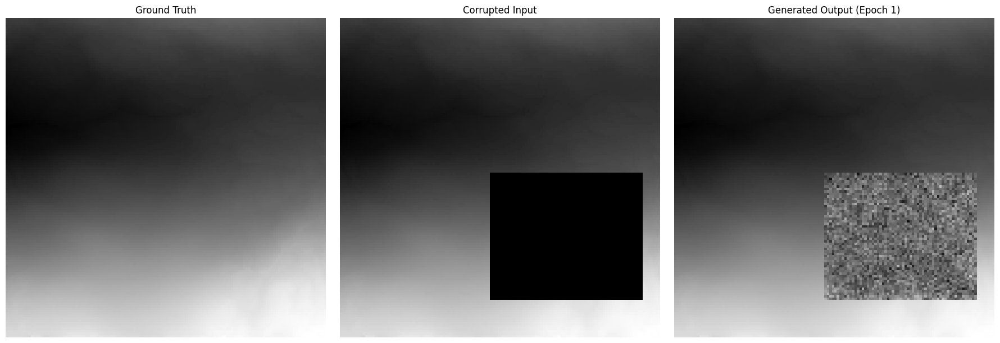

Epoch 2/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 2 with loss: 0.068420


Generating Visual: 0it [00:00, ?it/s]

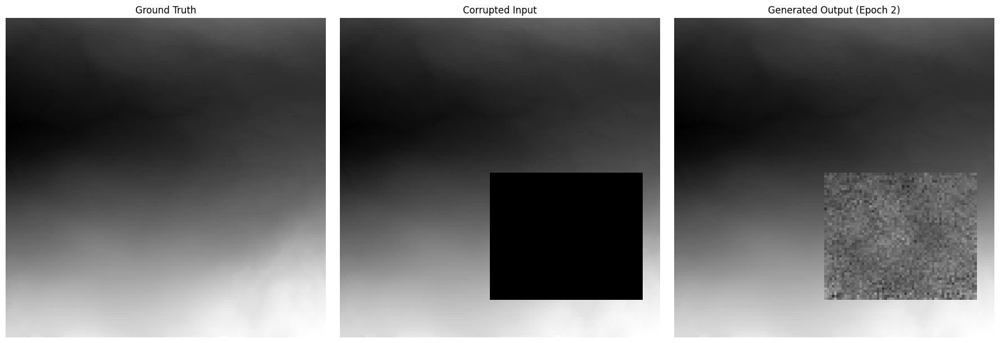

Epoch 3/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 3 with loss: 0.060927


Generating Visual: 0it [00:00, ?it/s]

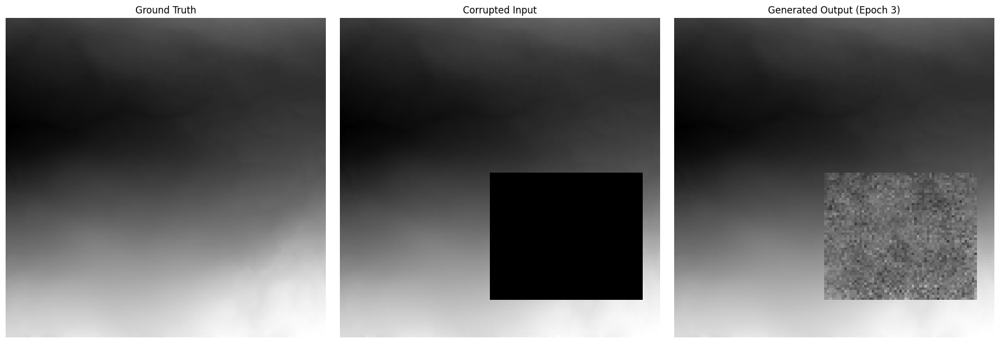

Epoch 4/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 4 with loss: 0.043130


Generating Visual: 0it [00:00, ?it/s]

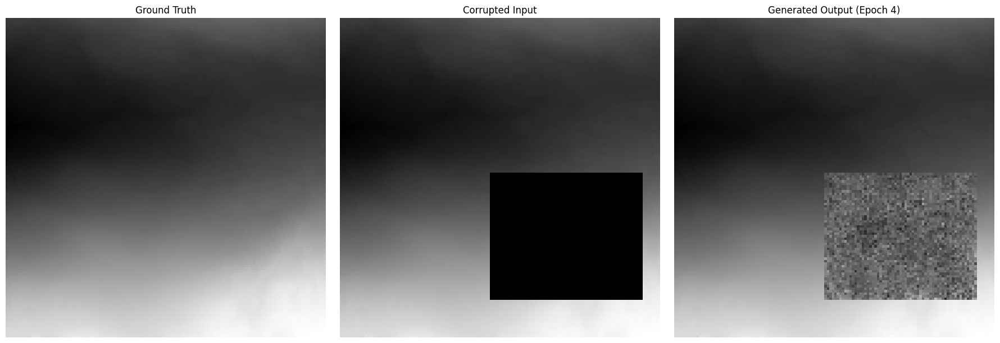

Epoch 5/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 5 with loss: 0.039817


Generating Visual: 0it [00:00, ?it/s]

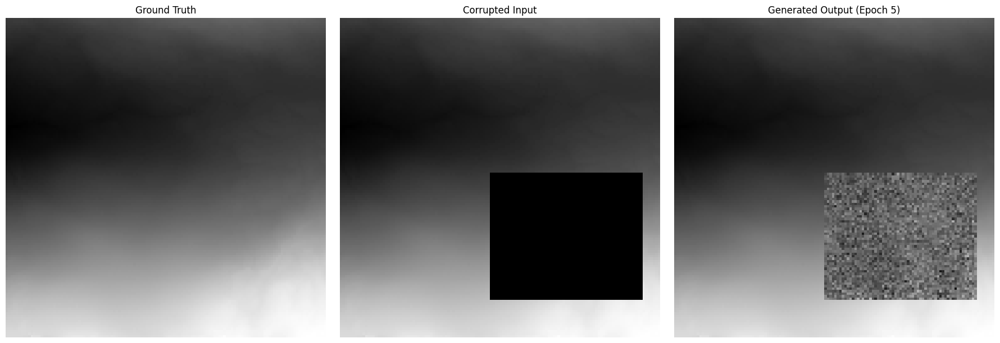

Epoch 6/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 6 with loss: 0.032526


Generating Visual: 0it [00:00, ?it/s]

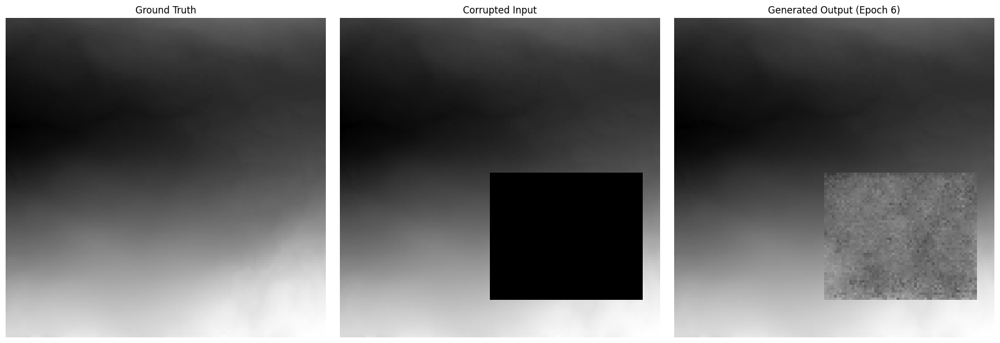

Epoch 7/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

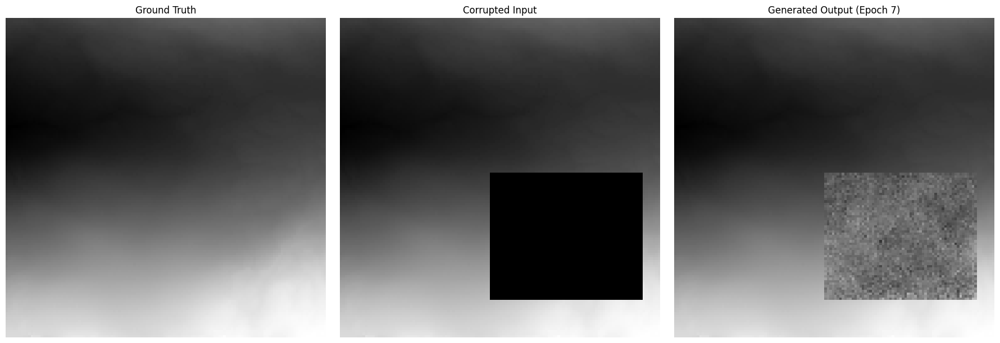

Epoch 8/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

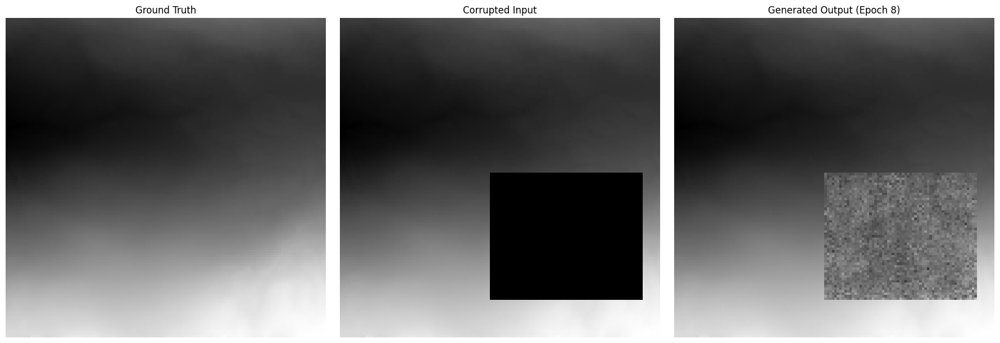

Epoch 9/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 9 with loss: 0.025055


Generating Visual: 0it [00:00, ?it/s]

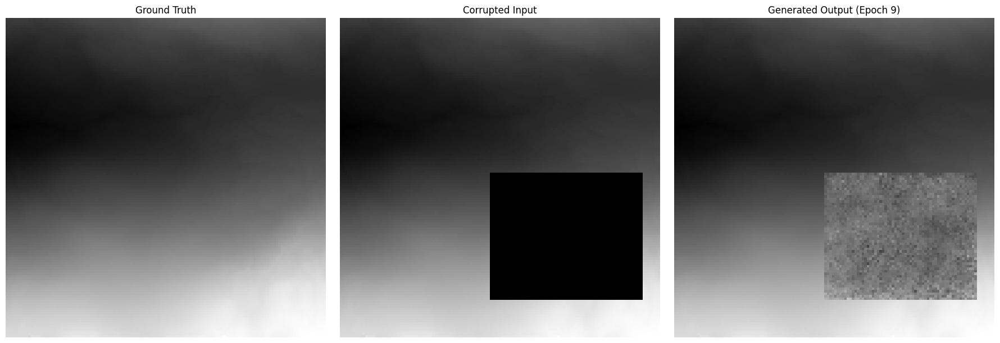

Epoch 10/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

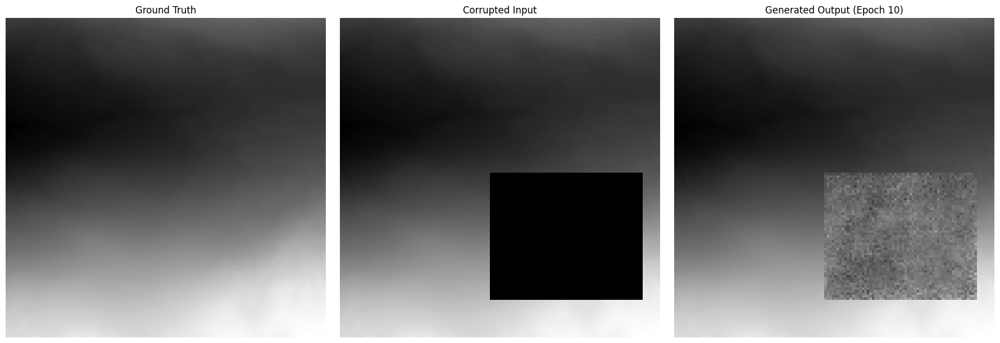

Epoch 11/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

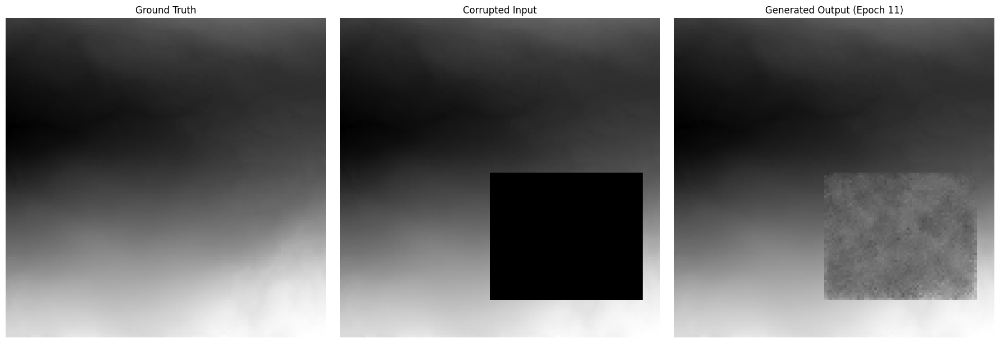

Epoch 12/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 12 with loss: 0.024771


Generating Visual: 0it [00:00, ?it/s]

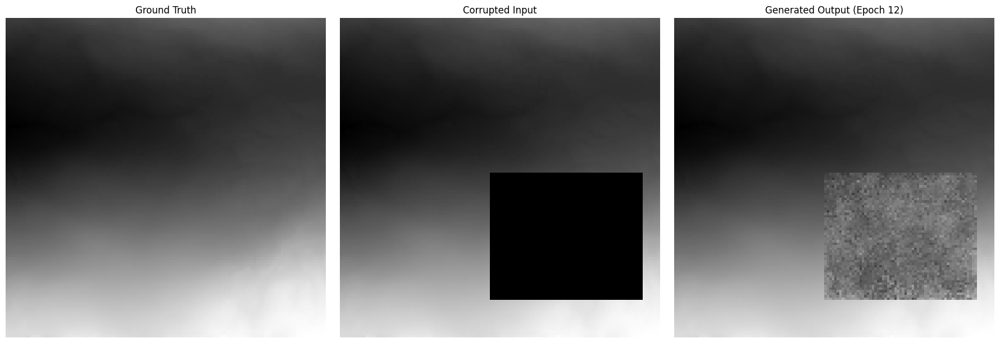

Epoch 13/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

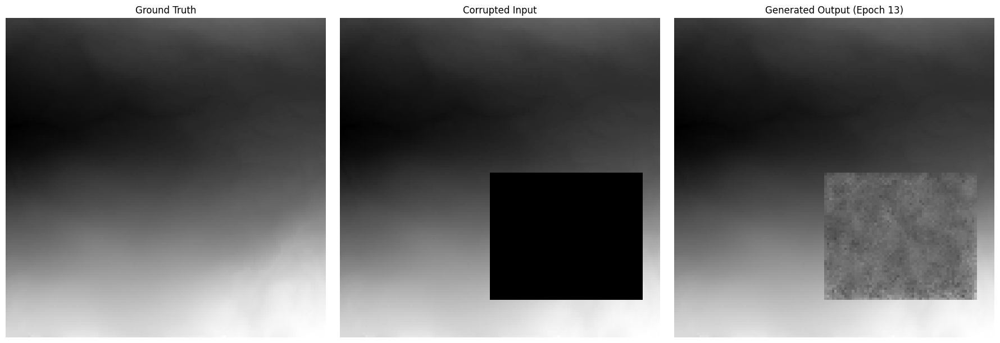

Epoch 14/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 14 with loss: 0.019776


Generating Visual: 0it [00:00, ?it/s]

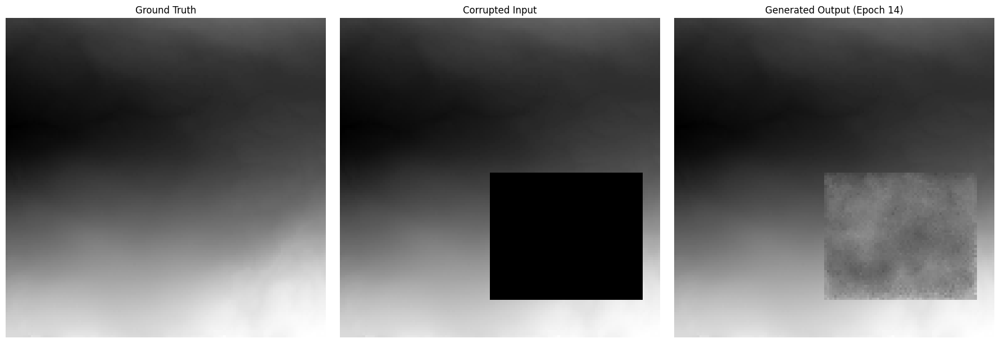

Epoch 15/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

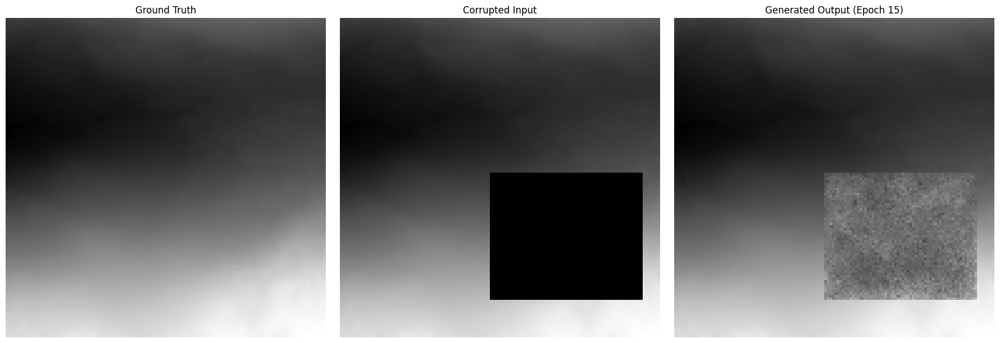

Epoch 16/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

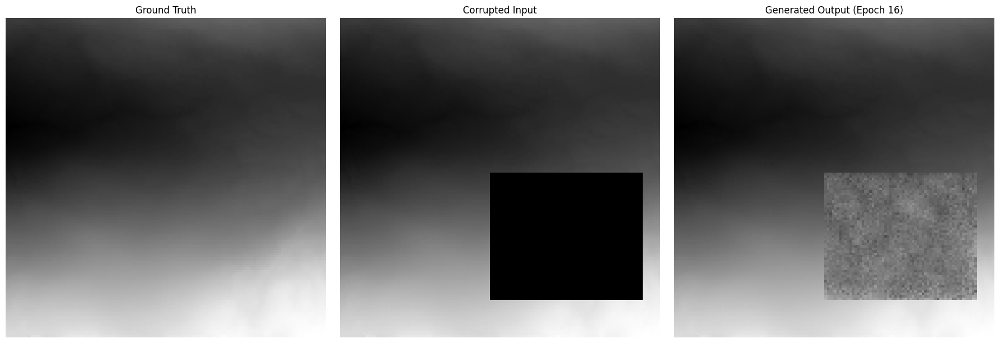

Epoch 17/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

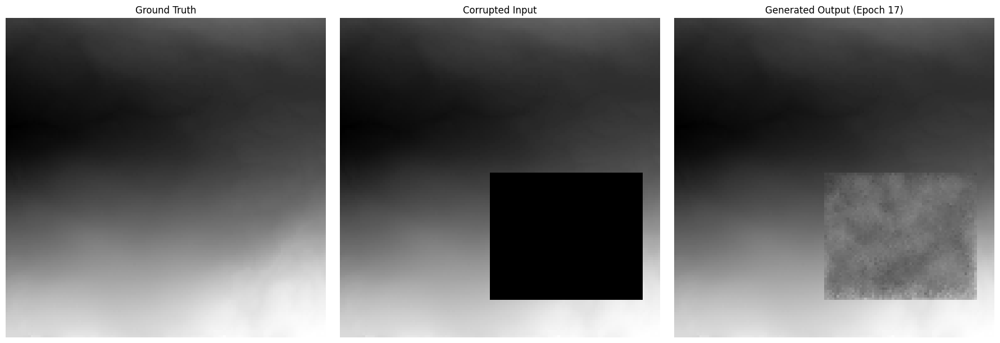

Epoch 18/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

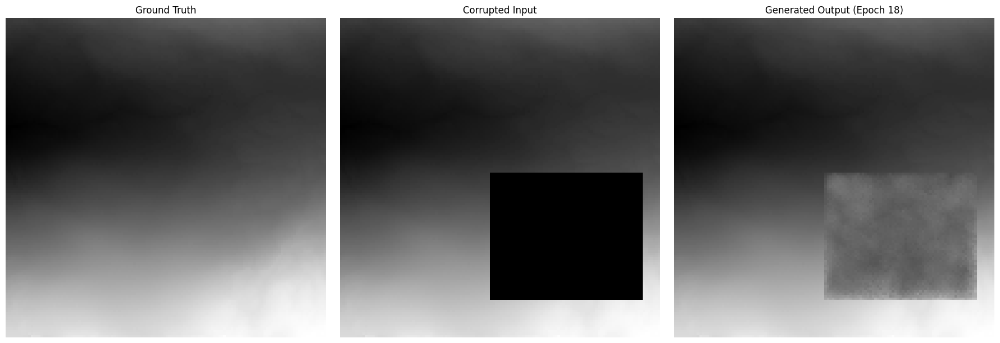

Epoch 19/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

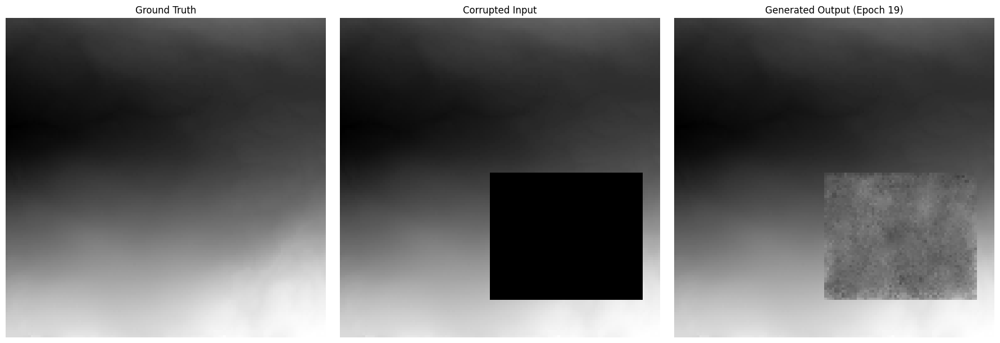

Epoch 20/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

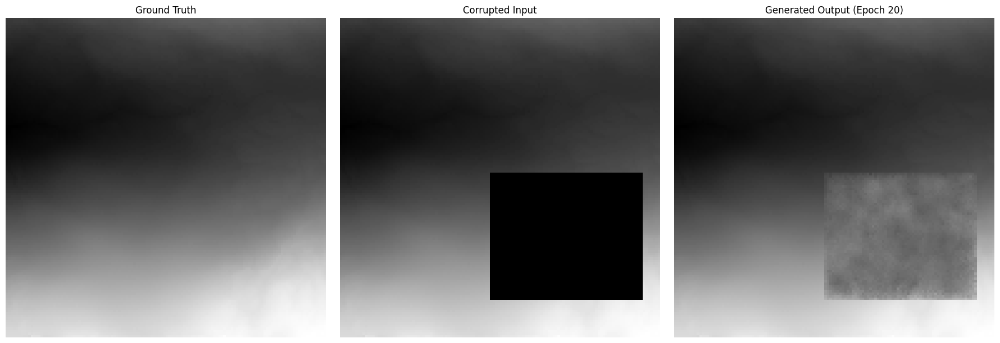

Epoch 21/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

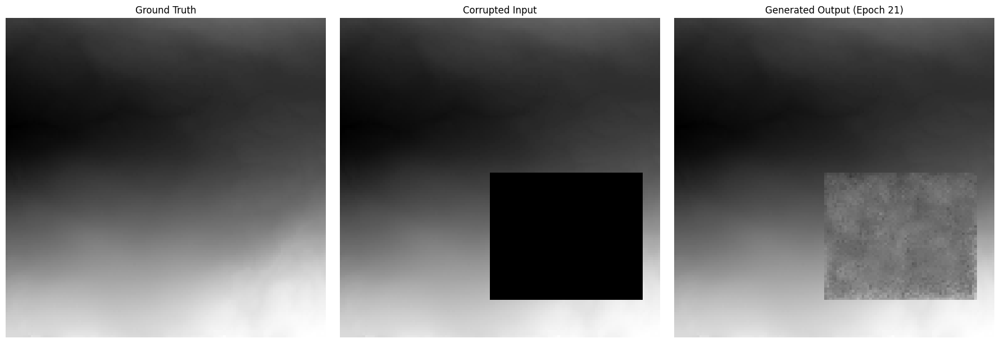

Epoch 22/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 22 with loss: 0.016408


Generating Visual: 0it [00:00, ?it/s]

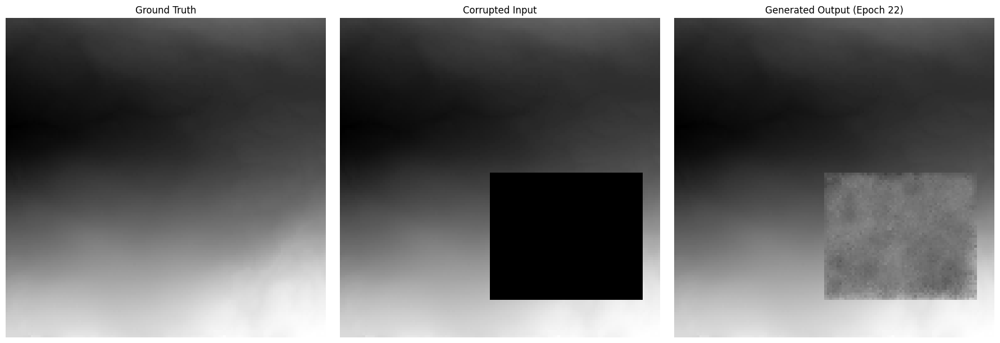

Epoch 23/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

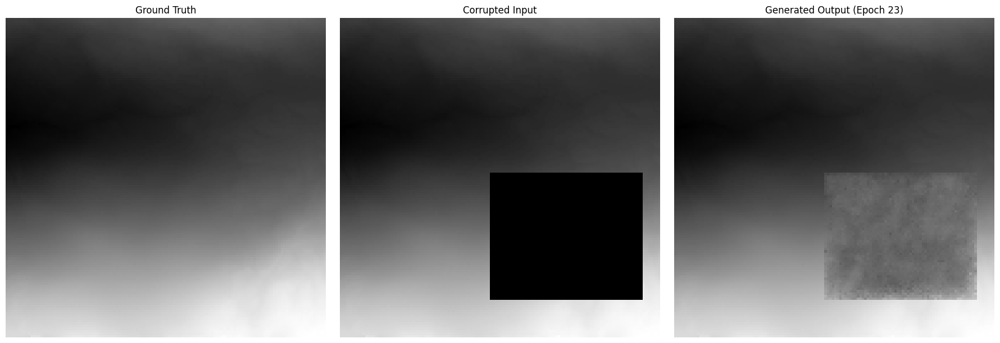

Epoch 24/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

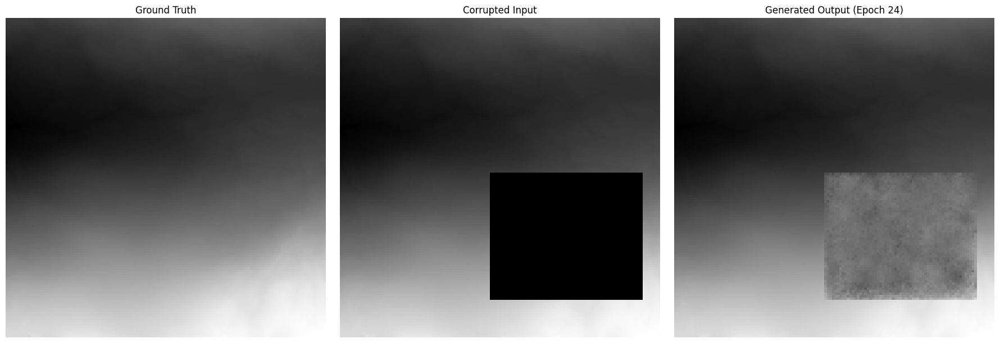

Epoch 25/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

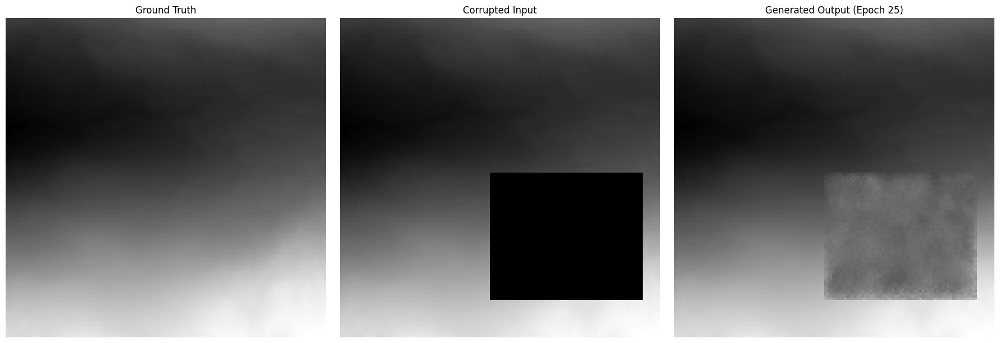

Epoch 26/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 26 with loss: 0.015461


Generating Visual: 0it [00:00, ?it/s]

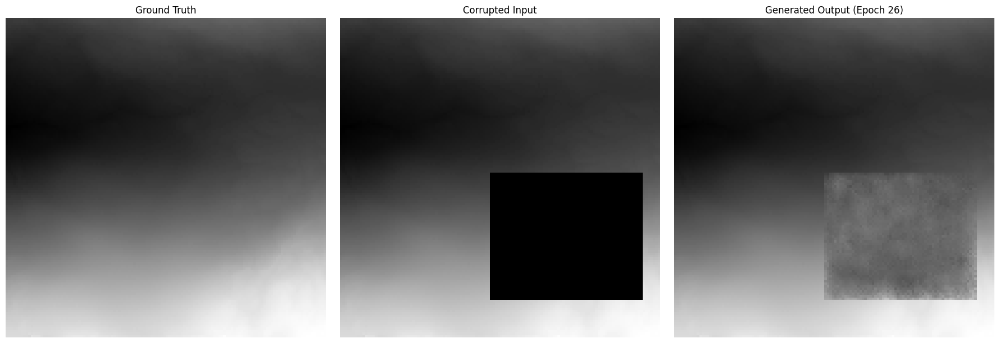

Epoch 27/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

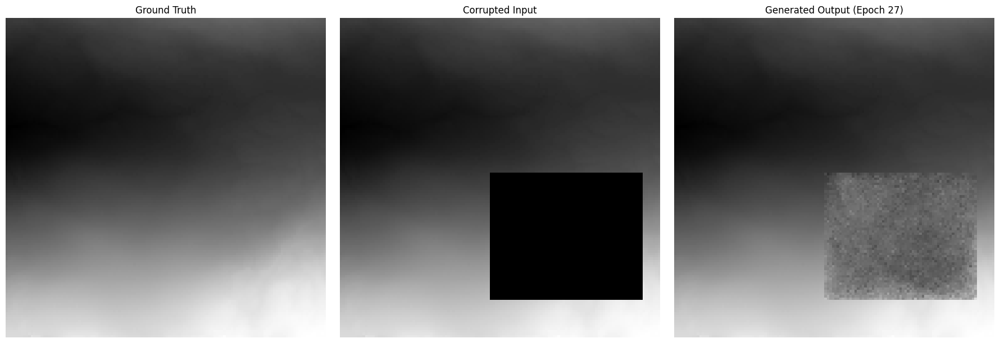

Epoch 28/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

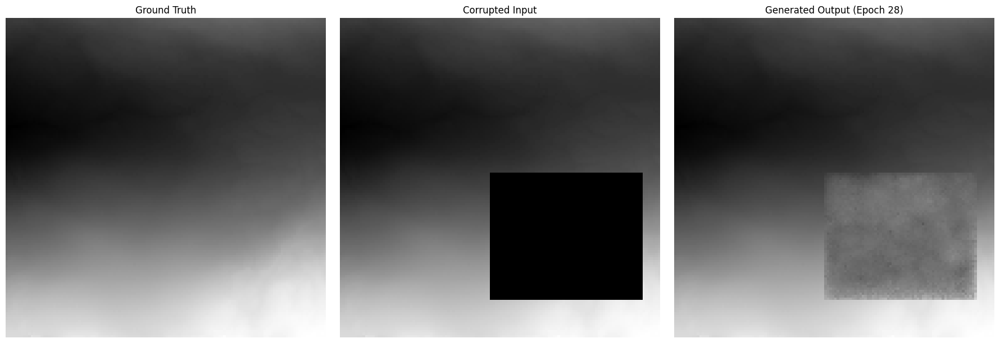

Epoch 29/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

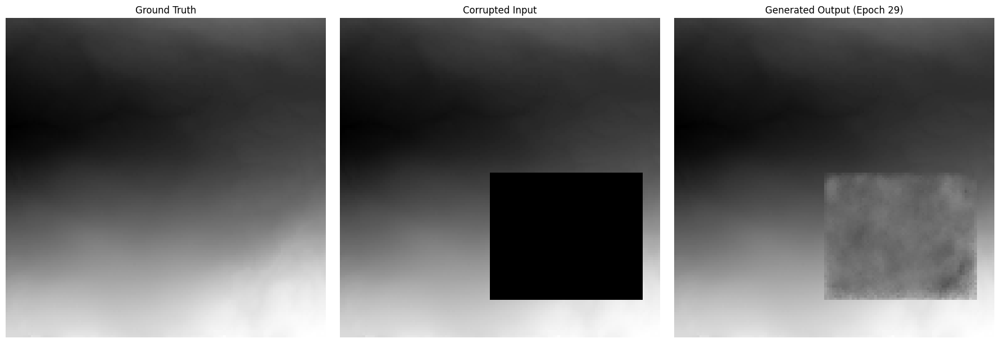

Epoch 30/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 30 with loss: 0.014614


Generating Visual: 0it [00:00, ?it/s]

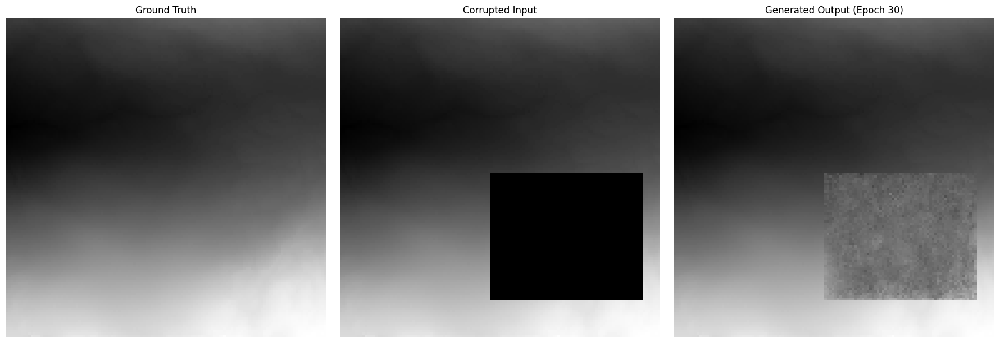

Epoch 31/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

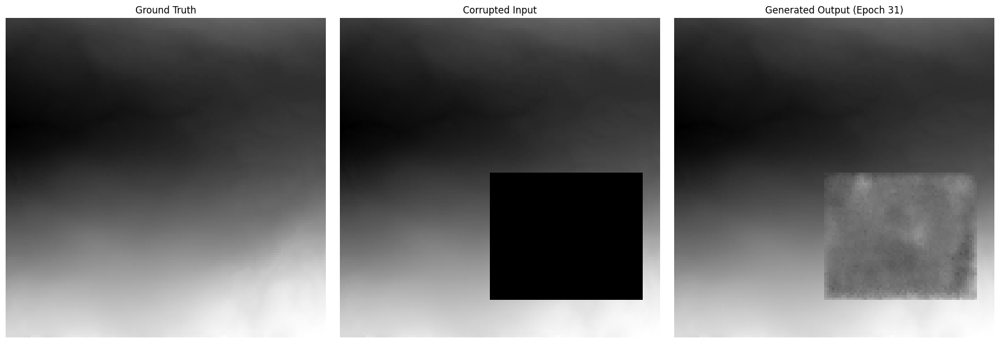

Epoch 32/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

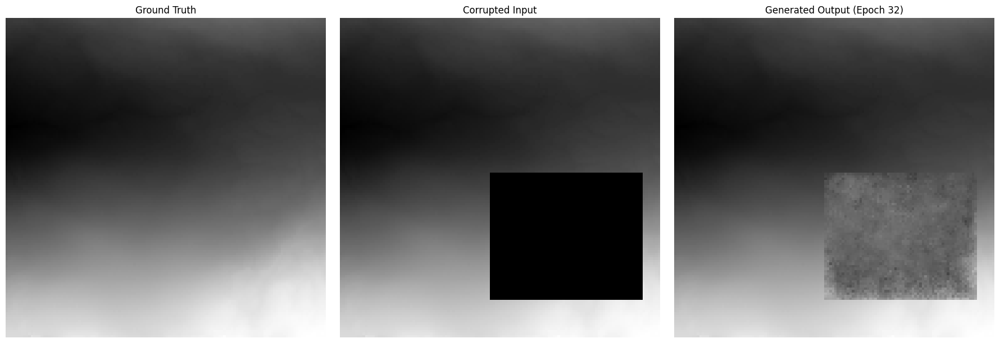

Epoch 33/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

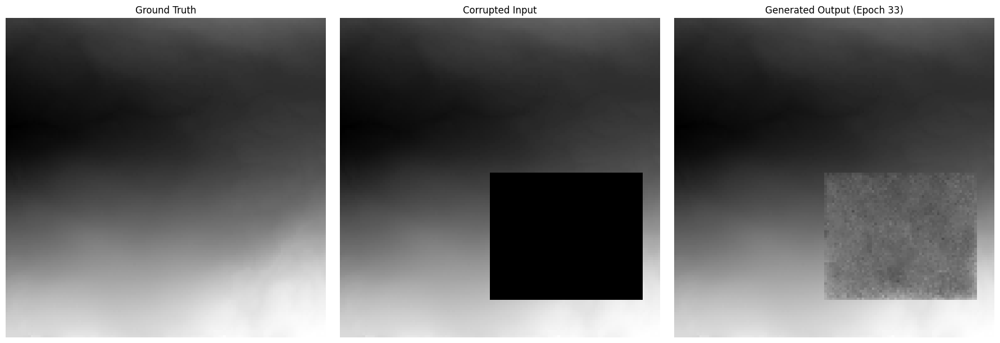

Epoch 34/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

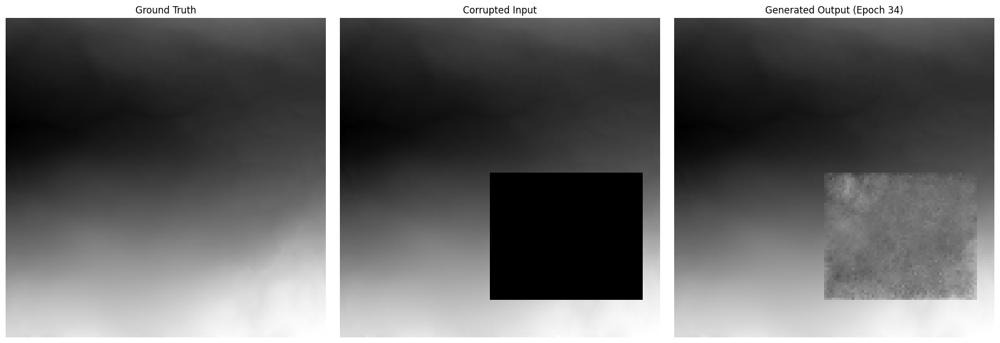

Epoch 35/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

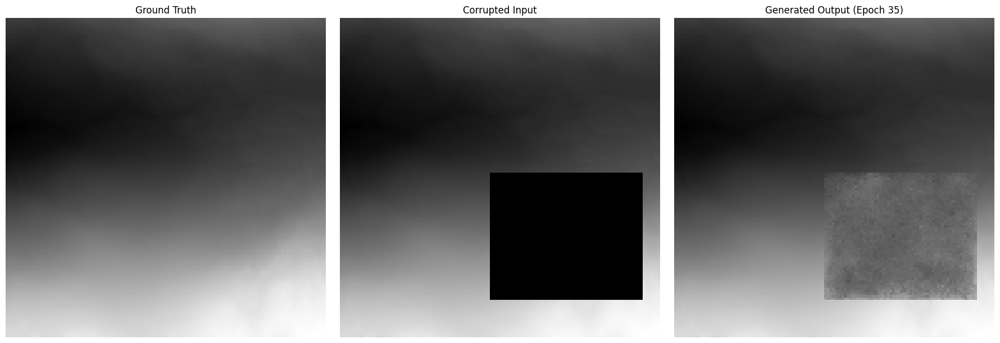

Epoch 36/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

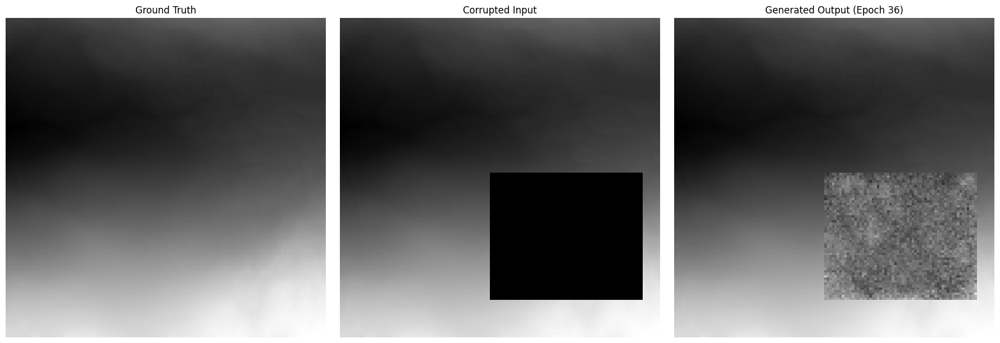

Epoch 37/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

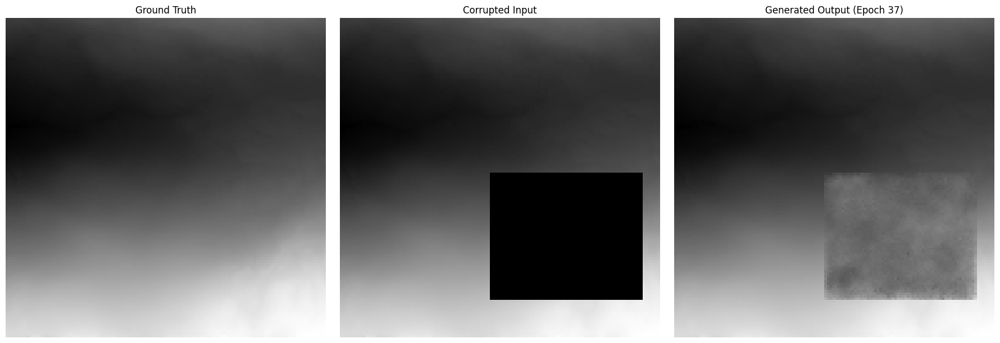

Epoch 38/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

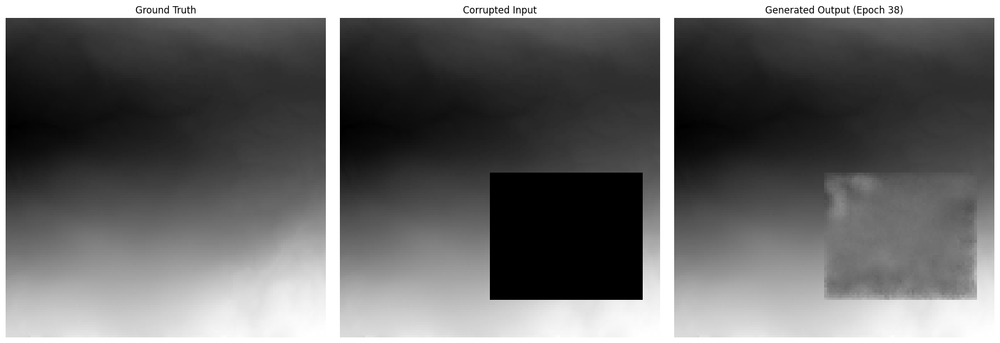

Epoch 39/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

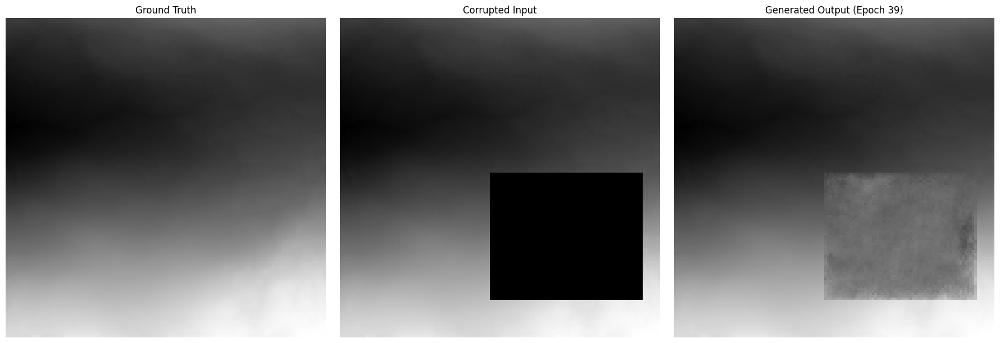

Epoch 40/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

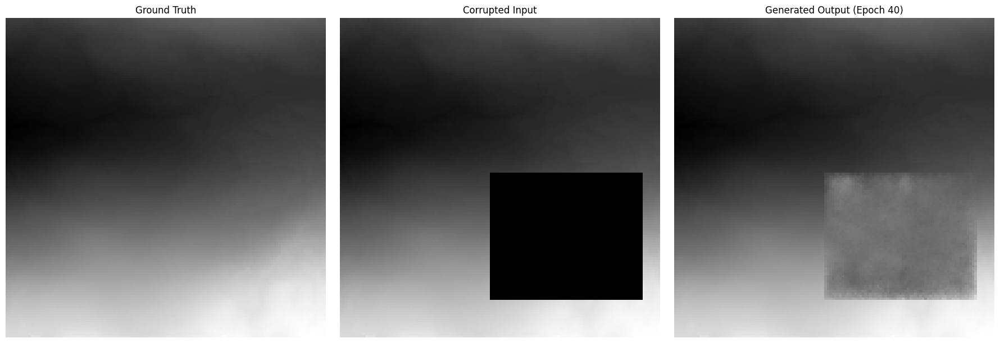

Epoch 41/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

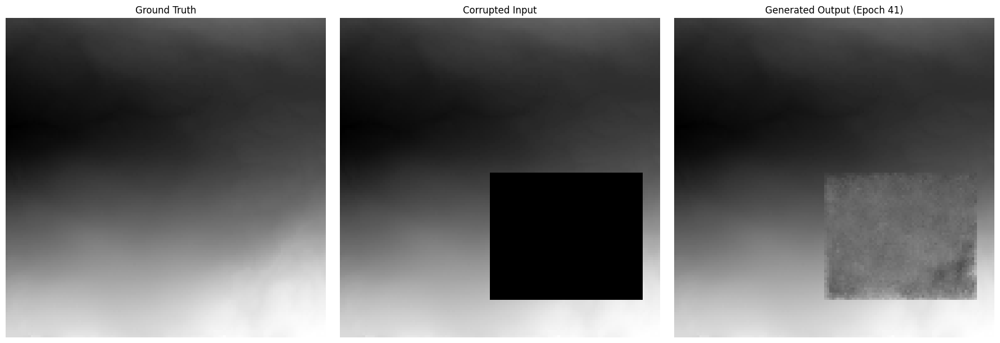

Epoch 42/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 42 with loss: 0.012209


Generating Visual: 0it [00:00, ?it/s]

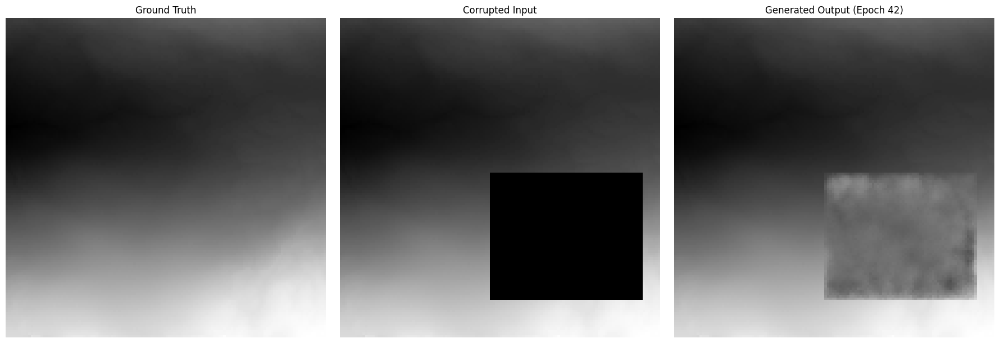

Epoch 43/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

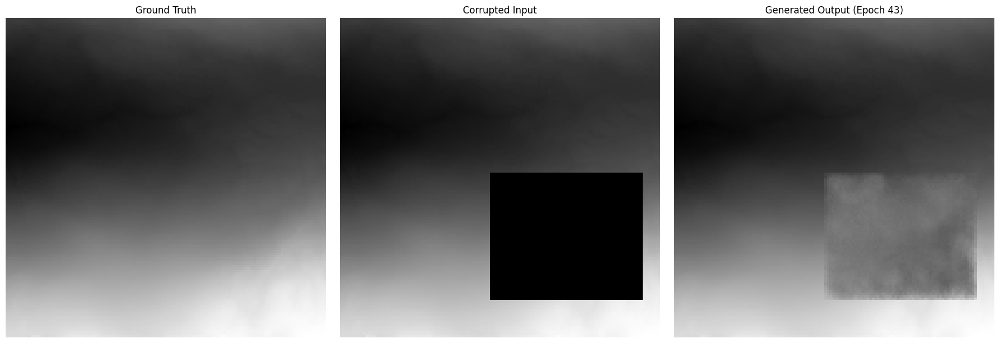

Epoch 44/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

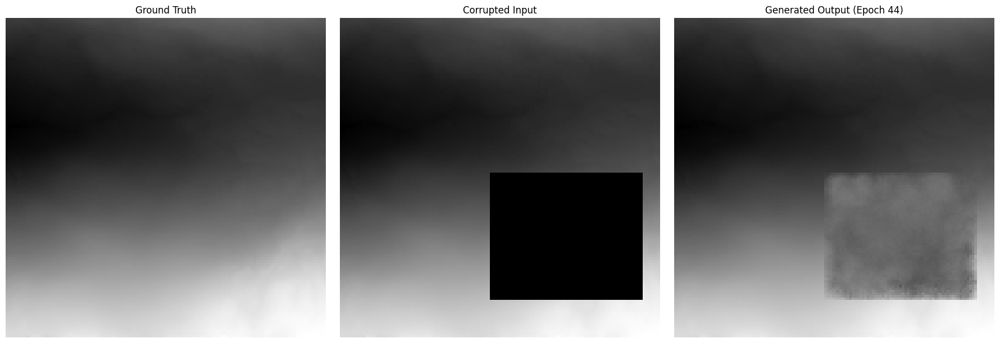

Epoch 45/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

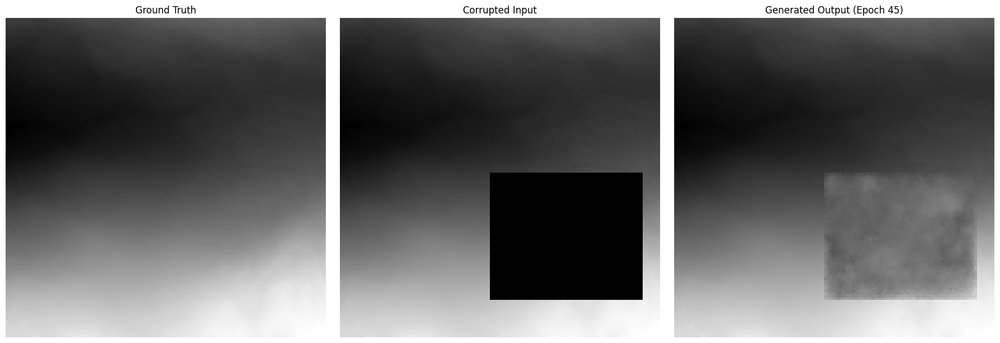

Epoch 46/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

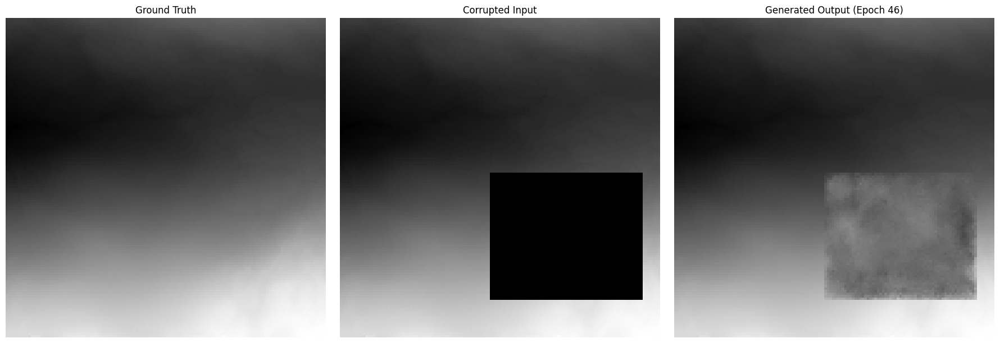

Epoch 47/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

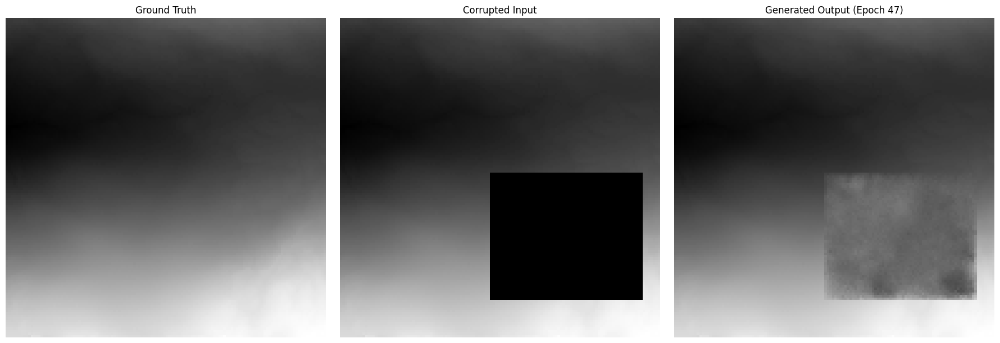

Epoch 48/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

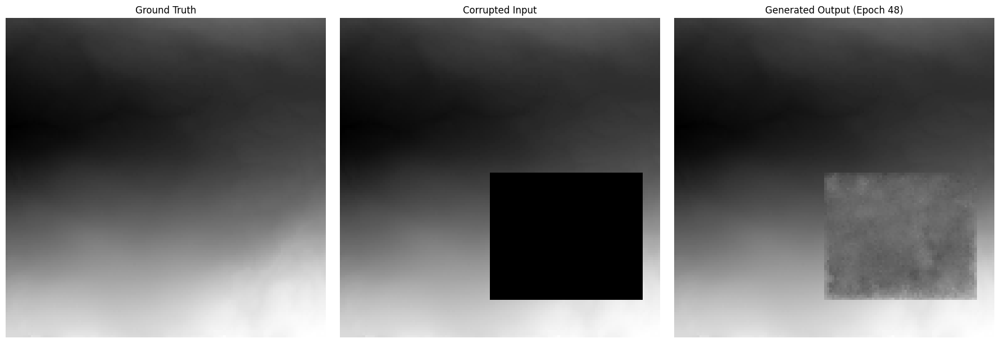

Epoch 49/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

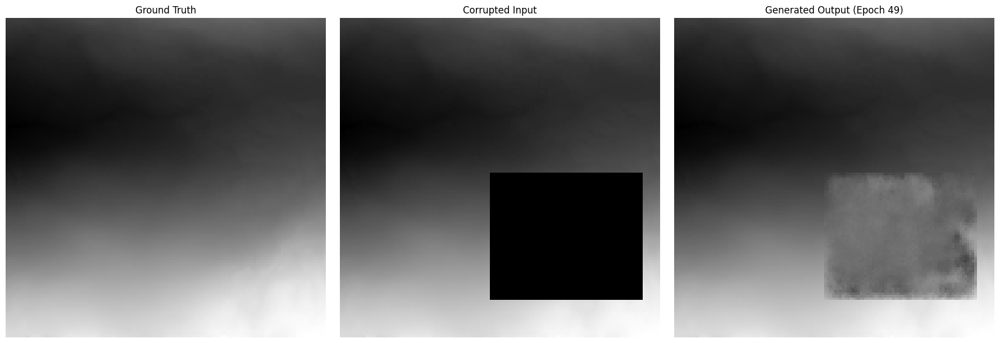

Epoch 50/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

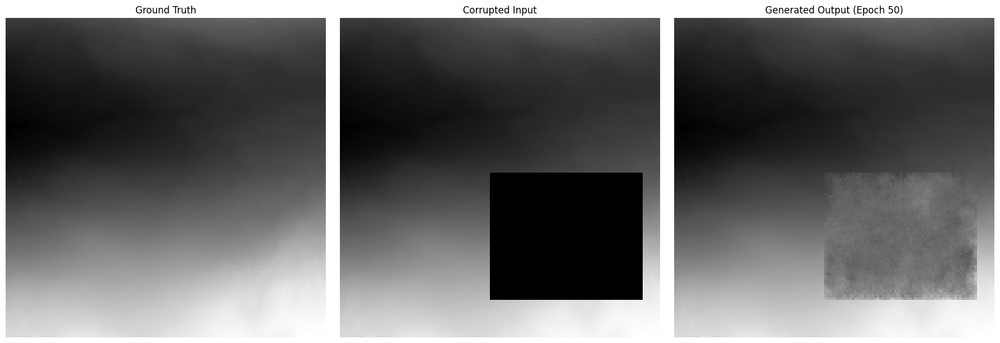

Epoch 51/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

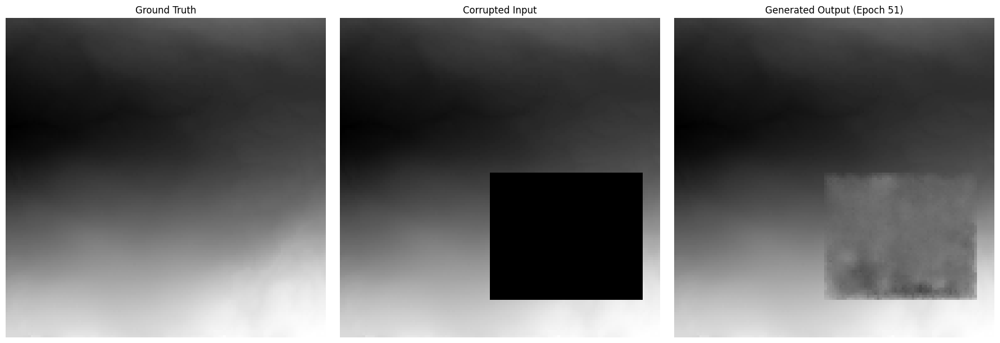

Epoch 52/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 52 with loss: 0.012051


Generating Visual: 0it [00:00, ?it/s]

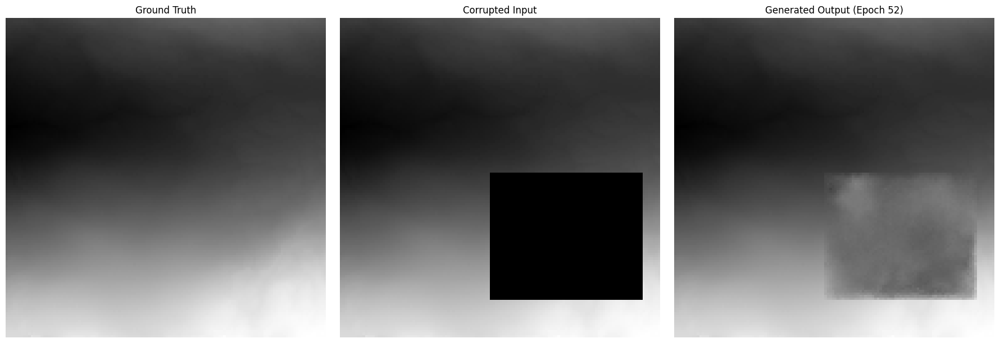

Epoch 53/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

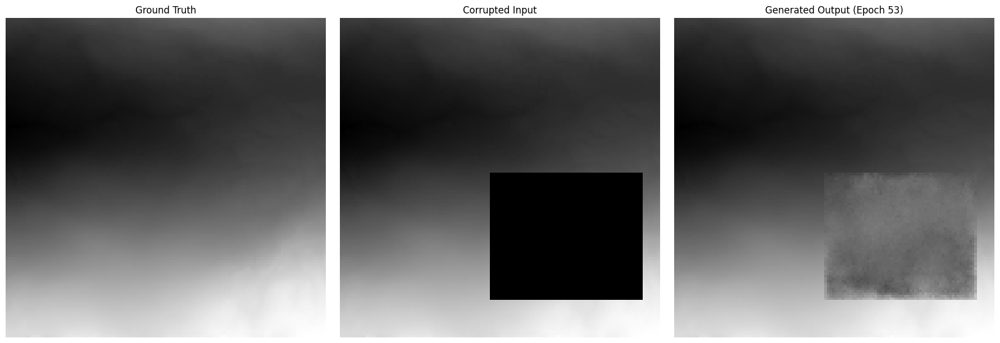

Epoch 54/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

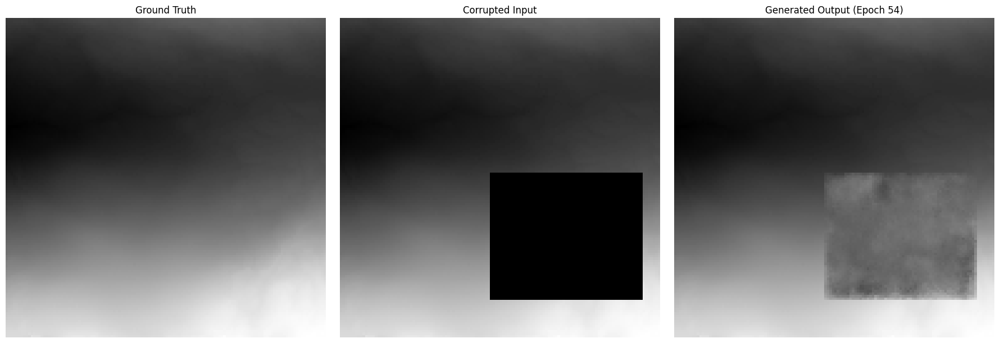

Epoch 55/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

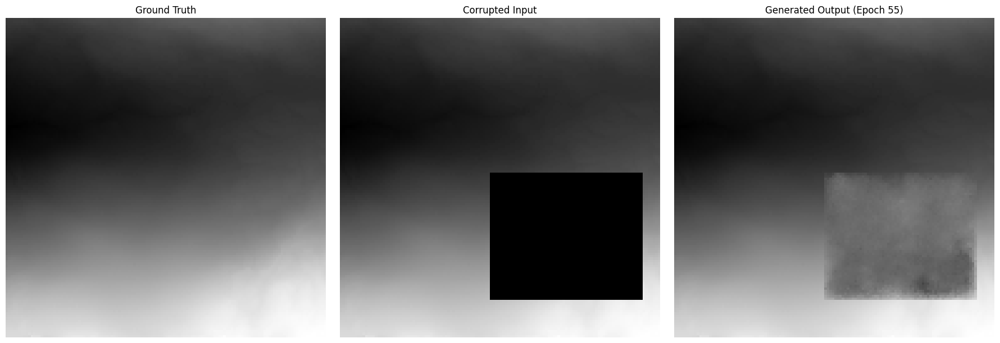

Epoch 56/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

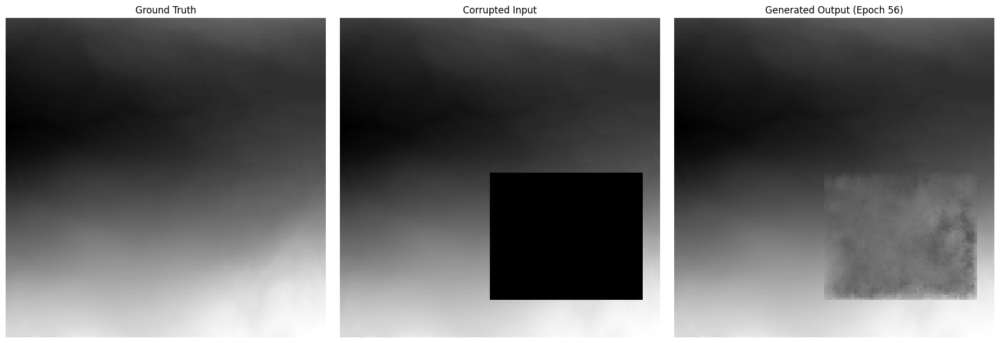

Epoch 57/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 57 with loss: 0.010505


Generating Visual: 0it [00:00, ?it/s]

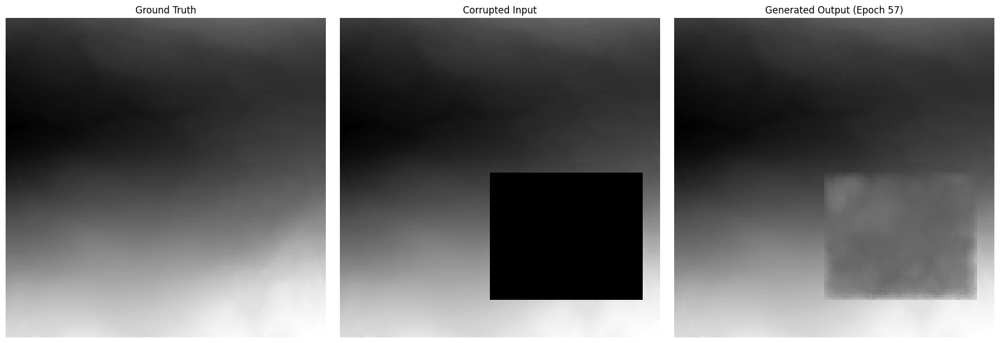

Epoch 58/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

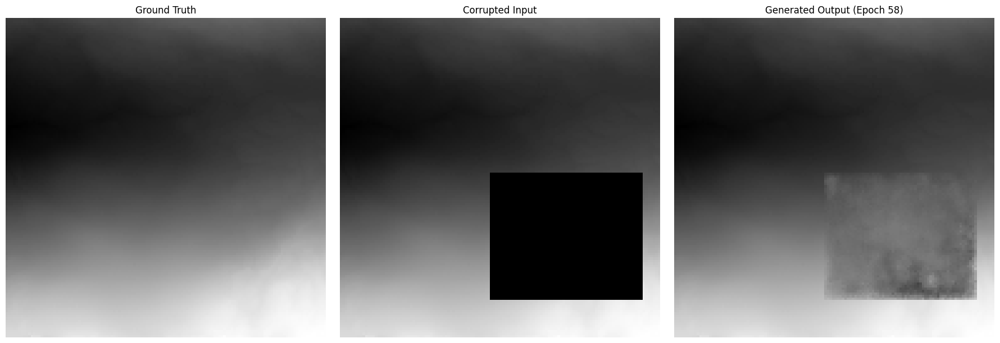

Epoch 59/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

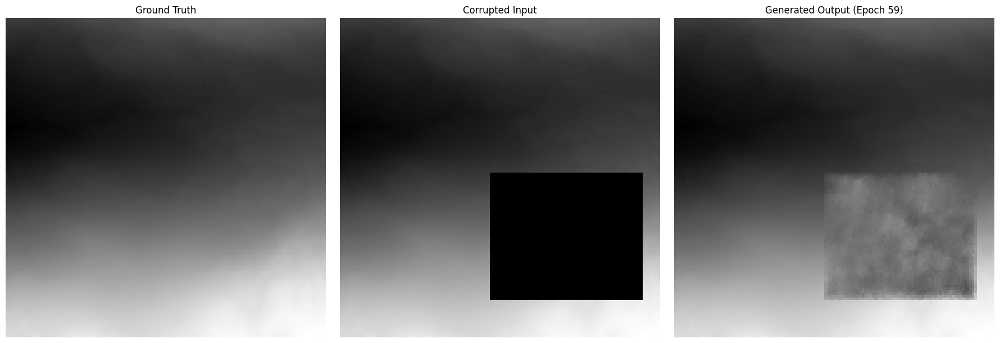

Epoch 60/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

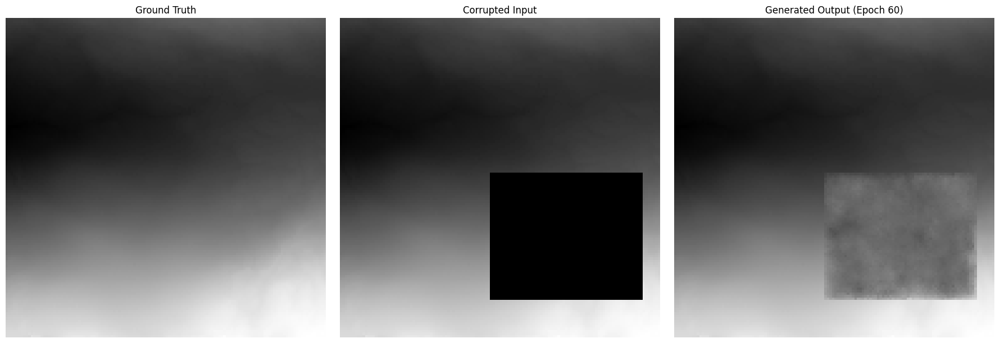

Epoch 61/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

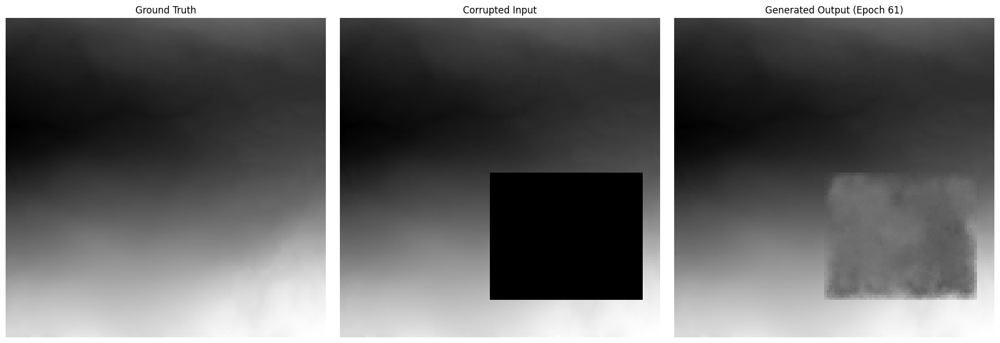

Epoch 62/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

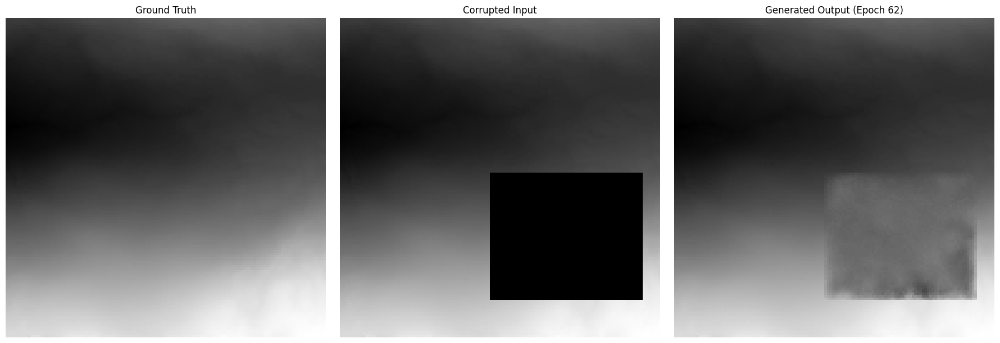

Epoch 63/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

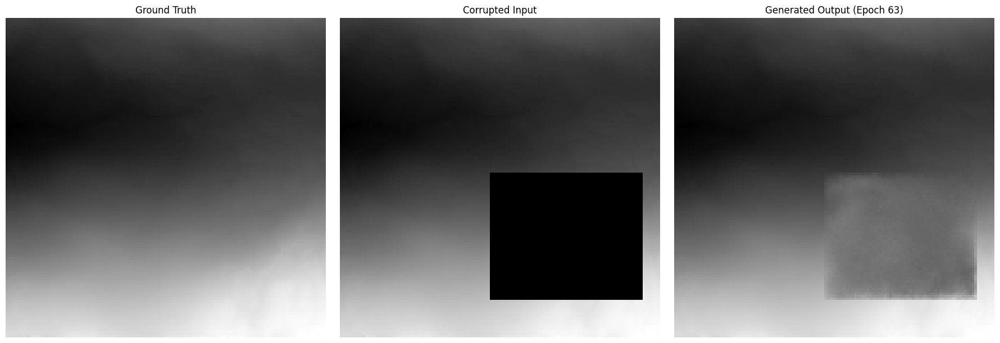

Epoch 64/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

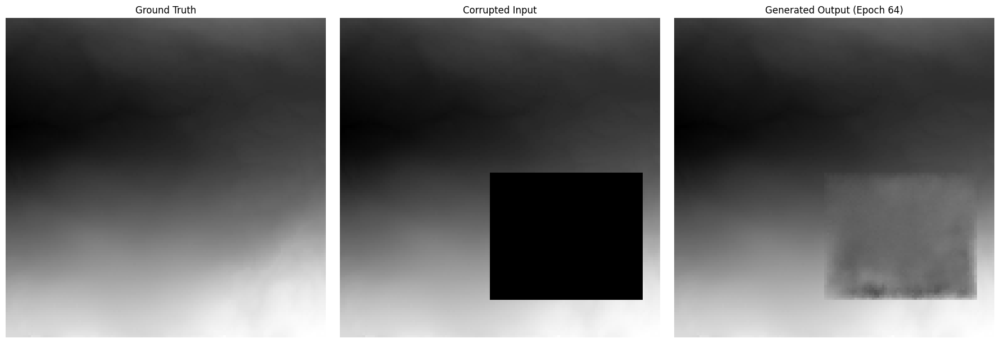

Epoch 65/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

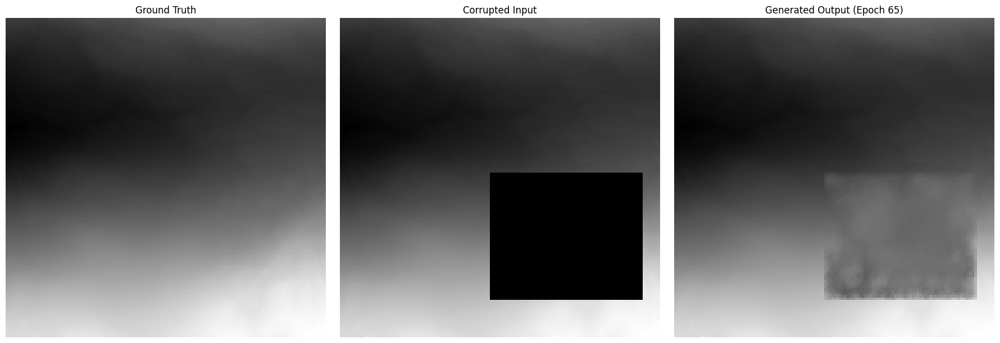

Epoch 66/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

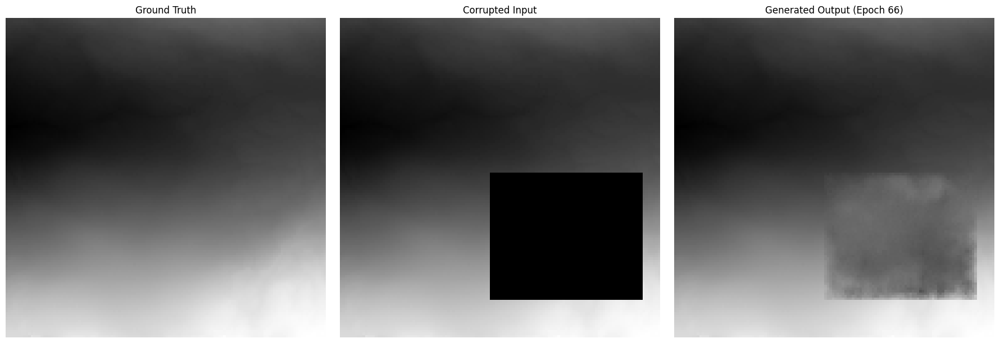

Epoch 67/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

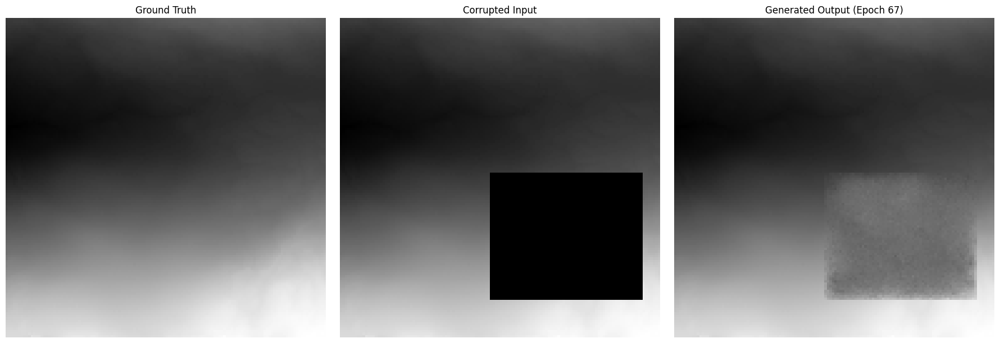

Epoch 68/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

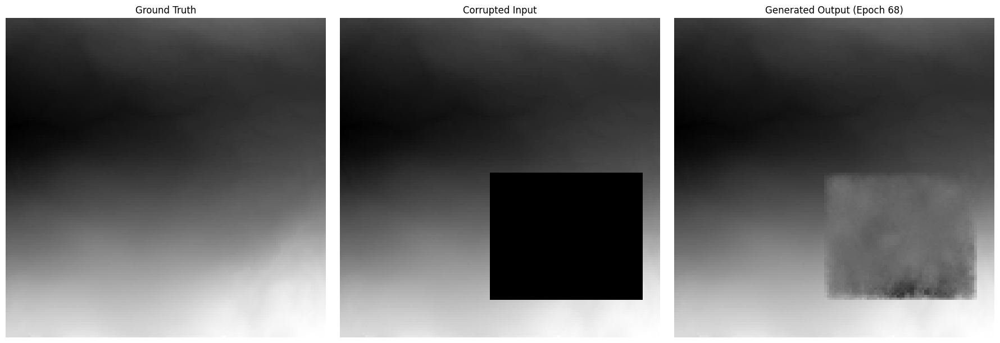

Epoch 69/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

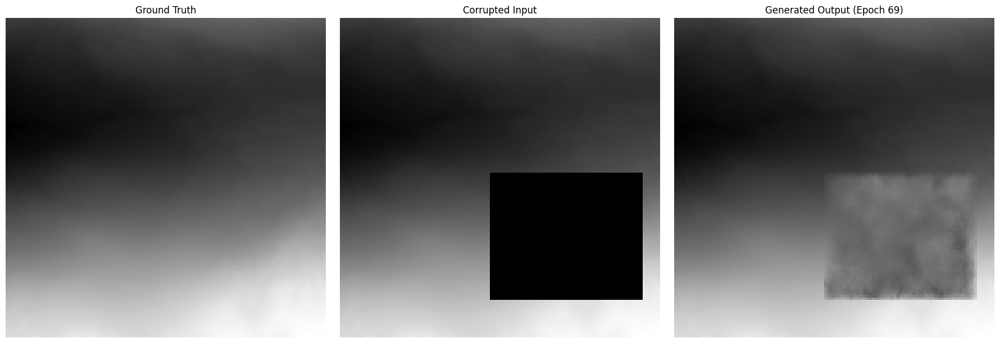

Epoch 70/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

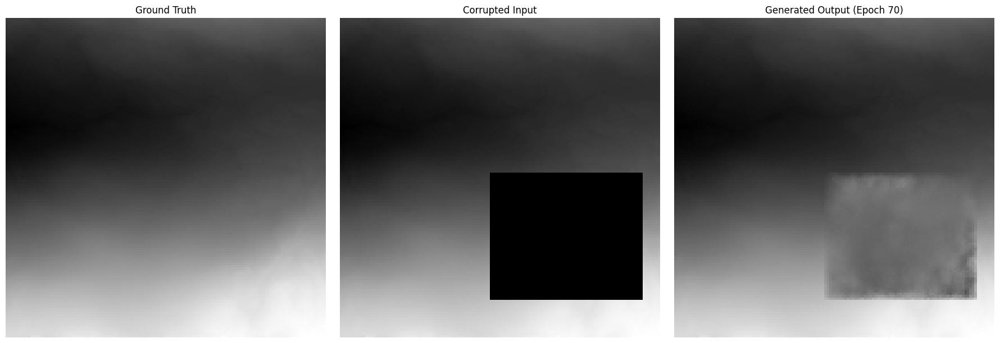

Epoch 71/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

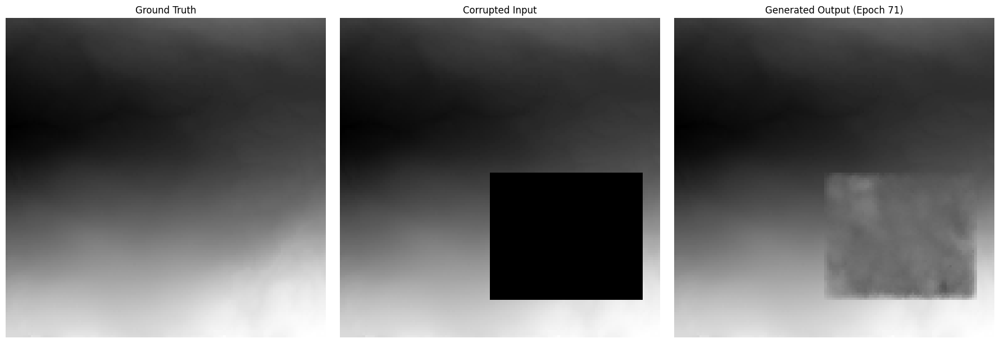

Epoch 72/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

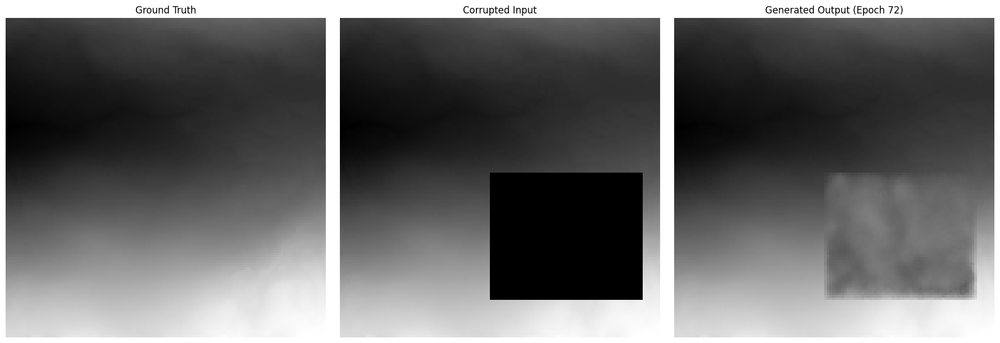

Epoch 73/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

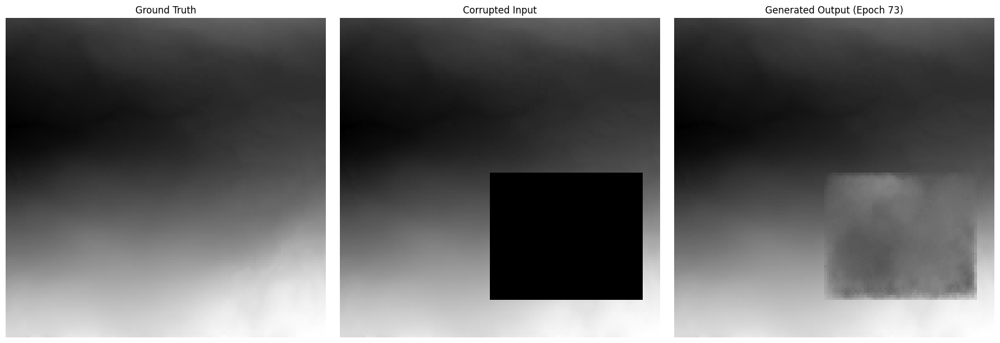

Epoch 74/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

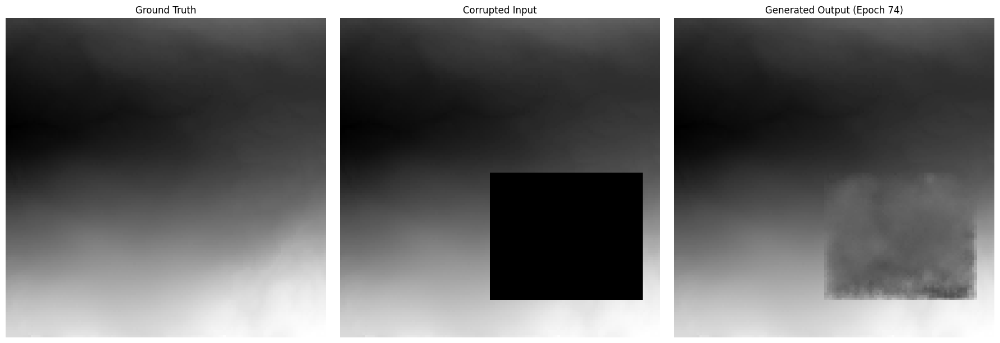

Epoch 75/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

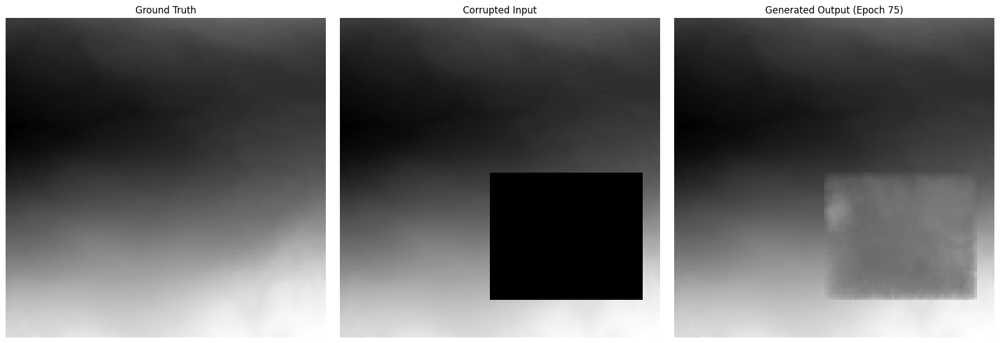

Epoch 76/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

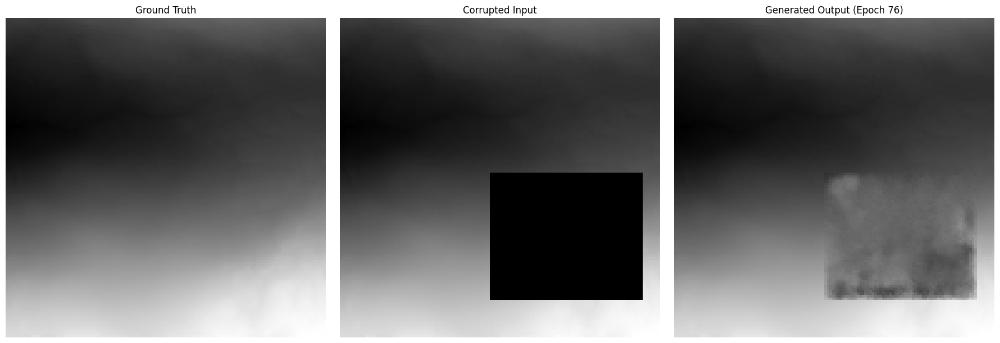

Epoch 77/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

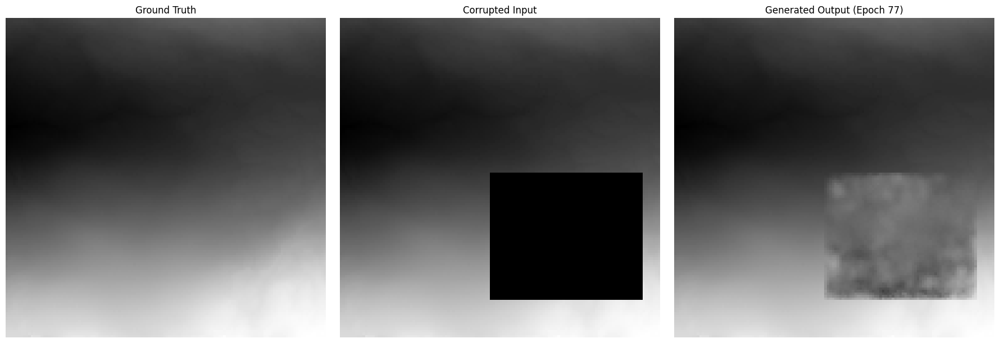

Epoch 78/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

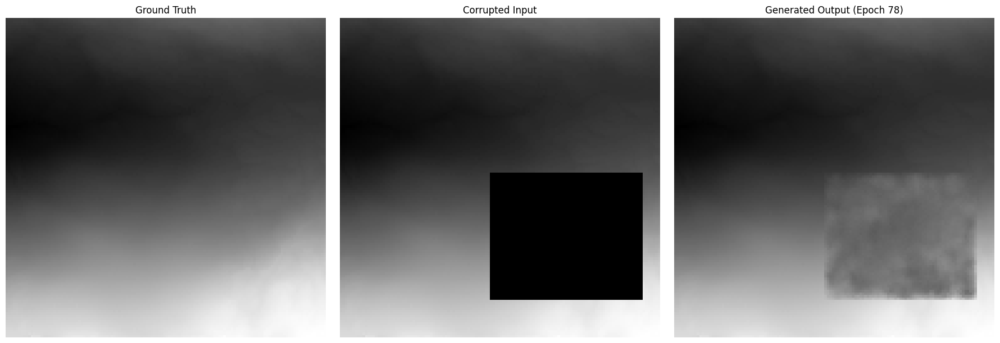

Epoch 79/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

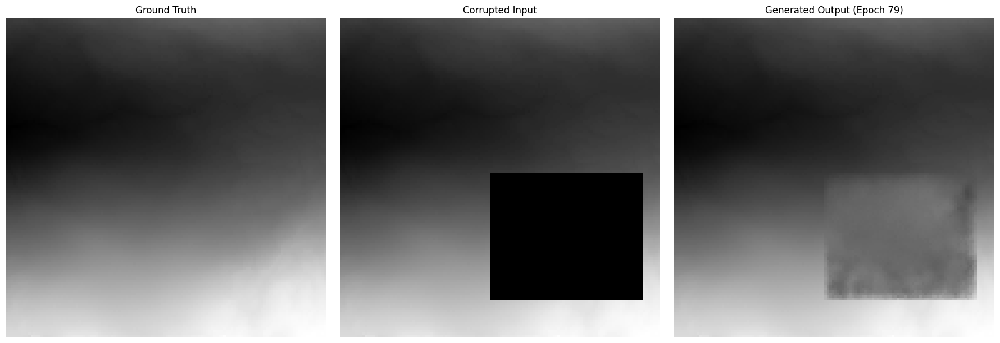

Epoch 80/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

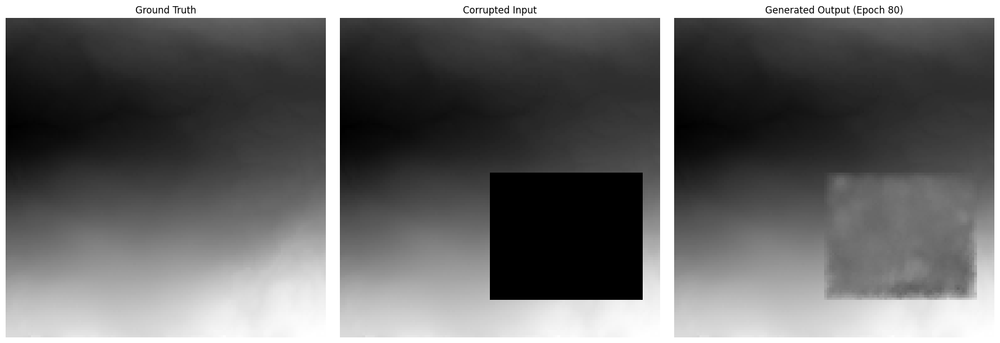

Epoch 81/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

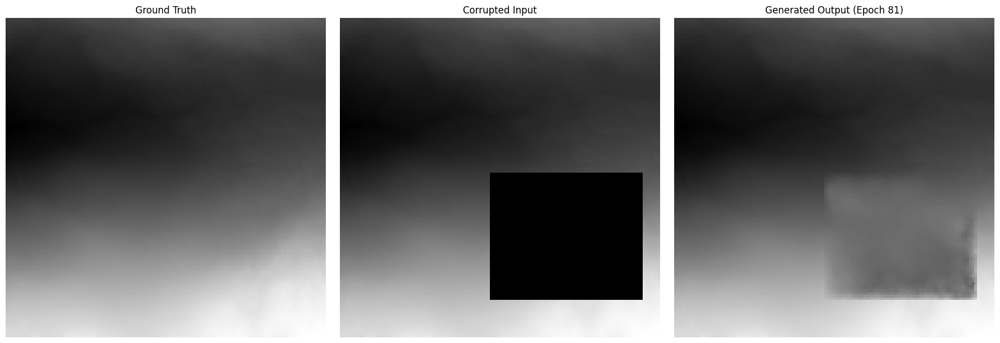

Epoch 82/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

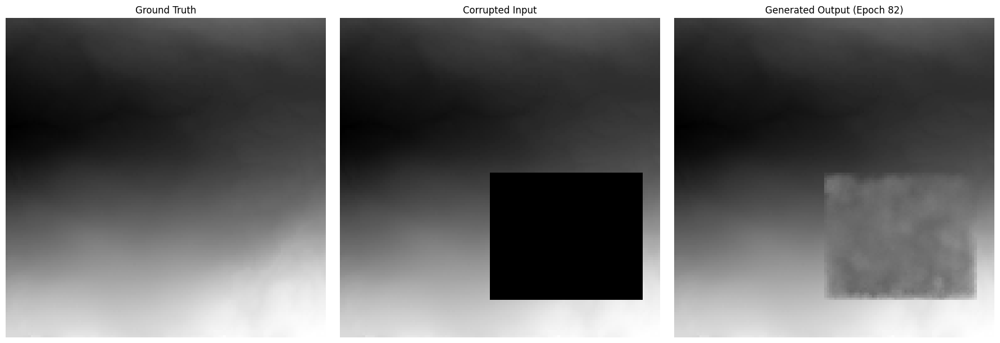

Epoch 83/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

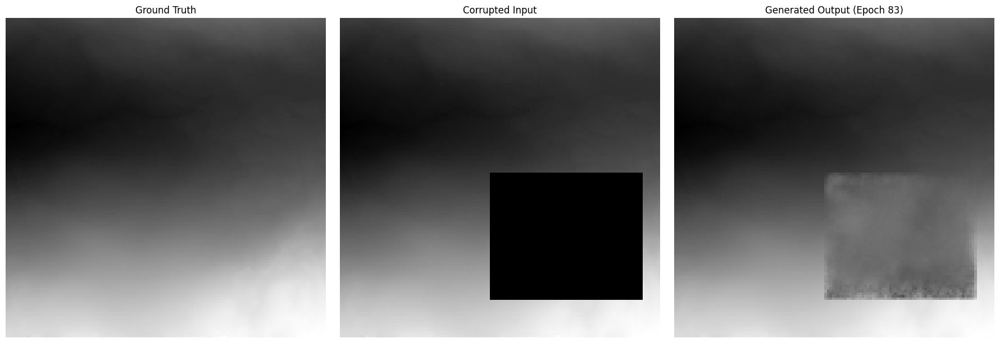

Epoch 84/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

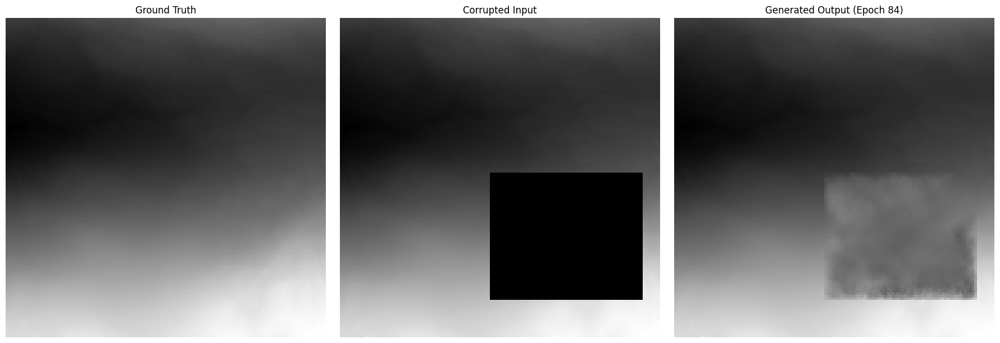

Epoch 85/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 85 with loss: 0.009782


Generating Visual: 0it [00:00, ?it/s]

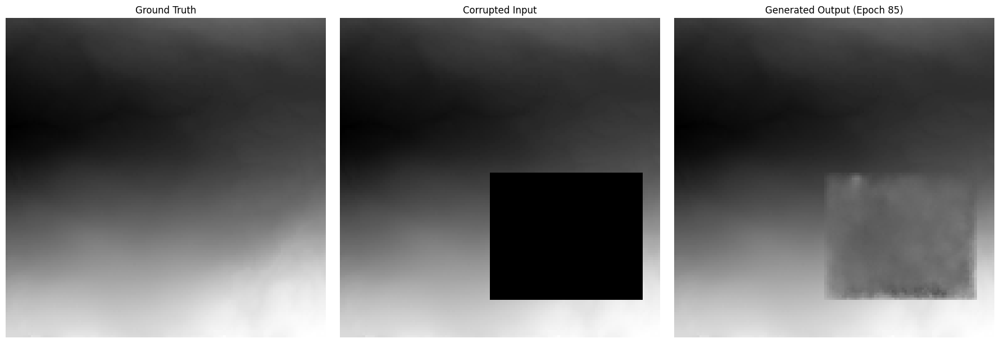

Epoch 86/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

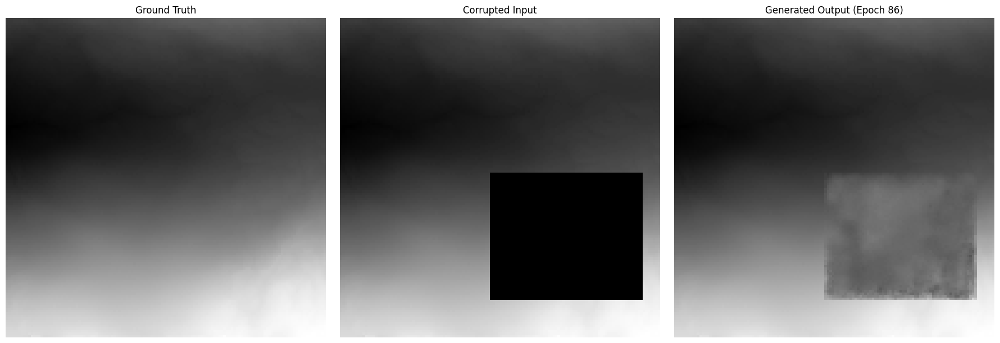

Epoch 87/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

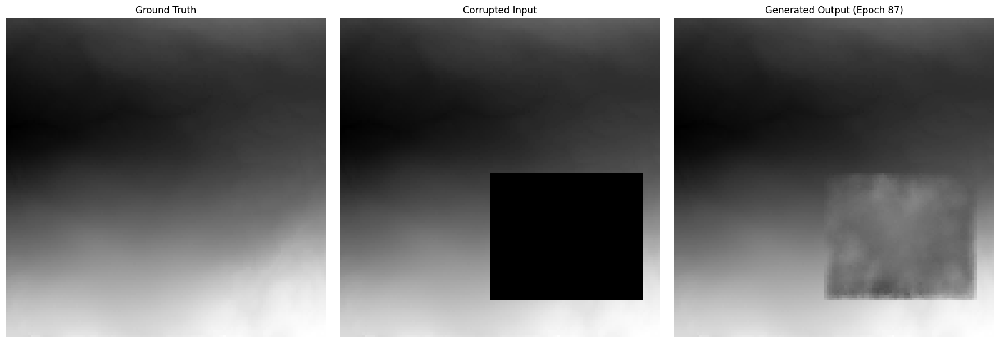

Epoch 88/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

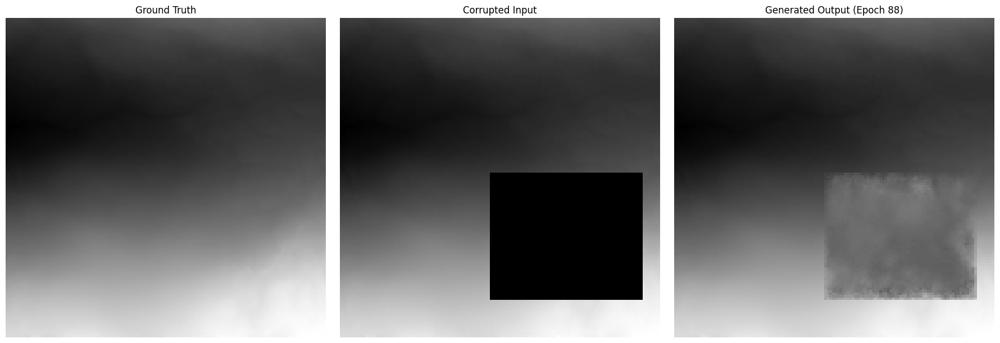

Epoch 89/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

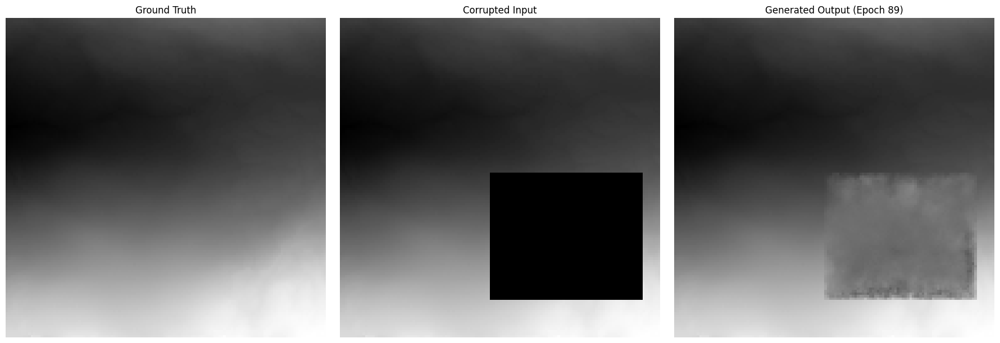

Epoch 90/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

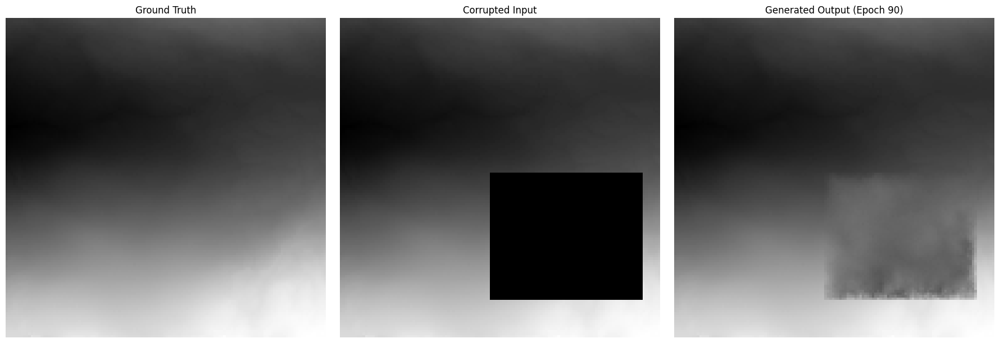

Epoch 91/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

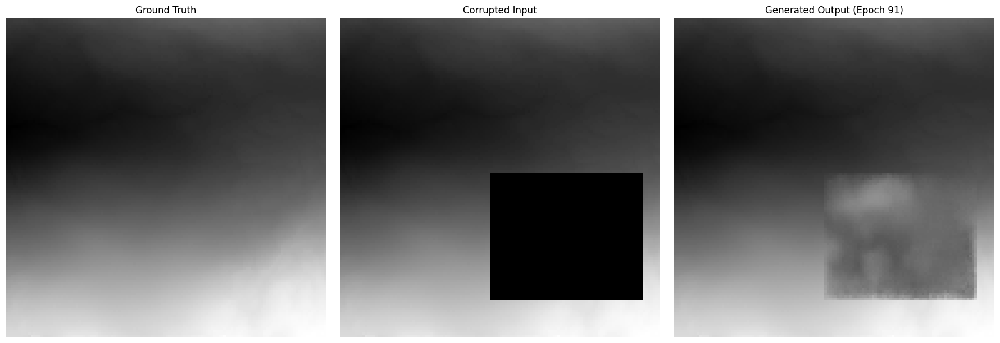

Epoch 92/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

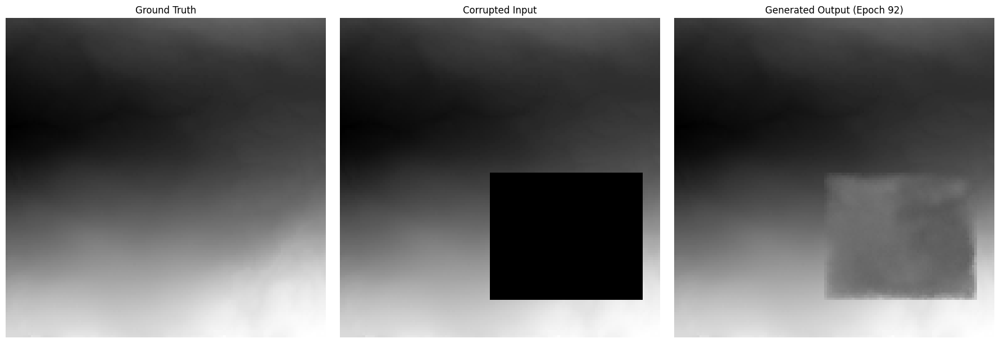

Epoch 93/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

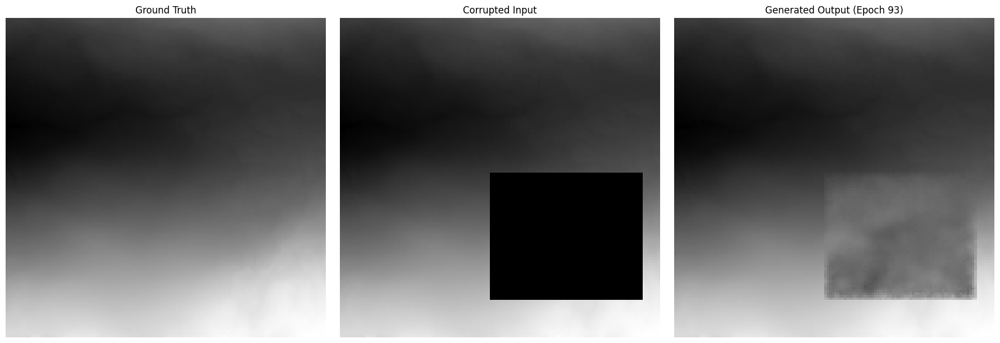

Epoch 94/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

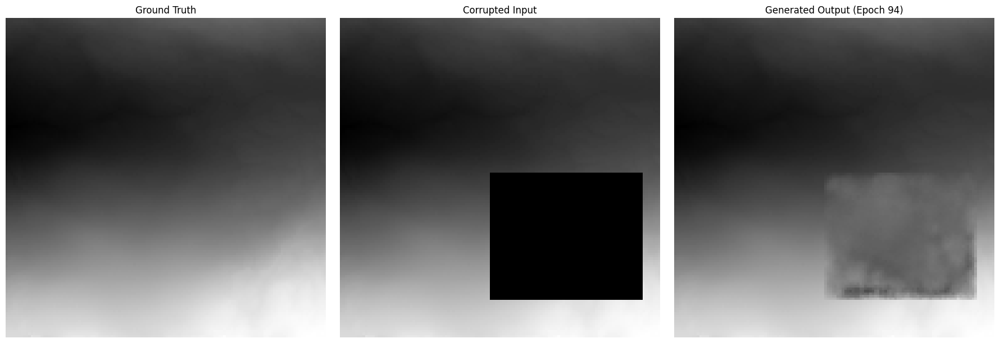

Epoch 95/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

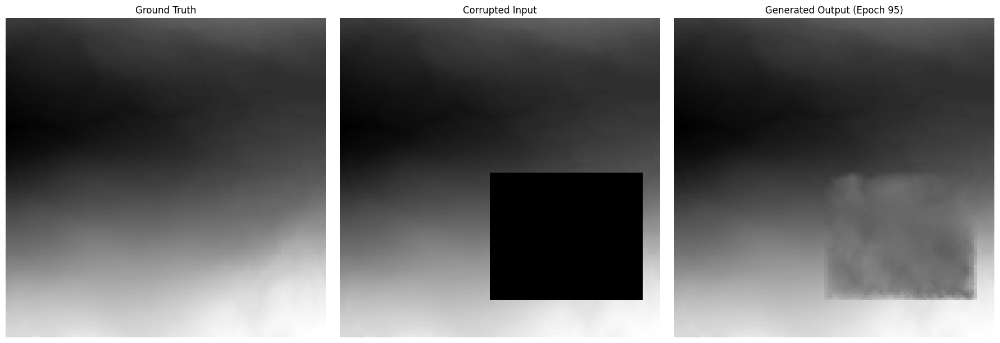

Epoch 96/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

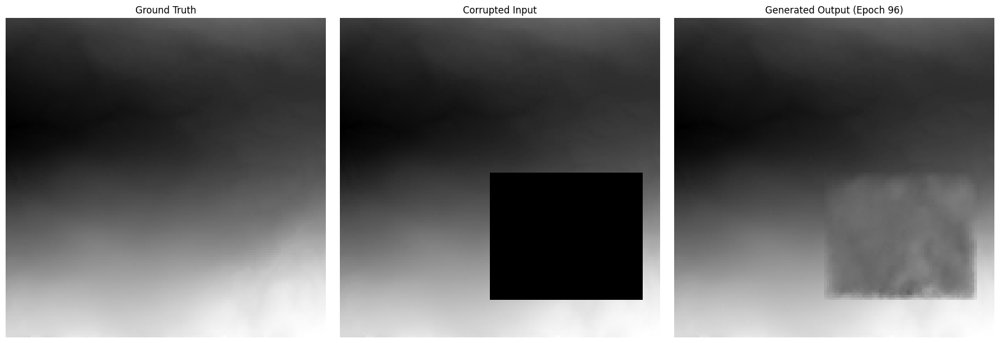

Epoch 97/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 97 with loss: 0.008832


Generating Visual: 0it [00:00, ?it/s]

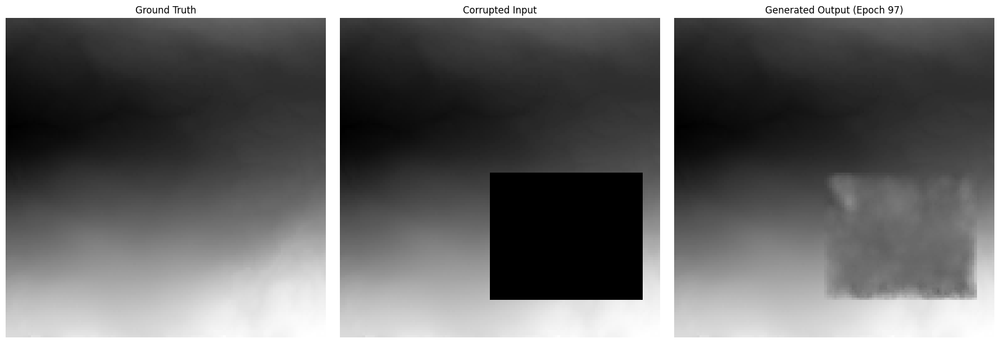

Epoch 98/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

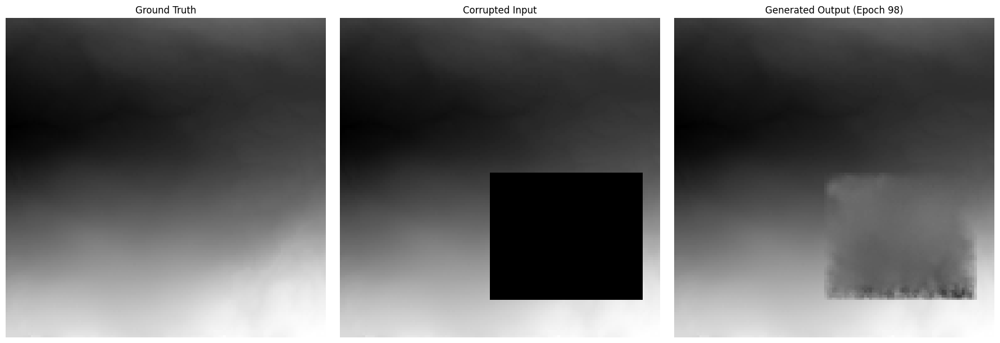

Epoch 99/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

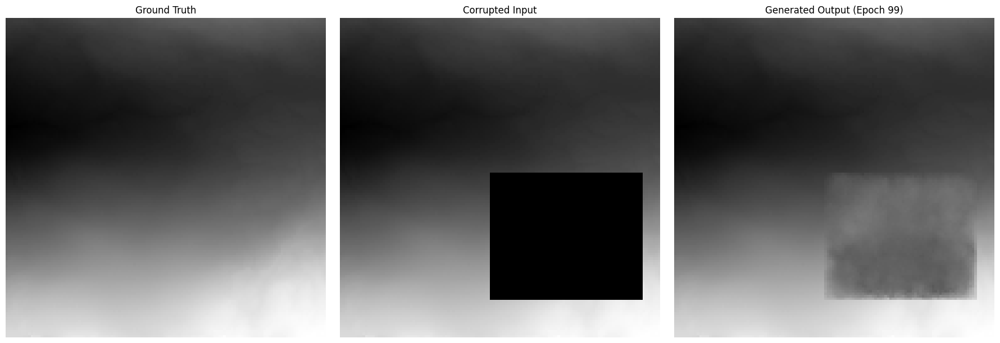

Epoch 100/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

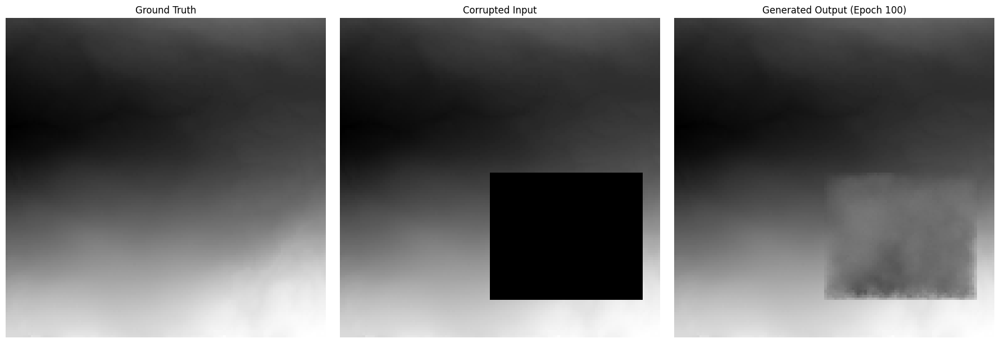

Epoch 101/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

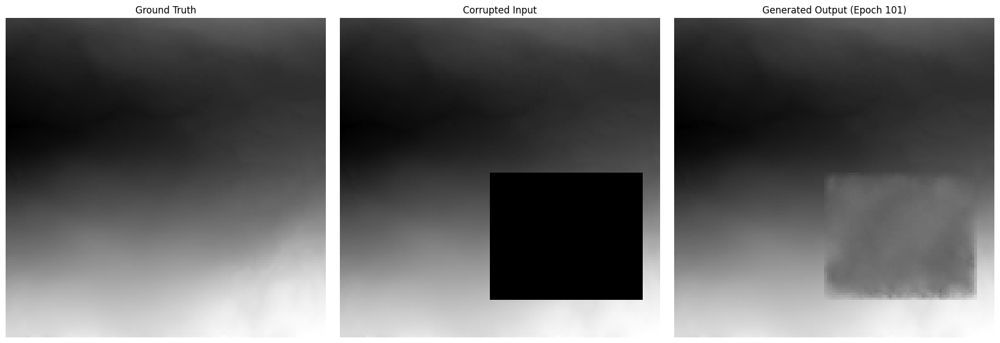

Epoch 102/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

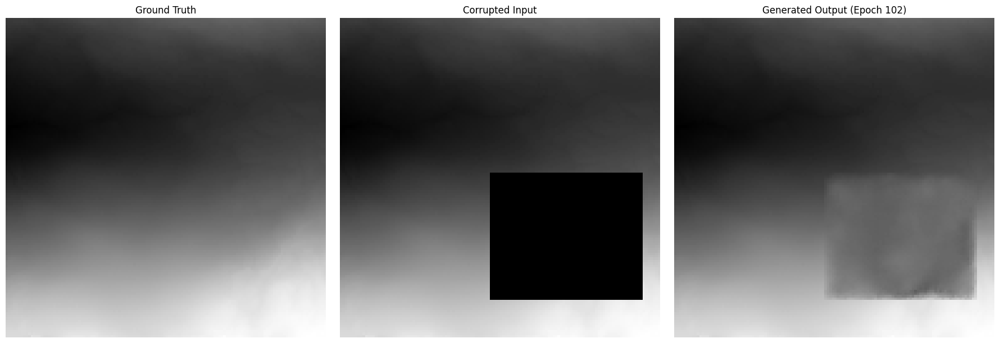

Epoch 103/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

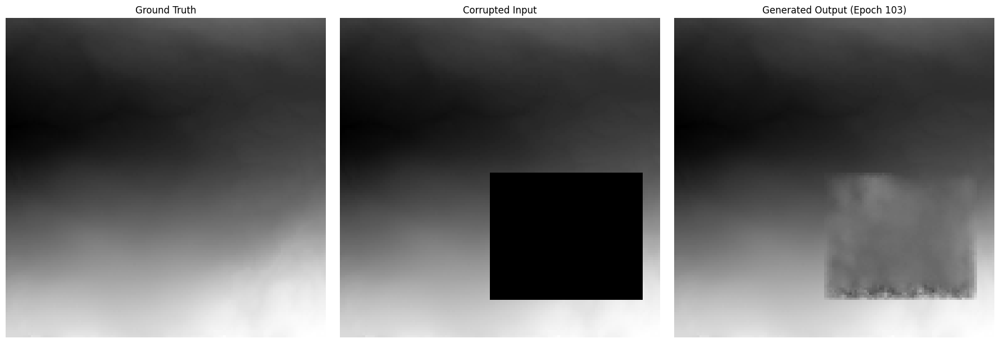

Epoch 104/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

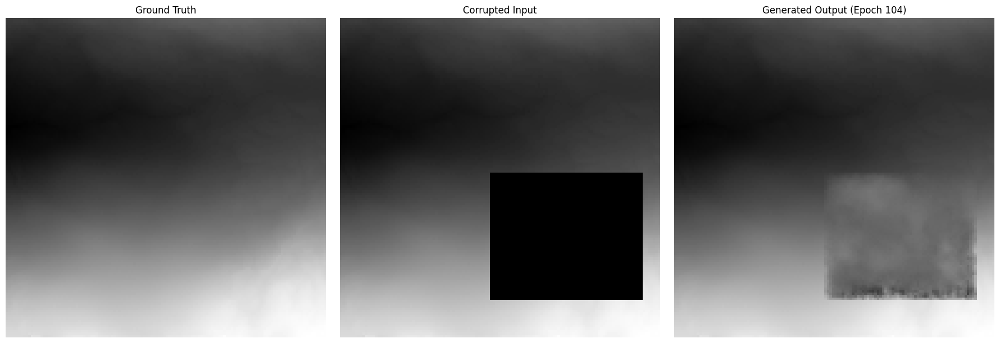

Epoch 105/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

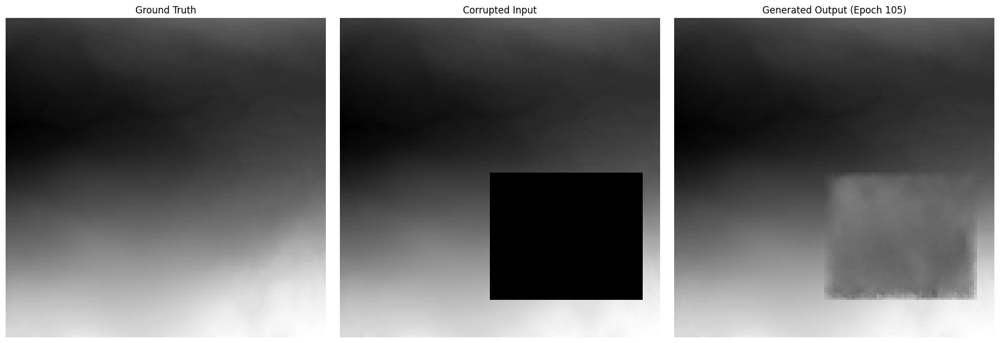

Epoch 106/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

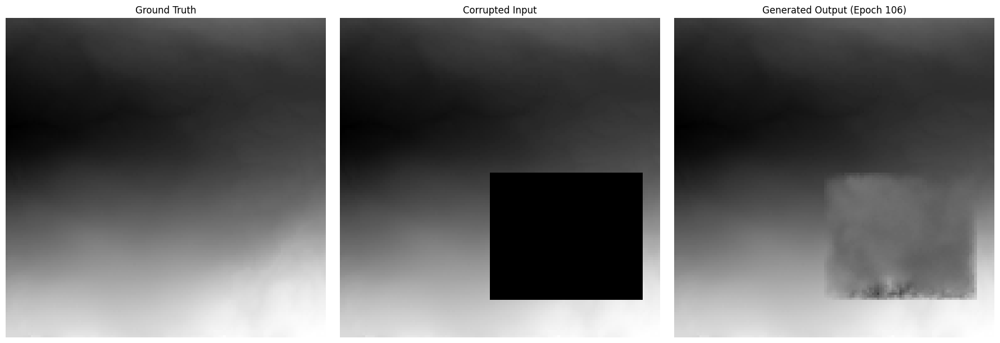

Epoch 107/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

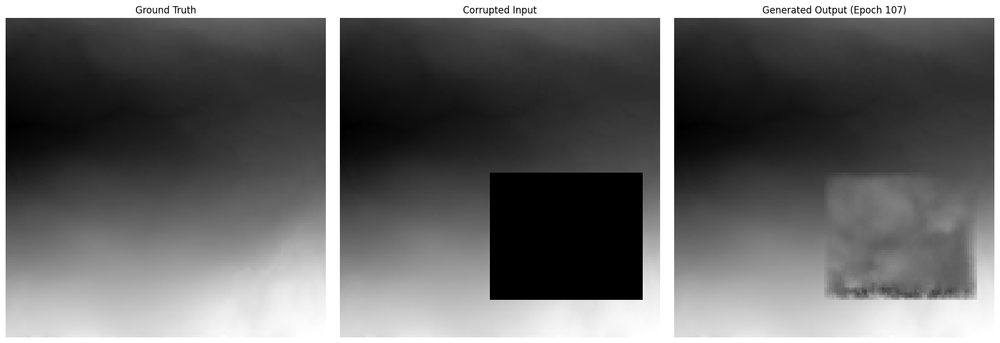

Epoch 108/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

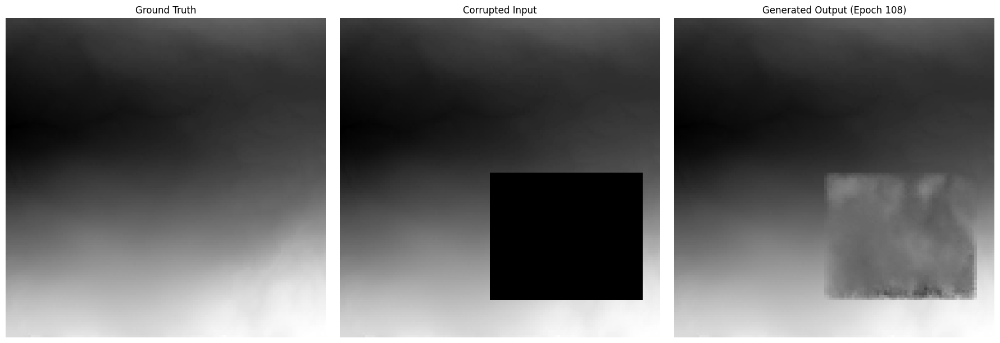

Epoch 109/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

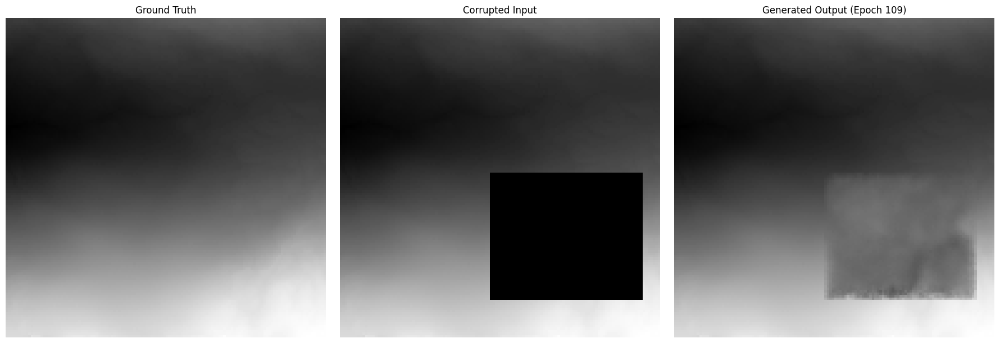

Epoch 110/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

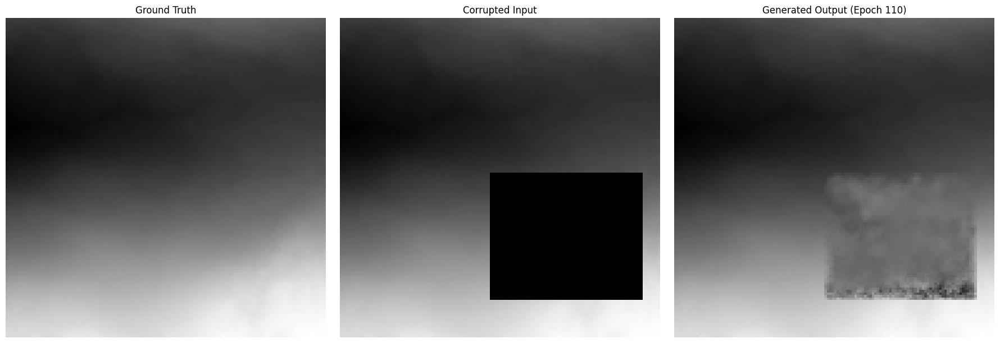

Epoch 111/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

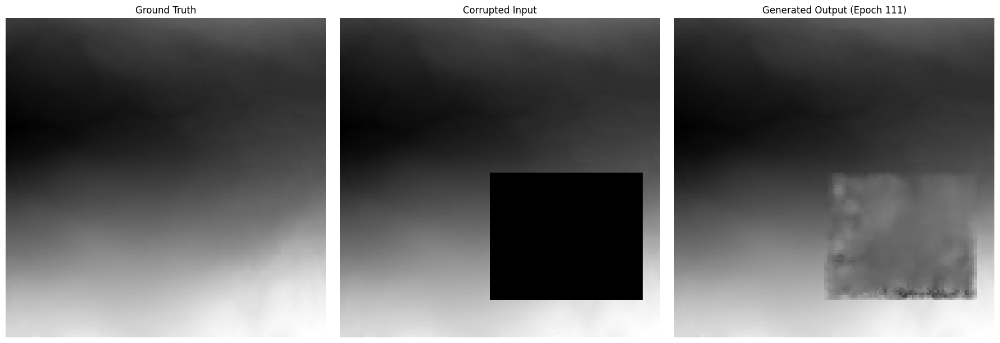

Epoch 112/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

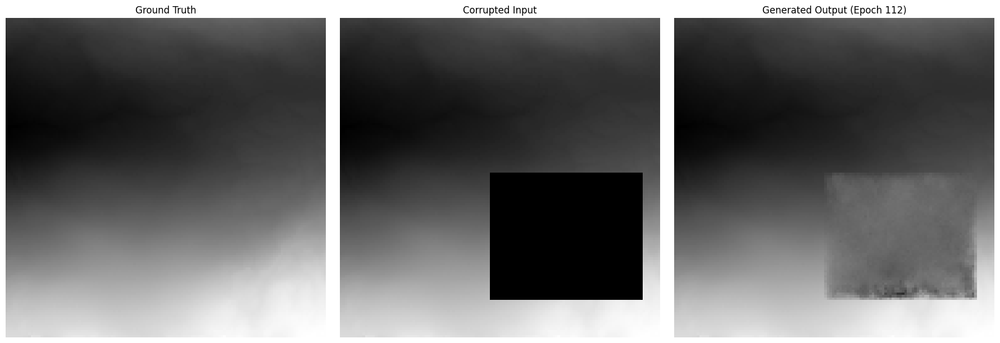

Epoch 113/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

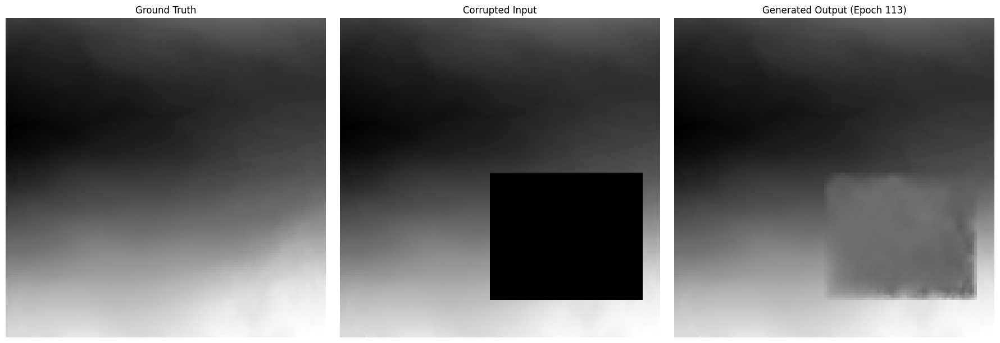

Epoch 114/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

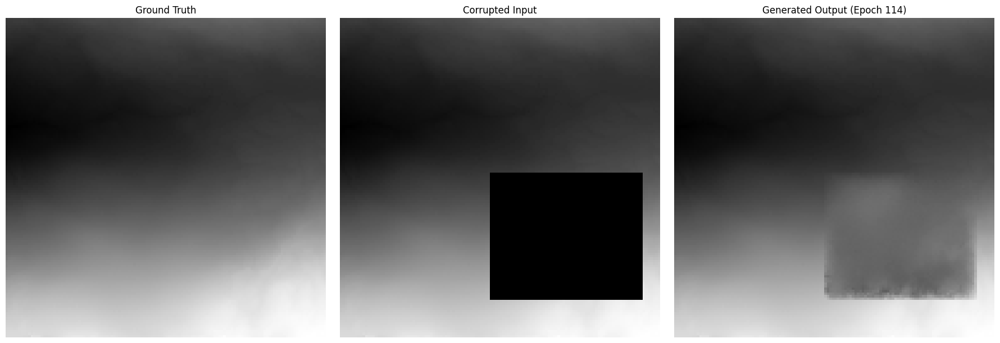

Epoch 115/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

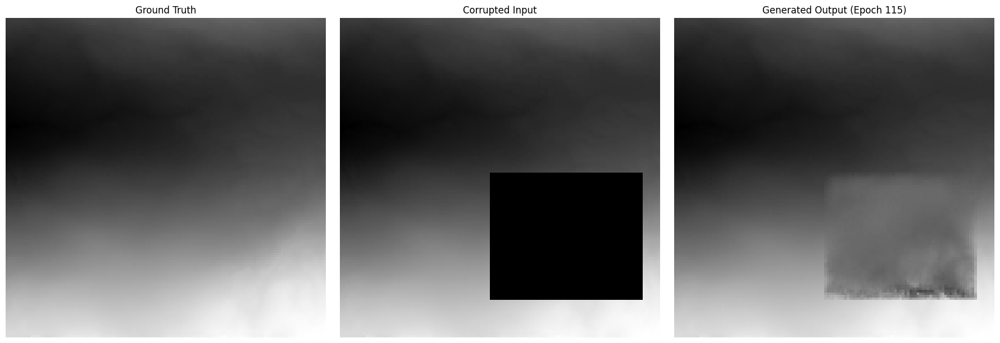

Epoch 116/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

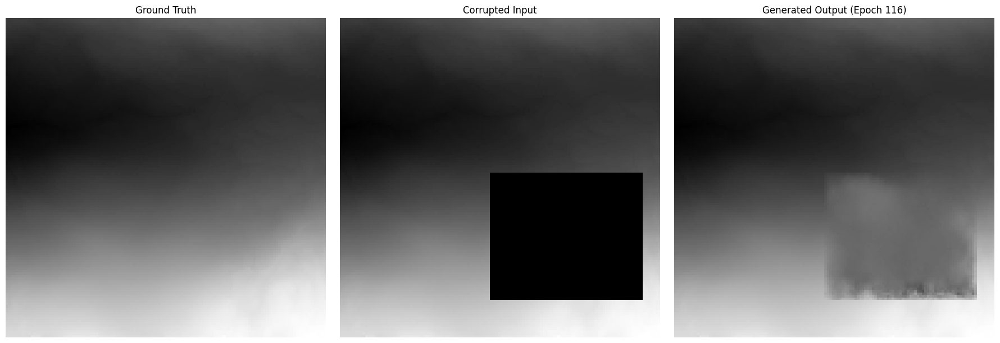

Epoch 117/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

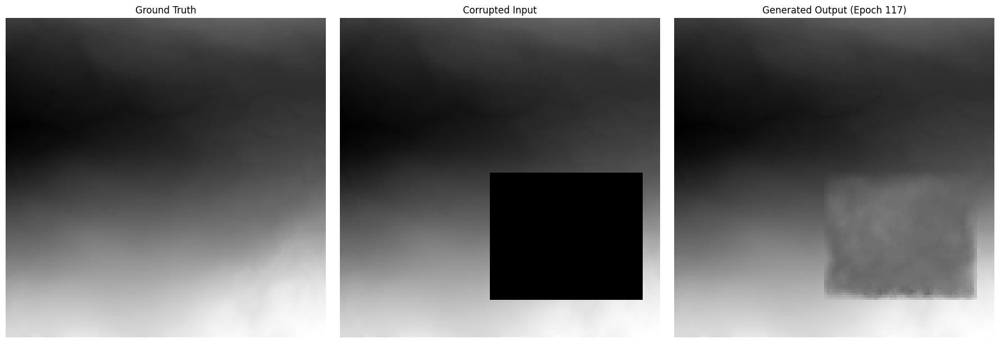

Epoch 118/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

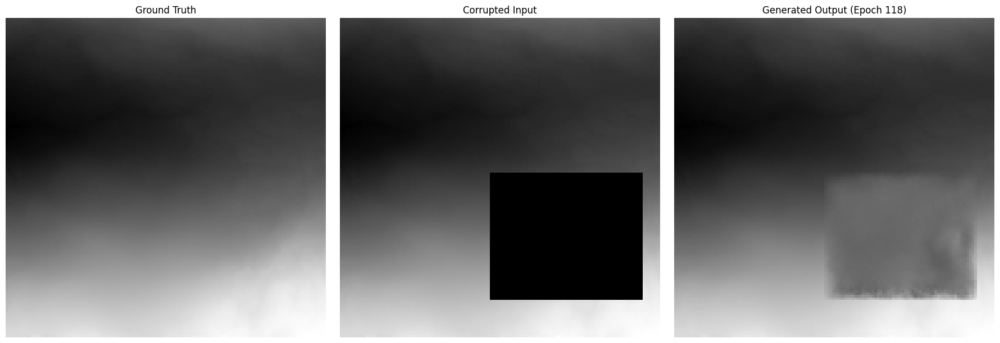

Epoch 119/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

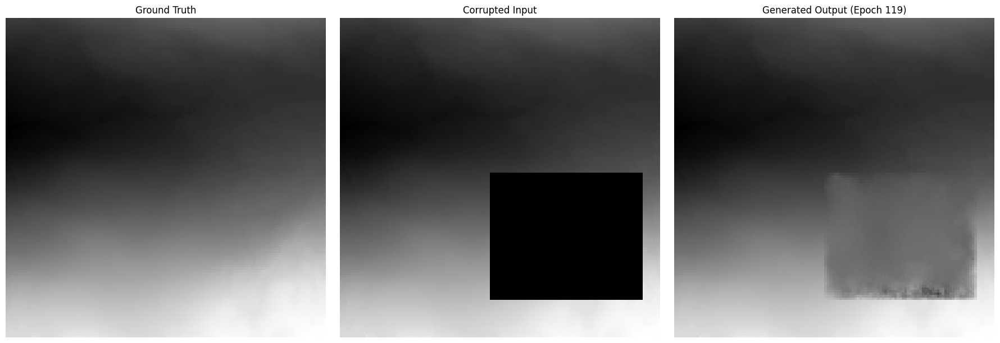

Epoch 120/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

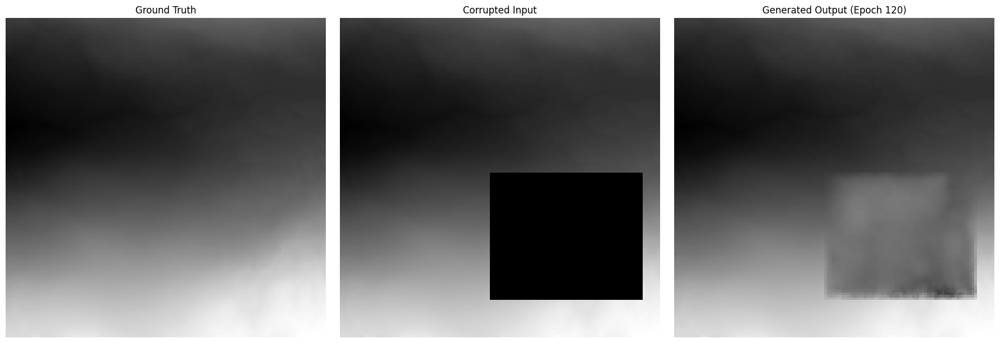

Epoch 121/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

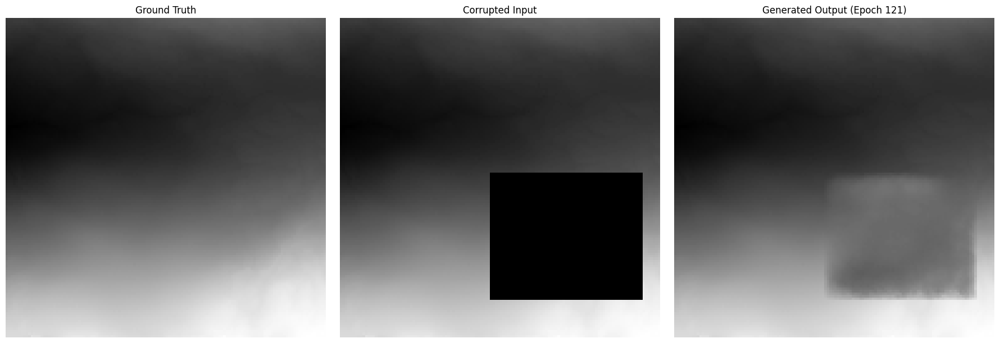

Epoch 122/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

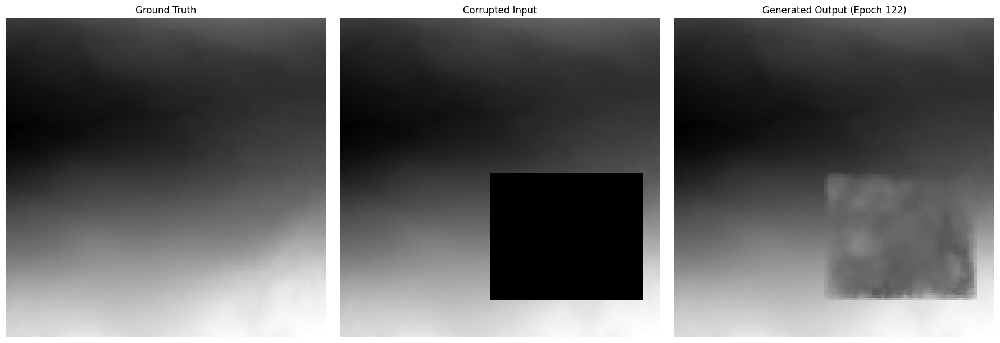

Epoch 123/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

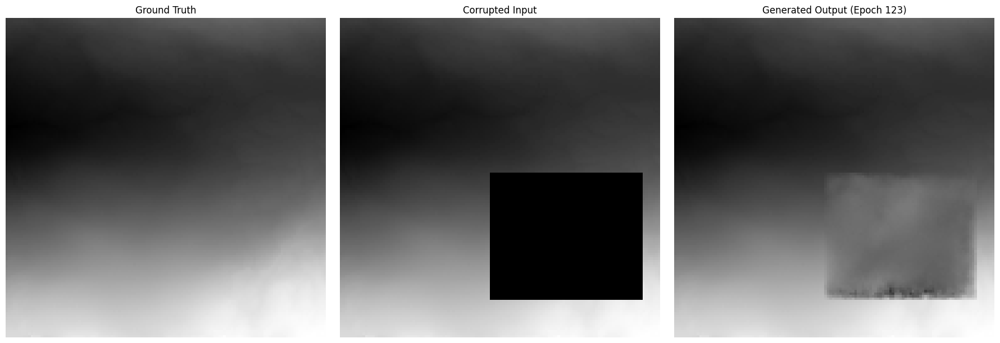

Epoch 124/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

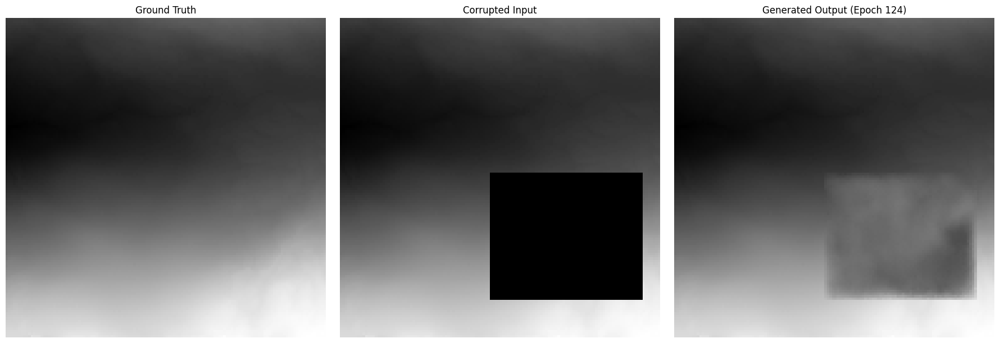

Epoch 125/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

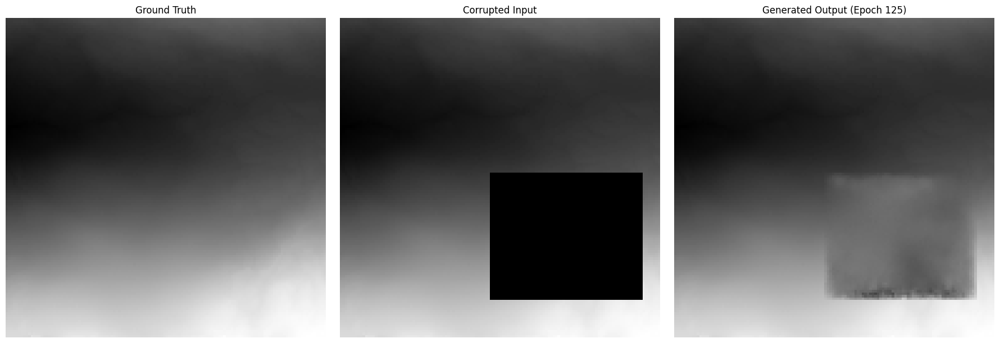

Epoch 126/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

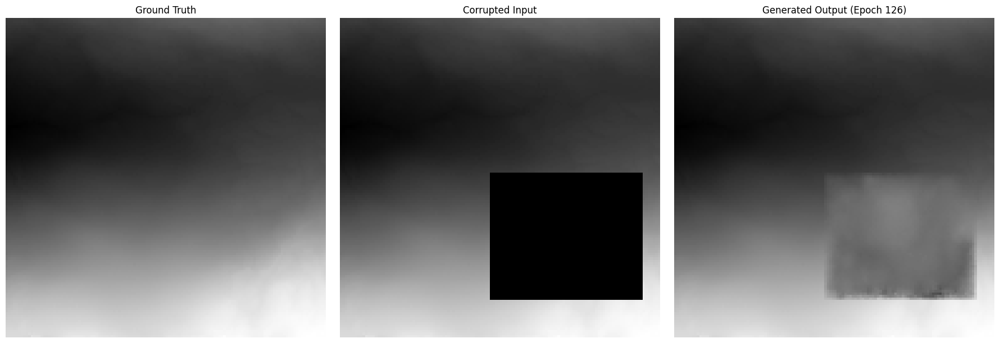

Epoch 127/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

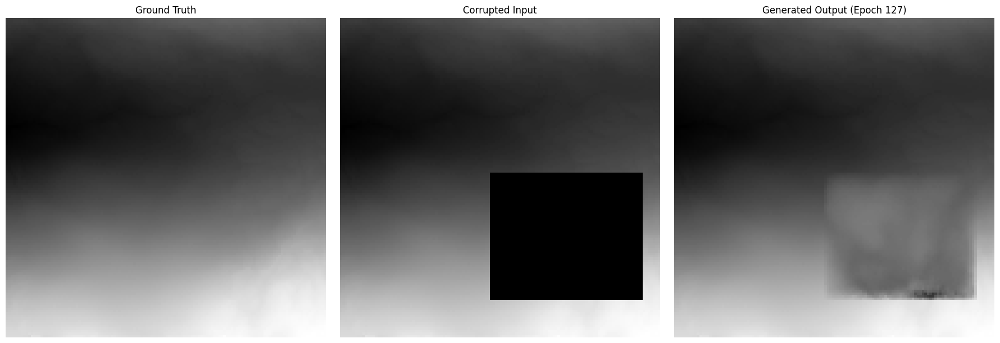

Epoch 128/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

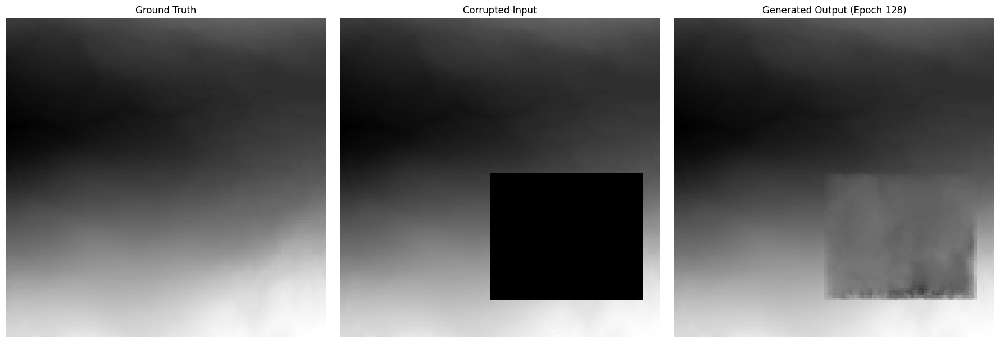

Epoch 129/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

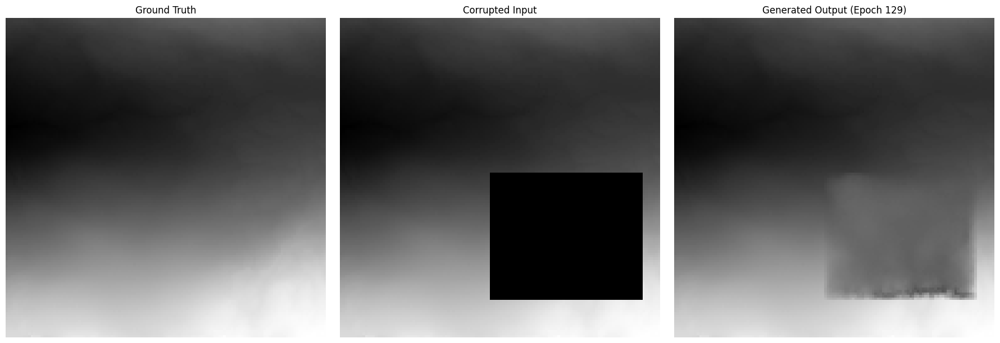

Epoch 130/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

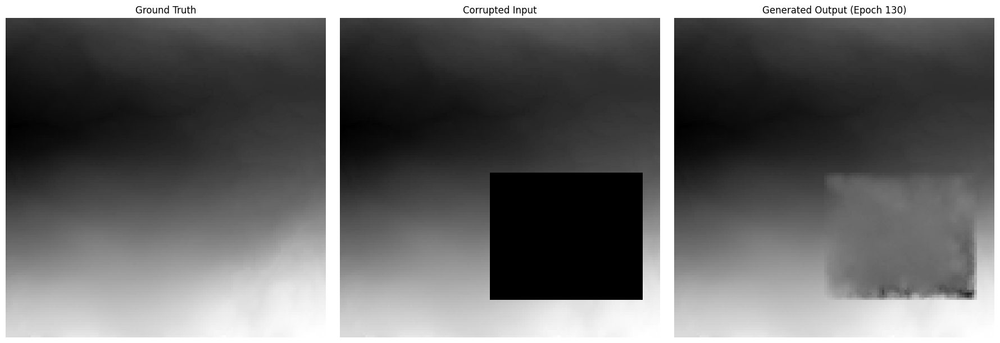

Epoch 131/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

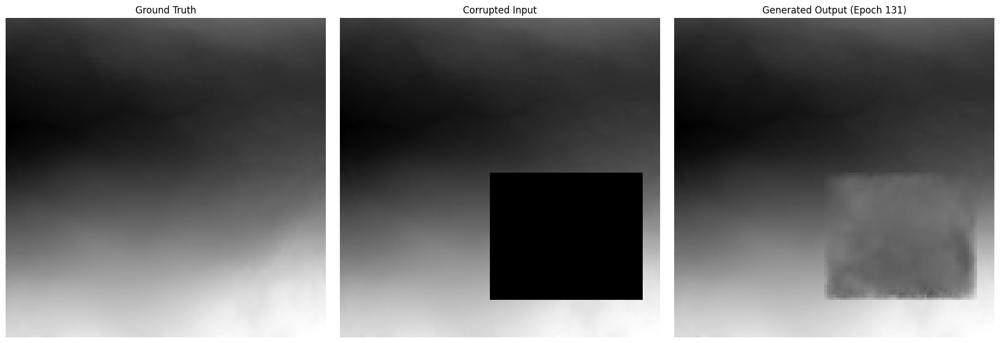

Epoch 132/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

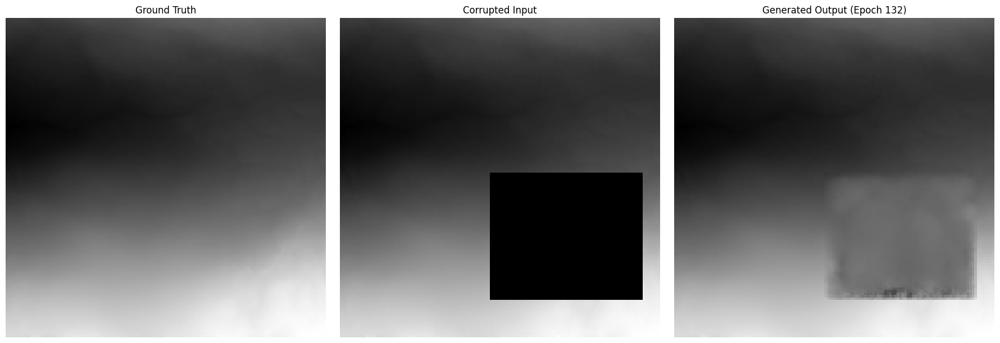

Epoch 133/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

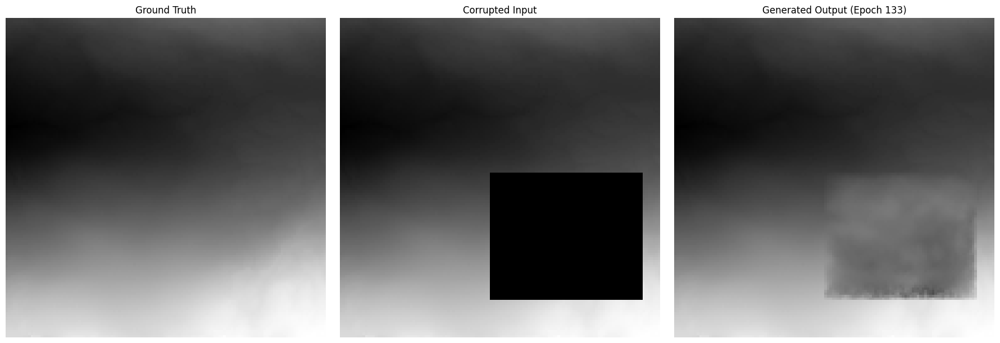

Epoch 134/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 134 with loss: 0.008499


Generating Visual: 0it [00:00, ?it/s]

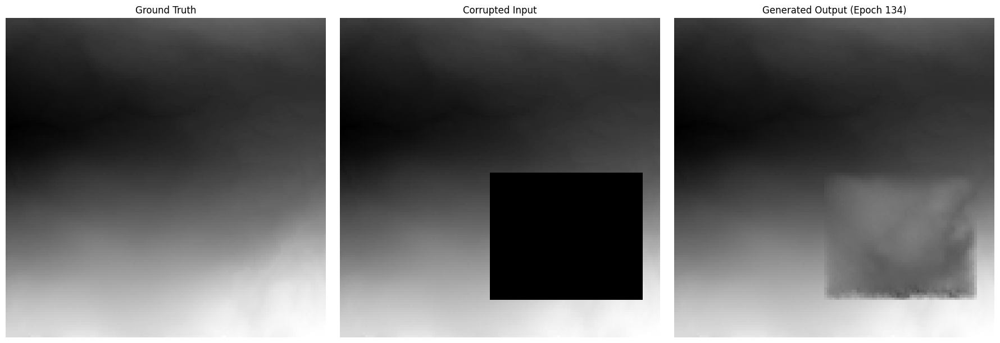

Epoch 135/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

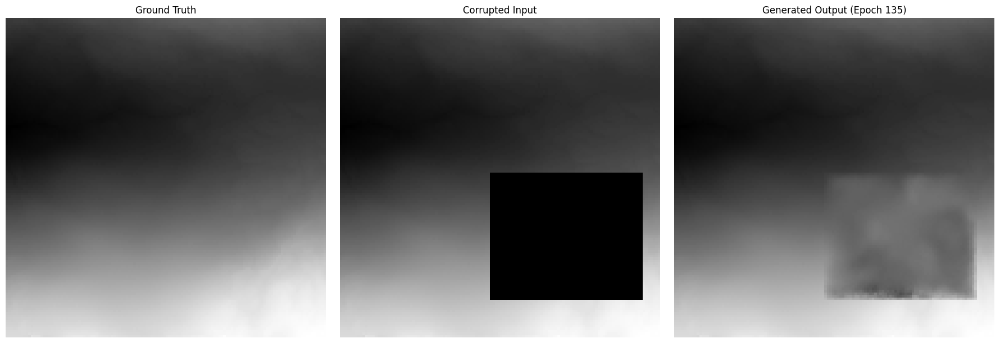

Epoch 136/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

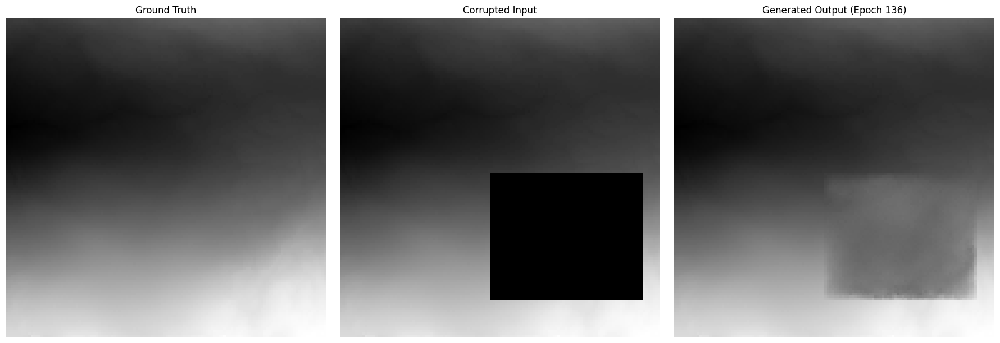

Epoch 137/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

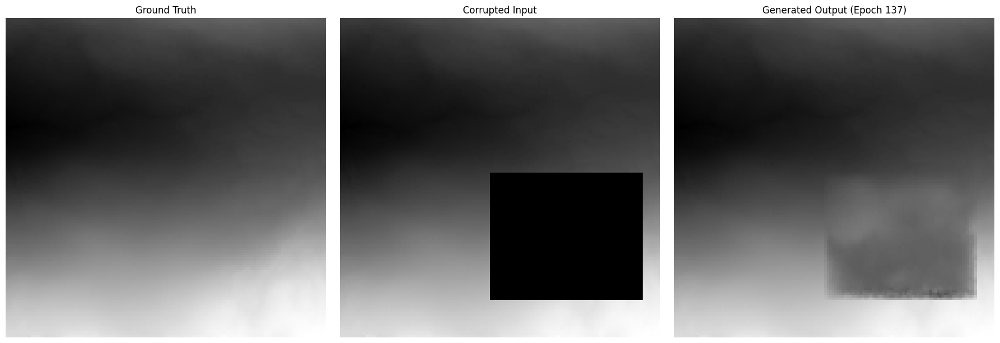

Epoch 138/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

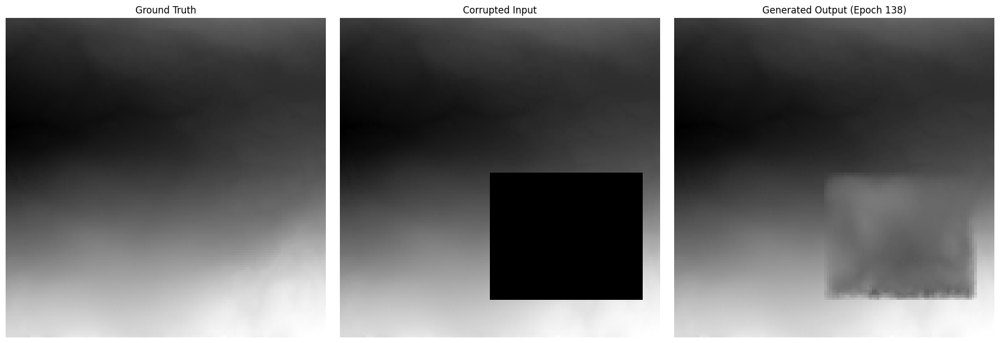

Epoch 139/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

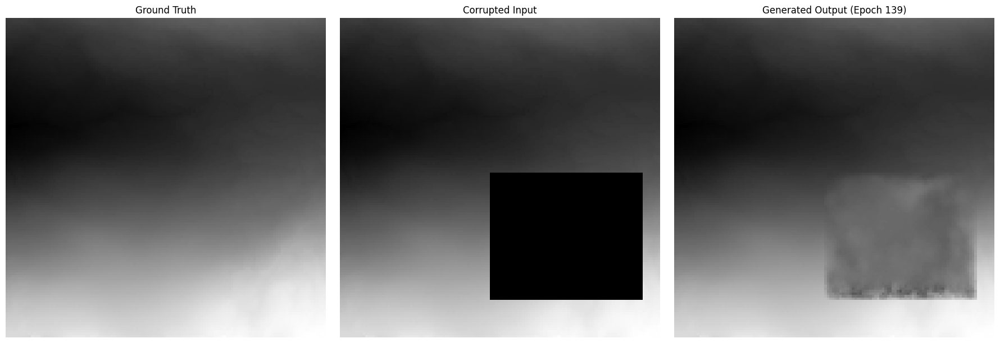

Epoch 140/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

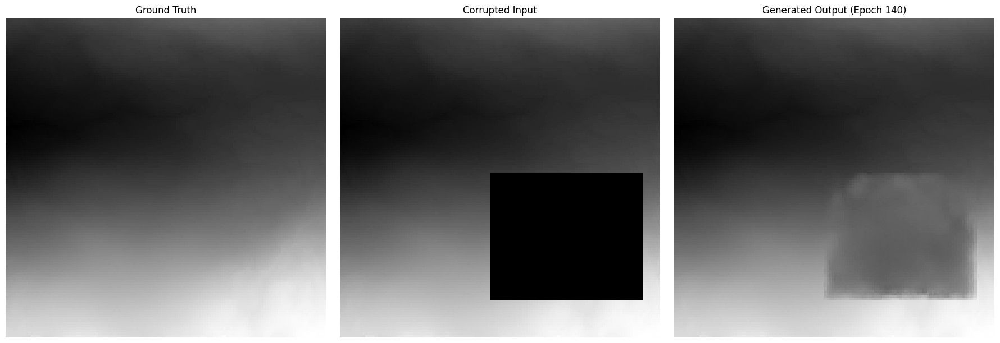

Epoch 141/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

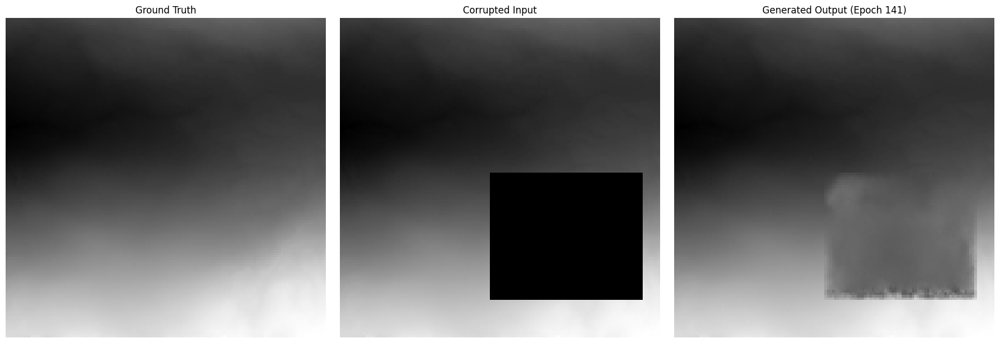

Epoch 142/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

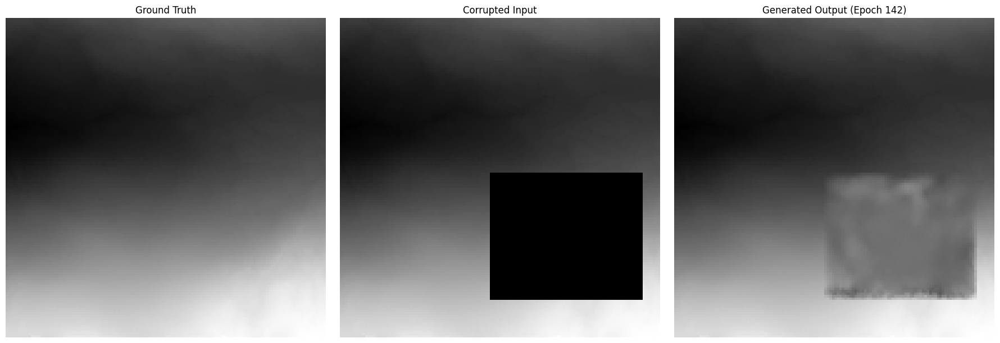

Epoch 143/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

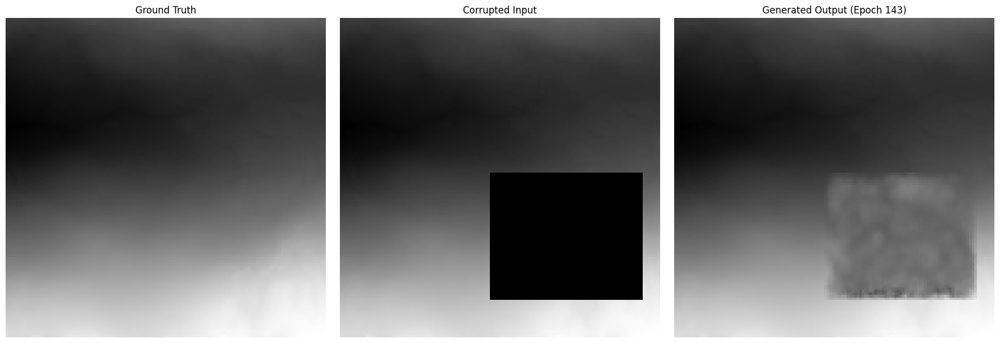

Epoch 144/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

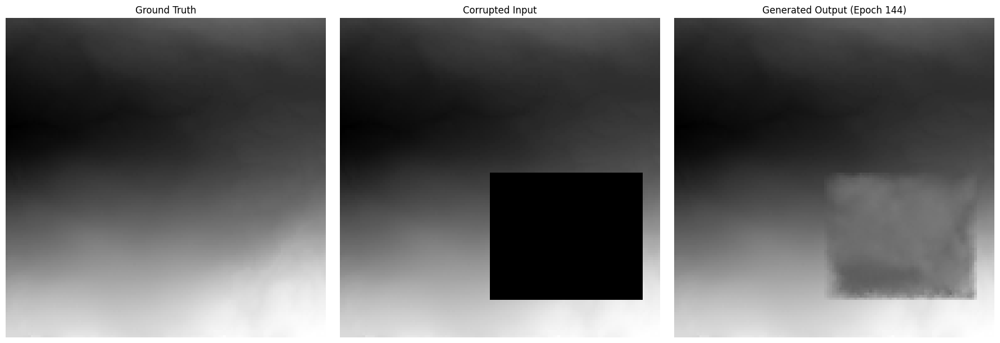

Epoch 145/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 145 with loss: 0.007813


Generating Visual: 0it [00:00, ?it/s]

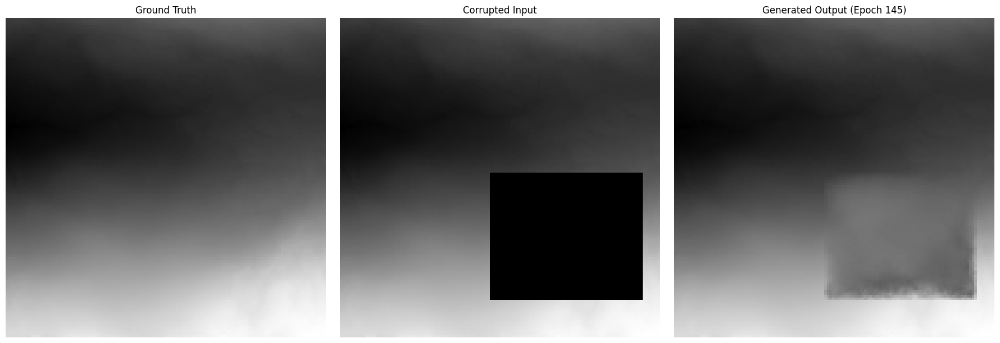

Epoch 146/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

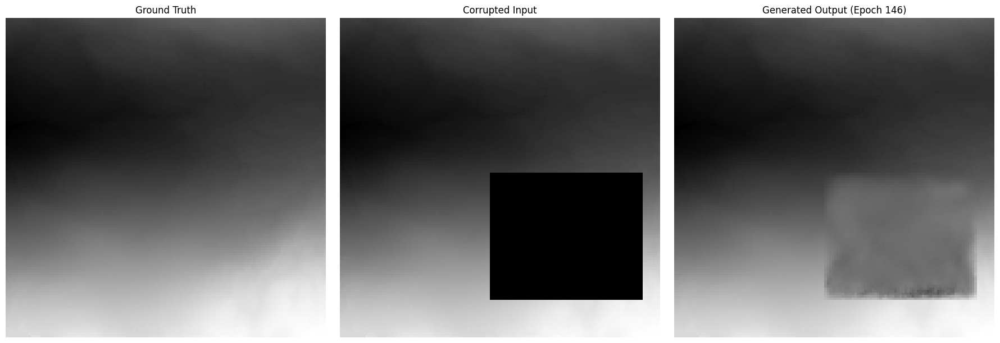

Epoch 147/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

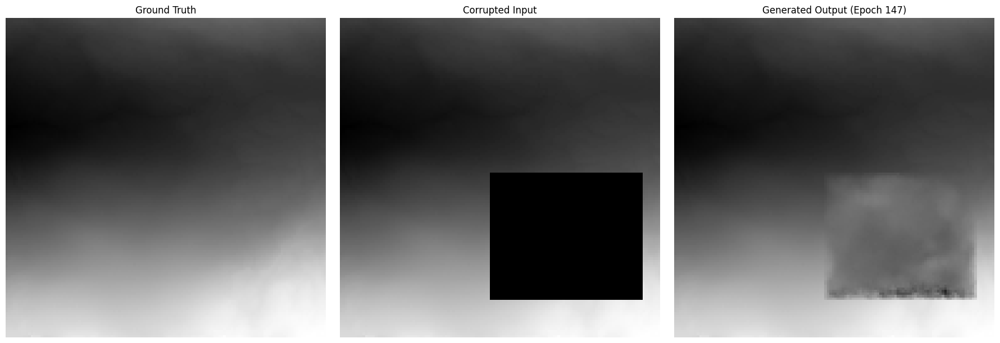

Epoch 148/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

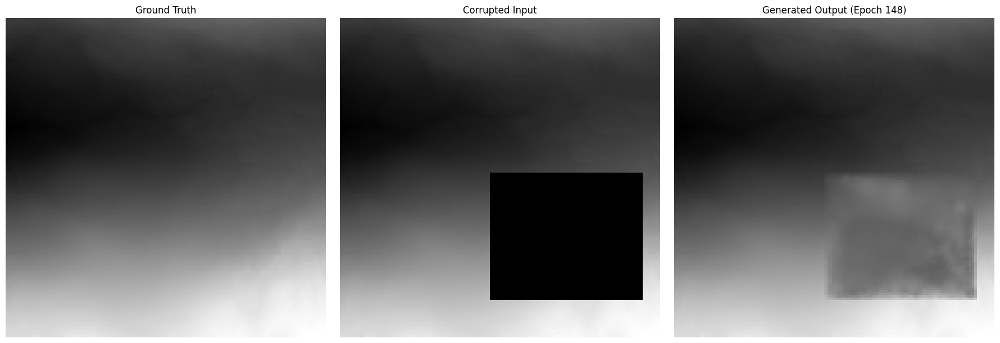

Epoch 149/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

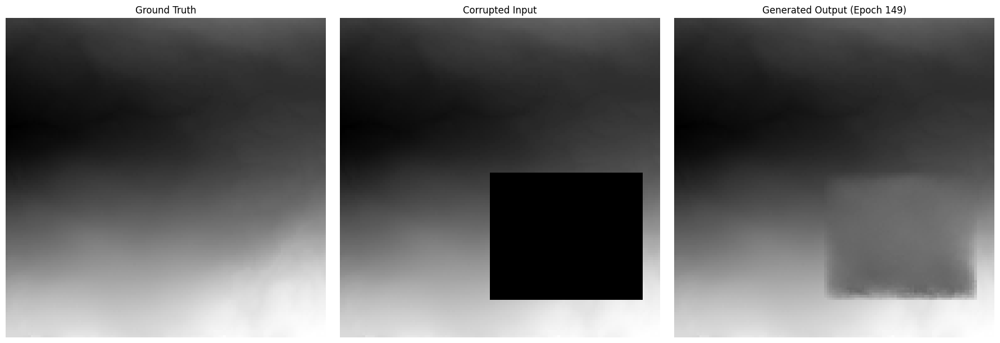

Epoch 150/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

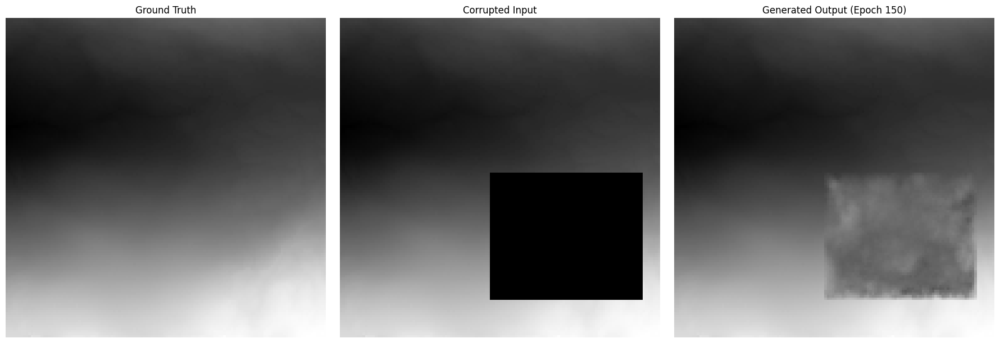

Epoch 151/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

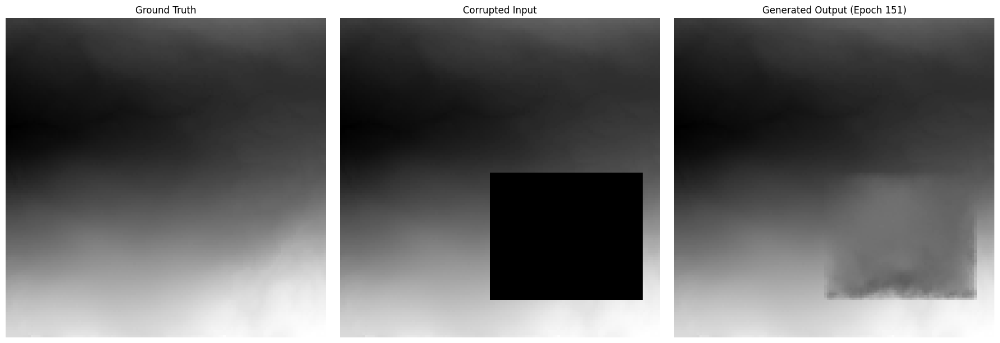

Epoch 152/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

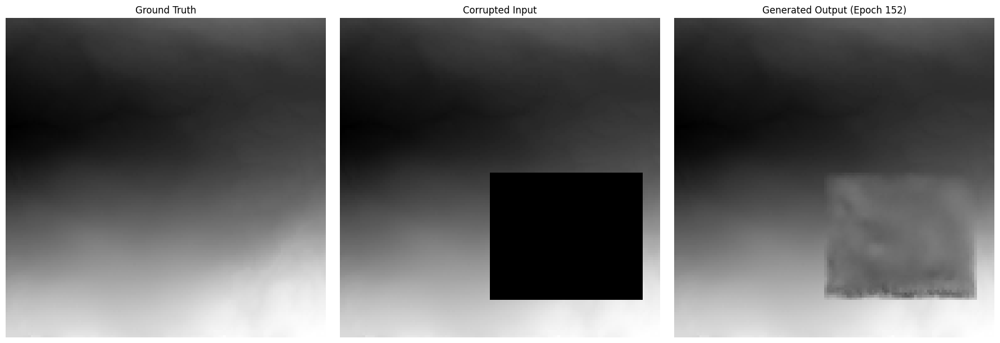

Epoch 153/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

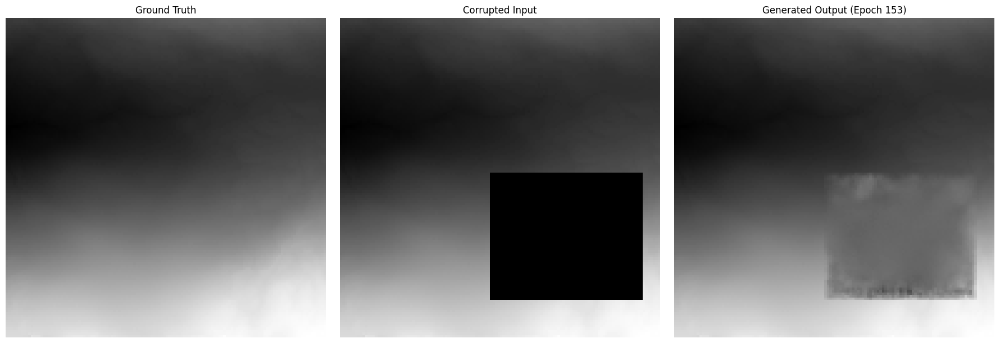

Epoch 154/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 154 with loss: 0.007044


Generating Visual: 0it [00:00, ?it/s]

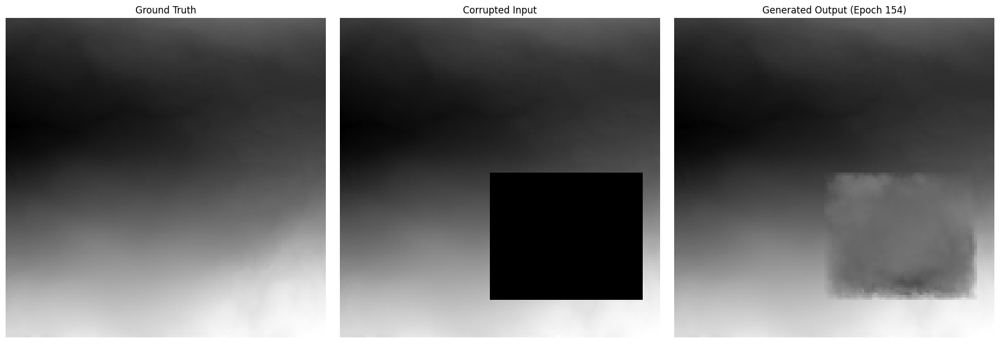

Epoch 155/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

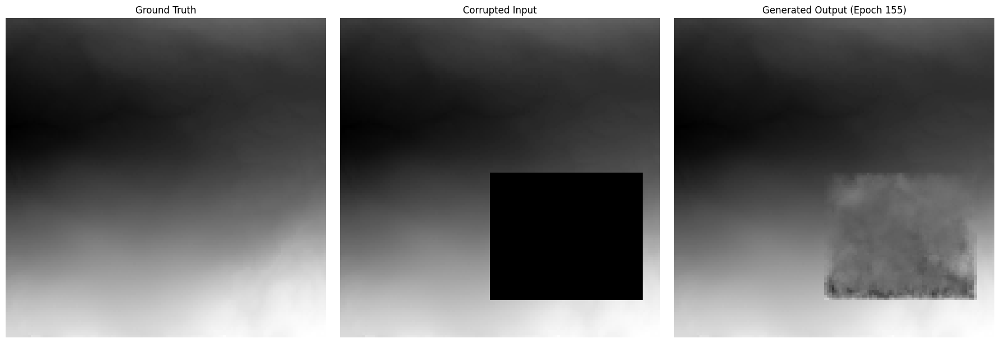

Epoch 156/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

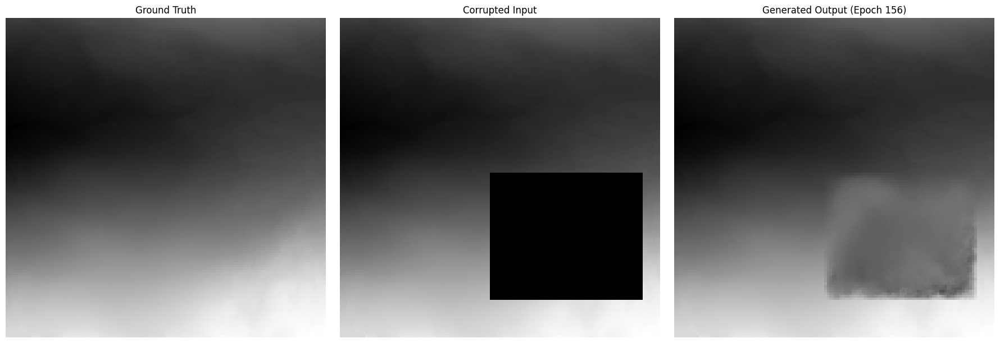

Epoch 157/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

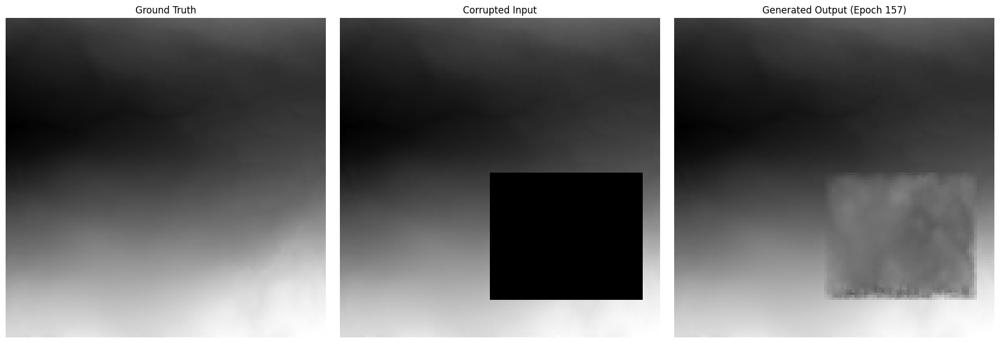

Epoch 158/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

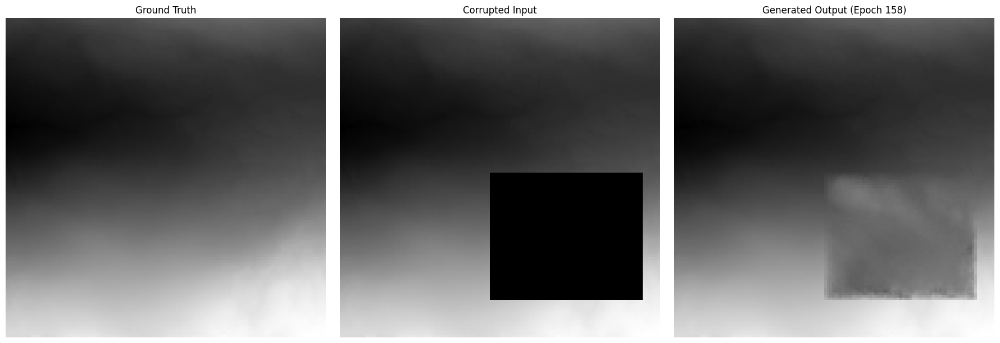

Epoch 159/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

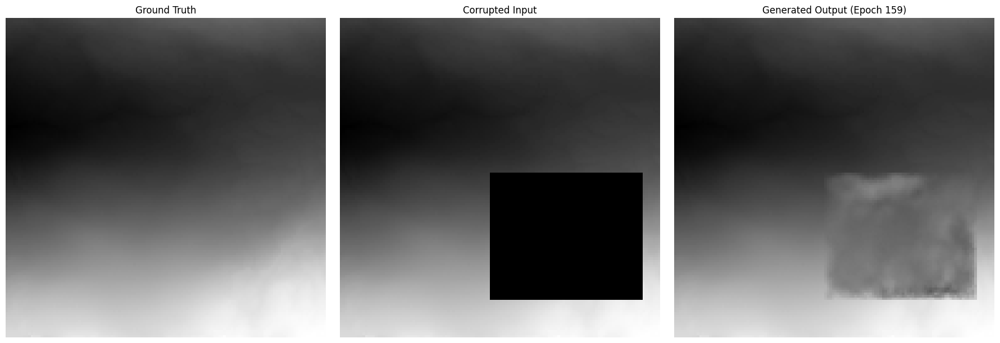

Epoch 160/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

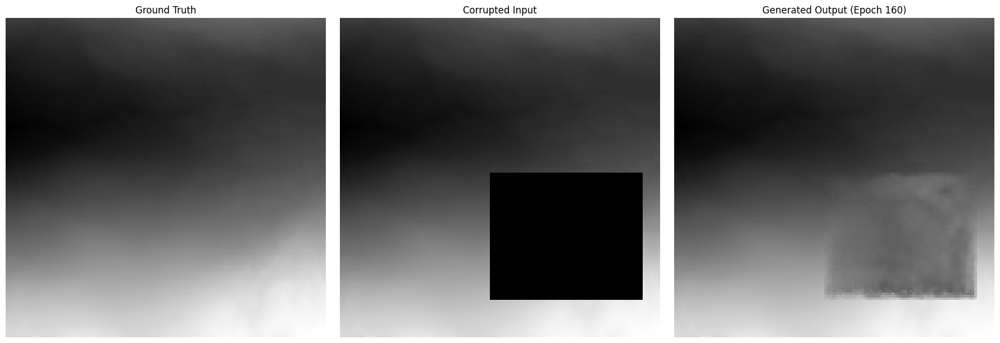

Epoch 161/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

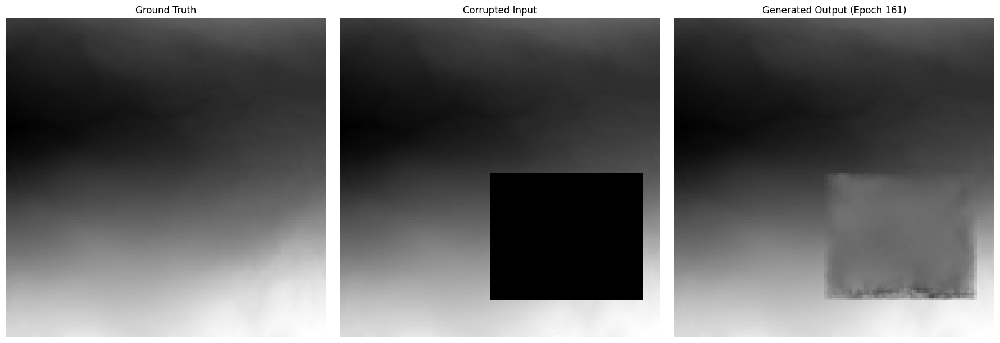

Epoch 162/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

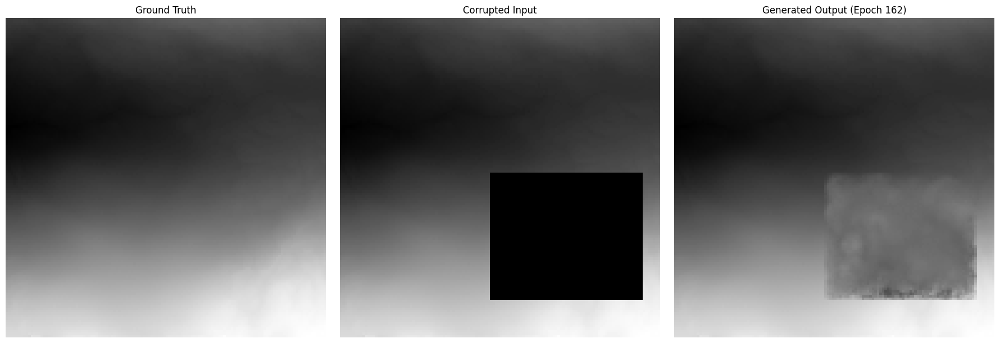

Epoch 163/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

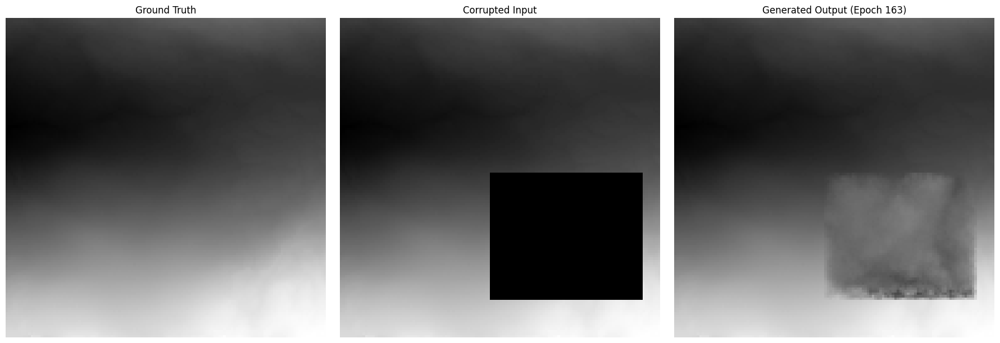

Epoch 164/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

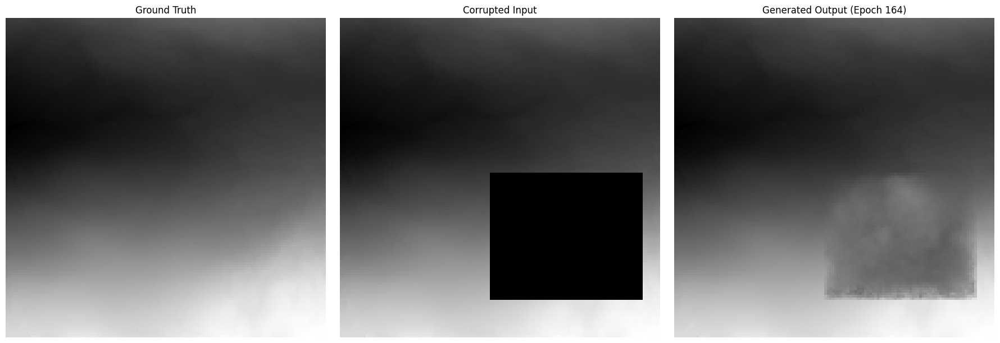

Epoch 165/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

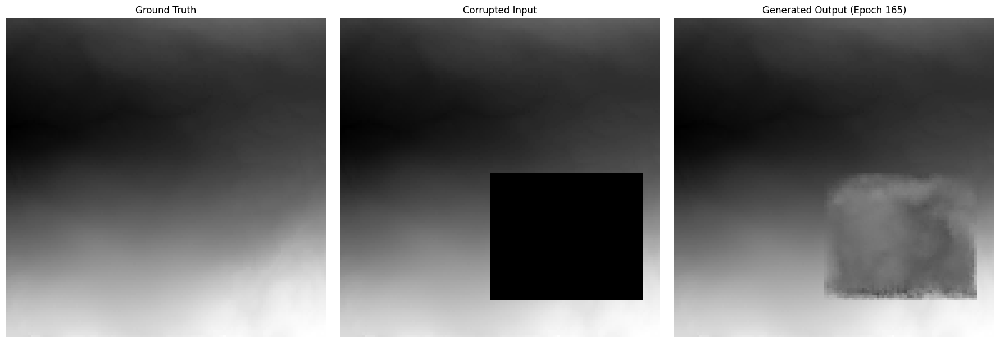

Epoch 166/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

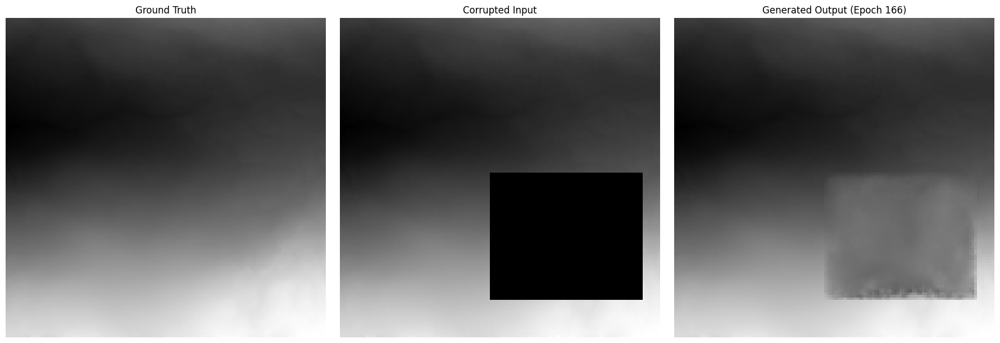

Epoch 167/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

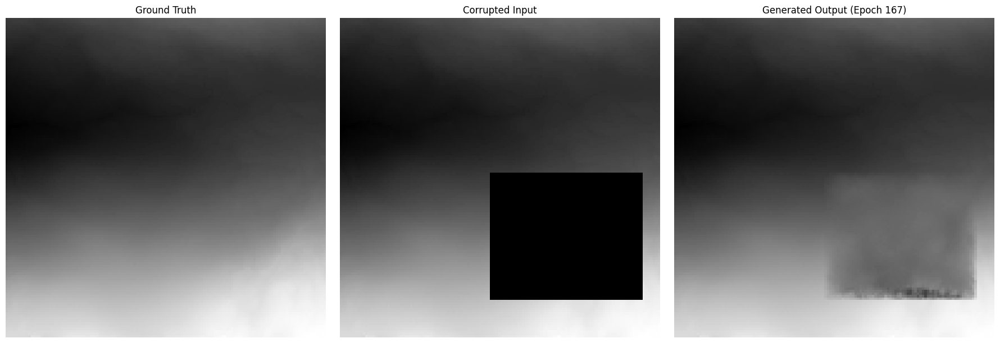

Epoch 168/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

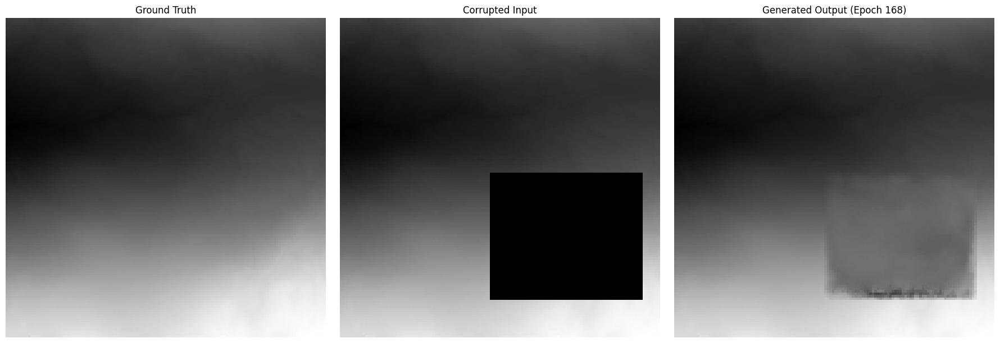

Epoch 169/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

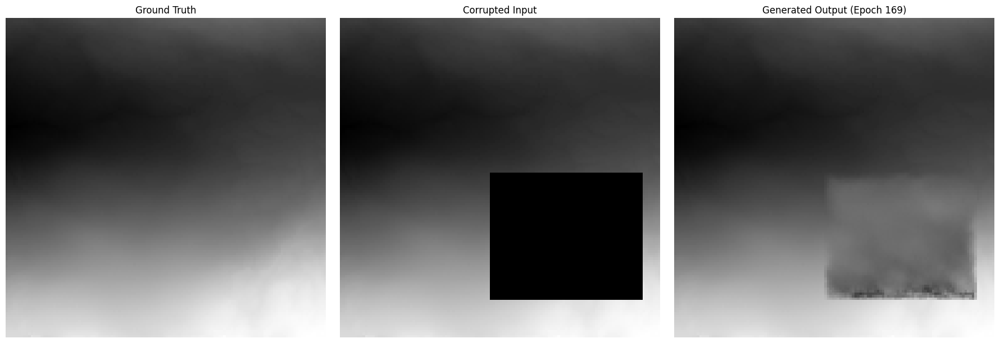

Epoch 170/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

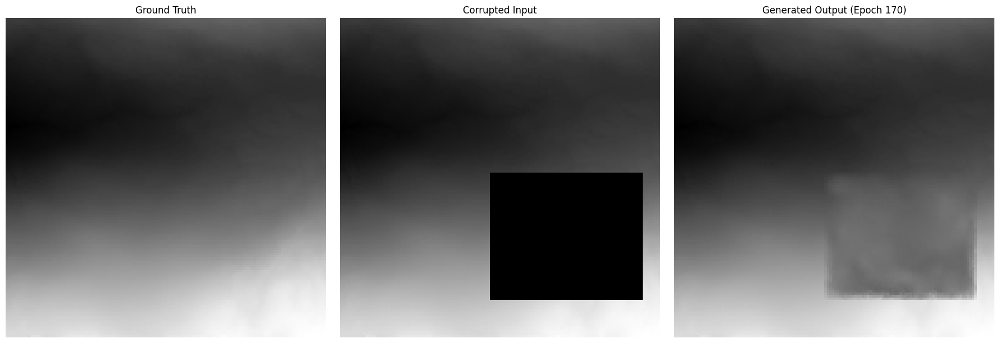

Epoch 171/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

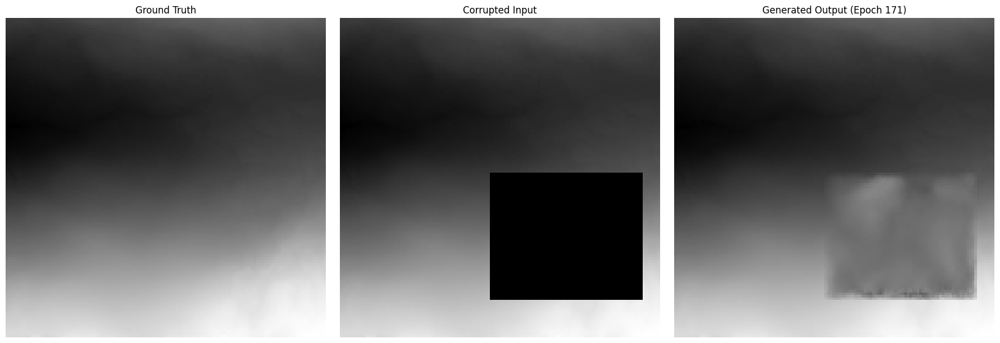

Epoch 172/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

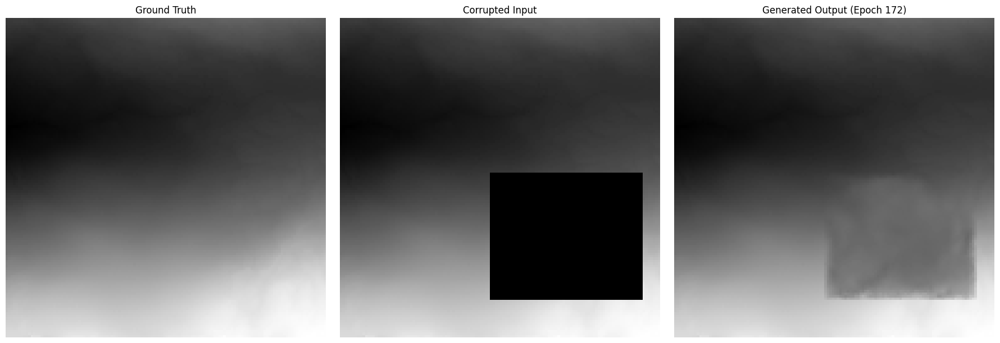

Epoch 173/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

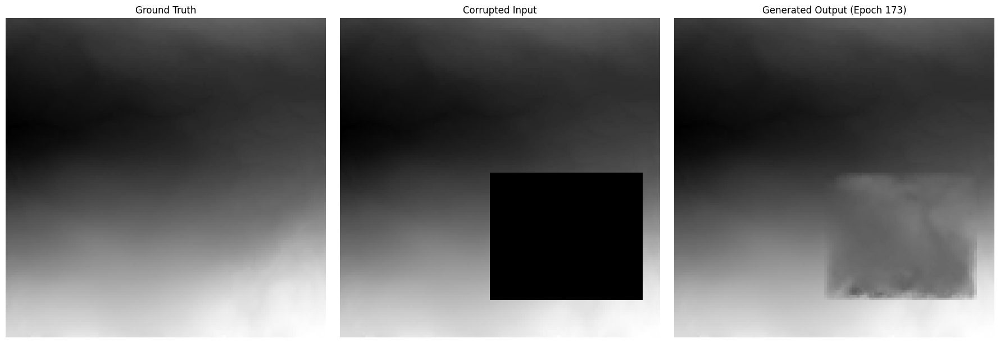

Epoch 174/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

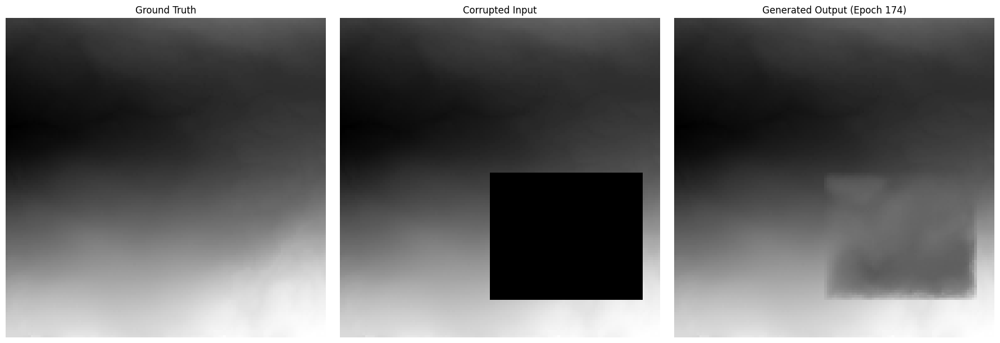

Epoch 175/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

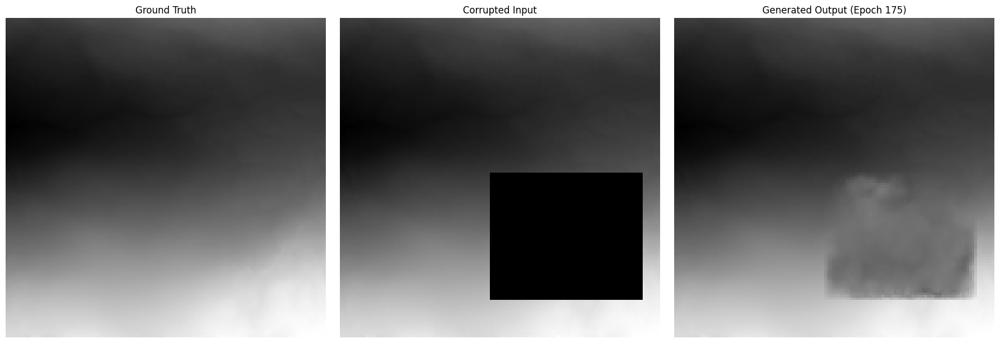

Epoch 176/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

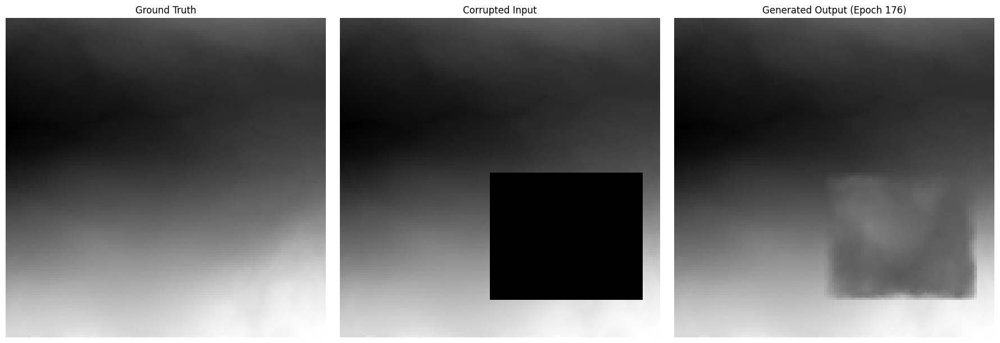

Epoch 177/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

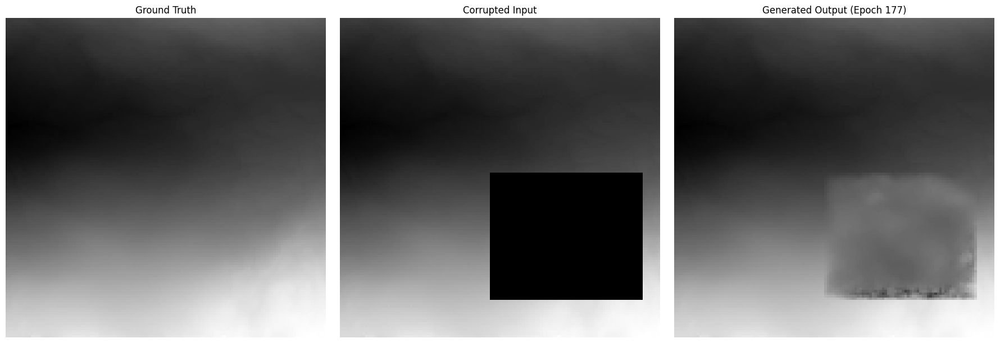

Epoch 178/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

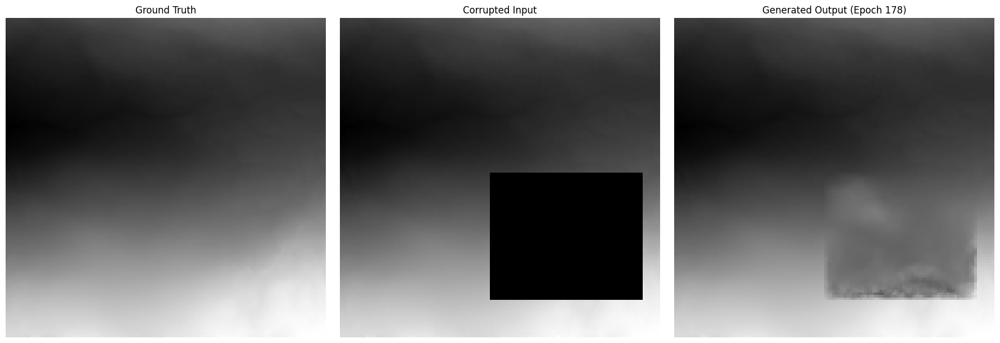

Epoch 179/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

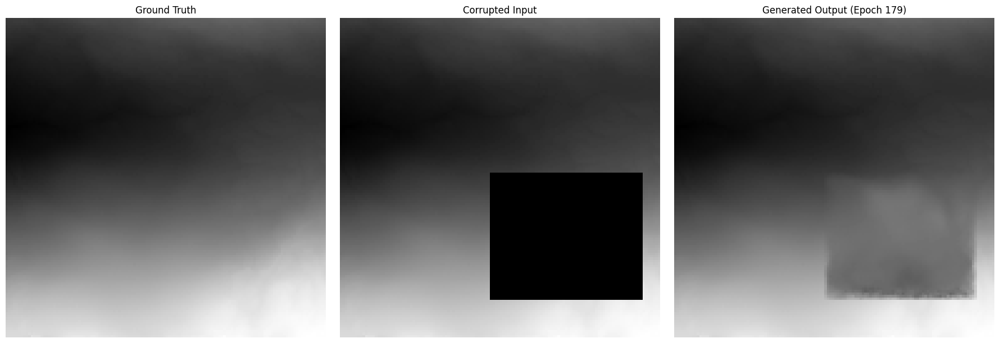

Epoch 180/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

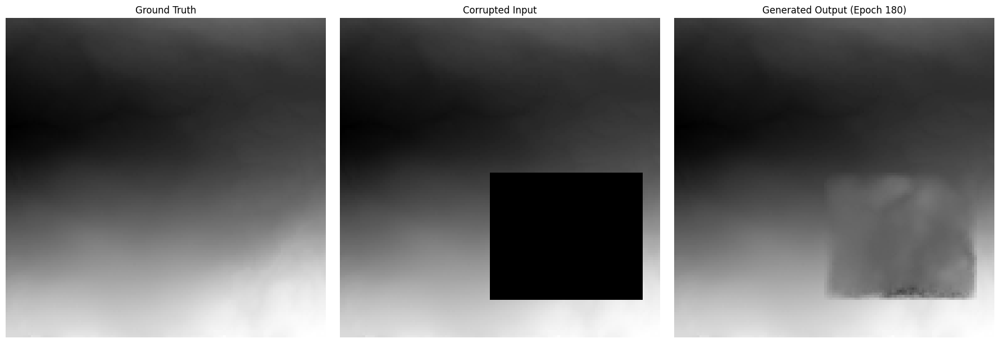

Epoch 181/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

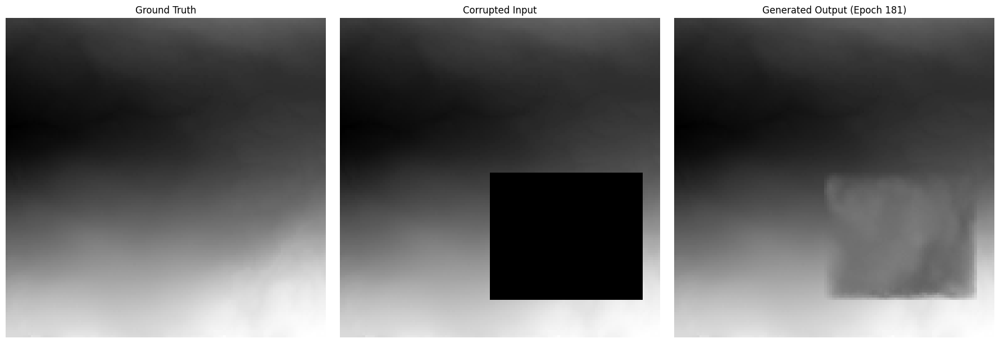

Epoch 182/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

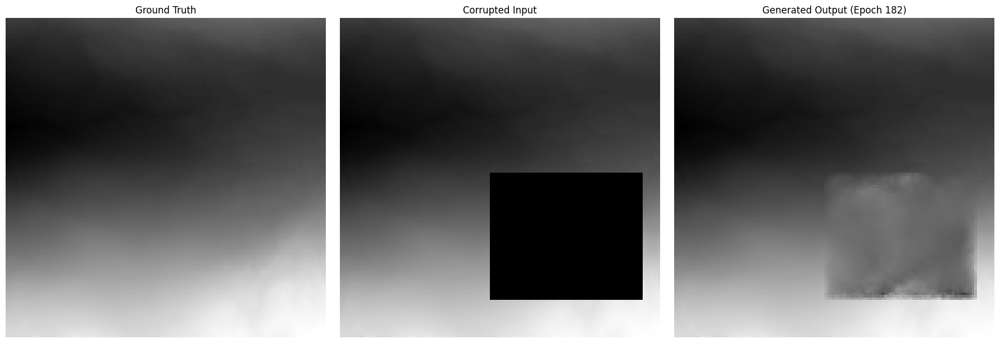

Epoch 183/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

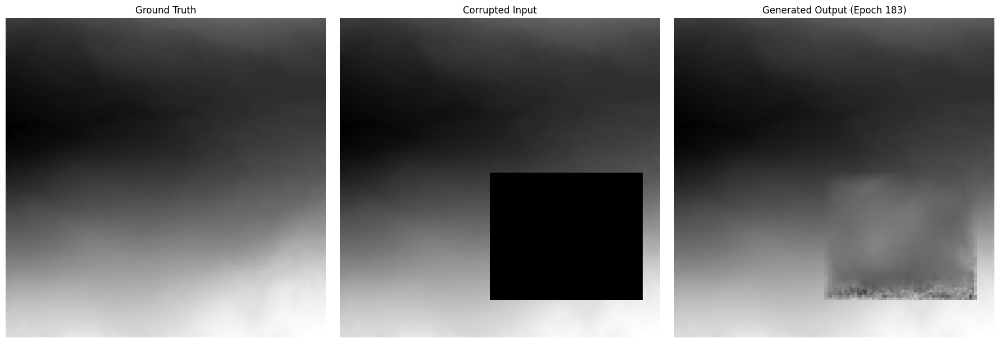

Epoch 184/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

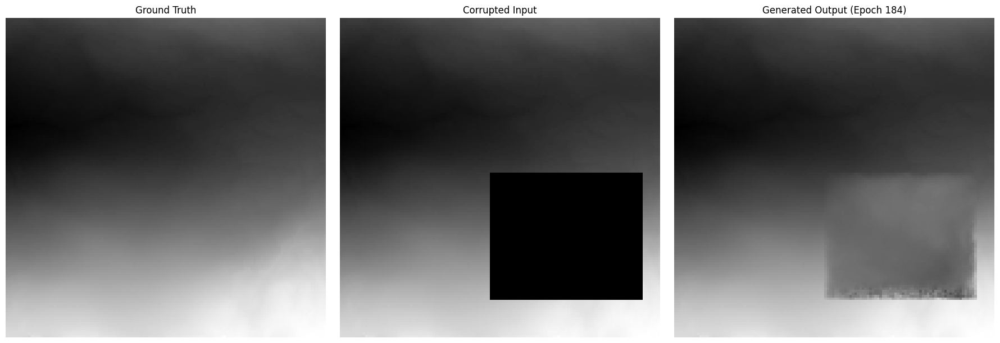

Epoch 185/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 185 with loss: 0.006759


Generating Visual: 0it [00:00, ?it/s]

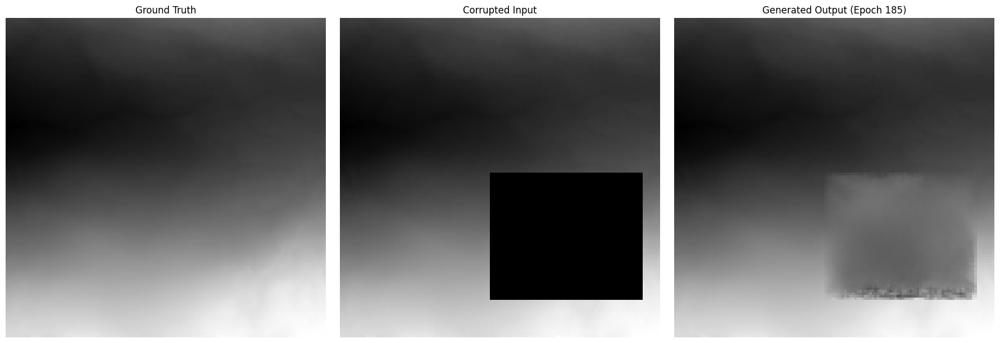

Epoch 186/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

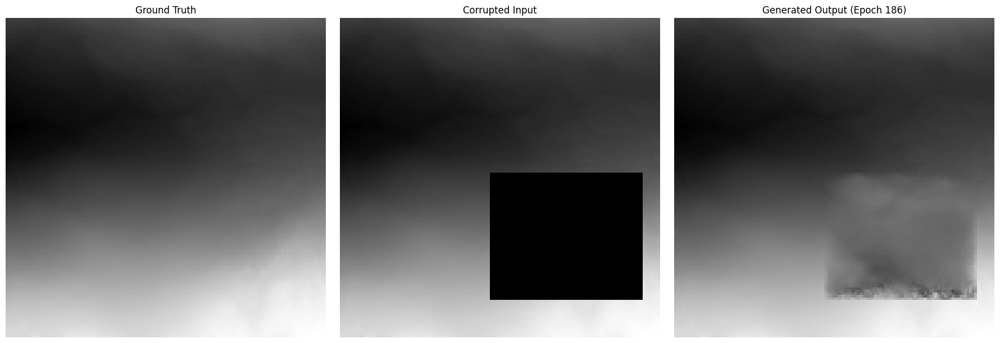

Epoch 187/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

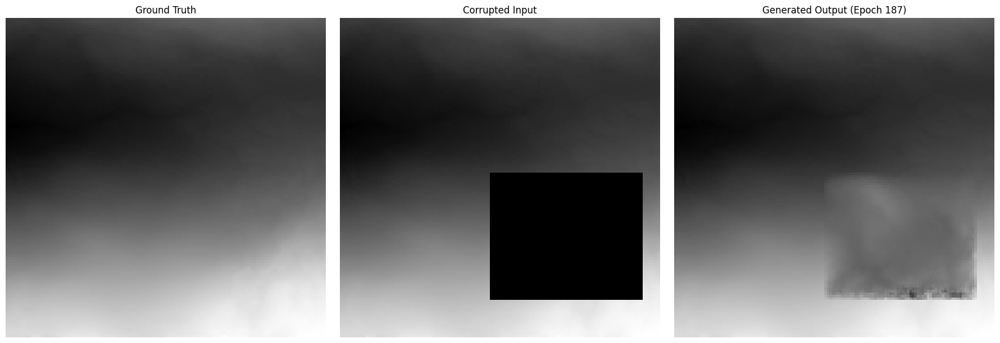

Epoch 188/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

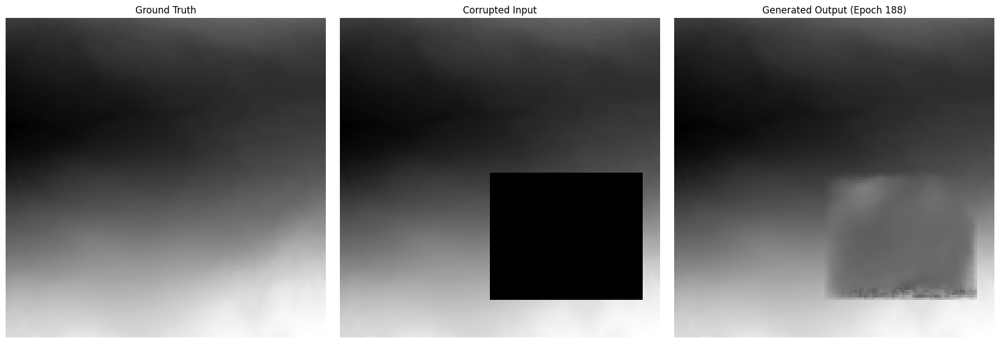

Epoch 189/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

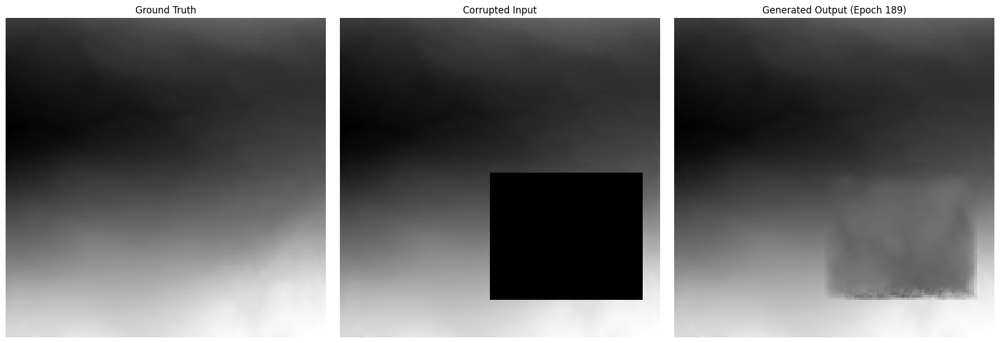

Epoch 190/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

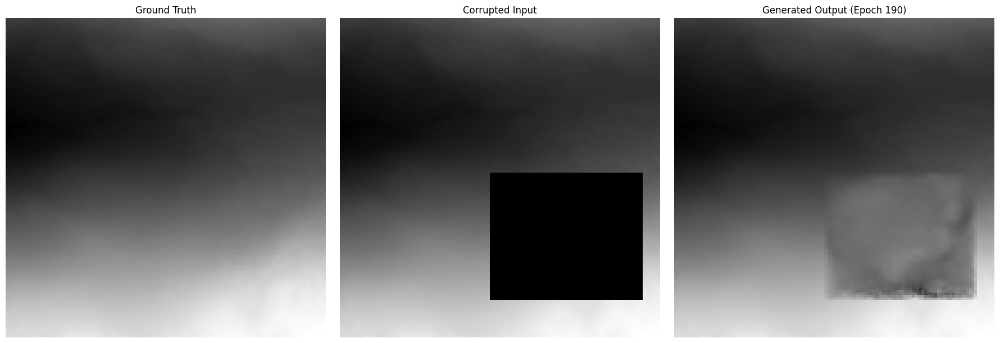

Epoch 191/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

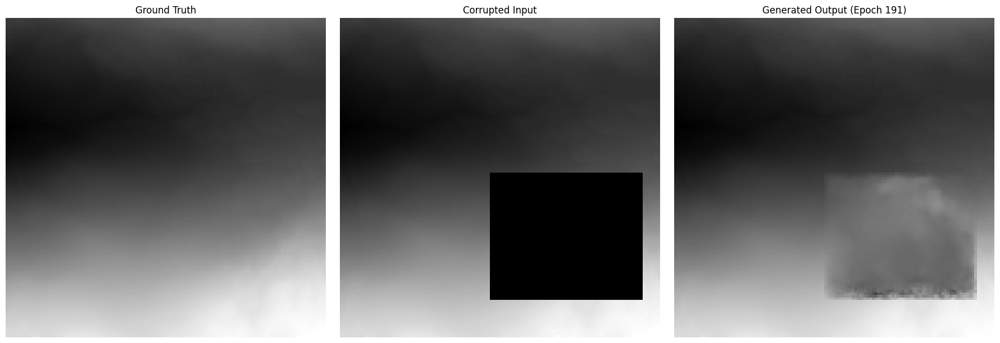

Epoch 192/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

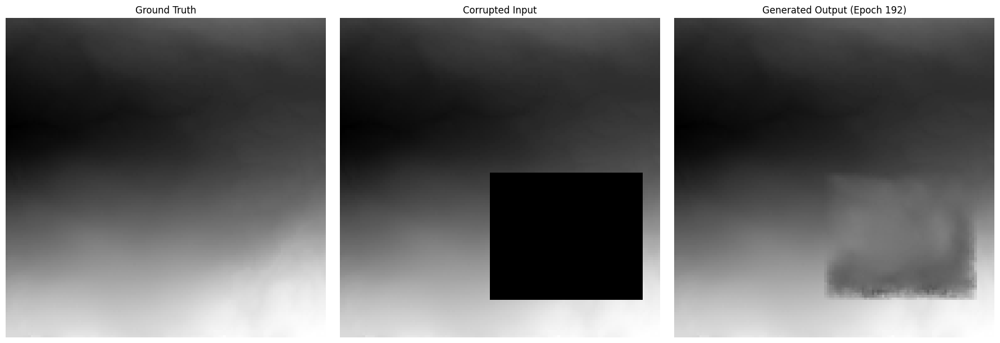

Epoch 193/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

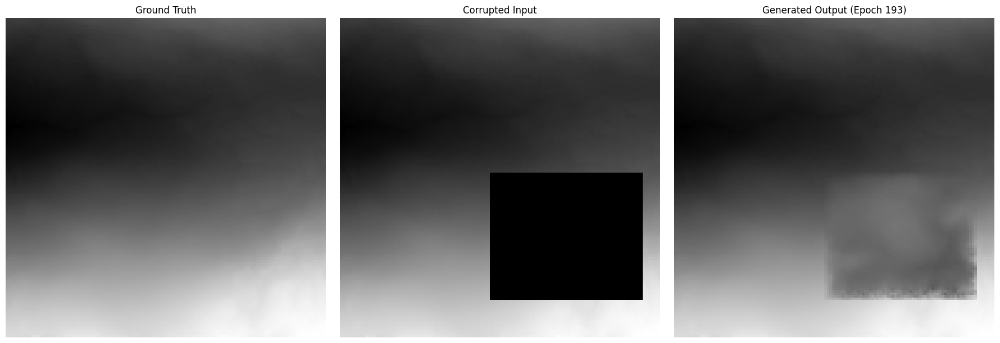

Epoch 194/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

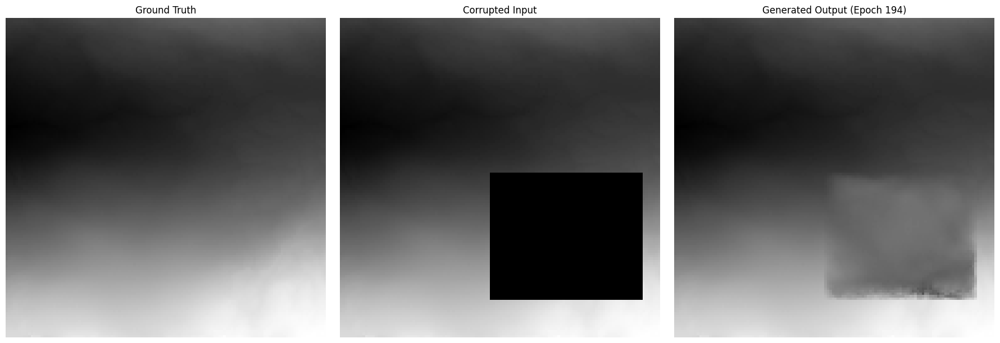

Epoch 195/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

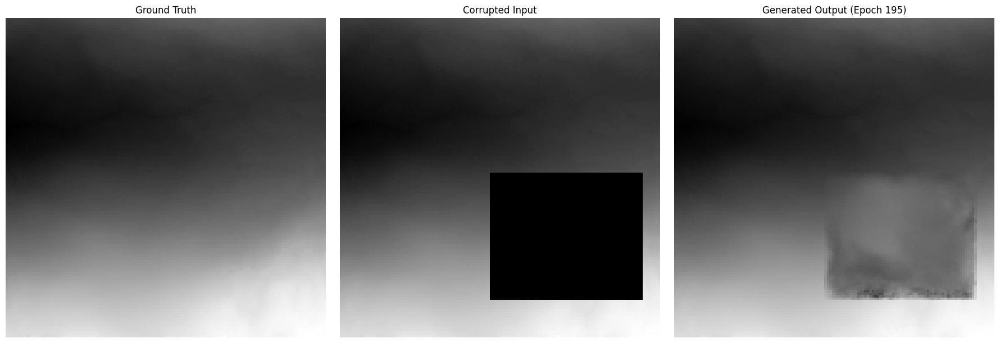

Epoch 196/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

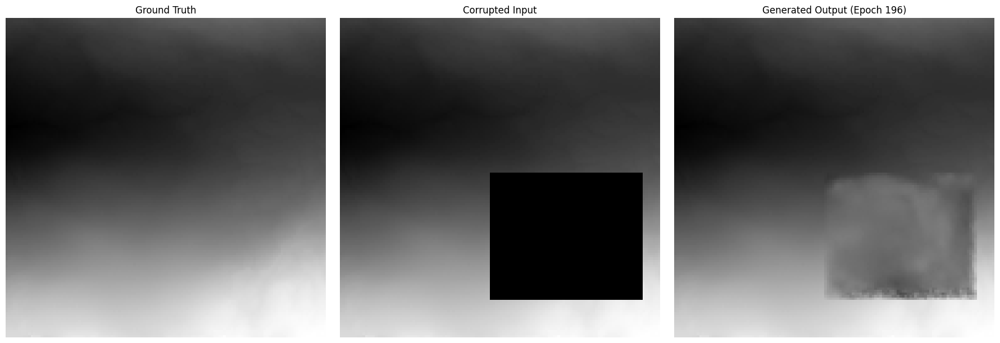

Epoch 197/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

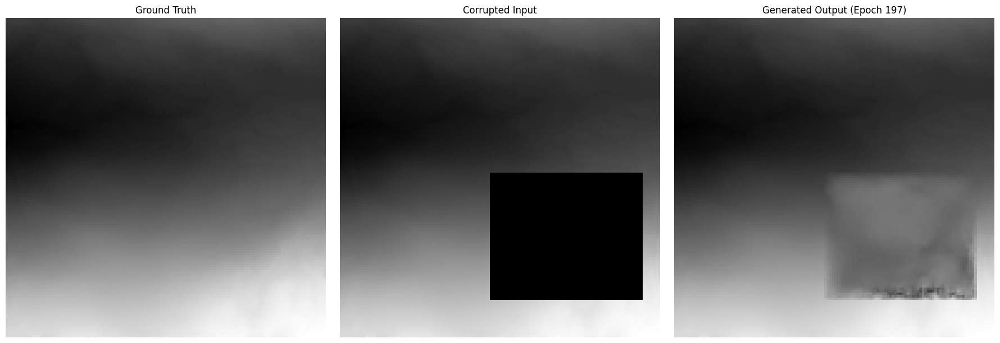

Epoch 198/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

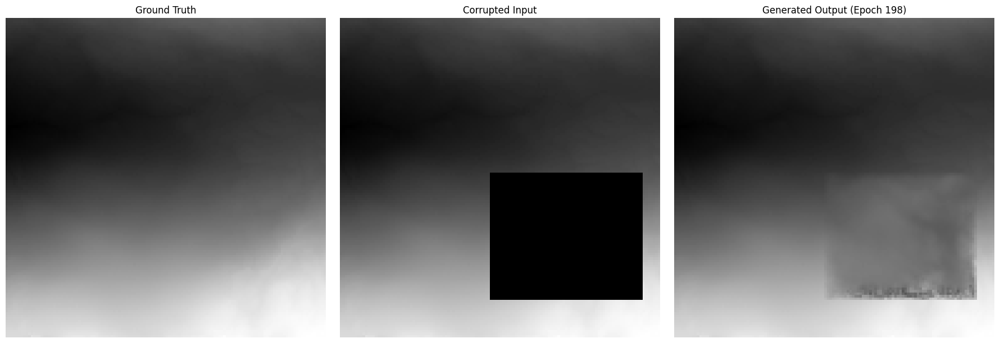

Epoch 199/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

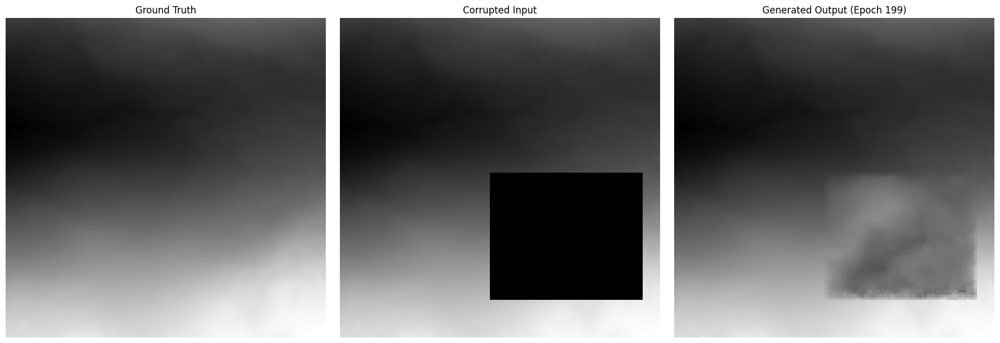

Epoch 200/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

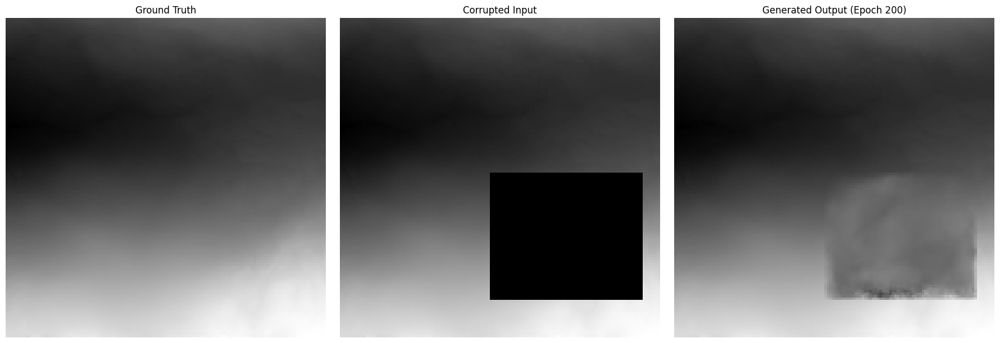

Epoch 201/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

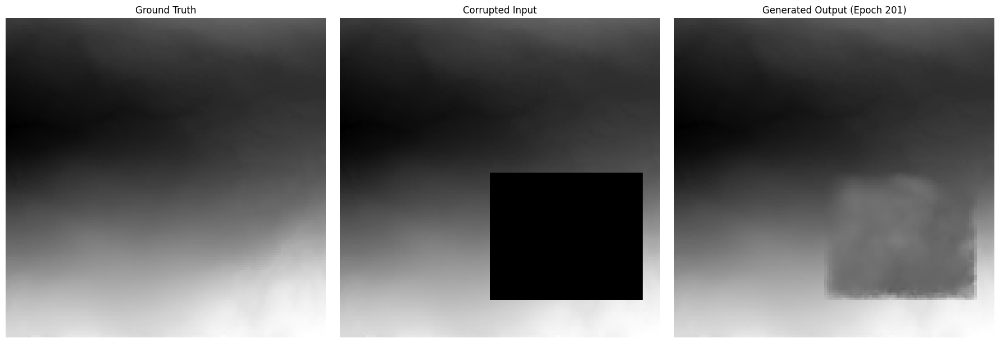

Epoch 202/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

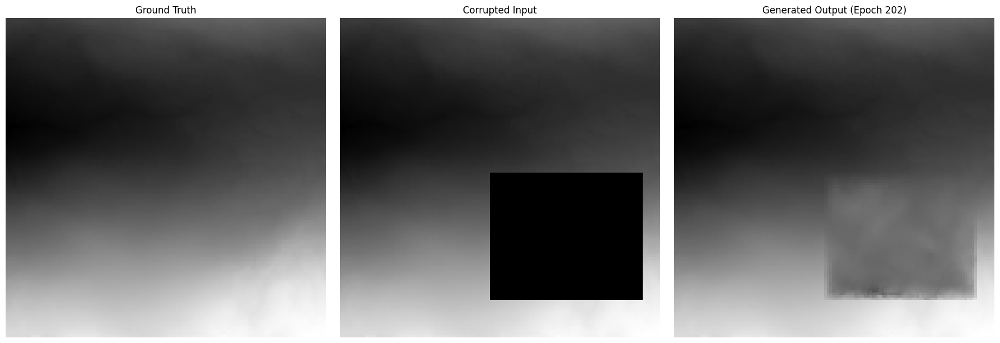

Epoch 203/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

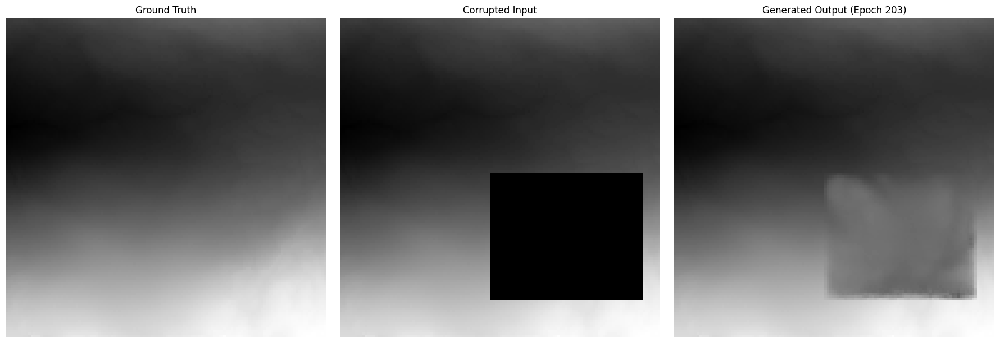

Epoch 204/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

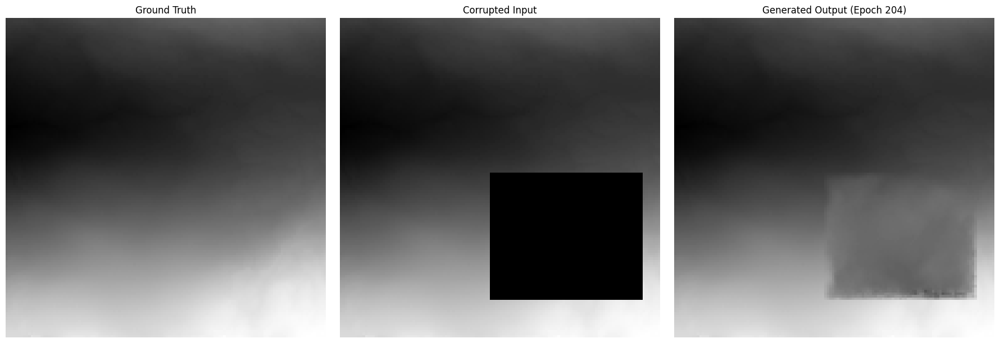

Epoch 205/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

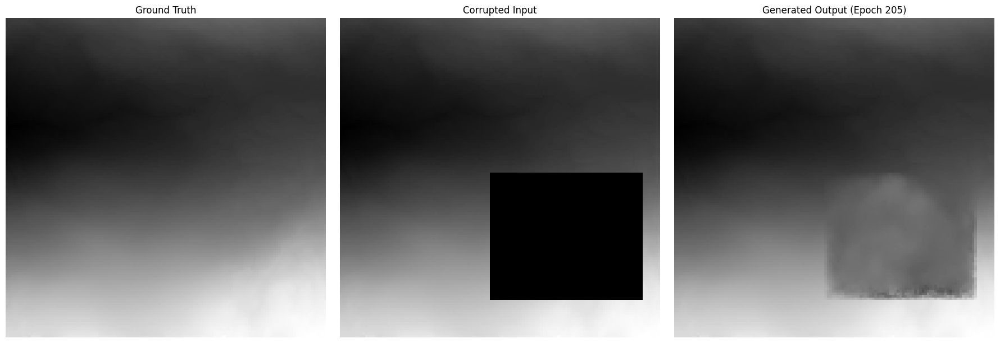

Epoch 206/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

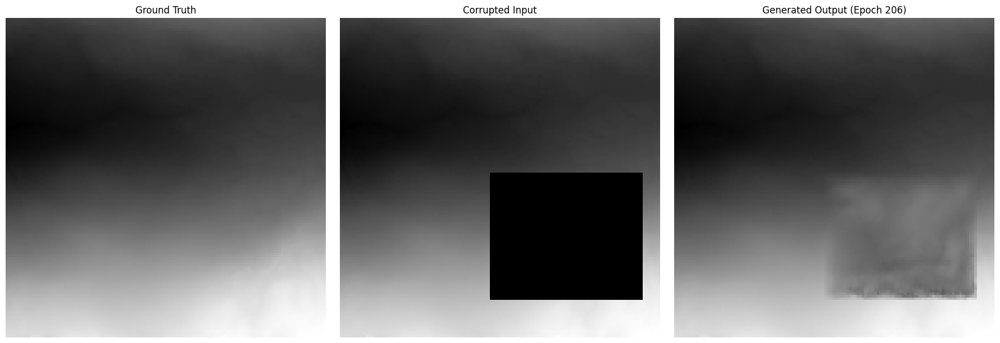

Epoch 207/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

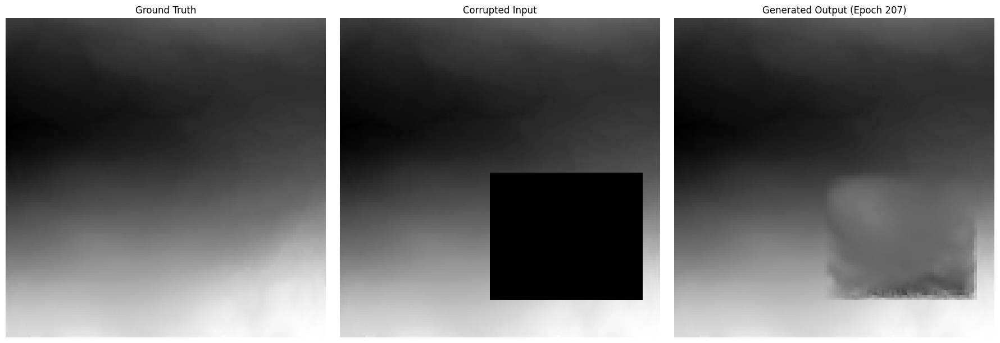

Epoch 208/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

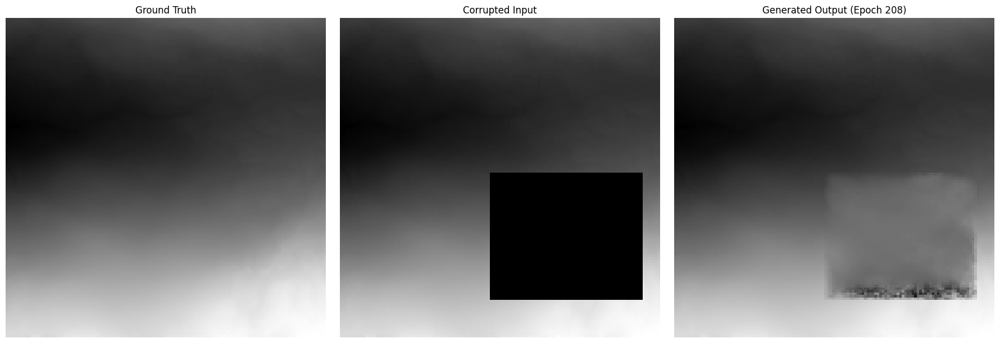

Epoch 209/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

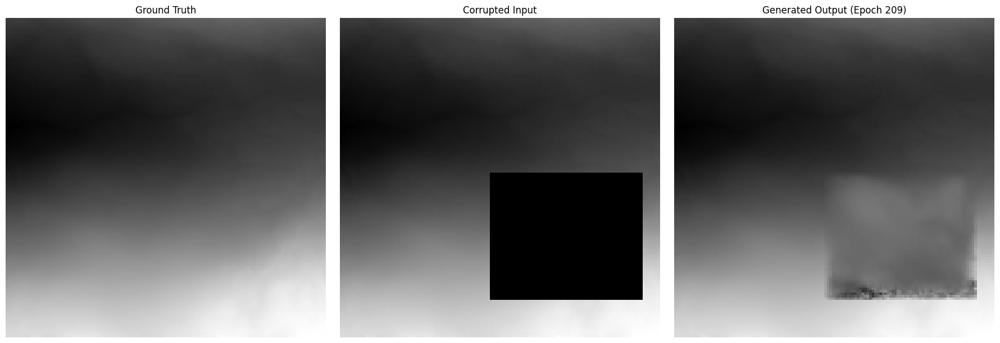

Epoch 210/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

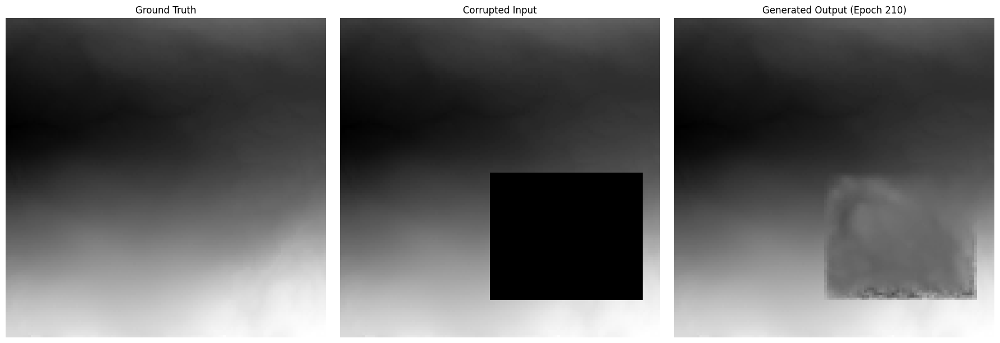

Epoch 211/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

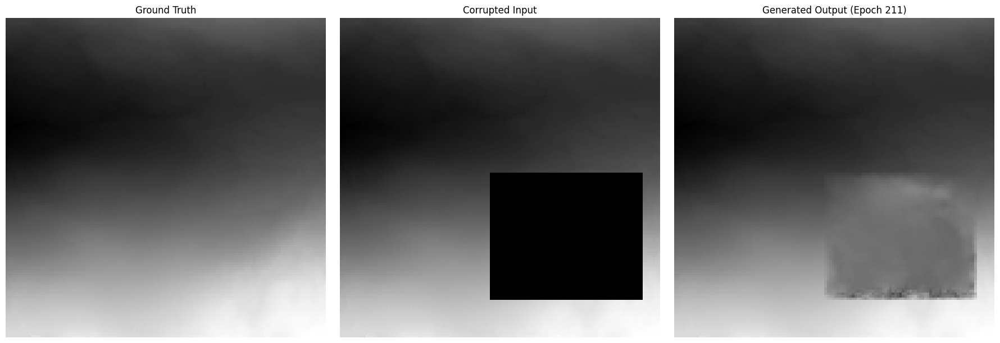

Epoch 212/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

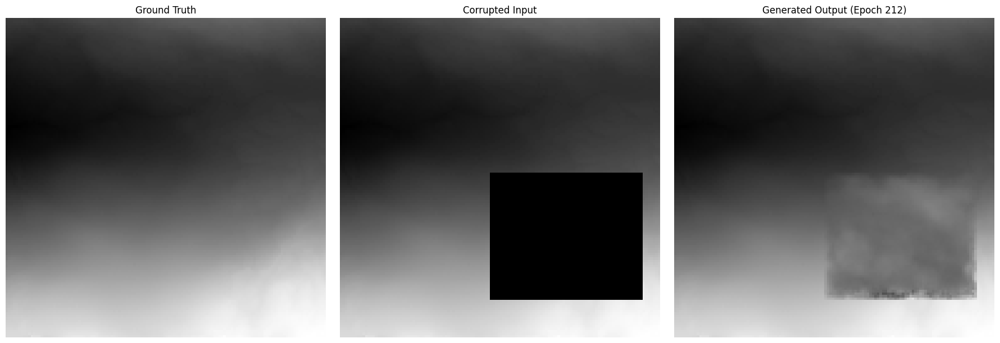

Epoch 213/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

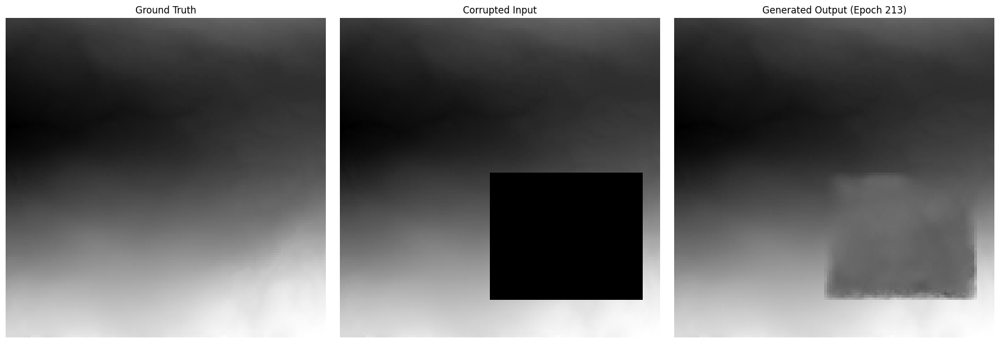

Epoch 214/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

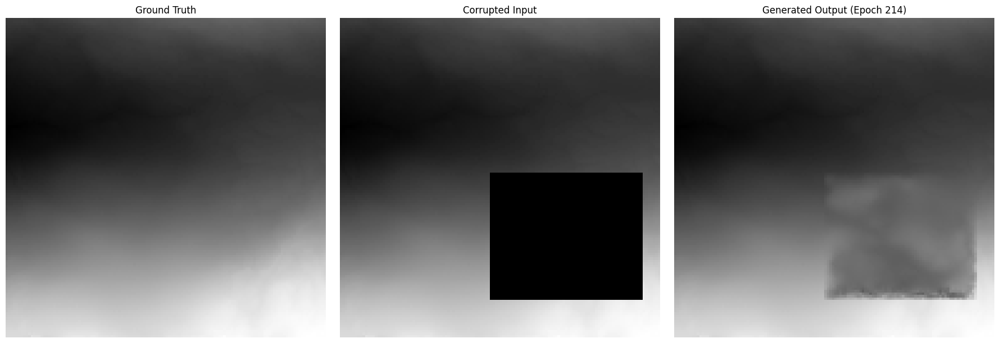

Epoch 215/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

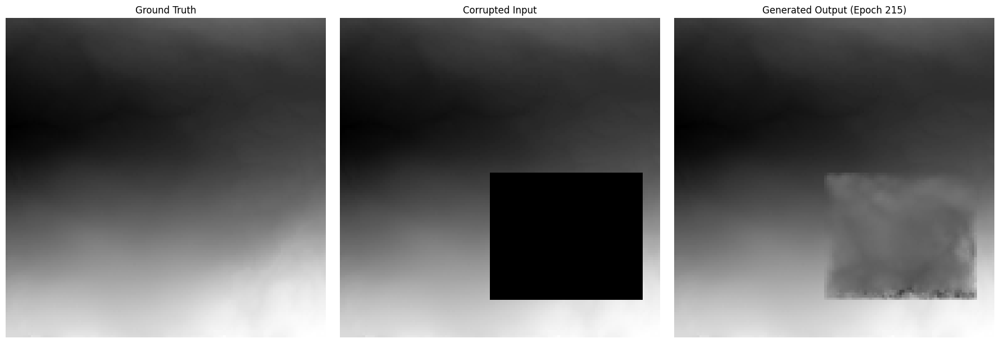

Epoch 216/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

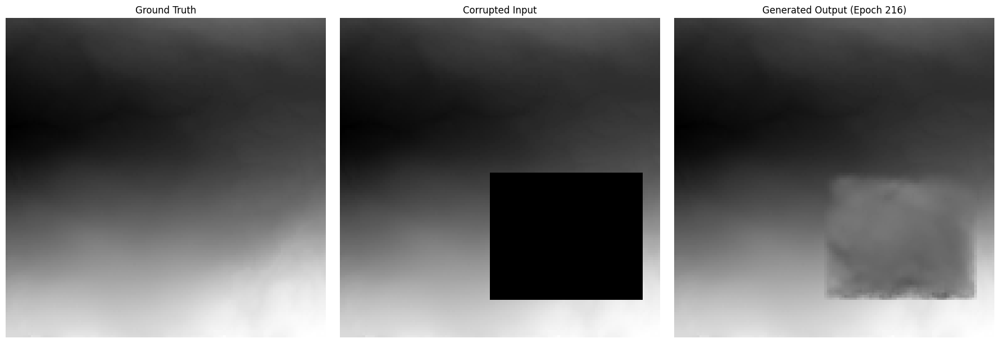

Epoch 217/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

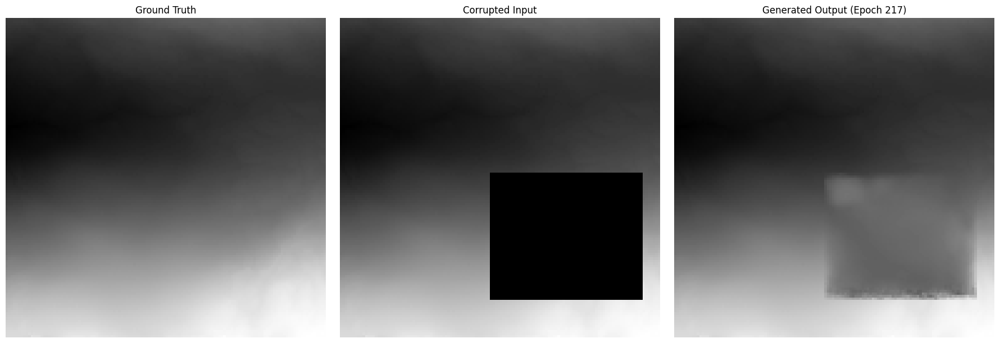

Epoch 218/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

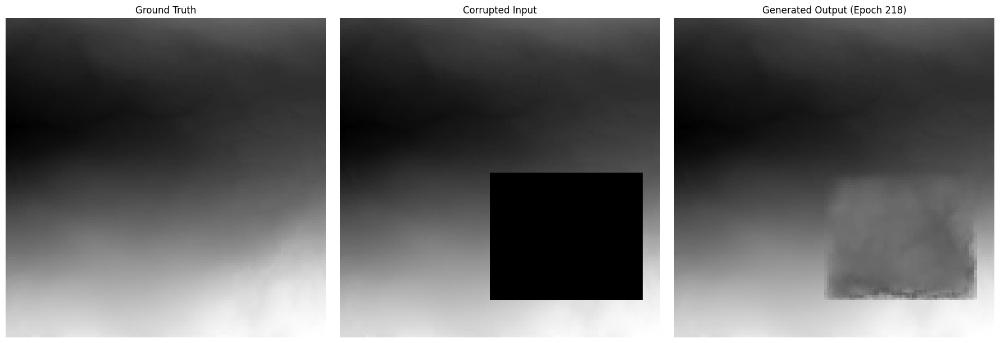

Epoch 219/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

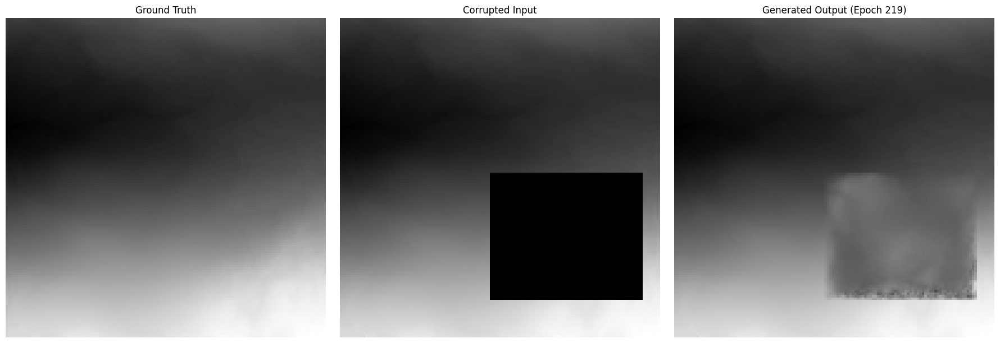

Epoch 220/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

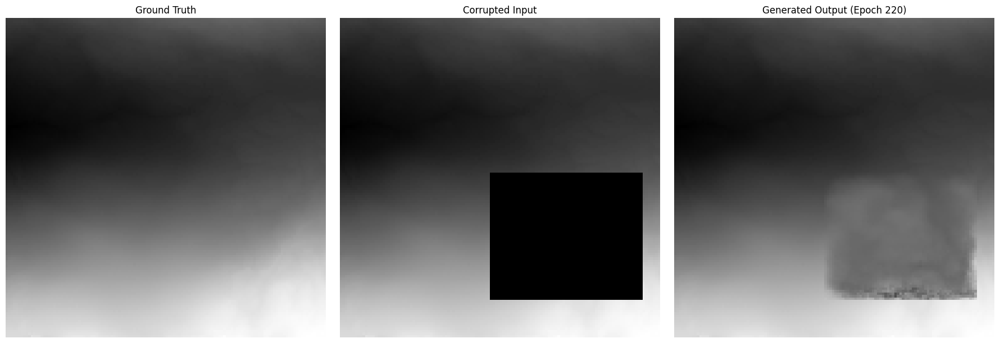

Epoch 221/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

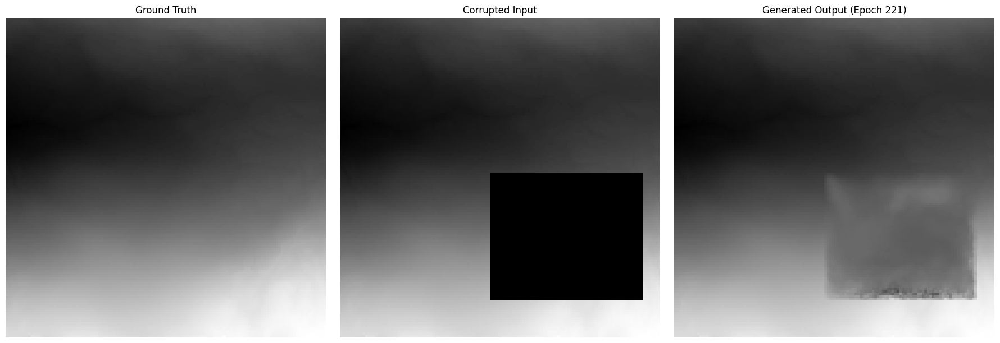

Epoch 222/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

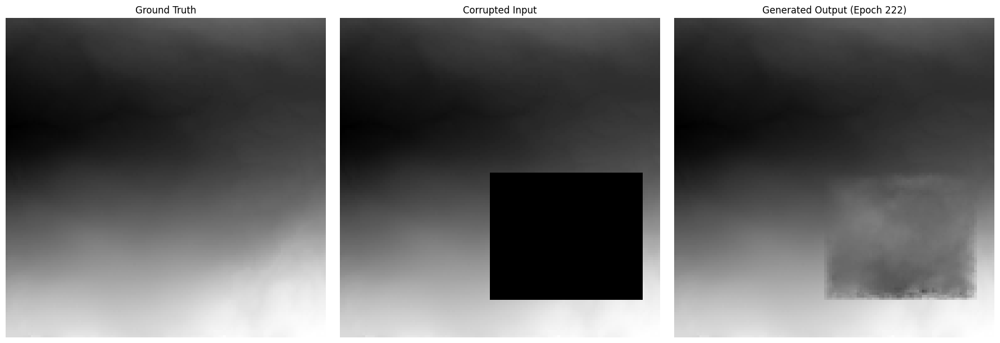

Epoch 223/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

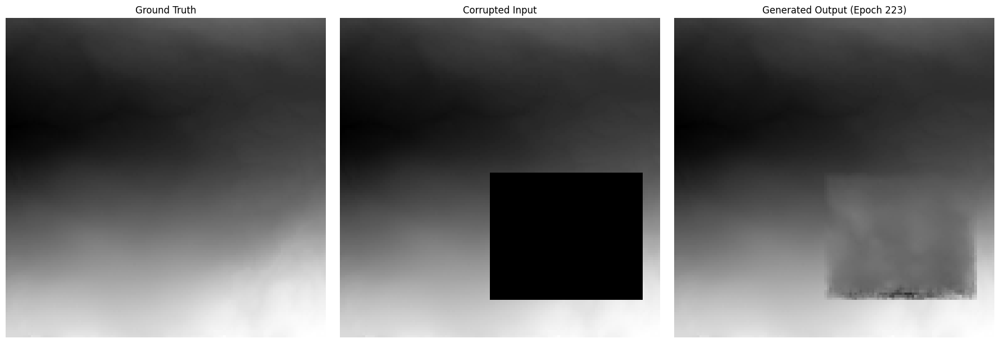

Epoch 224/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

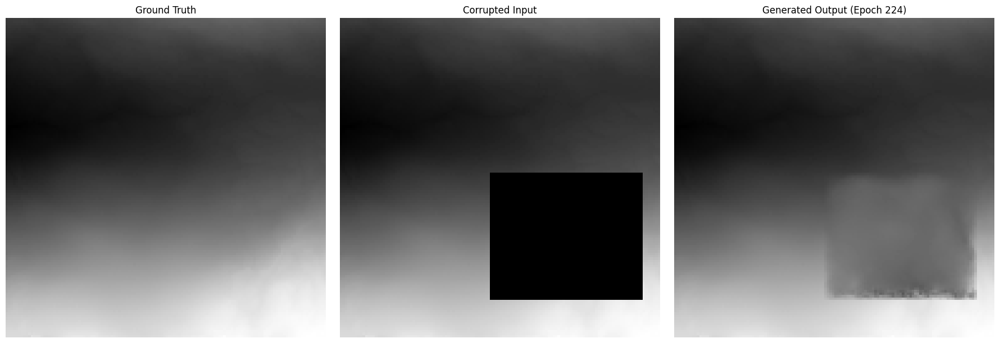

Epoch 225/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

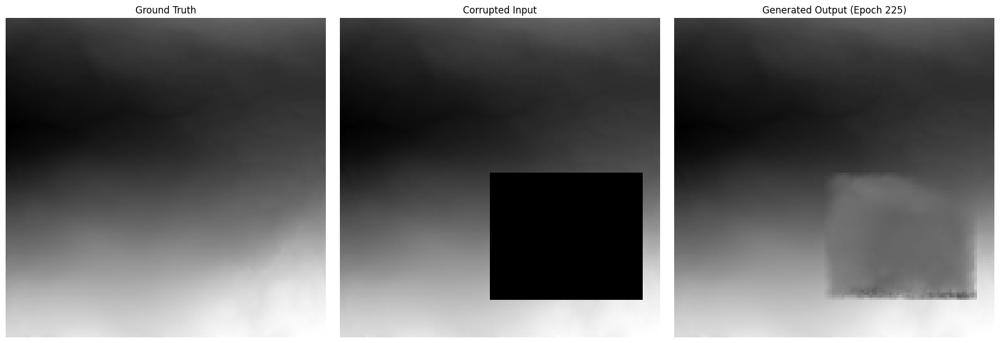

Epoch 226/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

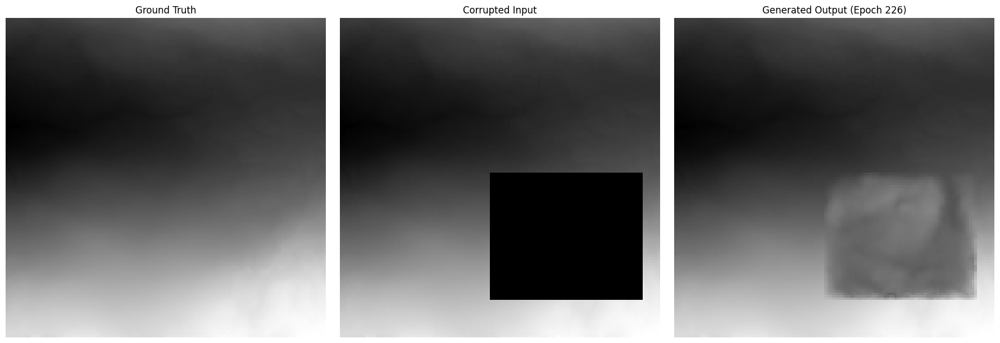

Epoch 227/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

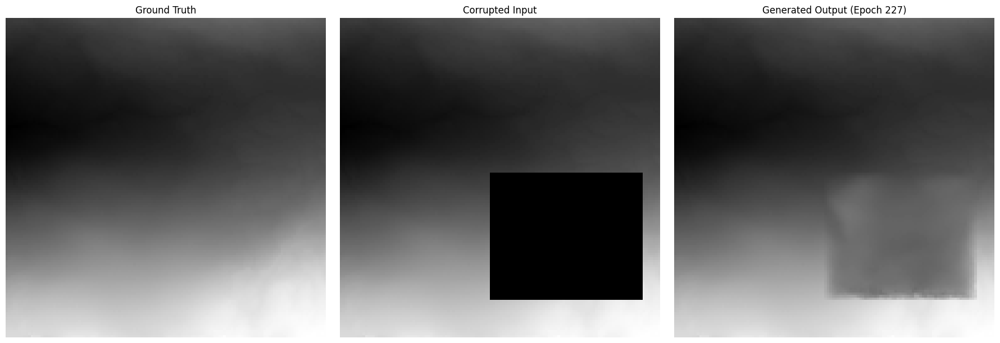

Epoch 228/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

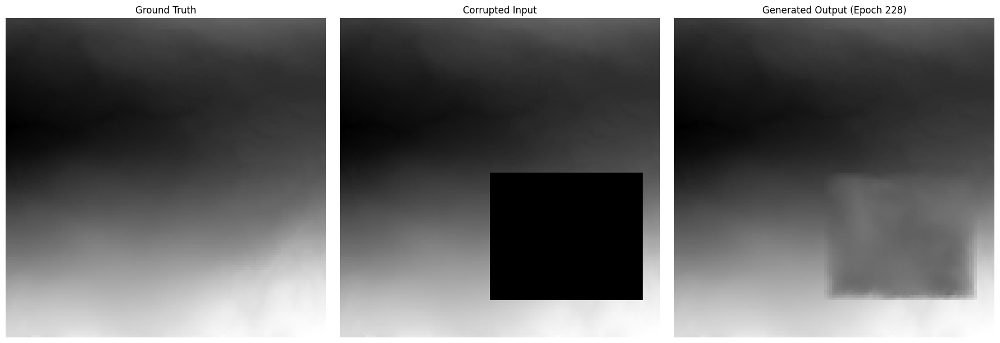

Epoch 229/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

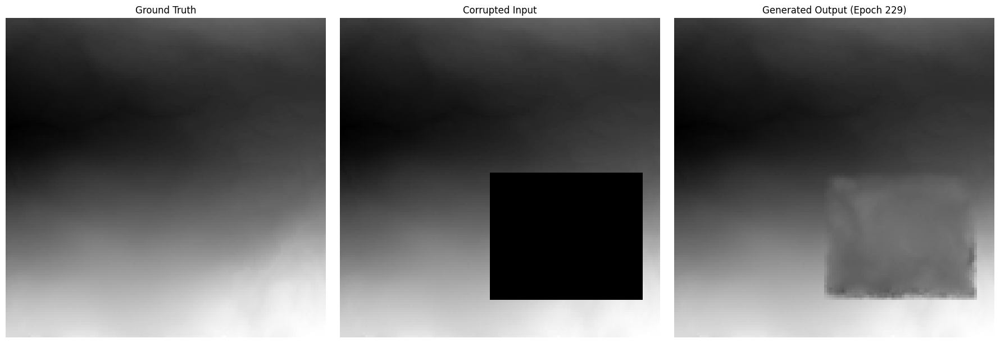

Epoch 230/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

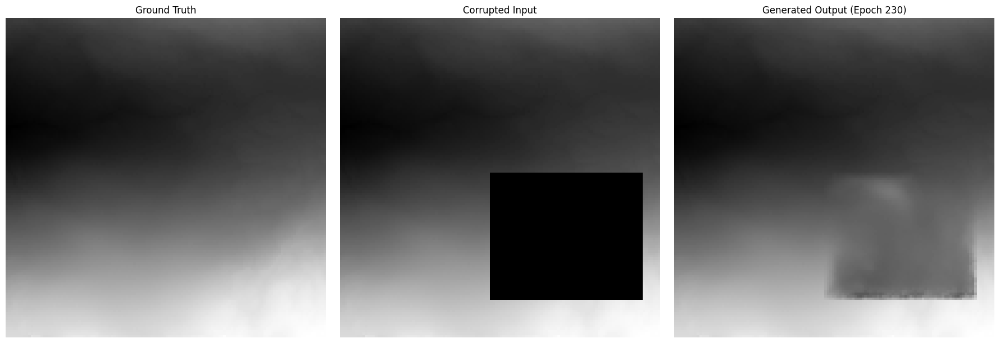

Epoch 231/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

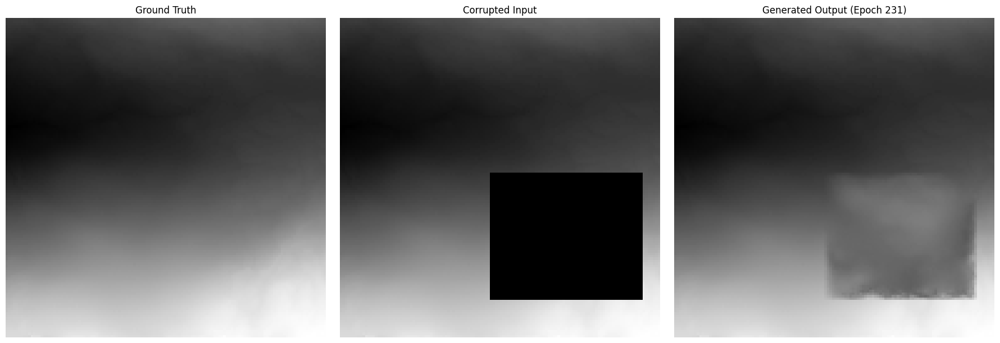

Epoch 232/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

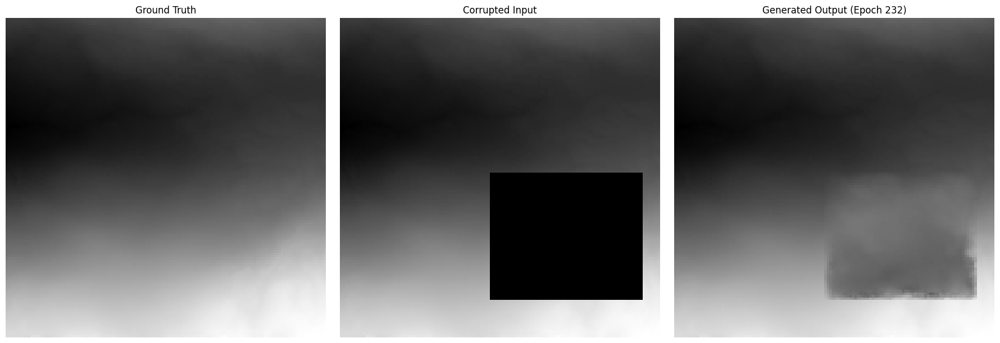

Epoch 233/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

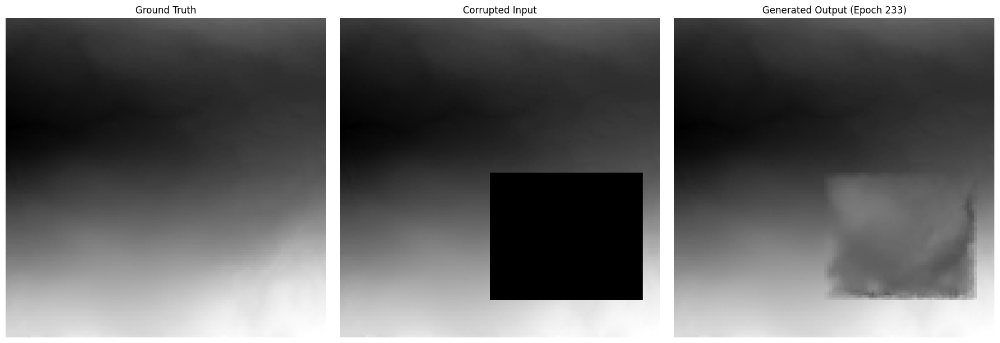

Epoch 234/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

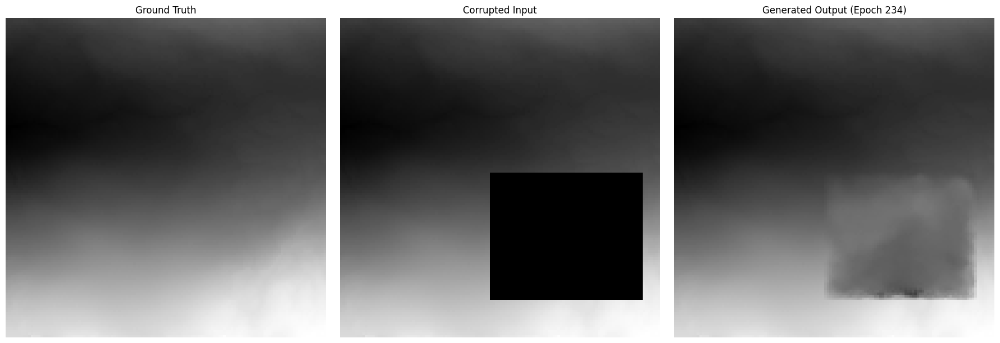

Epoch 235/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

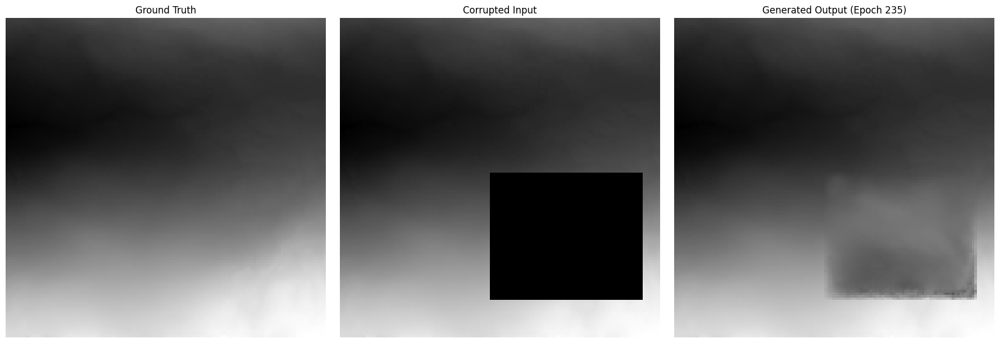

Epoch 236/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

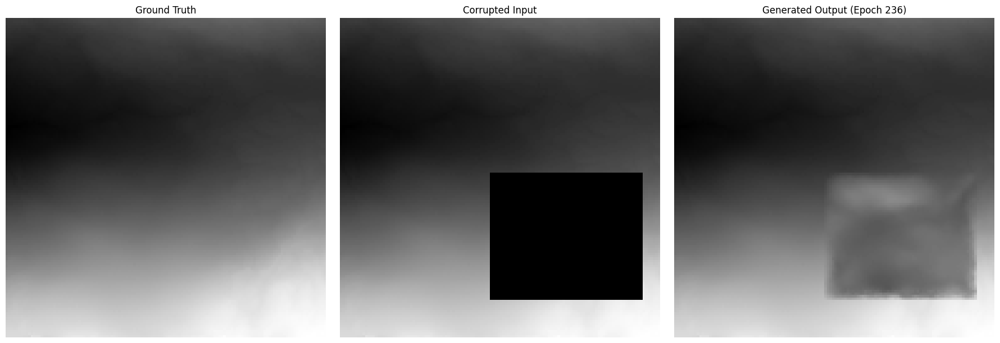

Epoch 237/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

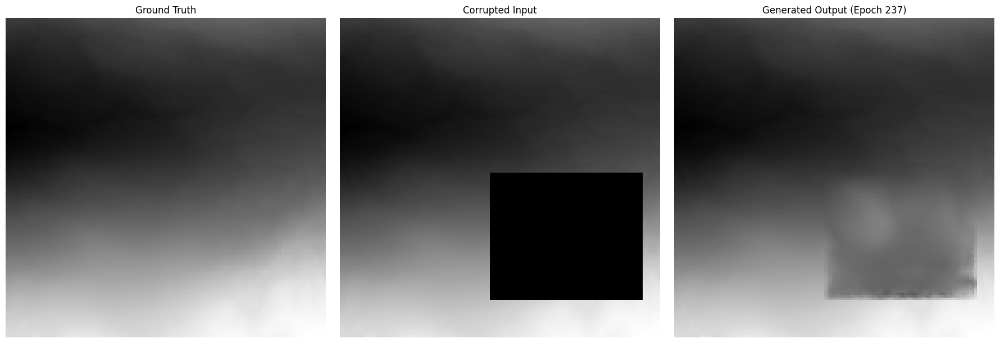

Epoch 238/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

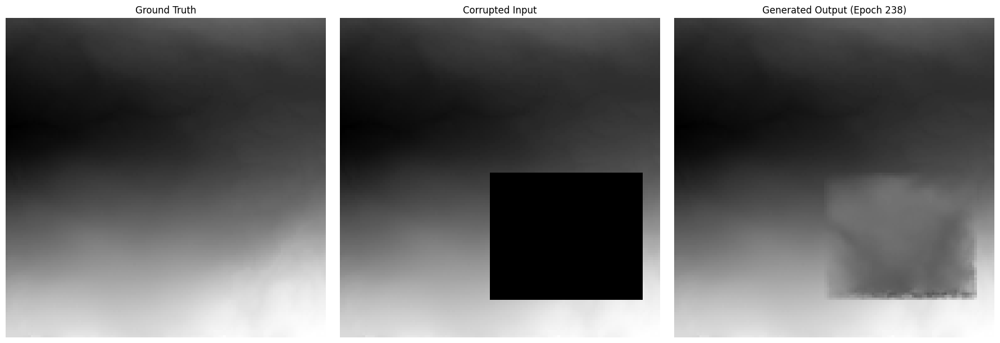

Epoch 239/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 239 with loss: 0.006502


Generating Visual: 0it [00:00, ?it/s]

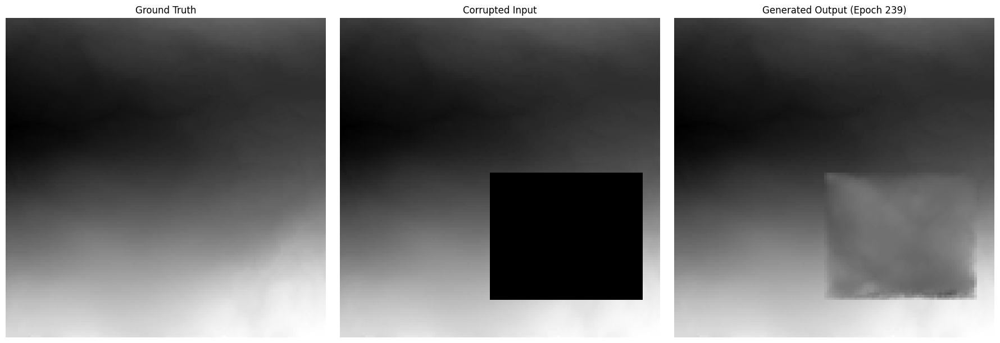

Epoch 240/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

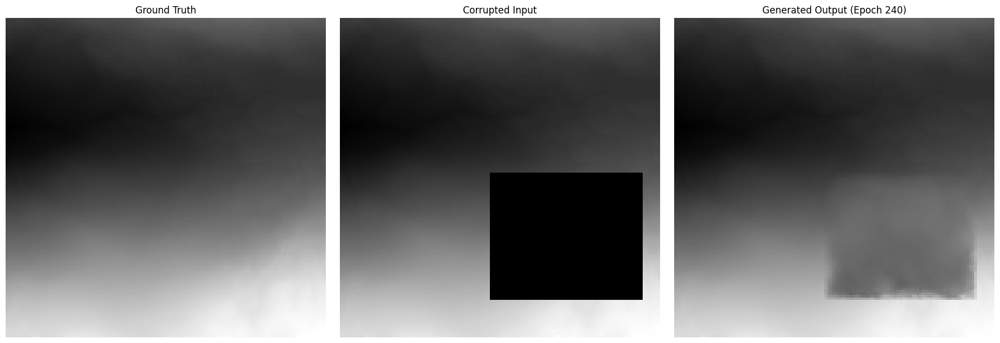

Epoch 241/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

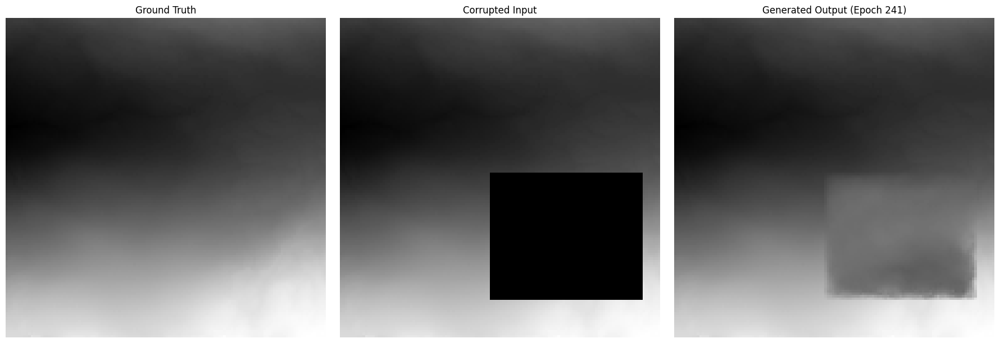

Epoch 242/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

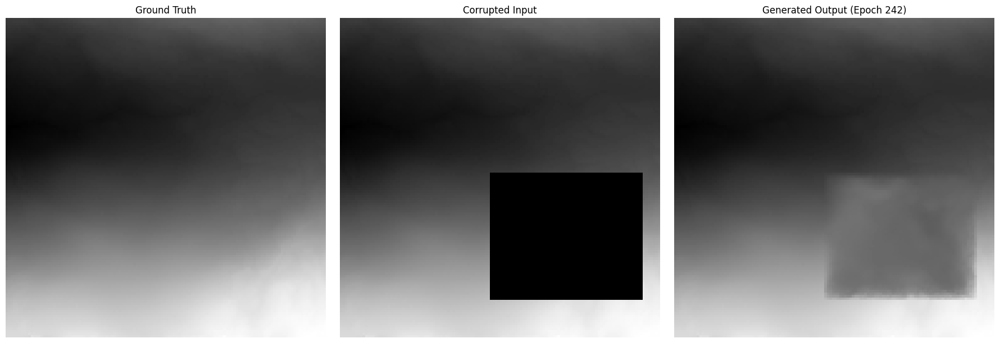

Epoch 243/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

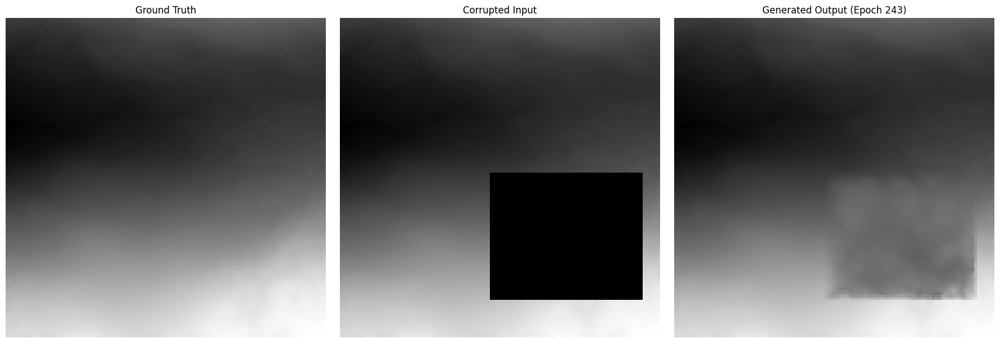

Epoch 244/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

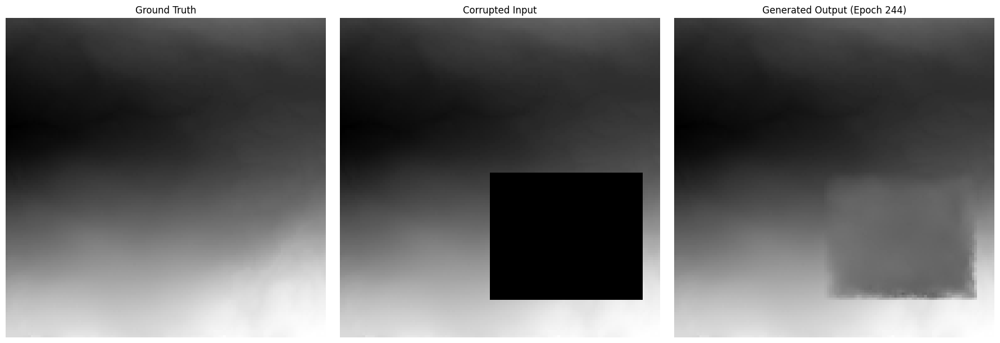

Epoch 245/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

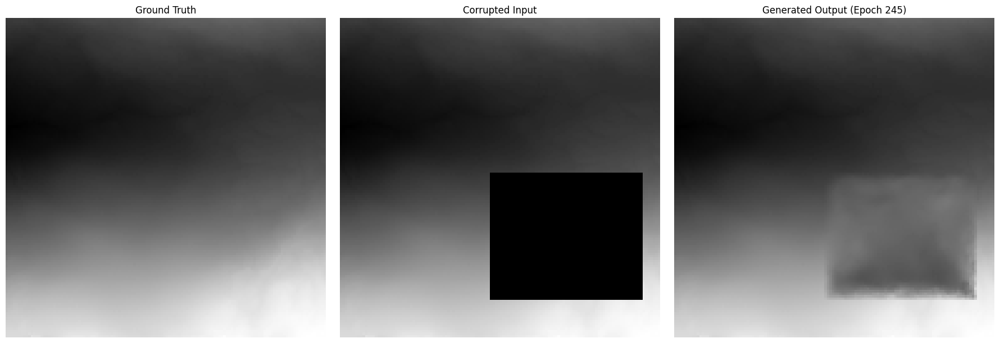

Epoch 246/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

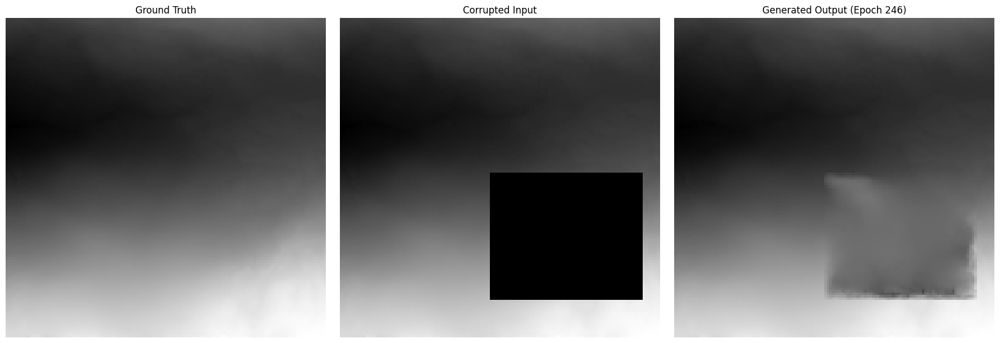

Epoch 247/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

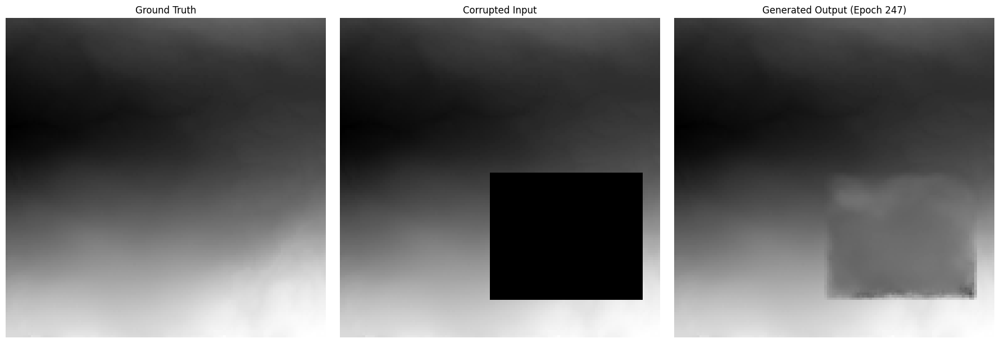

Epoch 248/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

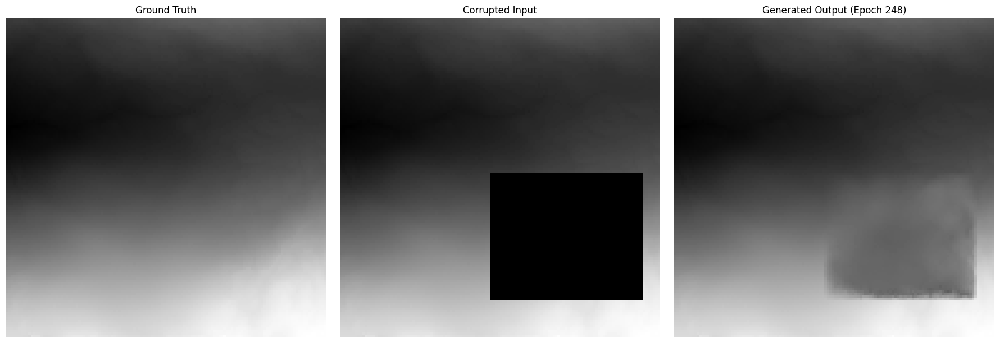

Epoch 249/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

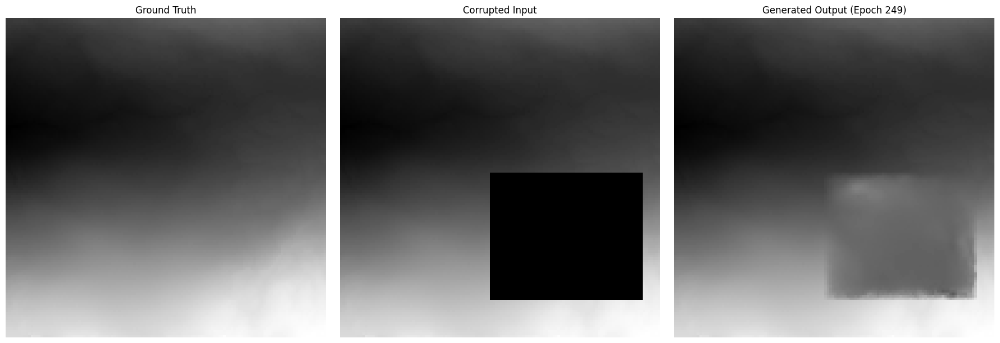

Epoch 250/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

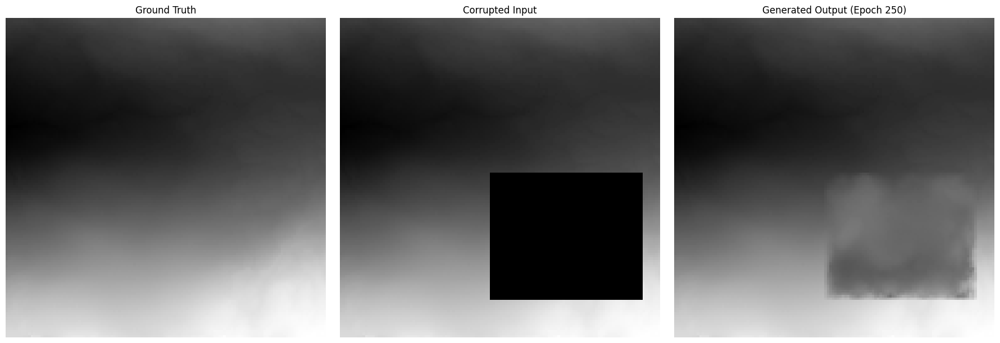

Epoch 251/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

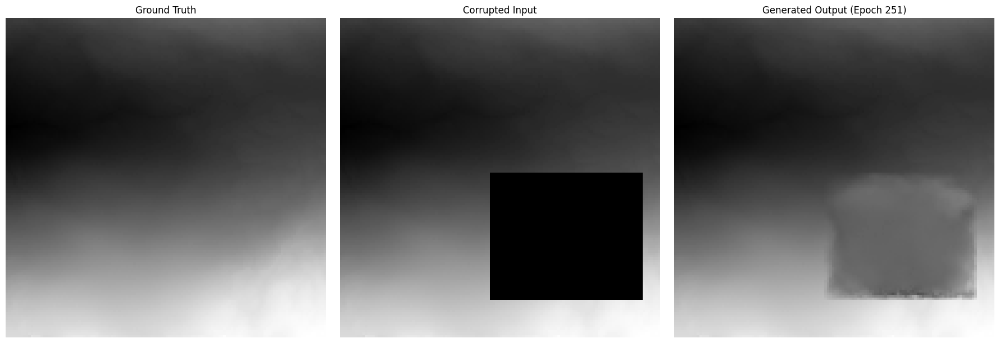

Epoch 252/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

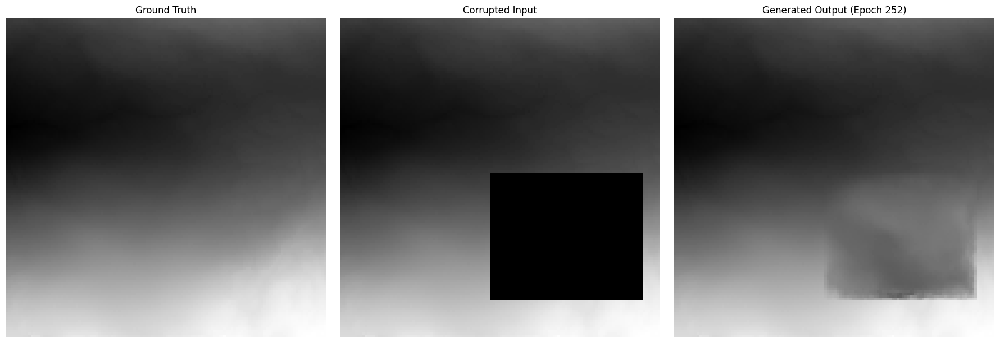

Epoch 253/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

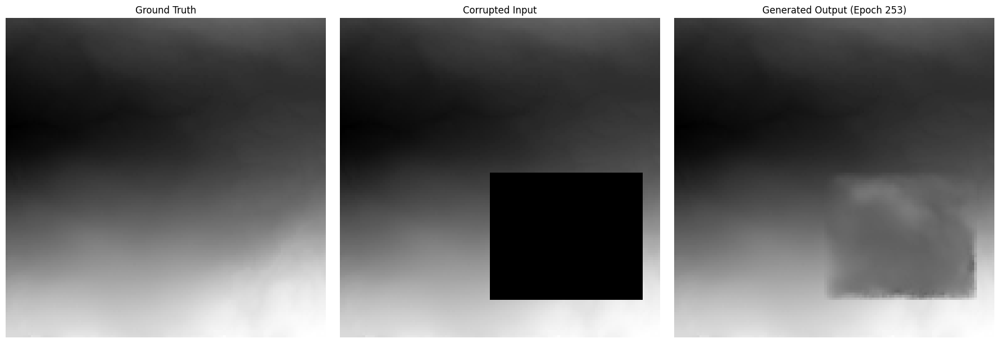

Epoch 254/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

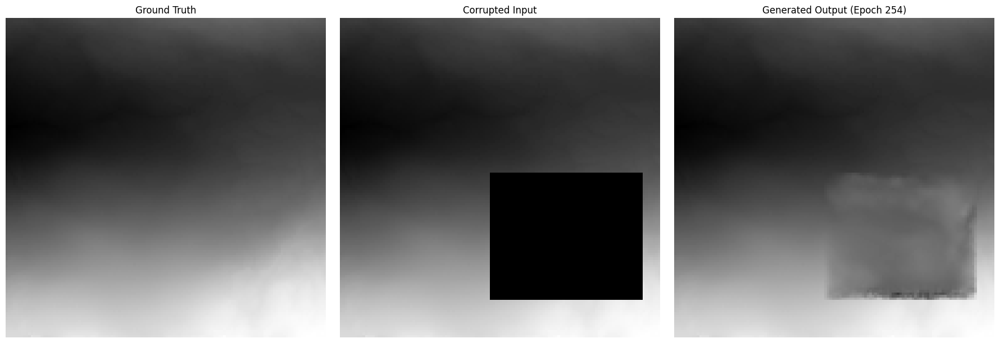

Epoch 255/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

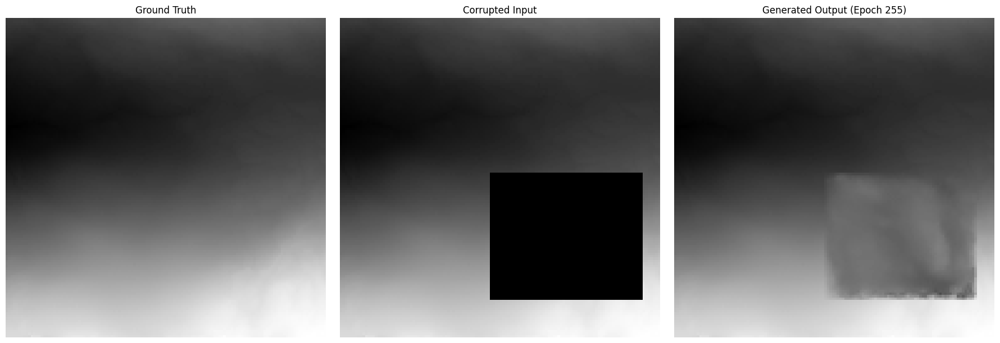

Epoch 256/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

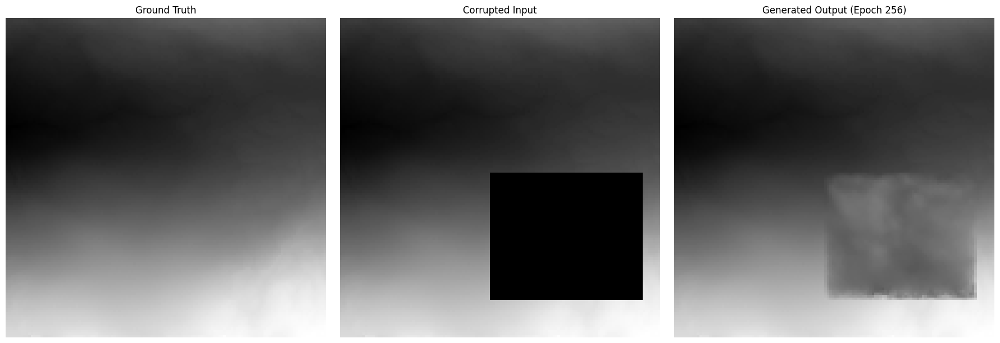

Epoch 257/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

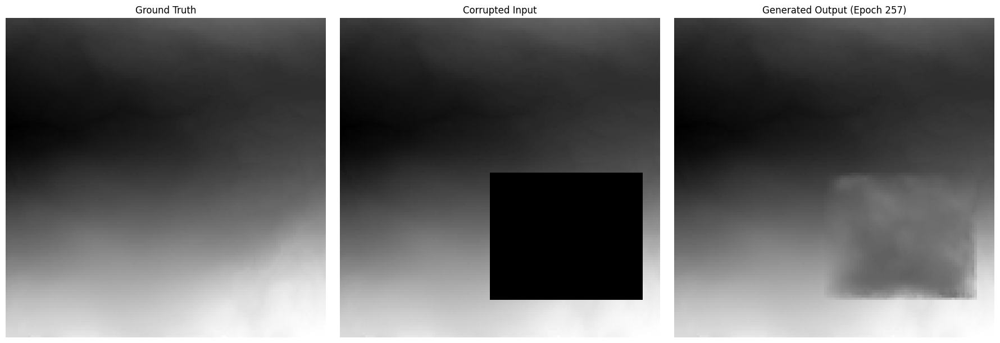

Epoch 258/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

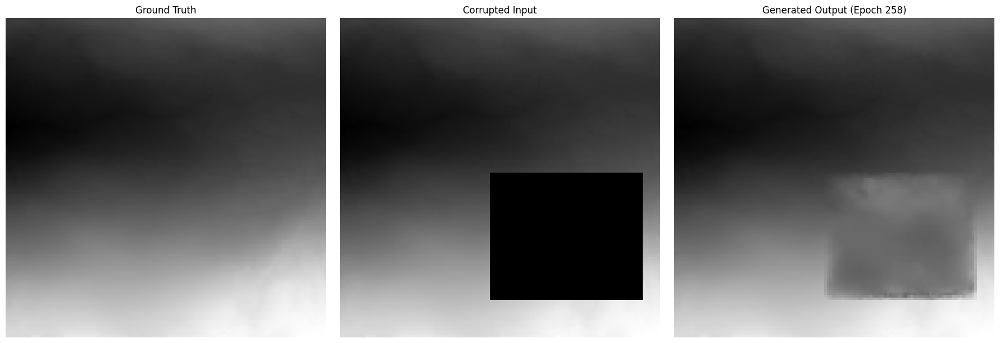

Epoch 259/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

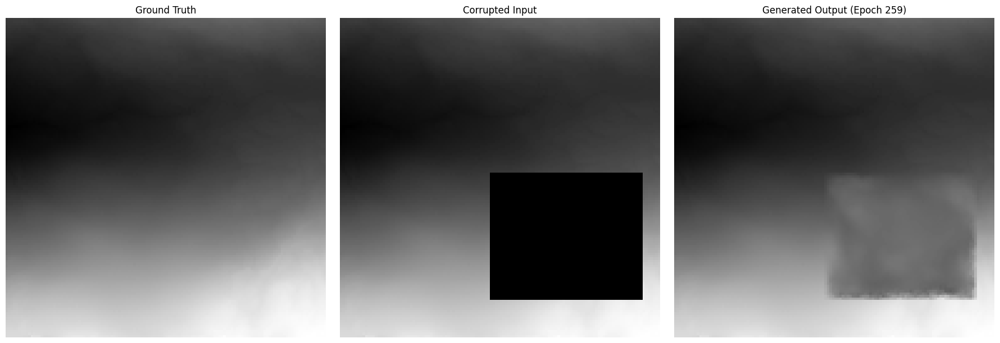

Epoch 260/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

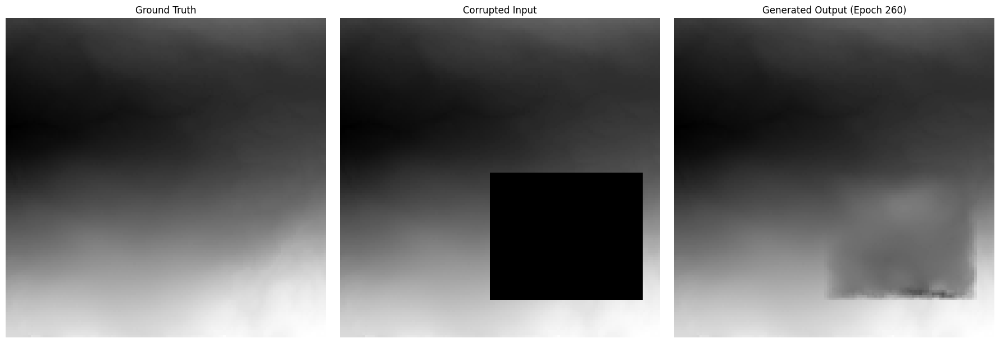

Epoch 261/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

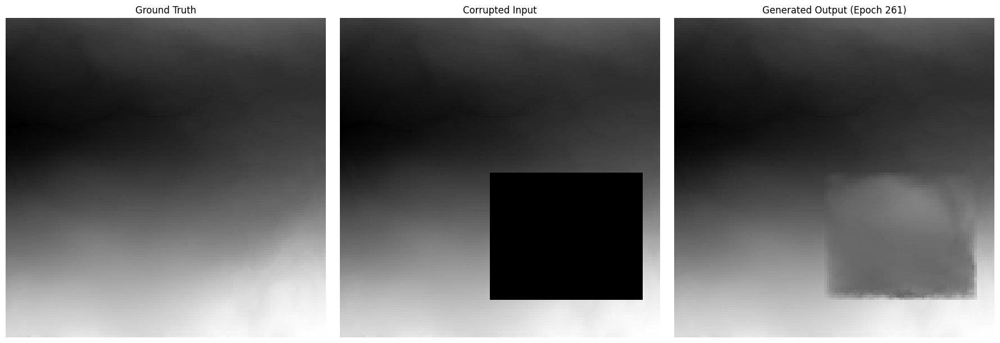

Epoch 262/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

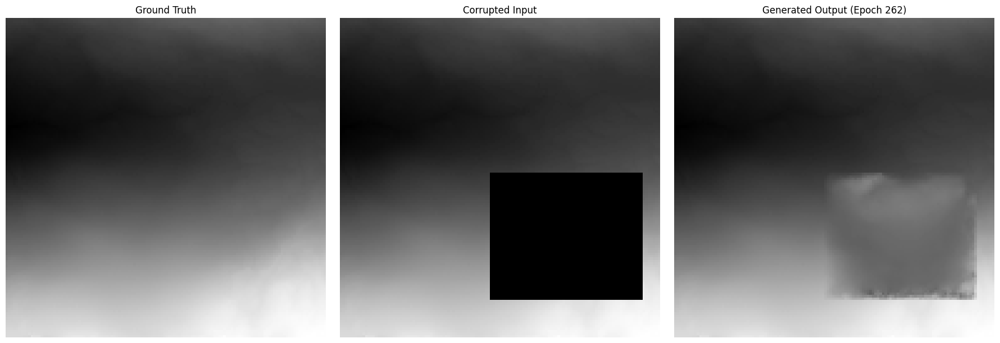

Epoch 263/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

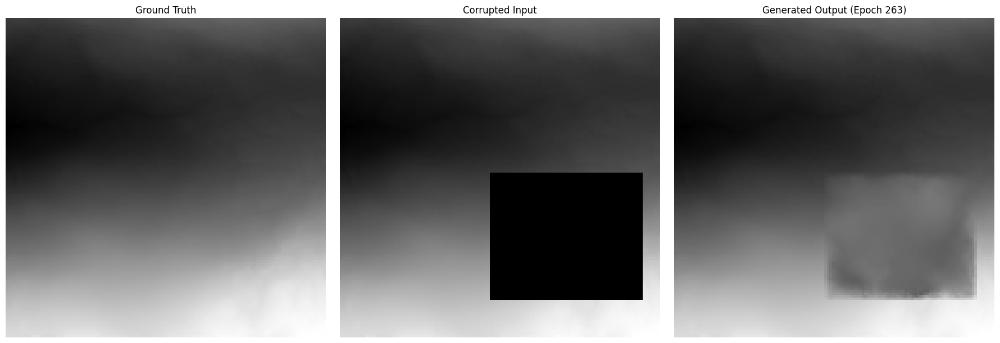

Epoch 264/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

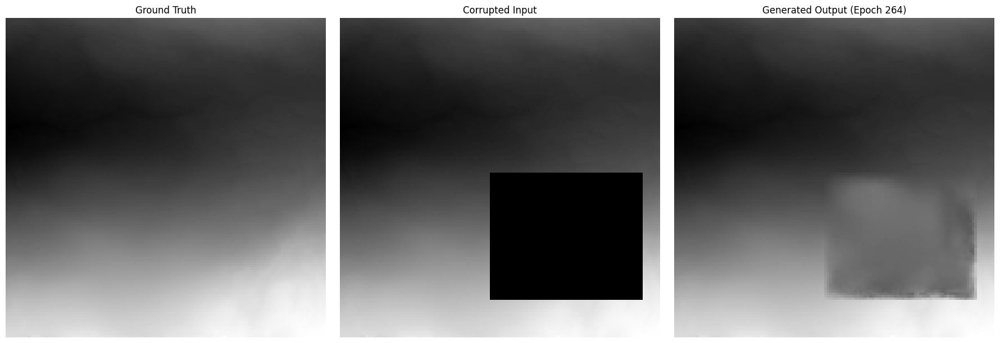

Epoch 265/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

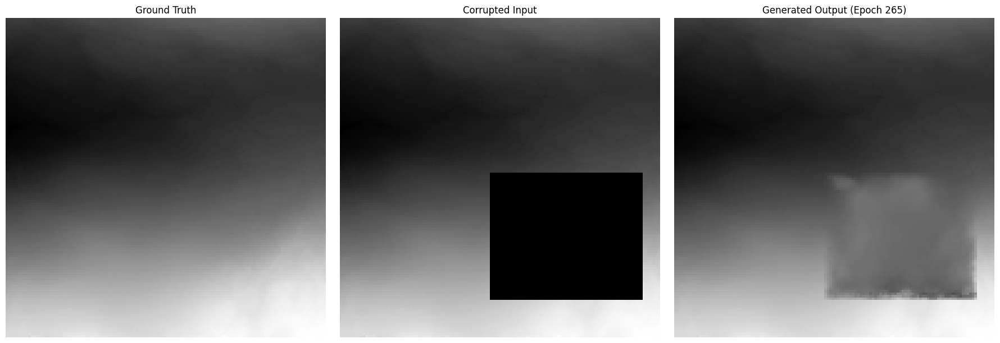

Epoch 266/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

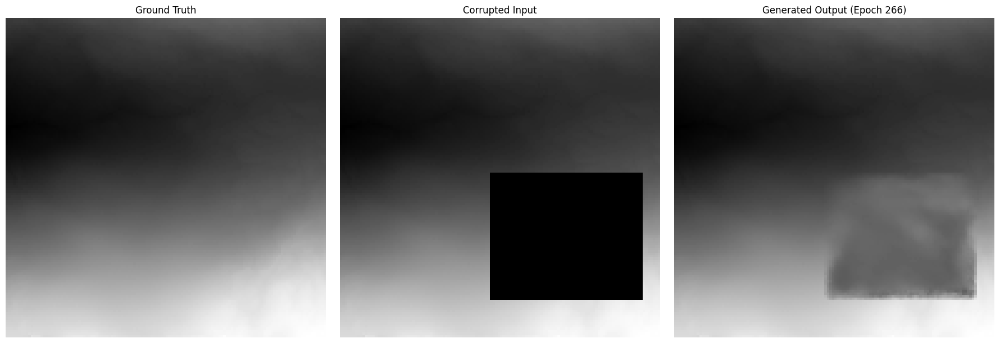

Epoch 267/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

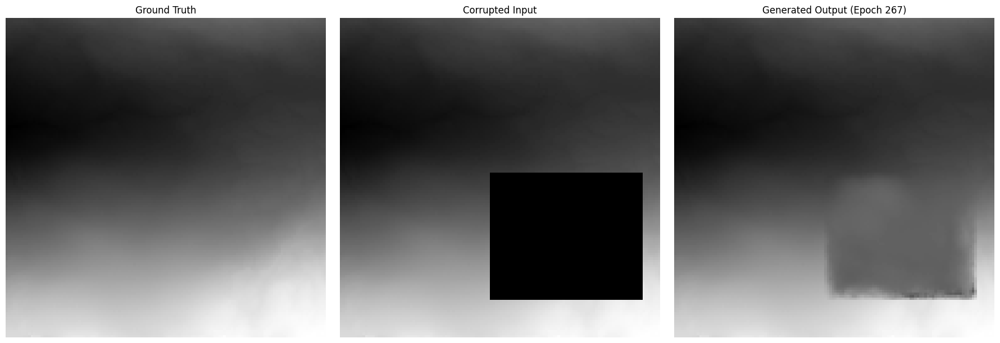

Epoch 268/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

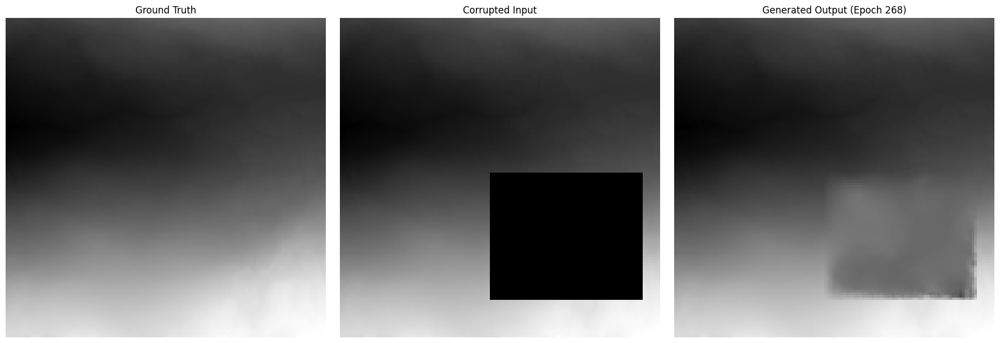

Epoch 269/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

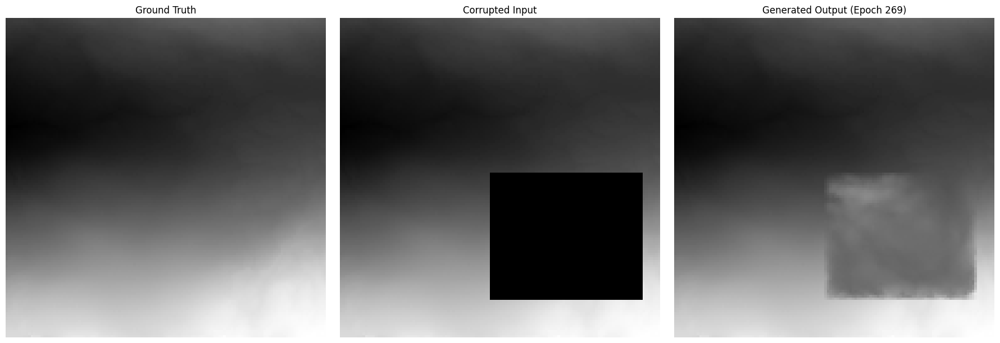

Epoch 270/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

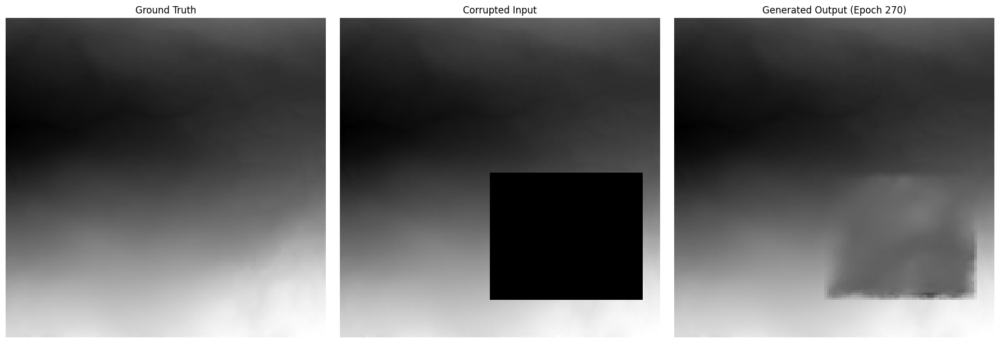

Epoch 271/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

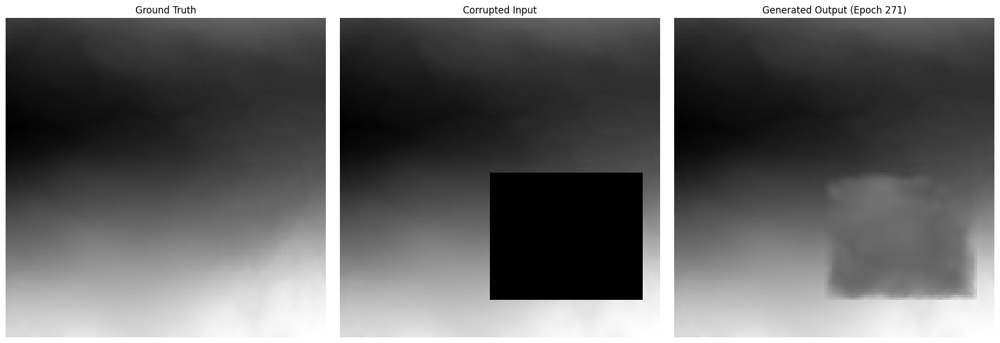

Epoch 272/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

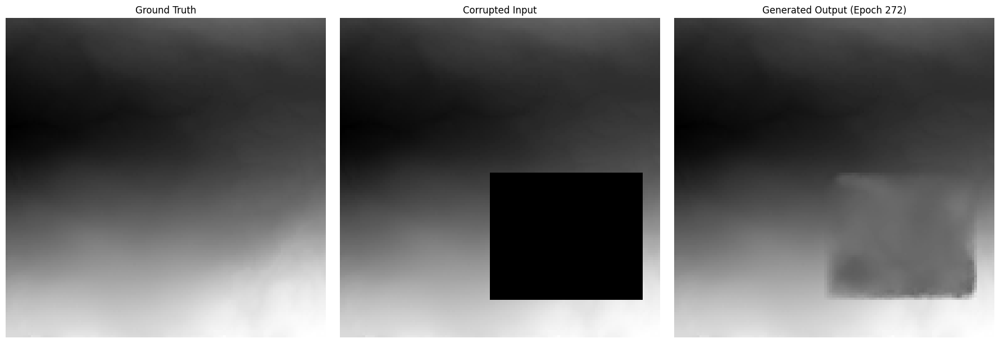

Epoch 273/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

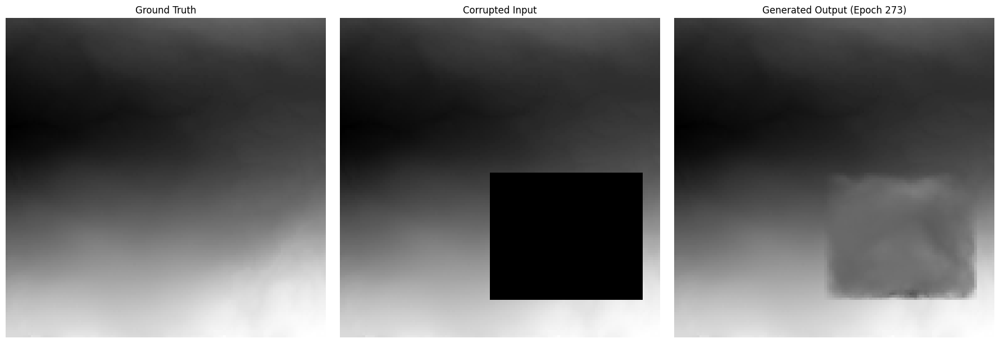

Epoch 274/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

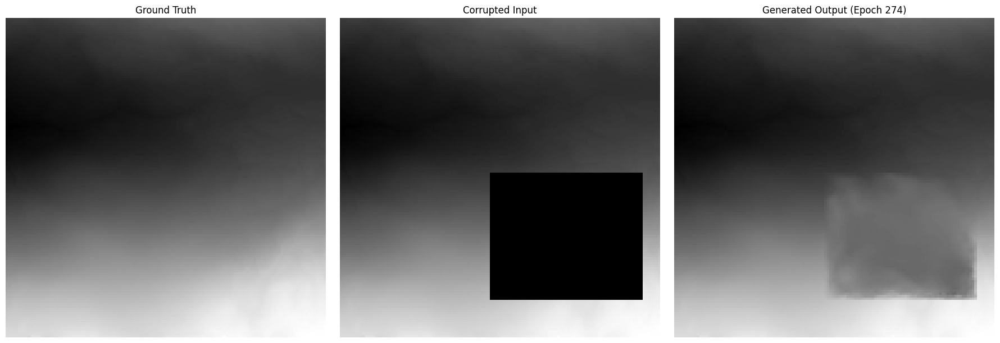

Epoch 275/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

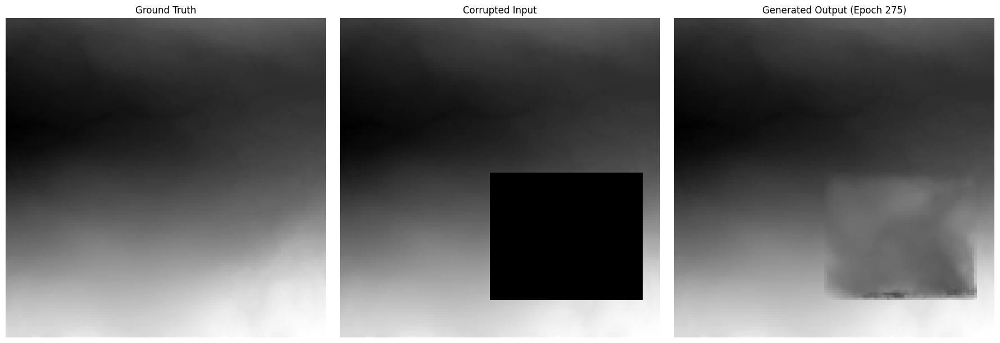

Epoch 276/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

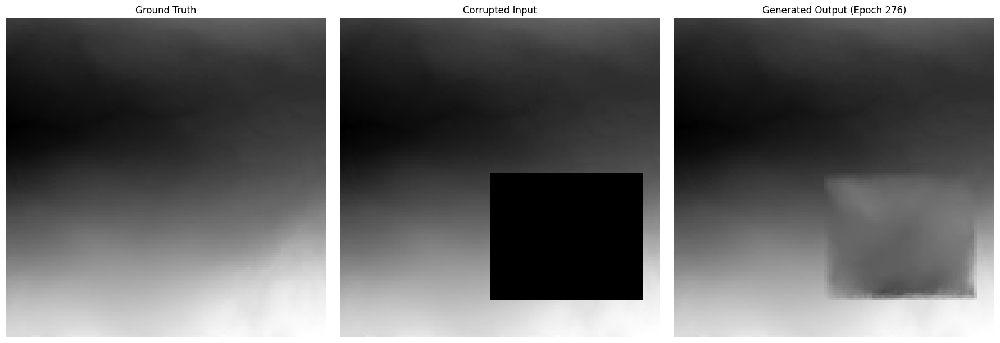

Epoch 277/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

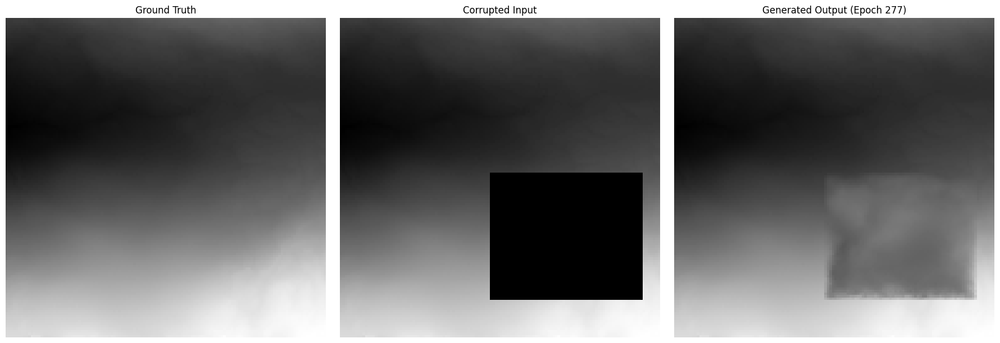

Epoch 278/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

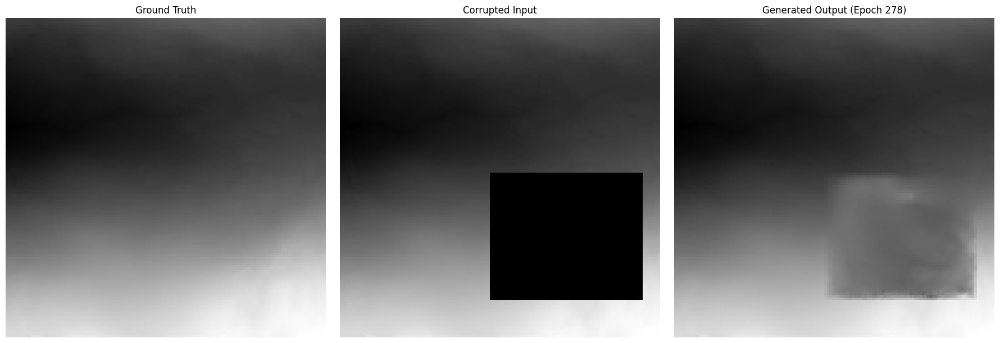

Epoch 279/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

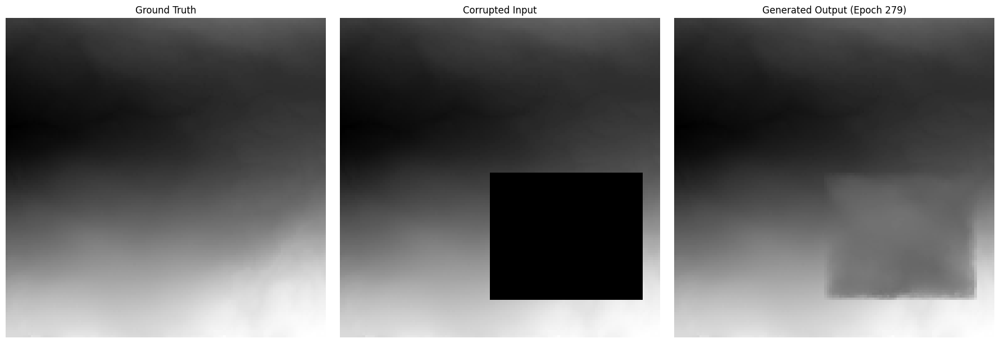

Epoch 280/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

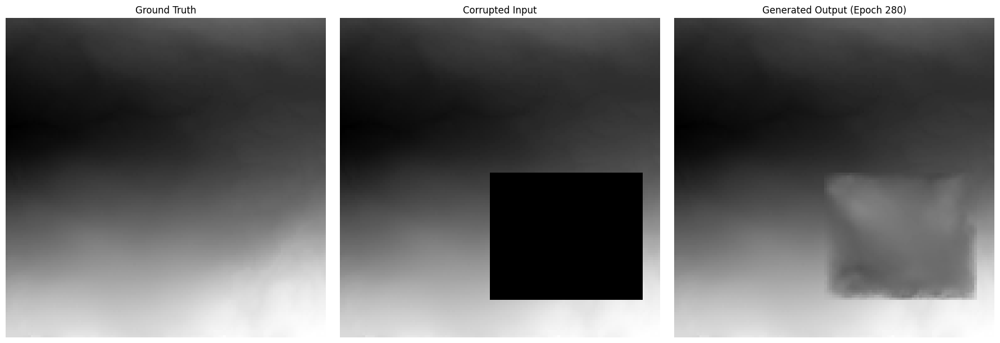

Epoch 281/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

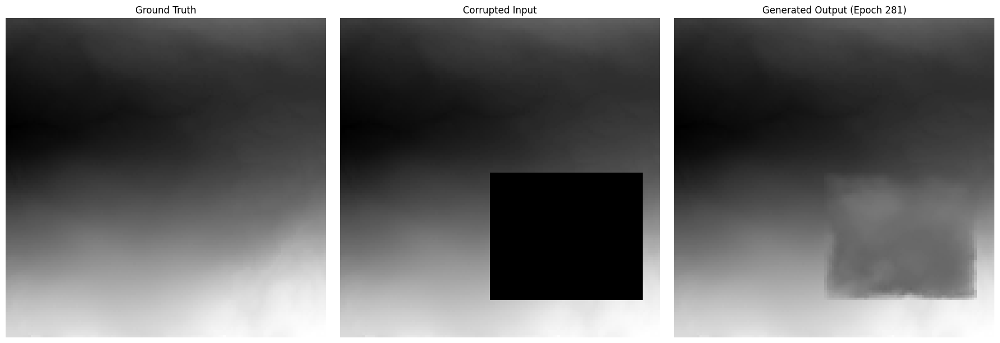

Epoch 282/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

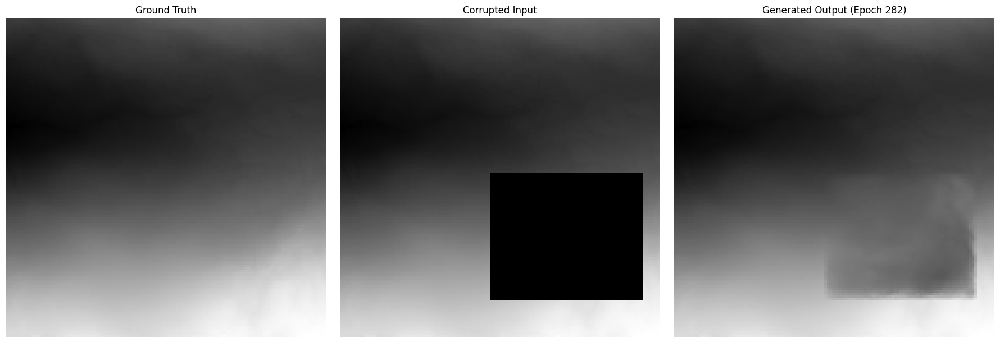

Epoch 283/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

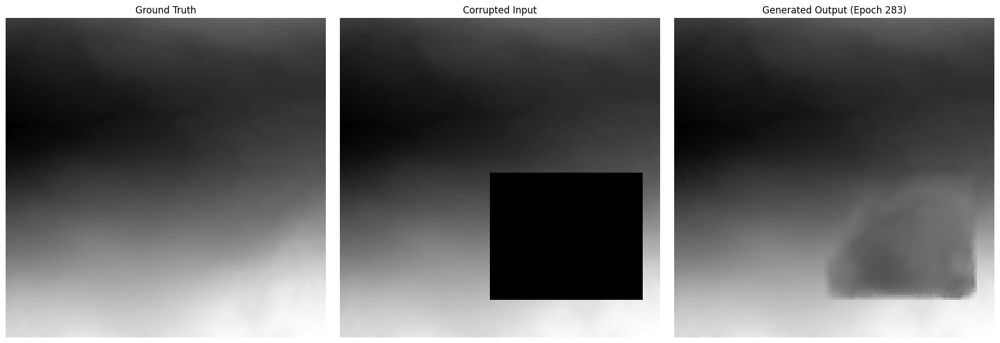

Epoch 284/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

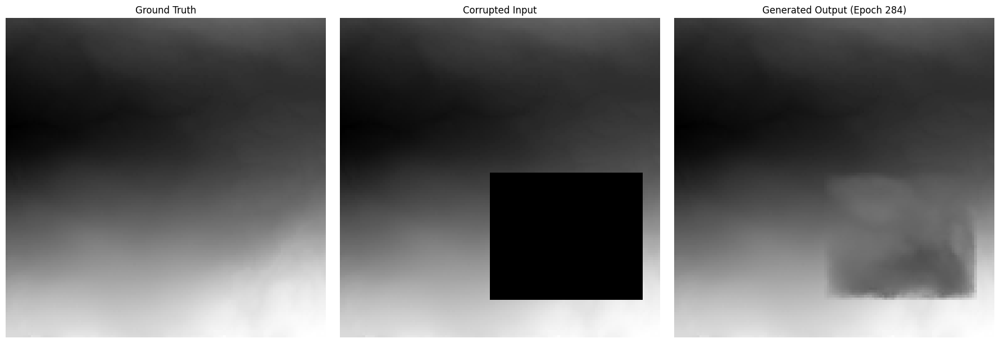

Epoch 285/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

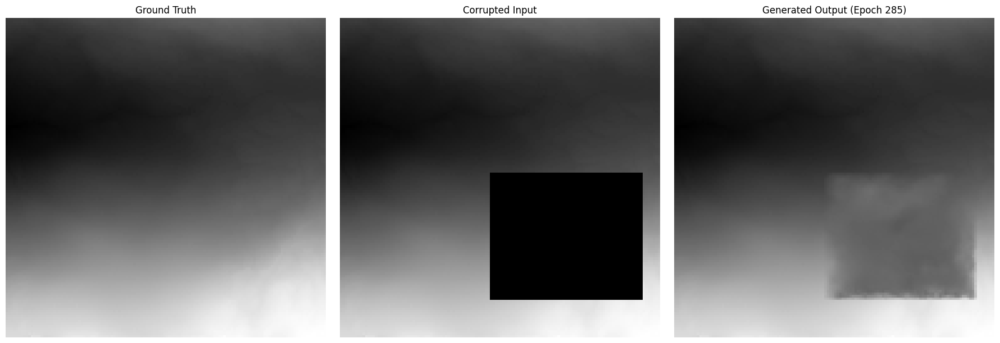

Epoch 286/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

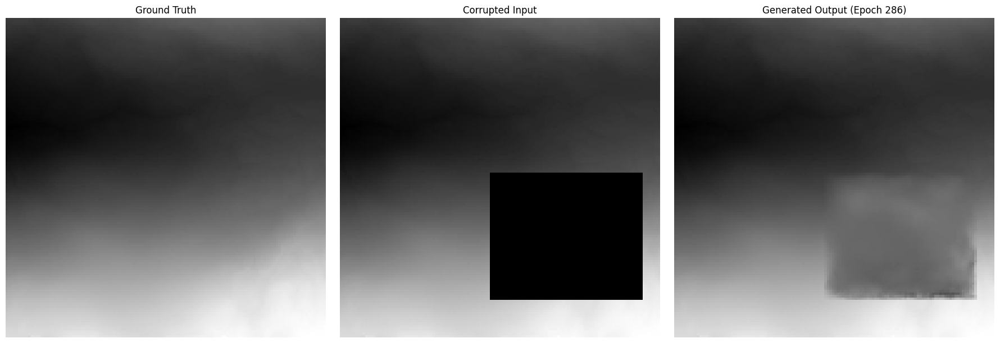

Epoch 287/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

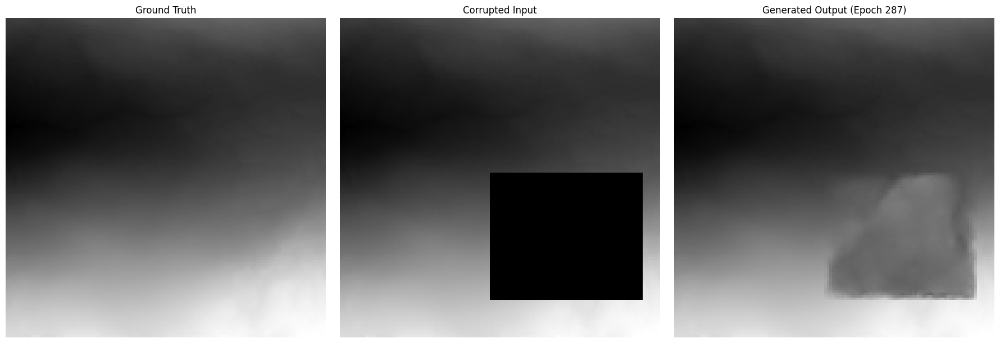

Epoch 288/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

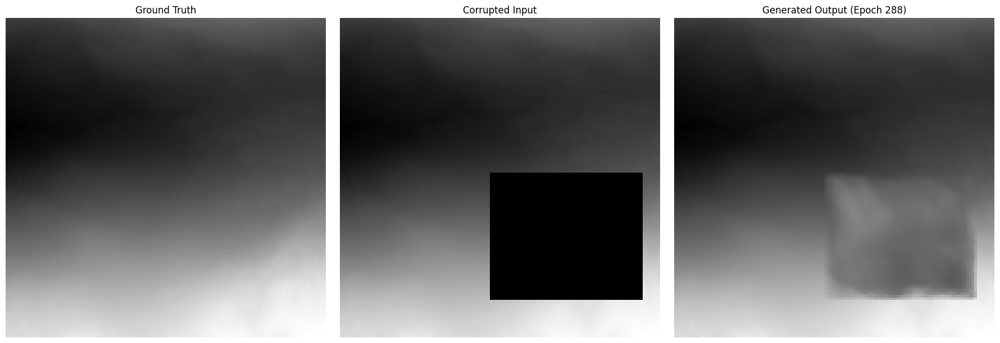

Epoch 289/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 289 with loss: 0.006359


Generating Visual: 0it [00:00, ?it/s]

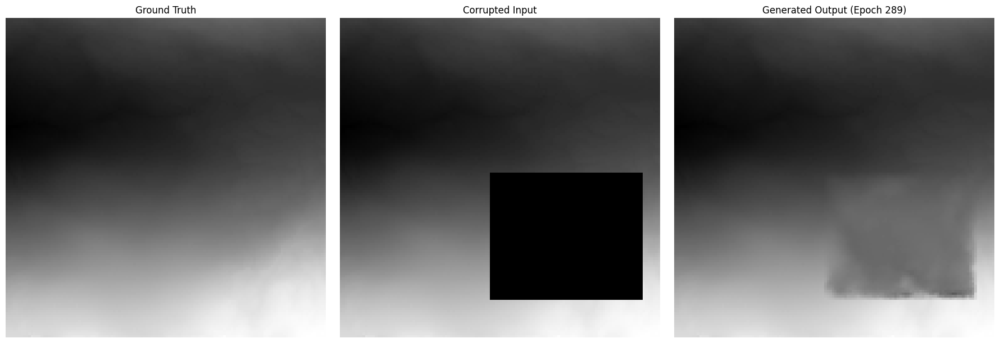

Epoch 290/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

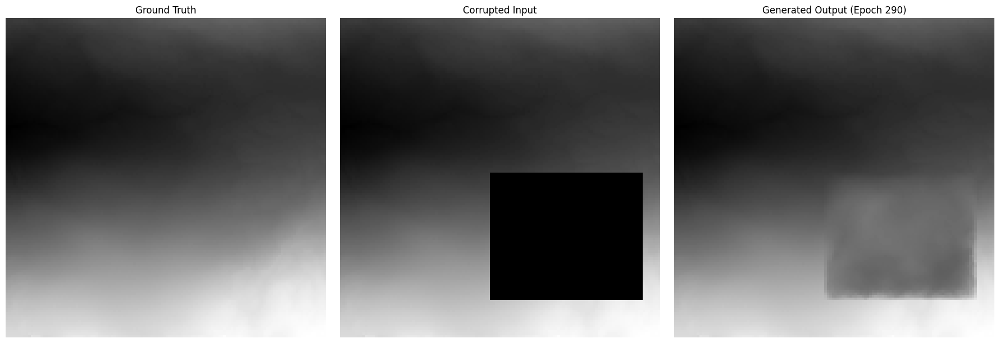

Epoch 291/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

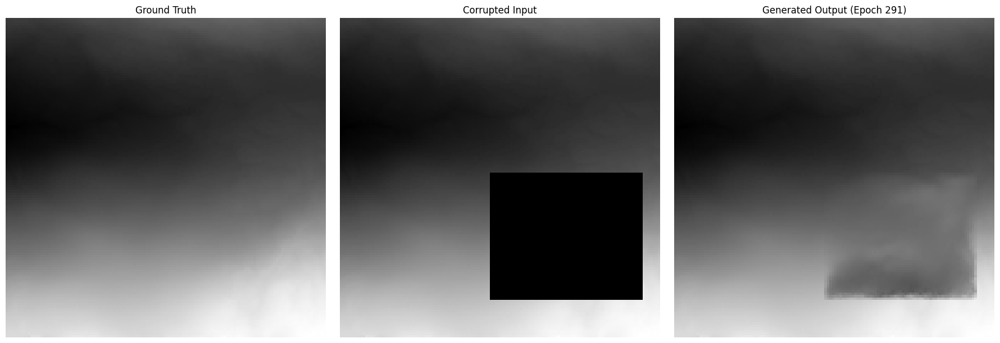

Epoch 292/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

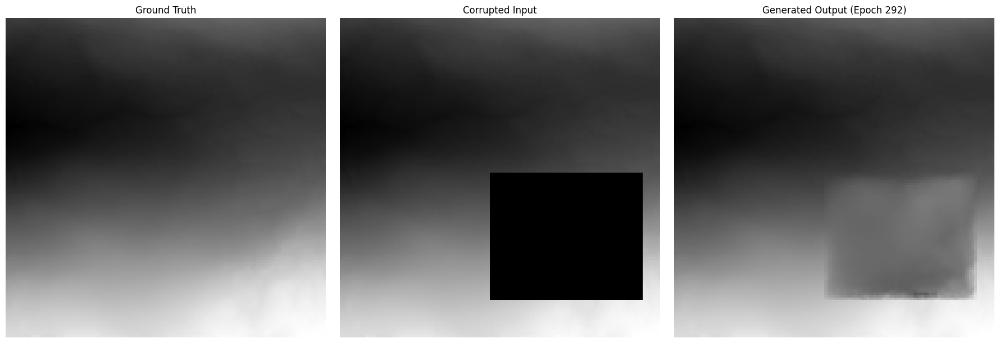

Epoch 293/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

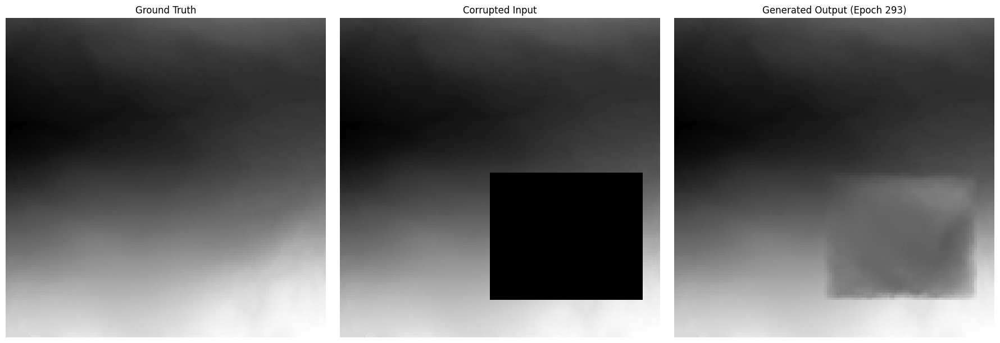

Epoch 294/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

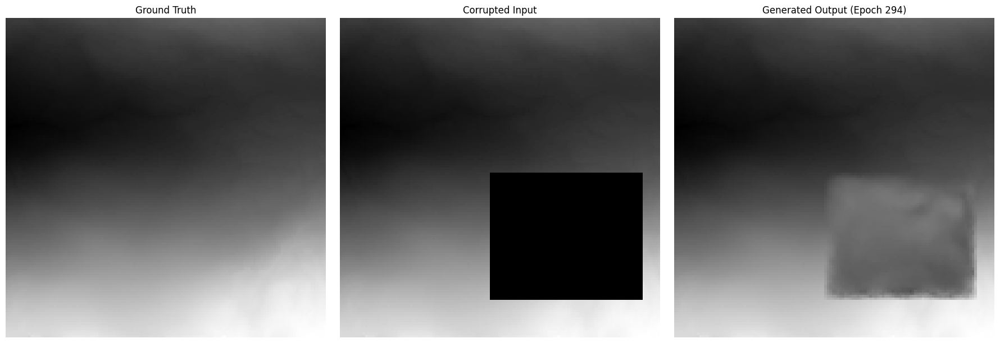

Epoch 295/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


🎉 New best model saved at Epoch 295 with loss: 0.005903


Generating Visual: 0it [00:00, ?it/s]

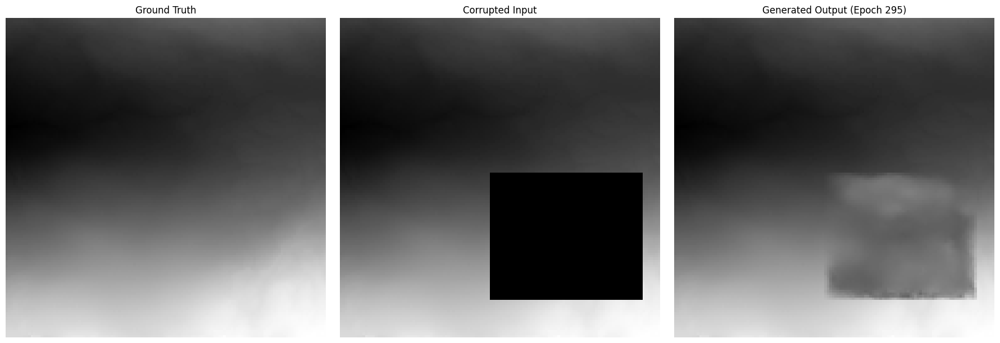

Epoch 296/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

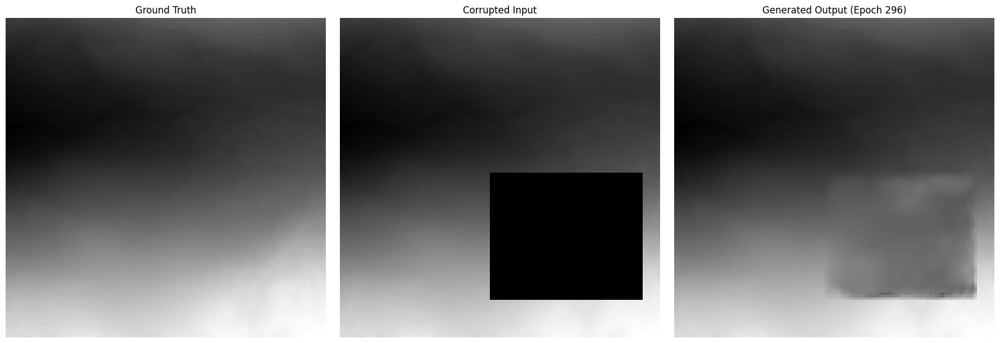

Epoch 297/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

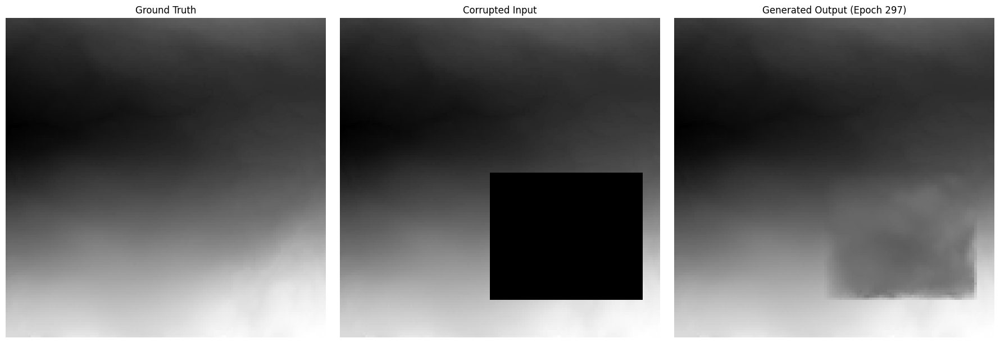

Epoch 298/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

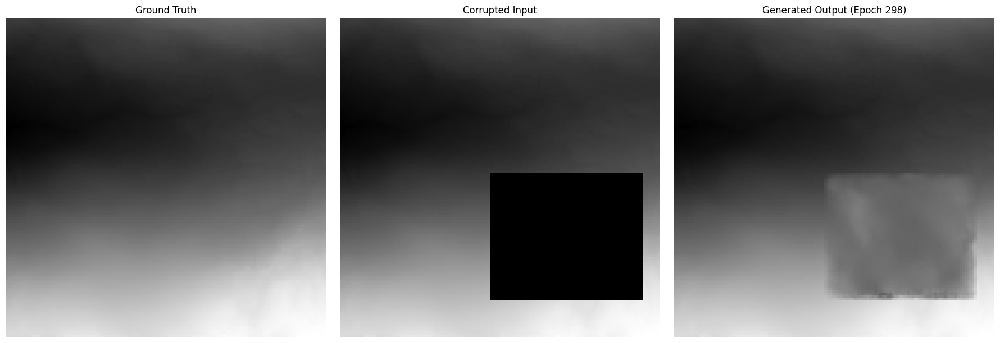

Epoch 299/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

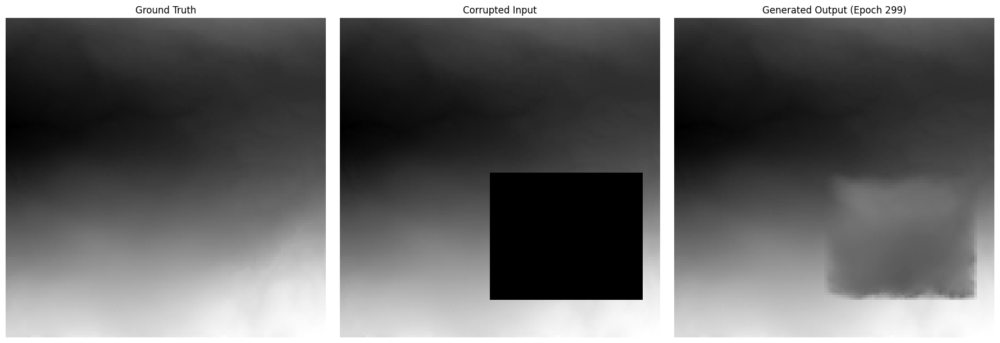

Epoch 300/300:   0%|          | 0/63 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/usr/local/lib/python3.11/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Generating Visual: 0it [00:00, ?it/s]

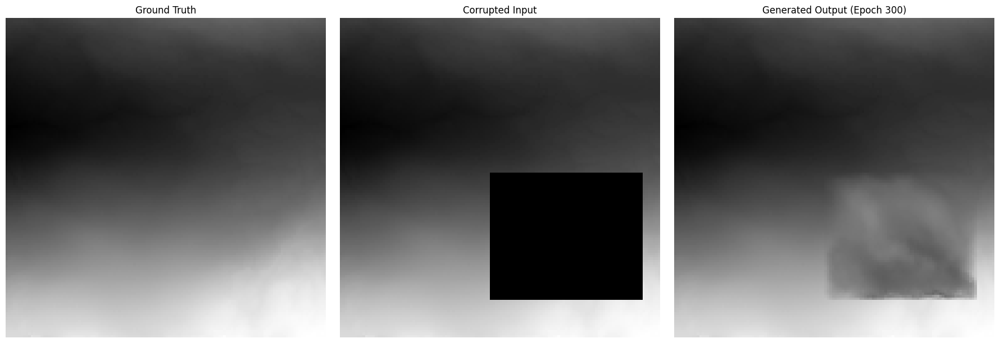

🚀 Training finished! Best model saved to /kaggle/working/best_model.pth


In [4]:
# ==============================================================================
# DIFF-DEM: HYBRID TRANSFORMER-CNN (SAVES BEST MODEL)
# ==============================================================================
# This script automatically calculates normalization stats and saves only the
# single best performing model based on the average training loss per epoch.
# ==============================================================================

### 0. INSTALL REQUIRED LIBRARY ###
!pip install rasterio

### 1. IMPORTS & UTILITIES ###
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW # Using AdamW as recommended
import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio
import json

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    if torch.cuda.is_available(): return torch.device("cuda")
    elif torch.backends.mps.is_available(): return torch.device("mps")
    else: return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__(); self.dim = dim
    def forward(self, time):
        device = time.device; half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        return torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels: mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()
    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None: h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###
class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)
    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1); time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###
def linear_beta_schedule(timesteps):
    return torch.linspace(0.0001, 0.02, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)
    def q_sample(self, x_start, t, noise=None):
        if noise is None: noise = torch.randn_like(x_start)
        sqrt_alphas_cumprod_t = self.sqrt_alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_one_minus_alphas_cumprod_t = self.sqrt_one_minus_alphas_cumprod[t].view(-1, 1, 1, 1)
        return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

### 4. DATASET & VISUALIZATION ###
def calculate_norm_stats(data_path, stats_path):
    data_path = Path(data_path)
    all_files = list(data_path.glob("*.tif"))
    if not all_files: return None, None
    print(f"Analyzing {len(all_files)} files to calculate normalization stats...")
    batch_size = 64; pixel_sum = 0.0; total_pixel_count = 0
    for i in tqdm(range(0, len(all_files), batch_size), desc="Calculating Mean"):
        batch_files = all_files[i:i+batch_size]
        images = np.array([rasterio.open(f).read(1) for f in batch_files], dtype=np.float64)
        pixel_sum += np.sum(images); total_pixel_count += np.prod(images.shape)
    mean = pixel_sum / total_pixel_count; pixel_sum_sq = 0.0
    for i in tqdm(range(0, len(all_files), batch_size), desc="Calculating Std Dev"):
        batch_files = all_files[i:i+batch_size]
        images = np.array([rasterio.open(f).read(1) for f in batch_files], dtype=np.float64)
        pixel_sum_sq += np.sum((images - mean) ** 2)
    std = np.sqrt(pixel_sum_sq / total_pixel_count)
    print(f"Calculated Mean: {mean:.4f}"); print(f"Calculated Std Dev: {std:.4f}")
    with open(stats_path, 'w') as f:
        json.dump({'mean': mean, 'std': std}, f)
    print(f"Normalization stats saved to {stats_path}")
    return mean, std

def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0; return mask

class DEMDataset(Dataset):
    def __init__(self, folder_path, img_size=128, norm_mean=0.0, norm_std=1.0):
        super().__init__()
        self.folder_path = Path(folder_path); self.img_size = img_size
        self.paths = list(self.folder_path.glob("*.tif"))
        self.norm_mean, self.norm_std = norm_mean, norm_std
    def __len__(self): return len(self.paths)
    def __getitem__(self, index):
        with rasterio.open(self.paths[index]) as src: dem_data = src.read(1).astype(np.float32)
        dem_tensor = torch.from_numpy(dem_data).unsqueeze(0)
        dem_tensor = F.interpolate(dem_tensor.unsqueeze(0), size=(self.img_size, self.img_size), mode='bilinear', align_corners=False).squeeze(0)
        # Augmentations
        if random.random() > 0.5: dem_tensor = torch.fliplr(dem_tensor)
        if random.random() > 0.5: dem_tensor = torch.flipud(dem_tensor)
        return (dem_tensor - self.norm_mean) / self.norm_std

@torch.no_grad()
def generate_visuals(model, diffusion, sample_data, epoch, config, norm_mean, norm_std):
    model.eval(); x0, y, m = sample_data; device = next(model.parameters()).device
    x0, y, m = x0.to(device), y.to(device), m.to(device)
    img = (torch.randn_like(x0) * m) + (x0 * (1 - m))
    for i in tqdm(reversed(range(0, config.VIS_TIMESTEPS)), desc="Generating Visual", leave=False):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        alpha_t = diffusion.alphas[t].view(-1, 1, 1, 1); alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        if i == 0: img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img); img = model_mean + torch.sqrt(posterior_variance_t) * noise
        img = (x0 * (1 - m)) + (img * m)
    mean, std = norm_mean, norm_std
    x0_denorm = x0 * std + mean; img_denorm = img * std + mean
    corrupted_display = x0_denorm.clone(); min_pixel_value = x0_denorm.min()
    corrupted_display[m.bool()] = min_pixel_value
    fig, axs = plt.subplots(1, 3, figsize=(18, 6)); cmap = 'gray'
    axs[0].imshow(x0_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[0].set_title("Ground Truth"); axs[0].axis('off')
    axs[1].imshow(corrupted_display.squeeze().cpu().numpy(), cmap=cmap); axs[1].set_title("Corrupted Input"); axs[1].axis('off')
    axs[2].imshow(img_denorm.squeeze().cpu().numpy(), cmap=cmap); axs[2].set_title(f"Generated Output (Epoch {epoch+1})"); axs[2].axis('off')
    plt.tight_layout(); plt.savefig(os.path.join(config.VISUAL_PATH, f"epoch_{epoch+1:03d}.png")); plt.show()
    model.train()

### 5. CONFIGURATION ###
class TrainingConfig:
    DATA_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160"
    OUTPUT_PATH = "/kaggle/working/"
    VISUAL_PATH = "/kaggle/working/visuals"
    STATS_PATH = "/kaggle/working/norm_stats.json"
    MODEL_SAVE_PATH = "/kaggle/working/best_model.pth" # <-- NEW: Single path for the best model
    EPOCHS = 300; BATCH_SIZE = 16; LEARNING_RATE = 1e-4
    IMG_SIZE = 128; TIMESTEPS = 1000
    MIN_VOID_RATIO = 0.25; MAX_VOID_RATIO = 0.60
    VIS_TIMESTEPS = 250
config = TrainingConfig()

### 6. TRAINING SCRIPT ###
def main_training():
    device = get_device(); print(f"Using device: {device}")
    os.makedirs(os.path.dirname(config.MODEL_SAVE_PATH), exist_ok=True); os.makedirs(config.VISUAL_PATH, exist_ok=True)
    norm_mean, norm_std = calculate_norm_stats(config.DATA_PATH, config.STATS_PATH)
    if norm_mean is None:
        print(f"Error: No .tif files found in {config.DATA_PATH}. Please check the path."); return
    print("-" * 30)
    dataset = DEMDataset(config.DATA_PATH, img_size=config.IMG_SIZE, norm_mean=norm_mean, norm_std=norm_std)
    dataloader = DataLoader(dataset, batch_size=config.BATCH_SIZE, shuffle=True, num_workers=os.cpu_count())
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    optimizer = AdamW(model.parameters(), lr=config.LEARNING_RATE)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=config.EPOCHS, eta_min=1e-6)
    diffusion = Diffusion(timesteps=config.TIMESTEPS, device=device)
    loss_fn = nn.MSELoss() # Use standard MSE for average loss per batch
    print(f"Found {len(dataset)} .tif files for training."); print(f"Model parameters: {sum(p.numel() for p in model.parameters())/1e6:.2f}M"); print("-" * 30)
    
    fixed_x0 = next(iter(dataloader)).to(device)[:1]
    fixed_mask = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    fixed_y = fixed_x0 * (1 - fixed_mask)
    visual_sample = (fixed_x0, fixed_y, fixed_mask)
    
    # <-- NEW: Variable to track the best loss
    best_loss = float('inf')

    for epoch in range(config.EPOCHS):
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{config.EPOCHS}")
        
        # <-- NEW: Variable to track the average loss for this epoch
        epoch_loss = 0.0
        
        for x_0 in progress_bar:
            x_0 = x_0.to(device); optimizer.zero_grad()
            batch_size = x_0.shape[0]; t = torch.randint(0, config.TIMESTEPS, (batch_size,), device=device).long()
            noise = torch.randn_like(x_0)
            masks = torch.stack([generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), config.MIN_VOID_RATIO, config.MAX_VOID_RATIO) for _ in range(batch_size)]).to(device).unsqueeze(1)
            y = x_0 * (1 - masks)
            noised_void_part = diffusion.q_sample(x_start=x_0, t=t, noise=noise)
            x_t = (noised_void_part * masks) + (x_0 * (1 - masks))
            predicted_noise = model(x_t, y, t)
            
            # Calculate loss only on the masked region
            loss = (loss_fn(predicted_noise * masks, noise * masks) * masks.numel()) / masks.sum()
            
            loss.backward(); optimizer.step()
            progress_bar.set_postfix(loss=loss.item())
            epoch_loss += loss.item()
        
        scheduler.step()
        
        # <-- NEW: Check if this epoch is the best and save the model
        avg_epoch_loss = epoch_loss / len(dataloader)
        if avg_epoch_loss < best_loss:
            best_loss = avg_epoch_loss
            torch.save(model.state_dict(), config.MODEL_SAVE_PATH)
            print(f"🎉 New best model saved at Epoch {epoch+1} with loss: {best_loss:.6f}")

        # Generate visuals every epoch to see progress
        generate_visuals(model, diffusion, visual_sample, epoch, config, norm_mean, norm_std)
        
    print(f"🚀 Training finished! Best model saved to {config.MODEL_SAVE_PATH}")

# --- Start Training ---
main_training()

Using device: cuda
Loaded normalization stats: Mean=107.6028, Std=71.9334
Model loaded successfully.


Inpainting Image:   0%|          | 0/500 [00:00<?, ?it/s]

Inpainting complete.
------------------------------
Image Quality Metrics:
  PSNR: 27.0303 dB
  SSIM: 0.9236
------------------------------


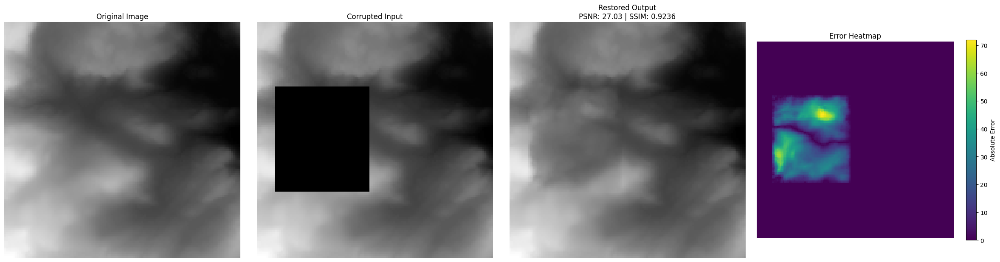

✅ Result saved to /kaggle/working/test_result.png


In [17]:
# ==============================================================================
# DIFF-DEM: FINAL INFERENCE SCRIPT
# ==============================================================================
# This script loads the best trained model and its corresponding normalization
# stats to perform inpainting on a single test image. It visualizes the
# result with a heatmap and calculates PSNR/SSIM scores.
# ==============================================================================


### 1. IMPORTS & UTILITIES ###
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import os
from pathlib import Path
import numpy as np
from tqdm.notebook import tqdm
import random
import matplotlib.pyplot as plt
import rasterio
import json
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

# Suppress verbose TF32 warnings on newer GPUs
torch.backends.cuda.matmul.allow_tf32 = True

def get_device():
    if torch.cuda.is_available(): return torch.device("cuda")
    elif torch.backends.mps.is_available(): return torch.device("mps")
    else: return torch.device("cpu")

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__(); self.dim = dim
    def forward(self, time):
        device = time.device; half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        return torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, time_emb_dim=None):
        super().__init__()
        if not mid_channels: mid_channels = out_channels
        self.time_mlp = nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, out_channels)) if time_emb_dim is not None else None
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, mid_channels), nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.GroupNorm(1, out_channels), nn.GELU()
        )
        self.res_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) if in_channels != out_channels else nn.Identity()
    def forward(self, x, t=None):
        h = self.double_conv(x)
        if self.time_mlp is not None and t is not None: h = h + self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        return h + self.res_conv(x)

### 2. MODEL ARCHITECTURE ###
class HybridTransformerUNet(nn.Module):
    def __init__(self, img_channels=2, time_emb_dim=32):
        super().__init__()
        self.time_mlp = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim), nn.Linear(time_emb_dim, time_emb_dim), nn.GELU())
        self.down1 = DoubleConv(img_channels, 64, time_emb_dim=time_emb_dim)
        self.down2 = DoubleConv(64, 128, time_emb_dim=time_emb_dim)
        self.down3 = DoubleConv(128, 256, time_emb_dim=time_emb_dim)
        self.down4 = DoubleConv(256, 512, time_emb_dim=time_emb_dim)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck_conv = DoubleConv(512, 1024, time_emb_dim=time_emb_dim)
        transformer_layer = nn.TransformerEncoderLayer(d_model=1024, nhead=4, dim_feedforward=2048, dropout=0.1, activation='gelu', batch_first=True)
        self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=4)
        self.pos_embedding = nn.Parameter(torch.randn(1, 8 * 8, 1024))
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up1 = DoubleConv(1024, 512, time_emb_dim=time_emb_dim)
        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up2 = DoubleConv(512, 256, time_emb_dim=time_emb_dim)
        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.up3 = DoubleConv(256, 128, time_emb_dim=time_emb_dim)
        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.up4 = DoubleConv(128, 64, time_emb_dim=time_emb_dim)
        self.outc = nn.Conv2d(64, 1, kernel_size=1)
    def forward(self, x, y, t):
        net_input = torch.cat((x, y), dim=1); time_emb = self.time_mlp(t)
        x1 = self.down1(net_input, time_emb); x2 = self.down2(self.pool(x1), time_emb); x3 = self.down3(self.pool(x2), time_emb); x4 = self.down4(self.pool(x3), time_emb)
        bottleneck = self.bottleneck_conv(self.pool(x4), time_emb)
        b, c, h, w = bottleneck.shape
        bottleneck_flat = bottleneck.flatten(2).permute(0, 2, 1) + self.pos_embedding
        transformer_out = self.transformer_encoder(bottleneck_flat).permute(0, 2, 1).view(b, c, h, w)
        up1 = self.up1(torch.cat([self.upconv1(transformer_out), x4], dim=1), time_emb)
        up2 = self.up2(torch.cat([self.upconv2(up1), x3], dim=1), time_emb)
        up3 = self.up3(torch.cat([self.upconv3(up2), x2], dim=1), time_emb)
        up4 = self.up4(torch.cat([self.upconv4(up3), x1], dim=1), time_emb)
        return self.outc(up4)

### 3. DIFFUSION PROCESS LOGIC ###
def linear_beta_schedule(timesteps):
    return torch.linspace(0.0001, 0.02, timesteps)

class Diffusion:
    def __init__(self, timesteps=1000, device='cuda'):
        self.timesteps = timesteps; self.device = device
        betas = linear_beta_schedule(timesteps).to(device)
        self.alphas = 1. - betas
        self.alphas_cumprod = torch.cumprod(self.alphas, axis=0)
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        self.posterior_variance = betas * (1. - F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)) / (1. - self.alphas_cumprod)

### 4. HELPER FUNCTIONS ###
def generate_void_mask(img_size, min_size_ratio, max_size_ratio):
    H, W = img_size; mask = torch.zeros((H, W), dtype=torch.float32)
    min_h, max_h = int(H * min_size_ratio), int(H * max_size_ratio)
    min_w, max_w = int(W * min_size_ratio), int(W * max_size_ratio)
    h, w = random.randint(min_h, max_h), random.randint(min_w, max_w)
    i, j = random.randint(0, H - h), random.randint(0, W - w)
    mask[i:i+h, j:j+w] = 1.0; return mask

### 5. CONFIGURATION ###
class InferenceConfig:
    # --- ✏️ EDIT THIS SECTION ✏️ ---
    MODEL_PATH = "/kaggle/working/best_model.pth"
    IMAGE_PATH = "/kaggle/input/diffdataset/DiffDemData (2)/DiffDemData/Diff/results/Diff-DEM/Diff-DEM/128-160/6500_1_10m_z33_7_2_split_1_0.tif"
    OUTPUT_PATH = "/kaggle/working/test_result.png"
    # Path to the stats file generated by the training script
    STATS_PATH = "/kaggle/working/norm_stats.json"
    # --- You shouldn't need to edit below this line ---
    IMG_SIZE = 128
    INFERENCE_TIMESTEPS = 500
config = InferenceConfig()

### 6. INFERENCE SCRIPT ###
@torch.no_grad()
def run_inference(config):
    device = get_device(); print(f"Using device: {device}")
    
    # Load normalization stats from file
    try:
        with open(config.STATS_PATH, 'r') as f: stats = json.load(f)
        norm_mean, norm_std = stats['mean'], stats['std']
        print(f"Loaded normalization stats: Mean={norm_mean:.4f}, Std={norm_std:.4f}")
    except FileNotFoundError:
        print(f"Error: Normalization file not found at {config.STATS_PATH}"); return
        
    # --- 1. Load Model ---
    model = HybridTransformerUNet(img_channels=2, time_emb_dim=32).to(device)
    try:
        model.load_state_dict(torch.load(config.MODEL_PATH, map_location=device))
    except FileNotFoundError:
        print(f"Error: Model file not found at {config.MODEL_PATH}"); return
    model.eval(); print("Model loaded successfully.")
    
    diffusion = Diffusion(timesteps=1000, device=device)

    # --- 2. Load and Preprocess Image ---
    try:
        with rasterio.open(config.IMAGE_PATH) as src: dem_data = src.read(1).astype(np.float32)
    except Exception as e:
        print(f"Error loading image at {config.IMAGE_PATH}: {e}"); return
    x0 = torch.from_numpy(dem_data).unsqueeze(0).unsqueeze(0)
    x0 = F.interpolate(x0, size=(config.IMG_SIZE, config.IMG_SIZE), mode='bilinear', align_corners=False)
    x0 = (x0 - norm_mean) / norm_std
    x0 = x0.to(device)

    # --- 3. Create Mask and Corrupted Input ---
    m = generate_void_mask((config.IMG_SIZE, config.IMG_SIZE), 0.4, 0.5).unsqueeze(0).unsqueeze(0).to(device)
    y = x0 * (1 - m)

    # --- 4. Run Reverse Diffusion Process ---
    img = (torch.randn_like(x0) * m) + (x0 * (1 - m))
    for i in tqdm(reversed(range(0, config.INFERENCE_TIMESTEPS)), desc="Inpainting Image", total=config.INFERENCE_TIMESTEPS):
        t = torch.full((1,), i, device=device, dtype=torch.long)
        predicted_noise = model(img, y, t)
        alpha_t = diffusion.alphas[t].view(-1, 1, 1, 1); alpha_t_cumprod = diffusion.alphas_cumprod[t].view(-1, 1, 1, 1)
        sqrt_recip_alpha_t = diffusion.sqrt_recip_alphas[t].view(-1, 1, 1, 1)
        model_mean = sqrt_recip_alpha_t * (img - predicted_noise * (1.0 - alpha_t) / torch.sqrt(1.0 - alpha_t_cumprod))
        if i == 0: img = model_mean
        else:
            posterior_variance_t = diffusion.posterior_variance[t].view(-1, 1, 1, 1)
            noise = torch.randn_like(img); img = model_mean + torch.sqrt(posterior_variance_t) * noise
        img = (x0 * (1 - m)) + (img * m)
    print("Inpainting complete.")

    # --- 5. Post-process, Calculate Metrics, and Save Visualization ---
    x0_denorm = x0 * norm_std + norm_mean
    img_denorm = img * norm_std + norm_mean
    
    original_np = x0_denorm.squeeze().cpu().numpy()
    restored_np = img_denorm.squeeze().cpu().numpy()
    
    data_range = original_np.max() - original_np.min()
    psnr_score = peak_signal_noise_ratio(original_np, restored_np, data_range=data_range)
    ssim_score = structural_similarity(original_np, restored_np, data_range=data_range)
    
    print("-" * 30)
    print(f"Image Quality Metrics:")
    print(f"  PSNR: {psnr_score:.4f} dB")
    print(f"  SSIM: {ssim_score:.4f}")
    print("-" * 30)

    corrupted_display = x0_denorm.clone(); min_pixel_value = x0_denorm.min()
    corrupted_display[m.bool()] = min_pixel_value
    absolute_error = torch.abs(x0_denorm - img_denorm)
    
    fig, axs = plt.subplots(1, 4, figsize=(24, 6))
    axs[0].imshow(original_np, cmap='gray'); axs[0].set_title("Original Image"); axs[0].axis('off')
    axs[1].imshow(corrupted_display.squeeze().cpu().numpy(), cmap='gray'); axs[1].set_title("Corrupted Input"); axs[1].axis('off')
    axs[2].imshow(restored_np, cmap='gray'); axs[2].set_title(f"Restored Output\nPSNR: {psnr_score:.2f} | SSIM: {ssim_score:.4f}"); axs[2].axis('off')
    im = axs[3].imshow(absolute_error.squeeze().cpu().numpy(), cmap='viridis')
    axs[3].set_title("Error Heatmap"); axs[3].axis('off')
    fig.colorbar(im, ax=axs[3], shrink=0.85, label='Absolute Error',cmap="viridis")
    
    plt.tight_layout(); plt.savefig(config.OUTPUT_PATH); plt.show()
    print(f"✅ Result saved to {config.OUTPUT_PATH}")

# --- Start Inference ---
run_inference(config)

In [2]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 63.7 MB/s eta 0:00:00:00:0100:01
